In [1]:
import torch
from torch import nn
import torch.utils.data as Data
import torch.optim as optim
import numpy as np
from os.path import join as PJ
import matplotlib.pyplot as plt

In [2]:
from torch.utils.data import Dataset
from torchvision import transforms
from PIL import Image,ImageOps

In [3]:
import tensorflow as tf

In [5]:
def LoadFiles(mode="train"):
    if mode == "train":
        with open(TrainFile, 'r') as trainf:
            image_info = trainf.readlines()
            image_info = [path.strip().split() for path in image_info]
            image_info = np.asarray(image_info)

            # Split to image path and label
            image_paths = image_info[:, 0]
            label_ids = image_info[:, 1].astype(int)

#             labels = tf.one_hot(label_ids, num_class, dtype=tf.int32)
            print("in Load : ", label_ids.shape)
            return image_paths, label_ids
    else:
        with open(TestFile, 'r') as testf:
            image_info = testf.readlines()
            image_info = [path.strip().split() for path in image_info]
            image_info = np.asarray(image_info)

            # Split to image path and label
            image_paths = image_info[:, 0]
            label_ids = image_info[:, 1].astype(int)
#             labels = tf.one_hot(label_ids, num_class, dtype=tf.int32)
            return image_paths, label_ids

In [6]:
import cv2
class TermiteDataset(Dataset):
    def __init__(self, data_file, transform):
        with open(data_file, 'r') as f:
            image_info = f.readlines()
        image_info = [path.strip().split() for path in image_info]
        image_info = np.asarray(image_info)

        # Split to image path and label
        self.image_paths = image_info[:, 0]
        self.label_ids = image_info[:, 1].astype(int)
        self.transform = transform
        
    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):
#         print(idx, self.label_ids.shape, self.label_ids[idx])
        label = self.label_ids[idx]
        image_path = self.image_paths[idx]
        original_image = Image.open(image_path).convert('RGB')
        
#         print(original_image.size)
        
        if original_image.size[0] > 1000:
            original_image = original_image.resize((1000, original_image.size[1]*1000//original_image.size[0]))
        elif original_image.size[1] > 1000:
            original_image = original_image.resize((original_image.size[0]*1000//original_image.size[1], 1000))
#         print(original_image.shape)
        left = 500-original_image.size[0]//2
        right = 500-original_image.size[0]//2
        top = 500-original_image.size[1]//2
        bottom = 500-original_image.size[1]//2
        
        if left + right + original_image.size[0] != 1000:
            right = 1000 - left - original_image.size[0]
        if top + bottom + original_image.size[1] != 1000:
            top = 1000 - bottom - original_image.size[1]
        
#         original_image= cv2.copyMakeBorder(original_image,left,right,top,bottom,cv2.BORDER_CONSTANT,value=(0, 0, 0))
        original_image = ImageOps.expand(original_image, border=(left,top,right,bottom), fill=0)##left,top,right,bottom
        original_image = original_image.resize((130,130))
        transform1 = transforms.Compose([transforms.ToTensor()])
        original_image = transform1(original_image)
#         print(original_image.shape)
        
        
#         original_image = self.transform(original_image)
#         original_image.permute(2,0,1)
#         print(original_image.shape, answer.shape)
        return label, original_image, self.image_paths[idx]

def transform_set(train, new_size=None, pad=None):
    """
    train: True or False
    new_size: int or tuple
    
    """
#     transform_list = [transforms.ToTensor(),
#                       transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])]
    transform_list = [transforms.ToTensor()]
    # replace centercrop to padding
#     transform_list = [transforms.CenterCrop((crop_h, crop_w))] + transform_list if crop else transform_list
#     transform_list = [transforms.Resize(new_size)] + transform_list if new_size is not None else transform_list

#     transform_list = [transforms.RandomHorizontalFlip()] + transform_list if train else transform_list
    transform = transforms.Compose(transform_list)
    return transform

In [7]:
def CheckFile(filename):
    with open(filename, 'r') as f:
            image_info = f.readlines()
    image_info = [path.strip().split() for path in image_info]
    image_info = np.asarray(image_info)
    counts = {"台灣土白蟻兵蟻" : 0,
             "台灣土白蟻工蟻" : 0,
             "台灣家白蟻兵蟻" : 0,
             "台灣家白蟻工蟻" : 0,
             "截頭堆沙兵蟻" : 0,
             "截頭堆沙工蟻" : 0,
             "黃肢散工蟻" : 0,
             "黃肢散兵蟻" : 0,
             "背景": 0}
        
    Locations = {"L1" : 0,
             "L2" : 0,
             "L3" : 0}
    for line in image_info:
        path = line[0]
        if "L1" in path:
            Locations["L1"] += 1
        if "L2" in path:
            Locations["L2"] += 1
        if "L3" in path:
            Locations["L3"] += 1
        if "台灣土白蟻兵蟻" in path:
            counts["台灣土白蟻兵蟻"] += 1
        if "台灣土白蟻工蟻" in path:
            counts["台灣土白蟻工蟻"] += 1
        if "台灣家白蟻兵蟻" in path:
            counts["台灣家白蟻兵蟻"] += 1
        if "台灣家白蟻工蟻" in path:
            counts["台灣家白蟻工蟻"] += 1
        if "截頭堆沙兵蟻" in path:
            counts["截頭堆沙兵蟻"] += 1
        if "截頭堆沙工蟻" in path:
            counts["截頭堆沙工蟻"] += 1
        if "黃肢散兵蟻" in path:
            counts["黃肢散兵蟻"] += 1
        if "黃肢散工蟻" in path:
            counts["黃肢散工蟻"] += 1
        if "背景" in path:
            counts["背景"] += 1
    print(Locations, counts)

In [9]:
BATCH_SIZE = 64
EPOCH = 100
LearningRate = 0.0001
Momentum = 0.9
TrainFile = "/home/ytliu/Termite-Bonnie/PAPER_termite/BENCHMARK-LARGE_Ind_trainfile_2.txt"
ValFile = "/home/ytliu/Termite-Bonnie/PAPER_termite/BENCHMARK-LARGE_Ind_valfile_2.txt"
TestFile = "/home/ytliu/Termite-Bonnie/PAPER_termite/BENCHMARK-LARGE_Ind_testfile_2.txt"
# classes = ["O. formosanus Army","O. formosanus Worker", "C. formosanus Army","C. formosanus Worker", "C. domesticus Army","C. domesticus Worker", "R. flaviceps Worker", "R. flaviceps Army"]
classes = ["O.f Soldier","O.f Worker", "C.f Soldier","C.f Worker", "C.d Soldier","C.d Worker", "R.f Soldier", "R.f Worker"]
model_directory = "/home/ytliu/Termite-Bonnie/PAPER_termite/*BENCH_test_time/"
temp_directory = "/home/ytliu/Termite-Bonnie/PAPER_termite/*BENCH_test_time/"

In [1]:
print("TrainFile : ", TrainFile)
print("ValidationFile : ", ValFile)
print("TestFile : ", TestFile)
CheckFile(TrainFile)
CheckFile(ValFile)
CheckFile(TestFile)

NameError: name 'TrainFile' is not defined

In [11]:
import torchvision.models as models
import os
# from MobileNetV2 import MobileNetV2
print(torch.__version__)
# torch.cuda.set_device(1)
print(torch.cuda.current_device())
# mobilenet =  MobileNetV2(n_class=len(classes)).cuda()
mobilenet =  nn.Sequential(models.mobilenet_v2(pretrained=True), nn.Linear(1000, len(classes))).cuda()

1.3.0
0


In [12]:
model = mobilenet
# model = MobileNet(len(classes))
# model.to(cuda)
# model = model.cuda()
model = model
criterion = nn.CrossEntropyLoss()
optimizer = optim.SGD(model.parameters(), lr=LearningRate, momentum=Momentum)

In [13]:
transform = transform_set(train=True)
trainset = TermiteDataset(TrainFile, transform)
trainloader = Data.DataLoader(
    dataset=trainset,      # torch TensorDataset format
    batch_size=BATCH_SIZE,      # mini batch size
    shuffle=True,               # 要不要打乱数据 (打乱比较好)
    num_workers=0,              # 多线程来读数据
)

In [14]:
transform2 = transform_set(train=False)
valset = TermiteDataset(ValFile, transform2)
valloader = Data.DataLoader(
    dataset=valset,      # torch TensorDataset format
    batch_size=BATCH_SIZE,      # mini batch size
    shuffle=True,               # 要不要打乱数据 (打乱比较好)
    num_workers=0,              # 多线程来读数据
)

In [15]:
# for labels, images in loader:
#     print(labels.shape)
#     print(images.shape)
#     ssssss

# TRAIN
### 
### validation

Train
[1, 00020] loss: 44.421 acc: 0.263
[1, 00040] loss: 65.229 acc: 0.444
[1, 00060] loss: 78.562 acc: 0.557
[1, 00080] loss: 89.211 acc: 0.625
[1, 00100] loss: 97.531 acc: 0.673
[1, 00120] loss: 104.552 acc: 0.708
[1, 00140] loss: 110.480 acc: 0.735
[1, 00160] loss: 115.420 acc: 0.758
[1, 00180] loss: 120.312 acc: 0.777
[1, 00200] loss: 124.073 acc: 0.794
[0.793515625]
[124.07311299443245]


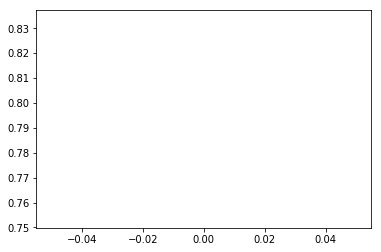

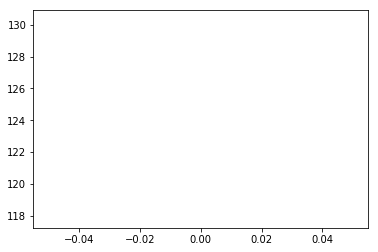

Validation
[0.9321875]
[10.706002213060856]


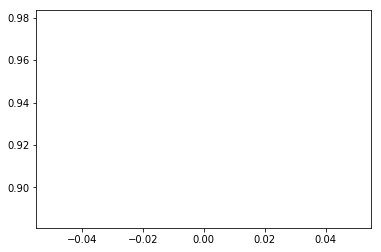

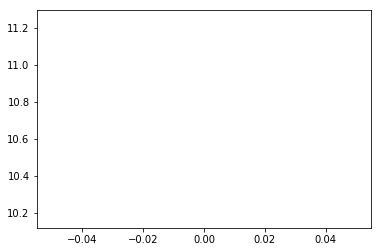


[1] accuracy: 0.932 loss: 10.706

runtime :  143.22860455513
Train
[2, 00020] loss: 3.346 acc: 0.951
[2, 00040] loss: 6.326 acc: 0.954
[2, 00060] loss: 9.666 acc: 0.950
[2, 00080] loss: 12.743 acc: 0.951
[2, 00100] loss: 15.415 acc: 0.953
[2, 00120] loss: 17.951 acc: 0.954
[2, 00140] loss: 20.394 acc: 0.956
[2, 00160] loss: 22.874 acc: 0.957
[2, 00180] loss: 25.307 acc: 0.958
[2, 00200] loss: 27.772 acc: 0.958
[0.793515625, 0.957890625]
[124.07311299443245, 27.772274132817984]


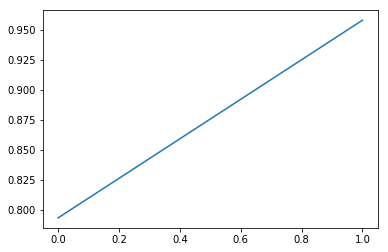

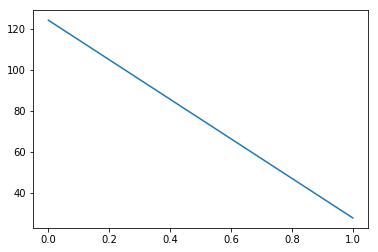

Validation
[0.9321875, 0.9615625]
[10.706002213060856, 6.268553048372269]


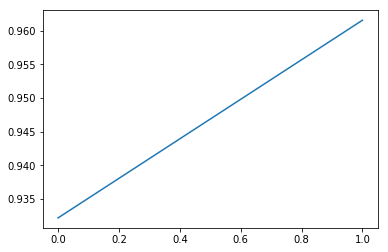

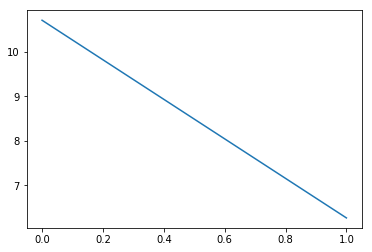


[2] accuracy: 0.962 loss: 6.269

runtime :  274.30138969421387
Train
[3, 00020] loss: 1.709 acc: 0.979
[3, 00040] loss: 3.504 acc: 0.978
[3, 00060] loss: 5.335 acc: 0.978
[3, 00080] loss: 6.857 acc: 0.978
[3, 00100] loss: 8.542 acc: 0.978
[3, 00120] loss: 9.930 acc: 0.979
[3, 00140] loss: 11.372 acc: 0.979
[3, 00160] loss: 12.719 acc: 0.979
[3, 00180] loss: 14.441 acc: 0.978
[3, 00200] loss: 15.707 acc: 0.978
[0.793515625, 0.957890625, 0.978203125]
[124.07311299443245, 27.772274132817984, 15.706978969275951]


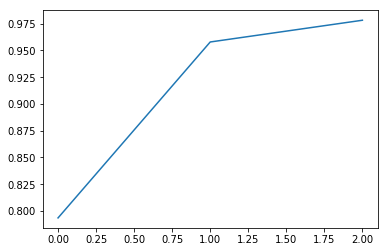

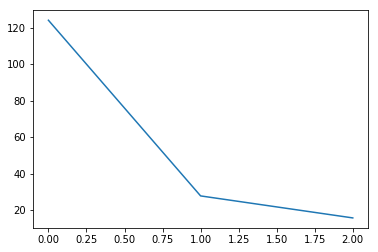

Validation
[0.9321875, 0.9615625, 0.9721875]
[10.706002213060856, 6.268553048372269, 4.680172849446535]


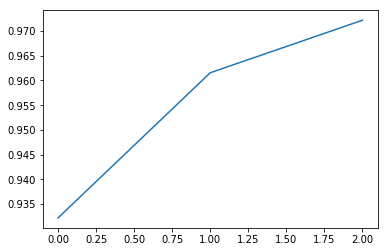

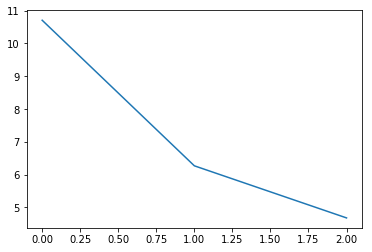


[3] accuracy: 0.972 loss: 4.680

runtime :  405.47530031204224
Train
[4, 00020] loss: 1.088 acc: 0.989
[4, 00040] loss: 2.222 acc: 0.988
[4, 00060] loss: 3.463 acc: 0.986
[4, 00080] loss: 4.572 acc: 0.986
[4, 00100] loss: 5.502 acc: 0.986
[4, 00120] loss: 6.498 acc: 0.986
[4, 00140] loss: 7.594 acc: 0.986
[4, 00160] loss: 8.420 acc: 0.986
[4, 00180] loss: 9.385 acc: 0.987
[4, 00200] loss: 10.309 acc: 0.987
[0.793515625, 0.957890625, 0.978203125, 0.987109375]
[124.07311299443245, 27.772274132817984, 15.706978969275951, 10.309275289997458]


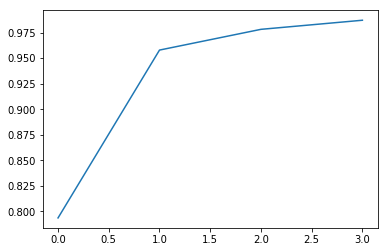

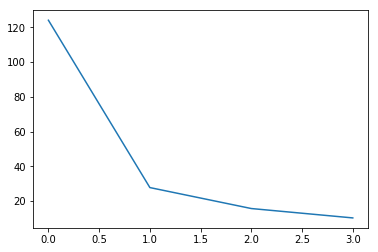

Validation
[0.9321875, 0.9615625, 0.9721875, 0.97375]
[10.706002213060856, 6.268553048372269, 4.680172849446535, 4.153117623180151]


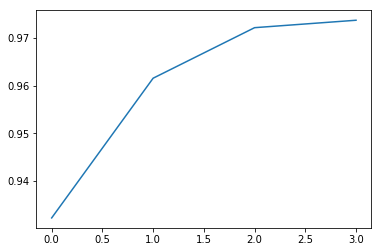

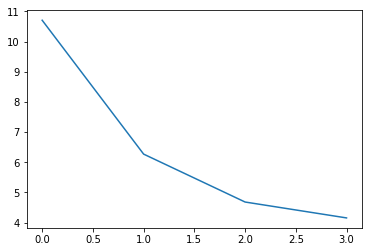


[4] accuracy: 0.974 loss: 4.153

runtime :  536.1735858917236
Train
[5, 00020] loss: 0.861 acc: 0.990
[5, 00040] loss: 1.671 acc: 0.991
[5, 00060] loss: 2.320 acc: 0.992
[5, 00080] loss: 3.002 acc: 0.992
[5, 00100] loss: 3.808 acc: 0.991
[5, 00120] loss: 4.489 acc: 0.992
[5, 00140] loss: 5.059 acc: 0.992
[5, 00160] loss: 5.807 acc: 0.992
[5, 00180] loss: 6.636 acc: 0.991
[5, 00200] loss: 7.445 acc: 0.991
[0.793515625, 0.957890625, 0.978203125, 0.987109375, 0.991171875]
[124.07311299443245, 27.772274132817984, 15.706978969275951, 10.309275289997458, 7.445104315876961]


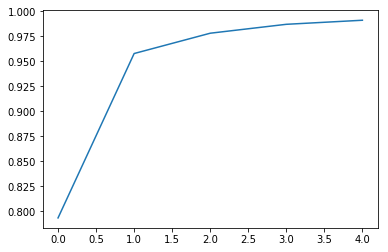

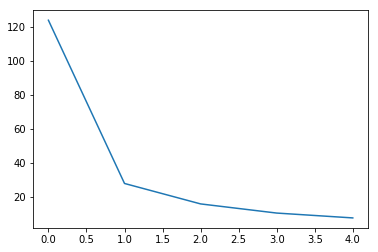

Validation
[0.9321875, 0.9615625, 0.9721875, 0.97375, 0.978125]
[10.706002213060856, 6.268553048372269, 4.680172849446535, 4.153117623180151, 3.4365686662495136]


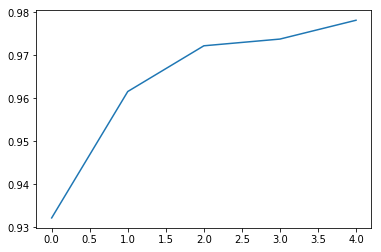

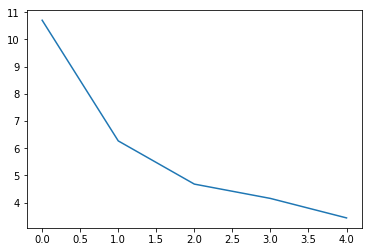


[5] accuracy: 0.978 loss: 3.437

runtime :  666.4487309455872
Train
[6, 00020] loss: 0.520 acc: 0.995
[6, 00040] loss: 1.157 acc: 0.994
[6, 00060] loss: 1.623 acc: 0.995
[6, 00080] loss: 2.181 acc: 0.995
[6, 00100] loss: 2.825 acc: 0.994
[6, 00120] loss: 3.294 acc: 0.995
[6, 00140] loss: 3.791 acc: 0.995
[6, 00160] loss: 4.310 acc: 0.995
[6, 00180] loss: 5.045 acc: 0.995
[6, 00200] loss: 5.599 acc: 0.995
[0.793515625, 0.957890625, 0.978203125, 0.987109375, 0.991171875, 0.994609375]
[124.07311299443245, 27.772274132817984, 15.706978969275951, 10.309275289997458, 7.445104315876961, 5.599461819976568]


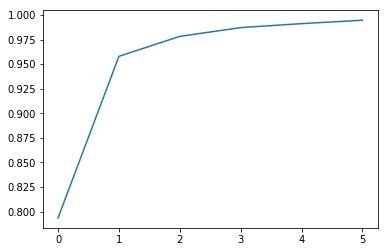

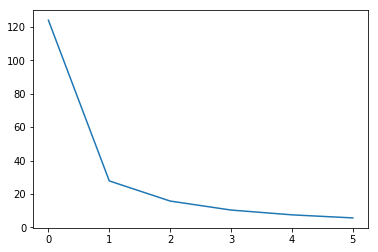

Validation
[0.9321875, 0.9615625, 0.9721875, 0.97375, 0.978125, 0.9771875]
[10.706002213060856, 6.268553048372269, 4.680172849446535, 4.153117623180151, 3.4365686662495136, 3.5318384394049644]


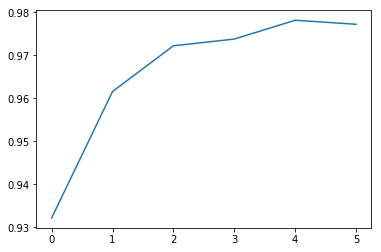

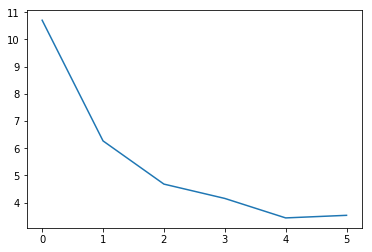


[6] accuracy: 0.977 loss: 3.532

runtime :  797.3613550662994
Train
[7, 00020] loss: 0.593 acc: 0.992
[7, 00040] loss: 1.088 acc: 0.995
[7, 00060] loss: 1.447 acc: 0.995
[7, 00080] loss: 1.834 acc: 0.996
[7, 00100] loss: 2.275 acc: 0.996
[7, 00120] loss: 2.690 acc: 0.995
[7, 00140] loss: 3.127 acc: 0.996
[7, 00160] loss: 3.523 acc: 0.996
[7, 00180] loss: 3.959 acc: 0.996
[7, 00200] loss: 4.377 acc: 0.996
[0.793515625, 0.957890625, 0.978203125, 0.987109375, 0.991171875, 0.994609375, 0.995703125]
[124.07311299443245, 27.772274132817984, 15.706978969275951, 10.309275289997458, 7.445104315876961, 5.599461819976568, 4.377407878637314]


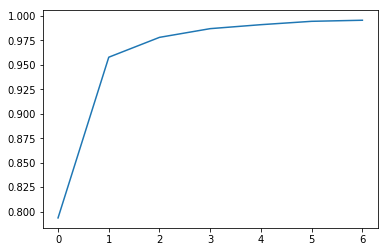

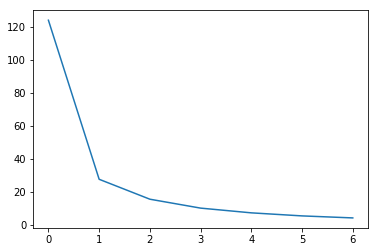

Validation
[0.9321875, 0.9615625, 0.9721875, 0.97375, 0.978125, 0.9771875, 0.9771875]
[10.706002213060856, 6.268553048372269, 4.680172849446535, 4.153117623180151, 3.4365686662495136, 3.5318384394049644, 3.322460323572159]


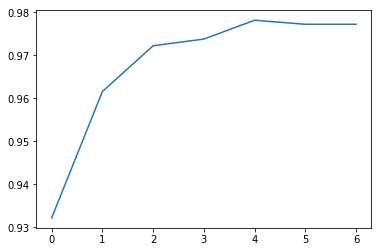

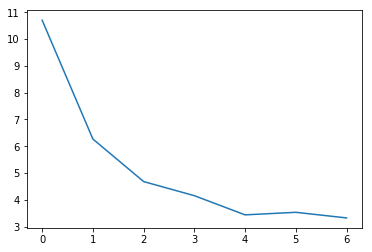


[7] accuracy: 0.977 loss: 3.322

runtime :  927.2840795516968
Train
[8, 00020] loss: 0.345 acc: 0.997
[8, 00040] loss: 0.664 acc: 0.996
[8, 00060] loss: 0.955 acc: 0.998
[8, 00080] loss: 1.311 acc: 0.997
[8, 00100] loss: 1.656 acc: 0.997
[8, 00120] loss: 1.958 acc: 0.997
[8, 00140] loss: 2.276 acc: 0.997
[8, 00160] loss: 2.676 acc: 0.997
[8, 00180] loss: 2.947 acc: 0.997
[8, 00200] loss: 3.297 acc: 0.997
[0.793515625, 0.957890625, 0.978203125, 0.987109375, 0.991171875, 0.994609375, 0.995703125, 0.997265625]
[124.07311299443245, 27.772274132817984, 15.706978969275951, 10.309275289997458, 7.445104315876961, 5.599461819976568, 4.377407878637314, 3.2968851029872894]


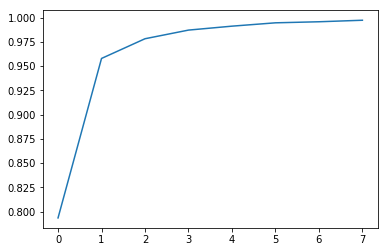

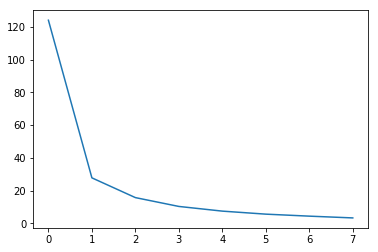

Validation
[0.9321875, 0.9615625, 0.9721875, 0.97375, 0.978125, 0.9771875, 0.9771875, 0.9803125]
[10.706002213060856, 6.268553048372269, 4.680172849446535, 4.153117623180151, 3.4365686662495136, 3.5318384394049644, 3.322460323572159, 3.056099370121956]


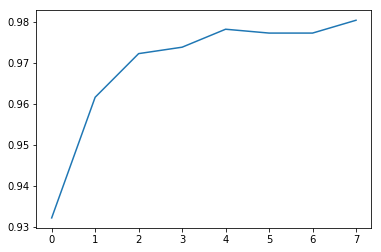

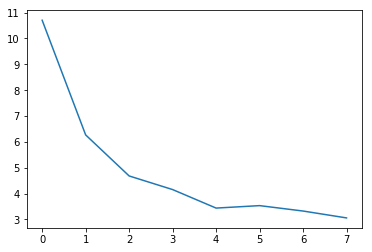


[8] accuracy: 0.980 loss: 3.056

runtime :  1057.6497650146484
Train
[9, 00020] loss: 0.312 acc: 0.997
[9, 00040] loss: 0.563 acc: 0.997
[9, 00060] loss: 0.810 acc: 0.998
[9, 00080] loss: 1.141 acc: 0.997
[9, 00100] loss: 1.483 acc: 0.997
[9, 00120] loss: 1.799 acc: 0.997
[9, 00140] loss: 2.066 acc: 0.997
[9, 00160] loss: 2.359 acc: 0.997
[9, 00180] loss: 2.594 acc: 0.997
[9, 00200] loss: 2.799 acc: 0.997
[0.793515625, 0.957890625, 0.978203125, 0.987109375, 0.991171875, 0.994609375, 0.995703125, 0.997265625, 0.9971875]
[124.07311299443245, 27.772274132817984, 15.706978969275951, 10.309275289997458, 7.445104315876961, 5.599461819976568, 4.377407878637314, 3.2968851029872894, 2.798622328788042]


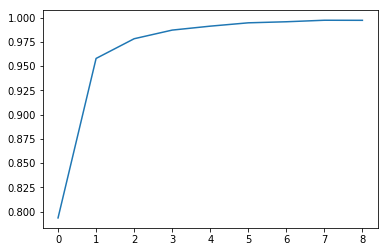

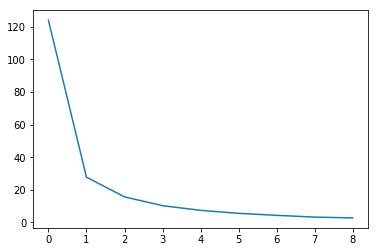

Validation
[0.9321875, 0.9615625, 0.9721875, 0.97375, 0.978125, 0.9771875, 0.9771875, 0.9803125, 0.9815625]
[10.706002213060856, 6.268553048372269, 4.680172849446535, 4.153117623180151, 3.4365686662495136, 3.5318384394049644, 3.322460323572159, 3.056099370121956, 2.7600675709545612]


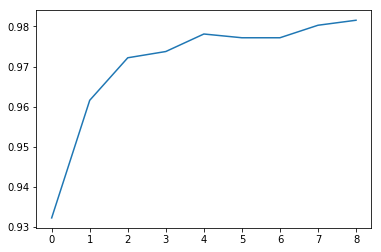

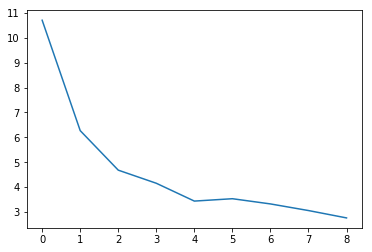


[9] accuracy: 0.982 loss: 2.760

runtime :  1188.7088706493378
Train
[10, 00020] loss: 0.197 acc: 0.999
[10, 00040] loss: 0.470 acc: 0.998
[10, 00060] loss: 0.743 acc: 0.998
[10, 00080] loss: 0.965 acc: 0.998
[10, 00100] loss: 1.173 acc: 0.998
[10, 00120] loss: 1.466 acc: 0.998
[10, 00140] loss: 1.752 acc: 0.998
[10, 00160] loss: 2.027 acc: 0.998
[10, 00180] loss: 2.279 acc: 0.998
[10, 00200] loss: 2.541 acc: 0.998
[0.793515625, 0.957890625, 0.978203125, 0.987109375, 0.991171875, 0.994609375, 0.995703125, 0.997265625, 0.9971875, 0.998203125]
[124.07311299443245, 27.772274132817984, 15.706978969275951, 10.309275289997458, 7.445104315876961, 5.599461819976568, 4.377407878637314, 3.2968851029872894, 2.798622328788042, 2.540911927819252]


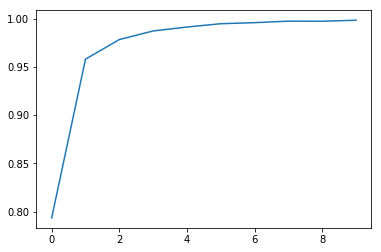

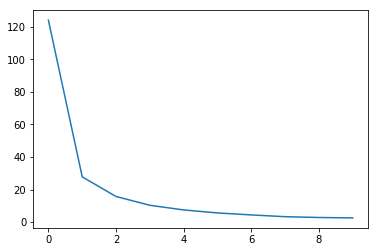

Validation
[0.9321875, 0.9615625, 0.9721875, 0.97375, 0.978125, 0.9771875, 0.9771875, 0.9803125, 0.9815625, 0.98375]
[10.706002213060856, 6.268553048372269, 4.680172849446535, 4.153117623180151, 3.4365686662495136, 3.5318384394049644, 3.322460323572159, 3.056099370121956, 2.7600675709545612, 2.574156306684017]


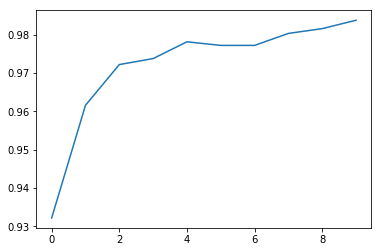

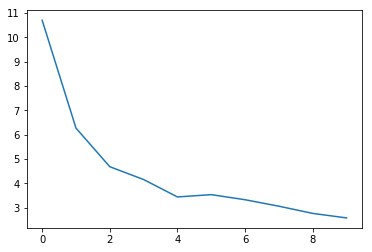


[10] accuracy: 0.984 loss: 2.574

runtime :  1319.3842177391052
Train
[11, 00020] loss: 0.194 acc: 0.998
[11, 00040] loss: 0.491 acc: 0.998
[11, 00060] loss: 0.722 acc: 0.998
[11, 00080] loss: 0.936 acc: 0.998
[11, 00100] loss: 1.127 acc: 0.998
[11, 00120] loss: 1.361 acc: 0.998
[11, 00140] loss: 1.566 acc: 0.998
[11, 00160] loss: 1.759 acc: 0.998
[11, 00180] loss: 1.948 acc: 0.998
[11, 00200] loss: 2.190 acc: 0.998
[0.793515625, 0.957890625, 0.978203125, 0.987109375, 0.991171875, 0.994609375, 0.995703125, 0.997265625, 0.9971875, 0.998203125, 0.998203125]
[124.07311299443245, 27.772274132817984, 15.706978969275951, 10.309275289997458, 7.445104315876961, 5.599461819976568, 4.377407878637314, 3.2968851029872894, 2.798622328788042, 2.540911927819252, 2.190225299447775]


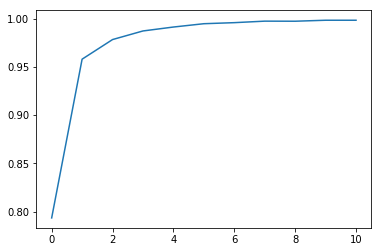

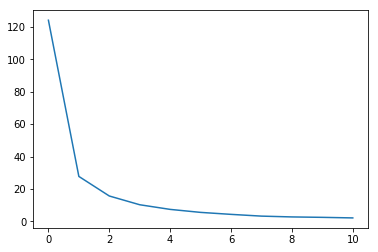

Validation
[0.9321875, 0.9615625, 0.9721875, 0.97375, 0.978125, 0.9771875, 0.9771875, 0.9803125, 0.9815625, 0.98375, 0.983125]
[10.706002213060856, 6.268553048372269, 4.680172849446535, 4.153117623180151, 3.4365686662495136, 3.5318384394049644, 3.322460323572159, 3.056099370121956, 2.7600675709545612, 2.574156306684017, 2.7287046052515507]


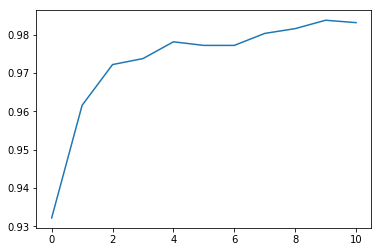

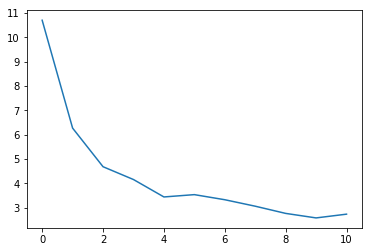


[11] accuracy: 0.983 loss: 2.729

runtime :  1448.5929703712463
Train
[12, 00020] loss: 0.203 acc: 0.998
[12, 00040] loss: 0.405 acc: 0.998
[12, 00060] loss: 0.587 acc: 0.998
[12, 00080] loss: 0.745 acc: 0.999
[12, 00100] loss: 1.000 acc: 0.999
[12, 00120] loss: 1.253 acc: 0.998
[12, 00140] loss: 1.427 acc: 0.999
[12, 00160] loss: 1.615 acc: 0.999
[12, 00180] loss: 1.775 acc: 0.999
[12, 00200] loss: 1.994 acc: 0.999
[0.793515625, 0.957890625, 0.978203125, 0.987109375, 0.991171875, 0.994609375, 0.995703125, 0.997265625, 0.9971875, 0.998203125, 0.998203125, 0.998671875]
[124.07311299443245, 27.772274132817984, 15.706978969275951, 10.309275289997458, 7.445104315876961, 5.599461819976568, 4.377407878637314, 3.2968851029872894, 2.798622328788042, 2.540911927819252, 2.190225299447775, 1.993629813194275]


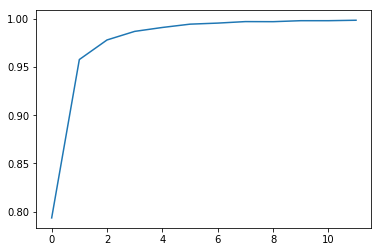

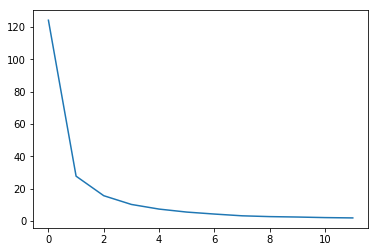

Validation
[0.9321875, 0.9615625, 0.9721875, 0.97375, 0.978125, 0.9771875, 0.9771875, 0.9803125, 0.9815625, 0.98375, 0.983125, 0.985625]
[10.706002213060856, 6.268553048372269, 4.680172849446535, 4.153117623180151, 3.4365686662495136, 3.5318384394049644, 3.322460323572159, 3.056099370121956, 2.7600675709545612, 2.574156306684017, 2.7287046052515507, 2.2050937563180923]


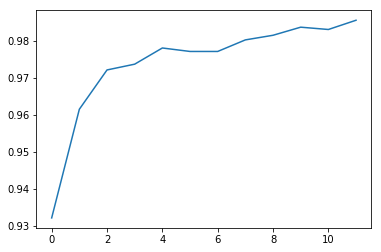

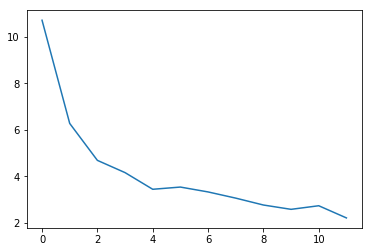


[12] accuracy: 0.986 loss: 2.205

runtime :  1577.8193004131317
Train
[13, 00020] loss: 0.146 acc: 1.000
[13, 00040] loss: 0.308 acc: 1.000
[13, 00060] loss: 0.454 acc: 0.999
[13, 00080] loss: 0.636 acc: 0.999
[13, 00100] loss: 0.850 acc: 0.999
[13, 00120] loss: 1.021 acc: 0.999
[13, 00140] loss: 1.228 acc: 0.999
[13, 00160] loss: 1.375 acc: 0.999
[13, 00180] loss: 1.488 acc: 0.999
[13, 00200] loss: 1.679 acc: 0.999
[0.793515625, 0.957890625, 0.978203125, 0.987109375, 0.991171875, 0.994609375, 0.995703125, 0.997265625, 0.9971875, 0.998203125, 0.998203125, 0.998671875, 0.9990625]
[124.07311299443245, 27.772274132817984, 15.706978969275951, 10.309275289997458, 7.445104315876961, 5.599461819976568, 4.377407878637314, 3.2968851029872894, 2.798622328788042, 2.540911927819252, 2.190225299447775, 1.993629813194275, 1.67935062199831]


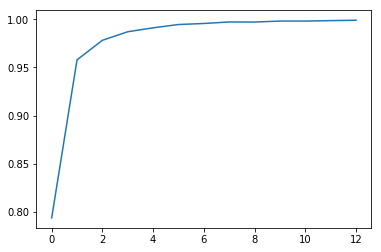

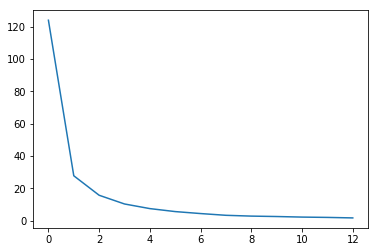

Validation
[0.9321875, 0.9615625, 0.9721875, 0.97375, 0.978125, 0.9771875, 0.9771875, 0.9803125, 0.9815625, 0.98375, 0.983125, 0.985625, 0.9828125]
[10.706002213060856, 6.268553048372269, 4.680172849446535, 4.153117623180151, 3.4365686662495136, 3.5318384394049644, 3.322460323572159, 3.056099370121956, 2.7600675709545612, 2.574156306684017, 2.7287046052515507, 2.2050937563180923, 2.682262599468231]


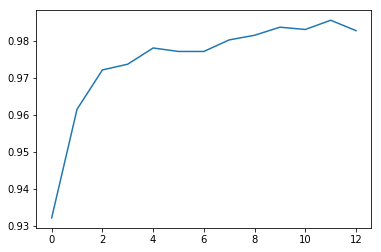

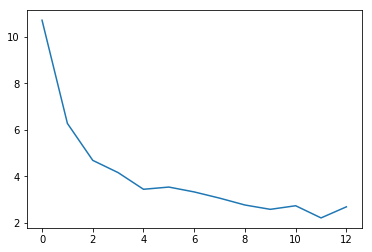


[13] accuracy: 0.983 loss: 2.682

runtime :  1708.6744351387024
Train
[14, 00020] loss: 0.113 acc: 1.000
[14, 00040] loss: 0.278 acc: 1.000
[14, 00060] loss: 0.400 acc: 0.999
[14, 00080] loss: 0.613 acc: 0.999
[14, 00100] loss: 0.765 acc: 0.999
[14, 00120] loss: 0.862 acc: 0.999
[14, 00140] loss: 1.007 acc: 0.999
[14, 00160] loss: 1.119 acc: 1.000
[14, 00180] loss: 1.279 acc: 0.999
[14, 00200] loss: 1.392 acc: 1.000
[0.793515625, 0.957890625, 0.978203125, 0.987109375, 0.991171875, 0.994609375, 0.995703125, 0.997265625, 0.9971875, 0.998203125, 0.998203125, 0.998671875, 0.9990625, 0.99953125]
[124.07311299443245, 27.772274132817984, 15.706978969275951, 10.309275289997458, 7.445104315876961, 5.599461819976568, 4.377407878637314, 3.2968851029872894, 2.798622328788042, 2.540911927819252, 2.190225299447775, 1.993629813194275, 1.67935062199831, 1.391642451286316]


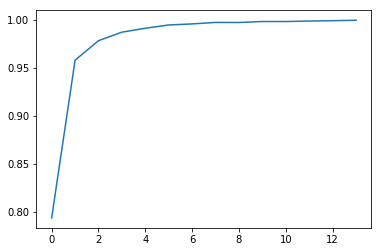

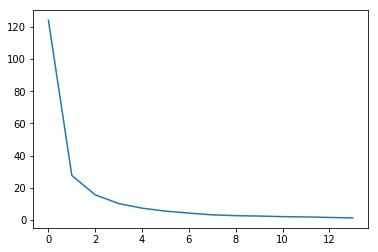

Validation
[0.9321875, 0.9615625, 0.9721875, 0.97375, 0.978125, 0.9771875, 0.9771875, 0.9803125, 0.9815625, 0.98375, 0.983125, 0.985625, 0.9828125, 0.983125]
[10.706002213060856, 6.268553048372269, 4.680172849446535, 4.153117623180151, 3.4365686662495136, 3.5318384394049644, 3.322460323572159, 3.056099370121956, 2.7600675709545612, 2.574156306684017, 2.7287046052515507, 2.2050937563180923, 2.682262599468231, 2.5309423990547657]


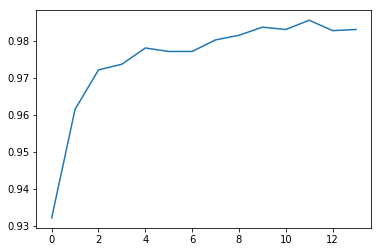

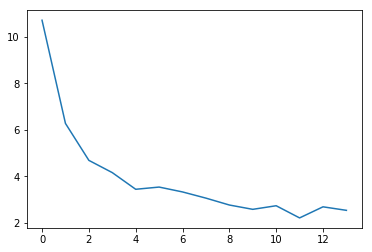


[14] accuracy: 0.983 loss: 2.531

runtime :  1838.3958687782288
Train
[15, 00020] loss: 0.151 acc: 0.999
[15, 00040] loss: 0.301 acc: 0.998
[15, 00060] loss: 0.422 acc: 0.999
[15, 00080] loss: 0.550 acc: 0.999
[15, 00100] loss: 0.676 acc: 0.999
[15, 00120] loss: 0.829 acc: 0.999
[15, 00140] loss: 0.937 acc: 0.999
[15, 00160] loss: 1.022 acc: 0.999
[15, 00180] loss: 1.177 acc: 0.999
[15, 00200] loss: 1.284 acc: 0.999
[0.793515625, 0.957890625, 0.978203125, 0.987109375, 0.991171875, 0.994609375, 0.995703125, 0.997265625, 0.9971875, 0.998203125, 0.998203125, 0.998671875, 0.9990625, 0.99953125, 0.99921875]
[124.07311299443245, 27.772274132817984, 15.706978969275951, 10.309275289997458, 7.445104315876961, 5.599461819976568, 4.377407878637314, 3.2968851029872894, 2.798622328788042, 2.540911927819252, 2.190225299447775, 1.993629813194275, 1.67935062199831, 1.391642451286316, 1.2840655408799648]


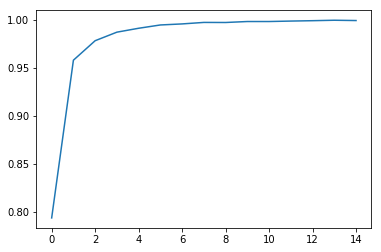

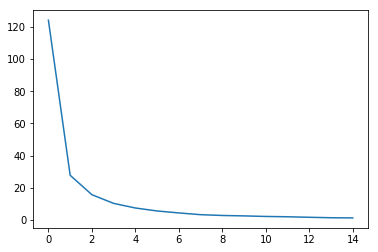

Validation
[0.9321875, 0.9615625, 0.9721875, 0.97375, 0.978125, 0.9771875, 0.9771875, 0.9803125, 0.9815625, 0.98375, 0.983125, 0.985625, 0.9828125, 0.983125, 0.984375]
[10.706002213060856, 6.268553048372269, 4.680172849446535, 4.153117623180151, 3.4365686662495136, 3.5318384394049644, 3.322460323572159, 3.056099370121956, 2.7600675709545612, 2.574156306684017, 2.7287046052515507, 2.2050937563180923, 2.682262599468231, 2.5309423990547657, 2.5500266514718533]


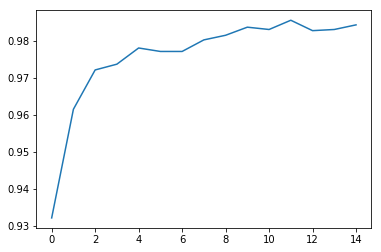

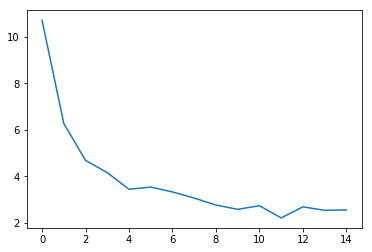


[15] accuracy: 0.984 loss: 2.550

runtime :  1968.349372625351
Train
[16, 00020] loss: 0.133 acc: 1.000
[16, 00040] loss: 0.310 acc: 0.999
[16, 00060] loss: 0.467 acc: 0.999
[16, 00080] loss: 0.558 acc: 0.999
[16, 00100] loss: 0.716 acc: 0.999
[16, 00120] loss: 0.894 acc: 0.999
[16, 00140] loss: 1.076 acc: 0.999
[16, 00160] loss: 1.184 acc: 0.999
[16, 00180] loss: 1.303 acc: 0.999
[16, 00200] loss: 1.423 acc: 0.999
[0.793515625, 0.957890625, 0.978203125, 0.987109375, 0.991171875, 0.994609375, 0.995703125, 0.997265625, 0.9971875, 0.998203125, 0.998203125, 0.998671875, 0.9990625, 0.99953125, 0.99921875, 0.9990625]
[124.07311299443245, 27.772274132817984, 15.706978969275951, 10.309275289997458, 7.445104315876961, 5.599461819976568, 4.377407878637314, 3.2968851029872894, 2.798622328788042, 2.540911927819252, 2.190225299447775, 1.993629813194275, 1.67935062199831, 1.391642451286316, 1.2840655408799648, 1.4225446097552776]


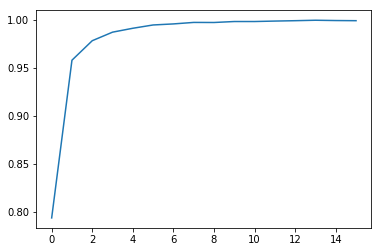

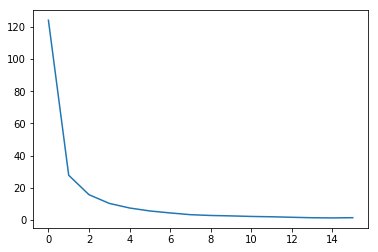

Validation
[0.9321875, 0.9615625, 0.9721875, 0.97375, 0.978125, 0.9771875, 0.9771875, 0.9803125, 0.9815625, 0.98375, 0.983125, 0.985625, 0.9828125, 0.983125, 0.984375, 0.985625]
[10.706002213060856, 6.268553048372269, 4.680172849446535, 4.153117623180151, 3.4365686662495136, 3.5318384394049644, 3.322460323572159, 3.056099370121956, 2.7600675709545612, 2.574156306684017, 2.7287046052515507, 2.2050937563180923, 2.682262599468231, 2.5309423990547657, 2.5500266514718533, 2.2425801530480385]


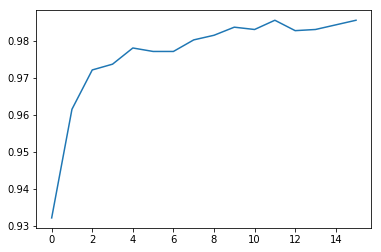

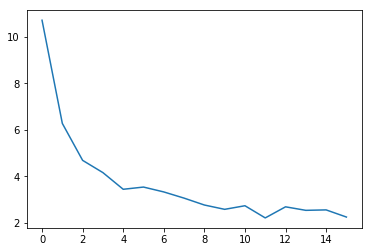


[16] accuracy: 0.986 loss: 2.243

runtime :  2099.1255190372467
Train
[17, 00020] loss: 0.088 acc: 1.000
[17, 00040] loss: 0.170 acc: 1.000
[17, 00060] loss: 0.259 acc: 1.000
[17, 00080] loss: 0.425 acc: 0.999
[17, 00100] loss: 0.522 acc: 0.999
[17, 00120] loss: 0.661 acc: 0.999
[17, 00140] loss: 0.734 acc: 0.999
[17, 00160] loss: 0.936 acc: 0.999
[17, 00180] loss: 1.060 acc: 0.999
[17, 00200] loss: 1.149 acc: 0.999
[0.793515625, 0.957890625, 0.978203125, 0.987109375, 0.991171875, 0.994609375, 0.995703125, 0.997265625, 0.9971875, 0.998203125, 0.998203125, 0.998671875, 0.9990625, 0.99953125, 0.99921875, 0.9990625, 0.999140625]
[124.07311299443245, 27.772274132817984, 15.706978969275951, 10.309275289997458, 7.445104315876961, 5.599461819976568, 4.377407878637314, 3.2968851029872894, 2.798622328788042, 2.540911927819252, 2.190225299447775, 1.993629813194275, 1.67935062199831, 1.391642451286316, 1.2840655408799648, 1.4225446097552776, 1.1487094350159168]


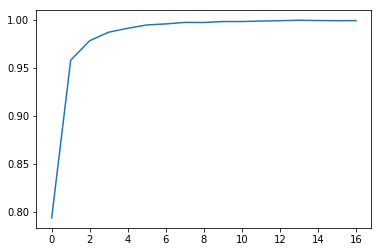

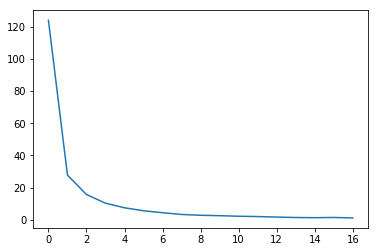

Validation
[0.9321875, 0.9615625, 0.9721875, 0.97375, 0.978125, 0.9771875, 0.9771875, 0.9803125, 0.9815625, 0.98375, 0.983125, 0.985625, 0.9828125, 0.983125, 0.984375, 0.985625, 0.9846875]
[10.706002213060856, 6.268553048372269, 4.680172849446535, 4.153117623180151, 3.4365686662495136, 3.5318384394049644, 3.322460323572159, 3.056099370121956, 2.7600675709545612, 2.574156306684017, 2.7287046052515507, 2.2050937563180923, 2.682262599468231, 2.5309423990547657, 2.5500266514718533, 2.2425801530480385, 2.619802825152874]


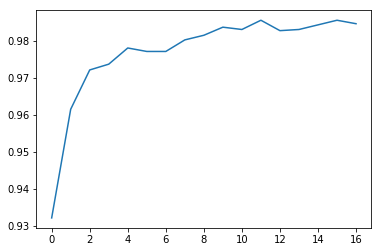

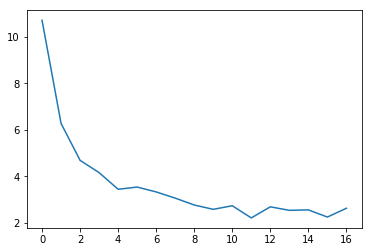


[17] accuracy: 0.985 loss: 2.620

runtime :  2230.04510140419
Train
[18, 00020] loss: 0.086 acc: 0.999
[18, 00040] loss: 0.159 acc: 1.000
[18, 00060] loss: 0.223 acc: 1.000
[18, 00080] loss: 0.326 acc: 1.000
[18, 00100] loss: 0.385 acc: 1.000
[18, 00120] loss: 0.490 acc: 1.000
[18, 00140] loss: 0.604 acc: 1.000
[18, 00160] loss: 0.710 acc: 1.000
[18, 00180] loss: 0.789 acc: 1.000
[18, 00200] loss: 0.861 acc: 1.000
[0.793515625, 0.957890625, 0.978203125, 0.987109375, 0.991171875, 0.994609375, 0.995703125, 0.997265625, 0.9971875, 0.998203125, 0.998203125, 0.998671875, 0.9990625, 0.99953125, 0.99921875, 0.9990625, 0.999140625, 0.999765625]
[124.07311299443245, 27.772274132817984, 15.706978969275951, 10.309275289997458, 7.445104315876961, 5.599461819976568, 4.377407878637314, 3.2968851029872894, 2.798622328788042, 2.540911927819252, 2.190225299447775, 1.993629813194275, 1.67935062199831, 1.391642451286316, 1.2840655408799648, 1.4225446097552776, 1.1487094350159168, 0.8607329204678535]


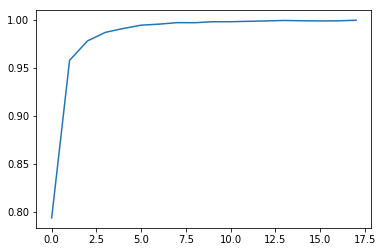

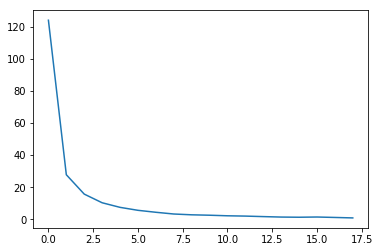

Validation
[0.9321875, 0.9615625, 0.9721875, 0.97375, 0.978125, 0.9771875, 0.9771875, 0.9803125, 0.9815625, 0.98375, 0.983125, 0.985625, 0.9828125, 0.983125, 0.984375, 0.985625, 0.9846875, 0.9809375]
[10.706002213060856, 6.268553048372269, 4.680172849446535, 4.153117623180151, 3.4365686662495136, 3.5318384394049644, 3.322460323572159, 3.056099370121956, 2.7600675709545612, 2.574156306684017, 2.7287046052515507, 2.2050937563180923, 2.682262599468231, 2.5309423990547657, 2.5500266514718533, 2.2425801530480385, 2.619802825152874, 2.565567657351494]


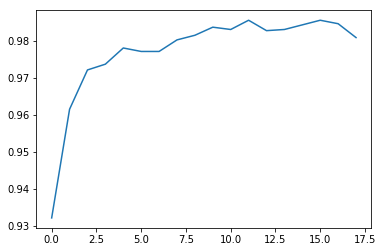

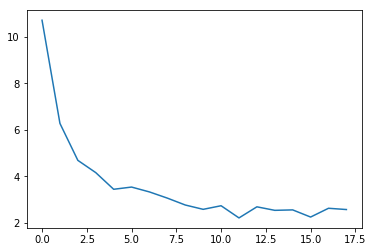


[18] accuracy: 0.981 loss: 2.566

runtime :  2360.4948904514313
Train
[19, 00020] loss: 0.100 acc: 1.000
[19, 00040] loss: 0.228 acc: 0.999
[19, 00060] loss: 0.296 acc: 0.999
[19, 00080] loss: 0.447 acc: 0.999
[19, 00100] loss: 0.524 acc: 0.999
[19, 00120] loss: 0.590 acc: 0.999
[19, 00140] loss: 0.754 acc: 0.999
[19, 00160] loss: 0.895 acc: 0.999
[19, 00180] loss: 0.984 acc: 0.999
[19, 00200] loss: 1.063 acc: 0.999
[0.793515625, 0.957890625, 0.978203125, 0.987109375, 0.991171875, 0.994609375, 0.995703125, 0.997265625, 0.9971875, 0.998203125, 0.998203125, 0.998671875, 0.9990625, 0.99953125, 0.99921875, 0.9990625, 0.999140625, 0.999765625, 0.99921875]
[124.07311299443245, 27.772274132817984, 15.706978969275951, 10.309275289997458, 7.445104315876961, 5.599461819976568, 4.377407878637314, 3.2968851029872894, 2.798622328788042, 2.540911927819252, 2.190225299447775, 1.993629813194275, 1.67935062199831, 1.391642451286316, 1.2840655408799648, 1.4225446097552776, 1.1487094350159168, 0.8607329

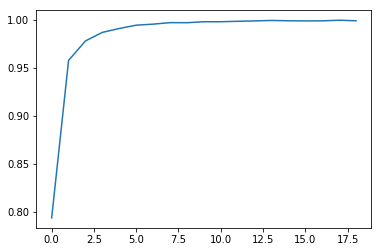

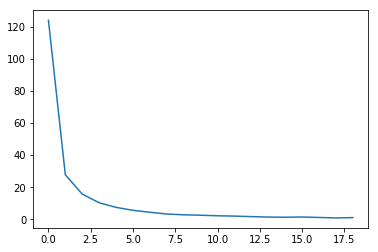

Validation
[0.9321875, 0.9615625, 0.9721875, 0.97375, 0.978125, 0.9771875, 0.9771875, 0.9803125, 0.9815625, 0.98375, 0.983125, 0.985625, 0.9828125, 0.983125, 0.984375, 0.985625, 0.9846875, 0.9809375, 0.98625]
[10.706002213060856, 6.268553048372269, 4.680172849446535, 4.153117623180151, 3.4365686662495136, 3.5318384394049644, 3.322460323572159, 3.056099370121956, 2.7600675709545612, 2.574156306684017, 2.7287046052515507, 2.2050937563180923, 2.682262599468231, 2.5309423990547657, 2.5500266514718533, 2.2425801530480385, 2.619802825152874, 2.565567657351494, 2.324256334453821]


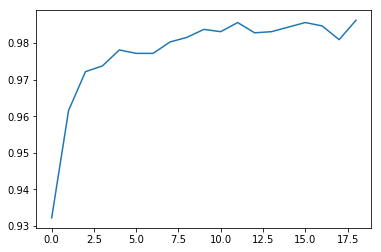

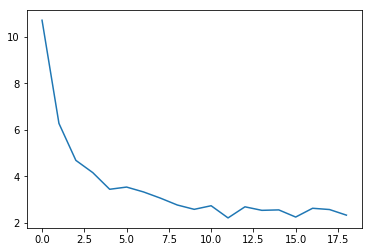


[19] accuracy: 0.986 loss: 2.324

runtime :  2491.6494212150574
Train
[20, 00020] loss: 0.099 acc: 1.000
[20, 00040] loss: 0.208 acc: 1.000
[20, 00060] loss: 0.271 acc: 1.000
[20, 00080] loss: 0.352 acc: 1.000
[20, 00100] loss: 0.427 acc: 1.000
[20, 00120] loss: 0.502 acc: 1.000
[20, 00140] loss: 0.579 acc: 1.000
[20, 00160] loss: 0.645 acc: 1.000
[20, 00180] loss: 0.725 acc: 1.000
[20, 00200] loss: 0.799 acc: 1.000
[0.793515625, 0.957890625, 0.978203125, 0.987109375, 0.991171875, 0.994609375, 0.995703125, 0.997265625, 0.9971875, 0.998203125, 0.998203125, 0.998671875, 0.9990625, 0.99953125, 0.99921875, 0.9990625, 0.999140625, 0.999765625, 0.99921875, 0.999765625]
[124.07311299443245, 27.772274132817984, 15.706978969275951, 10.309275289997458, 7.445104315876961, 5.599461819976568, 4.377407878637314, 3.2968851029872894, 2.798622328788042, 2.540911927819252, 2.190225299447775, 1.993629813194275, 1.67935062199831, 1.391642451286316, 1.2840655408799648, 1.4225446097552776, 1.14870943501591

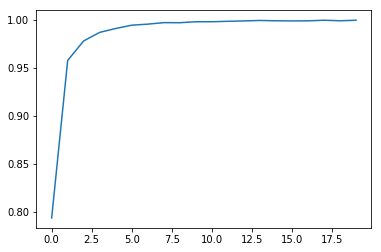

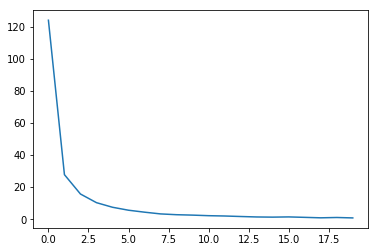

Validation
[0.9321875, 0.9615625, 0.9721875, 0.97375, 0.978125, 0.9771875, 0.9771875, 0.9803125, 0.9815625, 0.98375, 0.983125, 0.985625, 0.9828125, 0.983125, 0.984375, 0.985625, 0.9846875, 0.9809375, 0.98625, 0.9828125]
[10.706002213060856, 6.268553048372269, 4.680172849446535, 4.153117623180151, 3.4365686662495136, 3.5318384394049644, 3.322460323572159, 3.056099370121956, 2.7600675709545612, 2.574156306684017, 2.7287046052515507, 2.2050937563180923, 2.682262599468231, 2.5309423990547657, 2.5500266514718533, 2.2425801530480385, 2.619802825152874, 2.565567657351494, 2.324256334453821, 2.665974698960781]


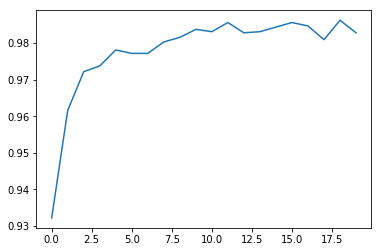

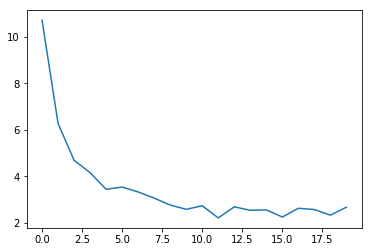


[20] accuracy: 0.983 loss: 2.666

runtime :  2622.797214269638
Train
[21, 00020] loss: 0.094 acc: 0.998
[21, 00040] loss: 0.178 acc: 0.999
[21, 00060] loss: 0.250 acc: 0.999
[21, 00080] loss: 0.324 acc: 1.000
[21, 00100] loss: 0.377 acc: 1.000
[21, 00120] loss: 0.433 acc: 1.000
[21, 00140] loss: 0.496 acc: 1.000
[21, 00160] loss: 0.558 acc: 1.000
[21, 00180] loss: 0.614 acc: 1.000
[21, 00200] loss: 0.701 acc: 1.000
[0.793515625, 0.957890625, 0.978203125, 0.987109375, 0.991171875, 0.994609375, 0.995703125, 0.997265625, 0.9971875, 0.998203125, 0.998203125, 0.998671875, 0.9990625, 0.99953125, 0.99921875, 0.9990625, 0.999140625, 0.999765625, 0.99921875, 0.999765625, 0.999765625]
[124.07311299443245, 27.772274132817984, 15.706978969275951, 10.309275289997458, 7.445104315876961, 5.599461819976568, 4.377407878637314, 3.2968851029872894, 2.798622328788042, 2.540911927819252, 2.190225299447775, 1.993629813194275, 1.67935062199831, 1.391642451286316, 1.2840655408799648, 1.4225446097552776, 1.14

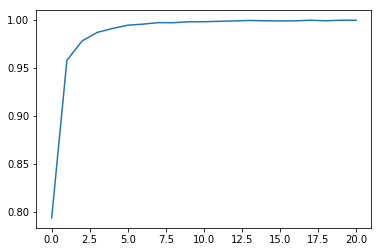

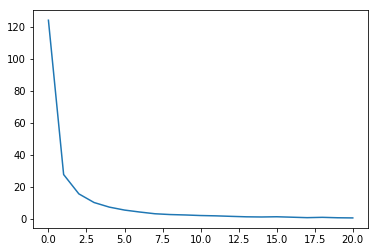

Validation
[0.9321875, 0.9615625, 0.9721875, 0.97375, 0.978125, 0.9771875, 0.9771875, 0.9803125, 0.9815625, 0.98375, 0.983125, 0.985625, 0.9828125, 0.983125, 0.984375, 0.985625, 0.9846875, 0.9809375, 0.98625, 0.9828125, 0.985625]
[10.706002213060856, 6.268553048372269, 4.680172849446535, 4.153117623180151, 3.4365686662495136, 3.5318384394049644, 3.322460323572159, 3.056099370121956, 2.7600675709545612, 2.574156306684017, 2.7287046052515507, 2.2050937563180923, 2.682262599468231, 2.5309423990547657, 2.5500266514718533, 2.2425801530480385, 2.619802825152874, 2.565567657351494, 2.324256334453821, 2.665974698960781, 2.527313683182001]


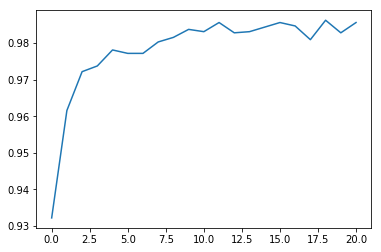

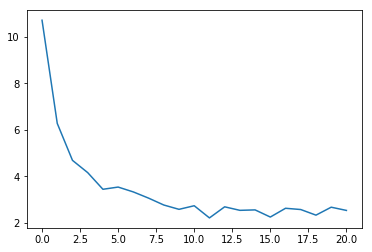


[21] accuracy: 0.986 loss: 2.527

runtime :  2753.820409297943
Train
[22, 00020] loss: 0.061 acc: 1.000
[22, 00040] loss: 0.127 acc: 1.000
[22, 00060] loss: 0.235 acc: 1.000
[22, 00080] loss: 0.335 acc: 1.000
[22, 00100] loss: 0.419 acc: 1.000
[22, 00120] loss: 0.493 acc: 1.000
[22, 00140] loss: 0.595 acc: 1.000
[22, 00160] loss: 0.666 acc: 1.000
[22, 00180] loss: 0.715 acc: 1.000
[22, 00200] loss: 0.803 acc: 1.000
[0.793515625, 0.957890625, 0.978203125, 0.987109375, 0.991171875, 0.994609375, 0.995703125, 0.997265625, 0.9971875, 0.998203125, 0.998203125, 0.998671875, 0.9990625, 0.99953125, 0.99921875, 0.9990625, 0.999140625, 0.999765625, 0.99921875, 0.999765625, 0.999765625, 0.999609375]
[124.07311299443245, 27.772274132817984, 15.706978969275951, 10.309275289997458, 7.445104315876961, 5.599461819976568, 4.377407878637314, 3.2968851029872894, 2.798622328788042, 2.540911927819252, 2.190225299447775, 1.993629813194275, 1.67935062199831, 1.391642451286316, 1.2840655408799648, 1.422544609

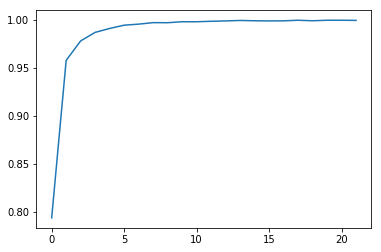

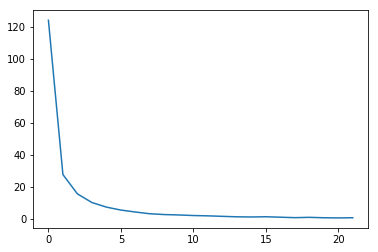

Validation
[0.9321875, 0.9615625, 0.9721875, 0.97375, 0.978125, 0.9771875, 0.9771875, 0.9803125, 0.9815625, 0.98375, 0.983125, 0.985625, 0.9828125, 0.983125, 0.984375, 0.985625, 0.9846875, 0.9809375, 0.98625, 0.9828125, 0.985625, 0.9821875]
[10.706002213060856, 6.268553048372269, 4.680172849446535, 4.153117623180151, 3.4365686662495136, 3.5318384394049644, 3.322460323572159, 3.056099370121956, 2.7600675709545612, 2.574156306684017, 2.7287046052515507, 2.2050937563180923, 2.682262599468231, 2.5309423990547657, 2.5500266514718533, 2.2425801530480385, 2.619802825152874, 2.565567657351494, 2.324256334453821, 2.665974698960781, 2.527313683182001, 2.8514534309506416]


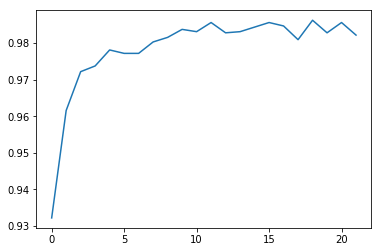

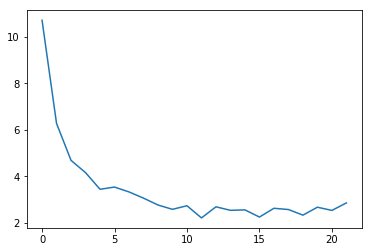


[22] accuracy: 0.982 loss: 2.851

runtime :  2884.607438325882
Train
[23, 00020] loss: 0.067 acc: 1.000
[23, 00040] loss: 0.127 acc: 1.000
[23, 00060] loss: 0.198 acc: 1.000
[23, 00080] loss: 0.255 acc: 1.000
[23, 00100] loss: 0.308 acc: 1.000
[23, 00120] loss: 0.381 acc: 1.000
[23, 00140] loss: 0.472 acc: 1.000
[23, 00160] loss: 0.531 acc: 1.000
[23, 00180] loss: 0.591 acc: 1.000
[23, 00200] loss: 0.671 acc: 1.000
[0.793515625, 0.957890625, 0.978203125, 0.987109375, 0.991171875, 0.994609375, 0.995703125, 0.997265625, 0.9971875, 0.998203125, 0.998203125, 0.998671875, 0.9990625, 0.99953125, 0.99921875, 0.9990625, 0.999140625, 0.999765625, 0.99921875, 0.999765625, 0.999765625, 0.999609375, 0.999765625]
[124.07311299443245, 27.772274132817984, 15.706978969275951, 10.309275289997458, 7.445104315876961, 5.599461819976568, 4.377407878637314, 3.2968851029872894, 2.798622328788042, 2.540911927819252, 2.190225299447775, 1.993629813194275, 1.67935062199831, 1.391642451286316, 1.2840655408799648

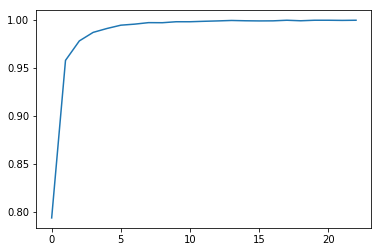

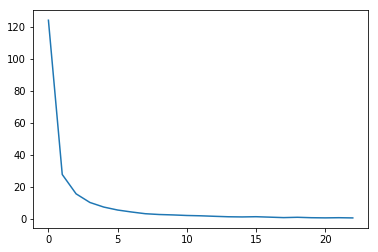

Validation
[0.9321875, 0.9615625, 0.9721875, 0.97375, 0.978125, 0.9771875, 0.9771875, 0.9803125, 0.9815625, 0.98375, 0.983125, 0.985625, 0.9828125, 0.983125, 0.984375, 0.985625, 0.9846875, 0.9809375, 0.98625, 0.9828125, 0.985625, 0.9821875, 0.9884375]
[10.706002213060856, 6.268553048372269, 4.680172849446535, 4.153117623180151, 3.4365686662495136, 3.5318384394049644, 3.322460323572159, 3.056099370121956, 2.7600675709545612, 2.574156306684017, 2.7287046052515507, 2.2050937563180923, 2.682262599468231, 2.5309423990547657, 2.5500266514718533, 2.2425801530480385, 2.619802825152874, 2.565567657351494, 2.324256334453821, 2.665974698960781, 2.527313683182001, 2.8514534309506416, 2.262276044115424]


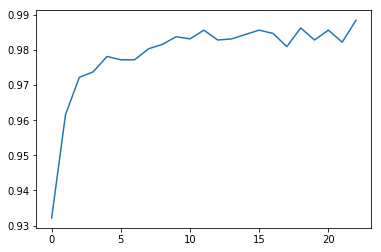

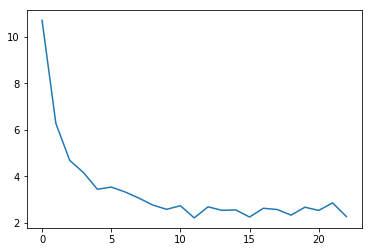


[23] accuracy: 0.988 loss: 2.262

runtime :  3015.4813911914825
Train
[24, 00020] loss: 0.041 acc: 1.000
[24, 00040] loss: 0.095 acc: 1.000
[24, 00060] loss: 0.158 acc: 1.000
[24, 00080] loss: 0.251 acc: 1.000
[24, 00100] loss: 0.313 acc: 1.000
[24, 00120] loss: 0.355 acc: 1.000
[24, 00140] loss: 0.408 acc: 1.000
[24, 00160] loss: 0.502 acc: 1.000
[24, 00180] loss: 0.567 acc: 1.000
[24, 00200] loss: 0.652 acc: 1.000
[0.793515625, 0.957890625, 0.978203125, 0.987109375, 0.991171875, 0.994609375, 0.995703125, 0.997265625, 0.9971875, 0.998203125, 0.998203125, 0.998671875, 0.9990625, 0.99953125, 0.99921875, 0.9990625, 0.999140625, 0.999765625, 0.99921875, 0.999765625, 0.999765625, 0.999609375, 0.999765625, 0.9996875]
[124.07311299443245, 27.772274132817984, 15.706978969275951, 10.309275289997458, 7.445104315876961, 5.599461819976568, 4.377407878637314, 3.2968851029872894, 2.798622328788042, 2.540911927819252, 2.190225299447775, 1.993629813194275, 1.67935062199831, 1.391642451286316, 1.2840

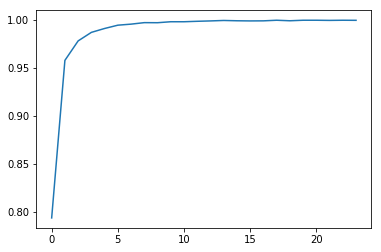

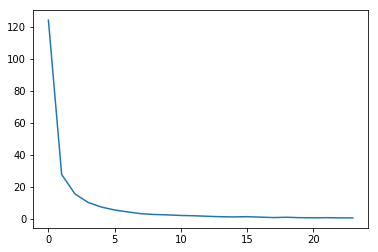

Validation
[0.9321875, 0.9615625, 0.9721875, 0.97375, 0.978125, 0.9771875, 0.9771875, 0.9803125, 0.9815625, 0.98375, 0.983125, 0.985625, 0.9828125, 0.983125, 0.984375, 0.985625, 0.9846875, 0.9809375, 0.98625, 0.9828125, 0.985625, 0.9821875, 0.9884375, 0.9840625]
[10.706002213060856, 6.268553048372269, 4.680172849446535, 4.153117623180151, 3.4365686662495136, 3.5318384394049644, 3.322460323572159, 3.056099370121956, 2.7600675709545612, 2.574156306684017, 2.7287046052515507, 2.2050937563180923, 2.682262599468231, 2.5309423990547657, 2.5500266514718533, 2.2425801530480385, 2.619802825152874, 2.565567657351494, 2.324256334453821, 2.665974698960781, 2.527313683182001, 2.8514534309506416, 2.262276044115424, 2.2651222497224808]


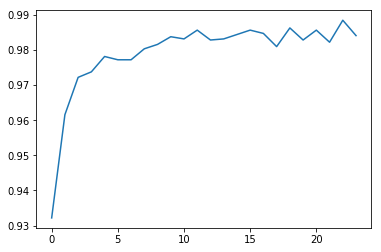

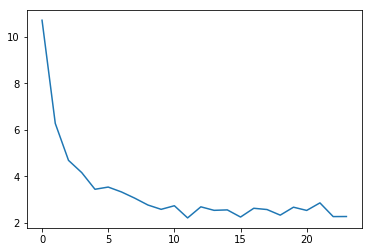


[24] accuracy: 0.984 loss: 2.265

runtime :  3147.1604993343353
Train
[25, 00020] loss: 0.076 acc: 1.000
[25, 00040] loss: 0.133 acc: 1.000
[25, 00060] loss: 0.195 acc: 1.000
[25, 00080] loss: 0.284 acc: 1.000
[25, 00100] loss: 0.344 acc: 1.000
[25, 00120] loss: 0.390 acc: 1.000
[25, 00140] loss: 0.469 acc: 1.000
[25, 00160] loss: 0.513 acc: 1.000
[25, 00180] loss: 0.578 acc: 1.000
[25, 00200] loss: 0.616 acc: 1.000
[0.793515625, 0.957890625, 0.978203125, 0.987109375, 0.991171875, 0.994609375, 0.995703125, 0.997265625, 0.9971875, 0.998203125, 0.998203125, 0.998671875, 0.9990625, 0.99953125, 0.99921875, 0.9990625, 0.999140625, 0.999765625, 0.99921875, 0.999765625, 0.999765625, 0.999609375, 0.999765625, 0.9996875, 0.99984375]
[124.07311299443245, 27.772274132817984, 15.706978969275951, 10.309275289997458, 7.445104315876961, 5.599461819976568, 4.377407878637314, 3.2968851029872894, 2.798622328788042, 2.540911927819252, 2.190225299447775, 1.993629813194275, 1.67935062199831, 1.39164245128

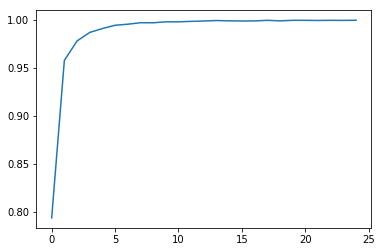

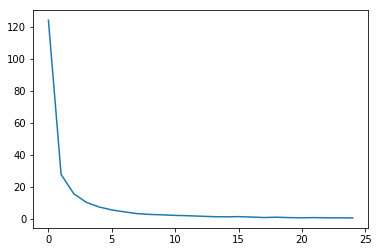

Validation
[0.9321875, 0.9615625, 0.9721875, 0.97375, 0.978125, 0.9771875, 0.9771875, 0.9803125, 0.9815625, 0.98375, 0.983125, 0.985625, 0.9828125, 0.983125, 0.984375, 0.985625, 0.9846875, 0.9809375, 0.98625, 0.9828125, 0.985625, 0.9821875, 0.9884375, 0.9840625, 0.985]
[10.706002213060856, 6.268553048372269, 4.680172849446535, 4.153117623180151, 3.4365686662495136, 3.5318384394049644, 3.322460323572159, 3.056099370121956, 2.7600675709545612, 2.574156306684017, 2.7287046052515507, 2.2050937563180923, 2.682262599468231, 2.5309423990547657, 2.5500266514718533, 2.2425801530480385, 2.619802825152874, 2.565567657351494, 2.324256334453821, 2.665974698960781, 2.527313683182001, 2.8514534309506416, 2.262276044115424, 2.2651222497224808, 2.5180395022034645]


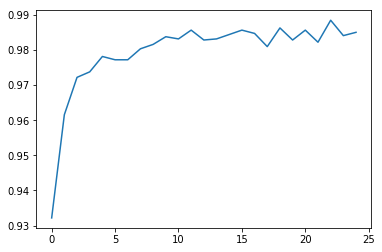

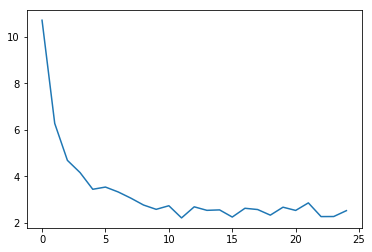


[25] accuracy: 0.985 loss: 2.518

runtime :  3277.9220428466797
Train
[26, 00020] loss: 0.044 acc: 1.000
[26, 00040] loss: 0.101 acc: 1.000
[26, 00060] loss: 0.143 acc: 1.000
[26, 00080] loss: 0.196 acc: 1.000
[26, 00100] loss: 0.303 acc: 1.000
[26, 00120] loss: 0.372 acc: 1.000
[26, 00140] loss: 0.467 acc: 1.000
[26, 00160] loss: 0.509 acc: 1.000
[26, 00180] loss: 0.603 acc: 1.000
[26, 00200] loss: 0.666 acc: 1.000
[0.793515625, 0.957890625, 0.978203125, 0.987109375, 0.991171875, 0.994609375, 0.995703125, 0.997265625, 0.9971875, 0.998203125, 0.998203125, 0.998671875, 0.9990625, 0.99953125, 0.99921875, 0.9990625, 0.999140625, 0.999765625, 0.99921875, 0.999765625, 0.999765625, 0.999609375, 0.999765625, 0.9996875, 0.99984375, 0.9996875]
[124.07311299443245, 27.772274132817984, 15.706978969275951, 10.309275289997458, 7.445104315876961, 5.599461819976568, 4.377407878637314, 3.2968851029872894, 2.798622328788042, 2.540911927819252, 2.190225299447775, 1.993629813194275, 1.67935062199831, 1.

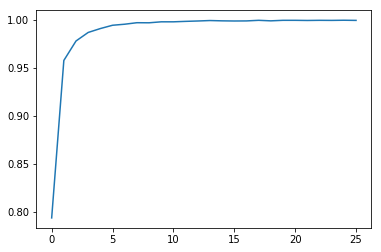

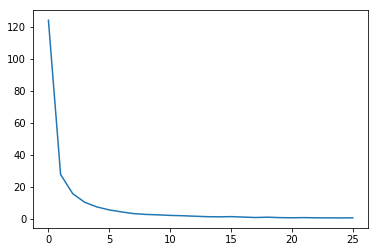

Validation
[0.9321875, 0.9615625, 0.9721875, 0.97375, 0.978125, 0.9771875, 0.9771875, 0.9803125, 0.9815625, 0.98375, 0.983125, 0.985625, 0.9828125, 0.983125, 0.984375, 0.985625, 0.9846875, 0.9809375, 0.98625, 0.9828125, 0.985625, 0.9821875, 0.9884375, 0.9840625, 0.985, 0.986875]
[10.706002213060856, 6.268553048372269, 4.680172849446535, 4.153117623180151, 3.4365686662495136, 3.5318384394049644, 3.322460323572159, 3.056099370121956, 2.7600675709545612, 2.574156306684017, 2.7287046052515507, 2.2050937563180923, 2.682262599468231, 2.5309423990547657, 2.5500266514718533, 2.2425801530480385, 2.619802825152874, 2.565567657351494, 2.324256334453821, 2.665974698960781, 2.527313683182001, 2.8514534309506416, 2.262276044115424, 2.2651222497224808, 2.5180395022034645, 2.3245325349271297]


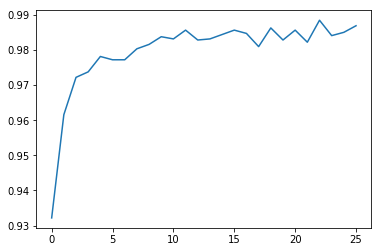

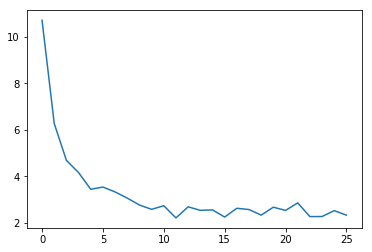


[26] accuracy: 0.987 loss: 2.325

runtime :  3408.2013852596283
Train
[27, 00020] loss: 0.042 acc: 1.000
[27, 00040] loss: 0.103 acc: 1.000
[27, 00060] loss: 0.141 acc: 1.000
[27, 00080] loss: 0.195 acc: 1.000
[27, 00100] loss: 0.243 acc: 1.000
[27, 00120] loss: 0.294 acc: 1.000
[27, 00140] loss: 0.345 acc: 1.000
[27, 00160] loss: 0.397 acc: 1.000
[27, 00180] loss: 0.453 acc: 1.000
[27, 00200] loss: 0.521 acc: 1.000
[0.793515625, 0.957890625, 0.978203125, 0.987109375, 0.991171875, 0.994609375, 0.995703125, 0.997265625, 0.9971875, 0.998203125, 0.998203125, 0.998671875, 0.9990625, 0.99953125, 0.99921875, 0.9990625, 0.999140625, 0.999765625, 0.99921875, 0.999765625, 0.999765625, 0.999609375, 0.999765625, 0.9996875, 0.99984375, 0.9996875, 0.999765625]
[124.07311299443245, 27.772274132817984, 15.706978969275951, 10.309275289997458, 7.445104315876961, 5.599461819976568, 4.377407878637314, 3.2968851029872894, 2.798622328788042, 2.540911927819252, 2.190225299447775, 1.993629813194275, 1.67935

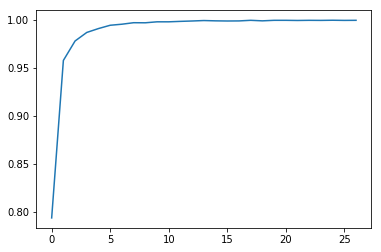

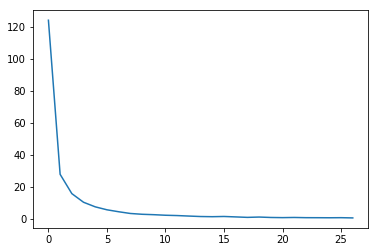

Validation
[0.9321875, 0.9615625, 0.9721875, 0.97375, 0.978125, 0.9771875, 0.9771875, 0.9803125, 0.9815625, 0.98375, 0.983125, 0.985625, 0.9828125, 0.983125, 0.984375, 0.985625, 0.9846875, 0.9809375, 0.98625, 0.9828125, 0.985625, 0.9821875, 0.9884375, 0.9840625, 0.985, 0.986875, 0.9865625]
[10.706002213060856, 6.268553048372269, 4.680172849446535, 4.153117623180151, 3.4365686662495136, 3.5318384394049644, 3.322460323572159, 3.056099370121956, 2.7600675709545612, 2.574156306684017, 2.7287046052515507, 2.2050937563180923, 2.682262599468231, 2.5309423990547657, 2.5500266514718533, 2.2425801530480385, 2.619802825152874, 2.565567657351494, 2.324256334453821, 2.665974698960781, 2.527313683182001, 2.8514534309506416, 2.262276044115424, 2.2651222497224808, 2.5180395022034645, 2.3245325349271297, 2.5337608009576797]


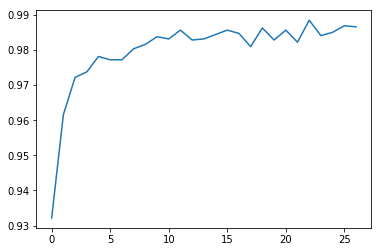

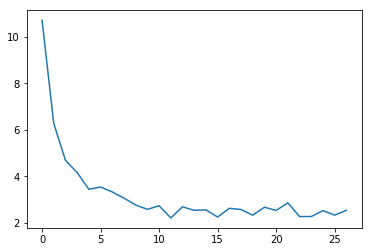


[27] accuracy: 0.987 loss: 2.534

runtime :  3538.9281249046326
Train
[28, 00020] loss: 0.031 acc: 1.000
[28, 00040] loss: 0.073 acc: 1.000
[28, 00060] loss: 0.114 acc: 1.000
[28, 00080] loss: 0.166 acc: 1.000
[28, 00100] loss: 0.226 acc: 1.000
[28, 00120] loss: 0.282 acc: 1.000


In [ ]:
train_acc = []
train_loss = []
val_acc = []
val_loss = []
import time
start_time = time.time()
for epoch in range(EPOCH):
    print("Train")
    total = 0
    correct = 0
    running_loss = 0.0
    for step, (labels, images,_) in enumerate(trainloader):
        optimizer.zero_grad()
#         print("in Train: ", images.shape, labels.shape)
#         images = images.detach()
#         labels = labels.detach()
        images = images.detach().cuda()
        labels = labels.detach().cuda()
        outputs = model(images)
        
        # loss
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()
        running_loss += loss.item()
        
        # accuracy
        _, predicted = torch.max(outputs.data, 1)
        total += labels.size(0)
        correct += (predicted == labels).sum().item()
        acc = correct / total

        if step % 20 == 19:    # print every 2000 mini-batches
            print('[%d, %05d] loss: %.3f acc: %.3f' %
                  (epoch + 1, step + 1, running_loss, acc))

    train_acc.append(acc)
    train_loss.append(running_loss)
    print(train_acc)
    print(train_loss)
    plt.figure()
    plt.plot(range(0,epoch+1), train_acc)
    plt.savefig(model_directory + "train_acc_E%03d.jpg" % (epoch+1), dpi=500)
    plt.show()
    plt.figure()
    plt.plot(range(0,epoch+1), train_loss)
    plt.savefig(model_directory + "train_loss_E%03d.jpg" % (epoch+1), dpi=500)
    plt.show()
    
    # Evaluate validation set
    print("Validation")
    total = 0
    correct = 0
    running_loss = 0.0
    for step, (labels, images,_) in enumerate(valloader):
        optimizer.zero_grad()
        images = images.detach().cuda()
        labels = labels.detach().cuda()
#         images = images.detach()
#         labels = labels.detach()
        outputs = model(images)
        loss = criterion(outputs, labels)
        _, predicted = torch.max(outputs.data, 1)
        running_loss += loss.item()
        total += labels.size(0)
        correct += (predicted == labels).sum().item()
        acc = correct / total
    
    val_acc.append(acc)
    val_loss.append(running_loss)
    print(val_acc)
    print(val_loss)
    plt.figure()
    plt.plot(range(0,epoch+1), val_acc)
    plt.savefig(model_directory + "val_acc_E%03d.jpg" % (epoch+1), dpi=500)
    plt.show()
    plt.figure()
    plt.plot(range(0,epoch+1), val_loss)
    plt.savefig(model_directory + "val_loss_E%03d.jpg" % (epoch+1), dpi=500)
    plt.show()
    
    print('\n[%d] accuracy: %.3f loss: %.3f\n' % (epoch + 1, acc, running_loss))
    running_loss = 0.0
    # Saving model
    model_path = PJ(model_directory, "%03d_weights.pt" % (epoch+1))
    torch.save(model.state_dict(), model_path)
    runtime = time.time() - start_time
    print("runtime : ", runtime)

In [ ]:
print("runtime : ", runtime)
resultfile = open(model_directory+"train_results.txt", "a")
resultfile.write("train")
resultfile.write(str(train_acc))
resultfile.write("\n")
resultfile.write(str(train_loss))
resultfile.write("\n")
resultfile.write("validation")
resultfile.write("\n")
resultfile.write(str(val_acc))
resultfile.write("\n")
resultfile.write(str(val_loss))
resultfile.write("\n")
resultfile.close()

# TEST
### evaluate
### test every model
### saliency map

In [35]:
transform = transform_set(train=False)
testset = TermiteDataset(TestFile, transform)
testloader = Data.DataLoader(
    dataset=testset,      # torch TensorDataset format
    batch_size=BATCH_SIZE,      # mini batch size
    shuffle=True,               # 要不要打乱数据 (打乱比较好)
    num_workers=0,              # 多线程来读数据
)


[1] accuracy: 0.815 loss: 64.114

[0.815]
[64.11414223909378]


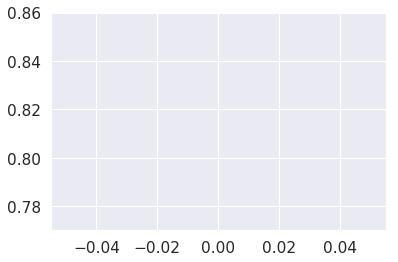

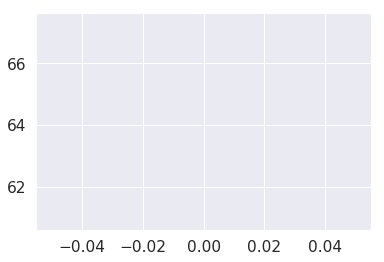

[4, 4, 2, 1, 3, 0, 6, 4, 4, 1, 7, 1, 3, 4, 0, 4, 3, 4, 2, 5, 5, 4, 0, 6, 0, 2, 1, 0, 3, 4, 3, 4, 0, 5, 7, 7, 4, 6, 1, 0, 7, 6, 6, 0, 6, 4, 4, 0, 0, 2, 1, 1, 4, 3, 2, 3, 2, 6, 2, 0, 1, 0, 3, 0, 6, 5, 4, 5, 0, 0, 7, 4, 4, 0, 2, 2, 4, 4, 2, 6, 0, 6, 3, 5, 0, 6, 2, 6, 1, 1, 6, 7, 7, 7, 7, 0, 2, 3, 1, 5, 1, 4, 0, 2, 5, 7, 7, 0, 6, 4, 2, 7, 4, 1, 6, 2, 7, 4, 7, 0, 1, 2, 3, 1, 6, 4, 1, 7, 5, 7, 2, 0, 4, 1, 0, 7, 1, 1, 4, 2, 4, 0, 0, 4, 7, 7, 4, 4, 5, 3, 0, 5, 1, 7, 2, 0, 0, 4, 7, 2, 7, 3, 4, 4, 4, 5, 4, 3, 6, 7, 2, 0, 2, 1, 5, 6, 4, 0, 3, 1, 0, 1, 1, 2, 0, 3, 5, 2, 4, 6, 6, 2, 5, 7, 0, 2, 5, 2, 4, 4, 3, 0, 1, 1, 3, 7, 6, 3, 2, 4, 1, 4, 7, 4, 1, 1, 4, 1, 0, 4, 6, 4, 3, 7, 0, 7, 0, 4, 3, 0, 2, 6, 6, 0, 0, 4, 5, 4, 2, 3, 2, 7, 2, 1, 2, 4, 5, 4, 0, 1, 2, 3, 4, 2, 1, 1, 1, 0, 2, 2, 0, 4, 0, 4, 7, 0, 0, 0, 1, 2, 3, 0, 1, 5, 0, 2, 2, 0, 2, 5, 0, 0, 3, 1, 4, 5, 0, 2, 0, 4, 2, 4, 7, 0, 2, 2, 4, 4, 7, 4, 5, 4, 2, 4, 0, 2, 4, 7, 6, 2, 1, 7, 4, 1, 4, 2, 6, 1, 4, 6, 6, 0, 0, 3, 3, 4, 2, 0, 3, 2, 7, 2, 3, 

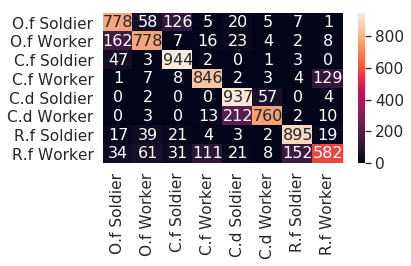

runtime :  235.97668147087097

[2] accuracy: 0.856 loss: 49.905

[0.815, 0.85625]
[64.11414223909378, 49.904711842536926]


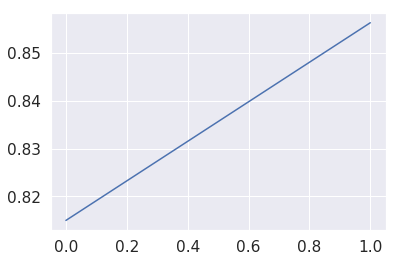

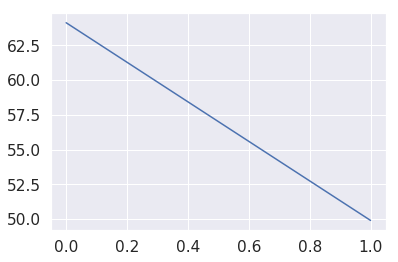

[0, 6, 7, 3, 2, 4, 0, 1, 1, 2, 0, 7, 3, 4, 4, 1, 1, 0, 0, 0, 4, 0, 4, 7, 6, 6, 4, 5, 0, 0, 1, 0, 3, 2, 3, 0, 4, 4, 3, 0, 4, 3, 1, 6, 7, 2, 4, 2, 4, 4, 2, 4, 6, 1, 7, 3, 4, 4, 5, 4, 6, 0, 4, 7, 3, 6, 5, 3, 3, 6, 3, 2, 7, 1, 2, 3, 0, 6, 4, 4, 0, 7, 3, 0, 7, 6, 1, 7, 6, 5, 0, 2, 6, 0, 0, 6, 2, 4, 7, 4, 0, 4, 4, 7, 6, 4, 0, 6, 0, 6, 5, 4, 4, 3, 2, 5, 0, 4, 7, 6, 6, 0, 3, 6, 4, 7, 6, 2, 2, 6, 4, 0, 4, 0, 0, 7, 0, 0, 0, 0, 4, 3, 4, 7, 4, 3, 4, 4, 7, 4, 2, 1, 1, 7, 7, 5, 7, 2, 4, 4, 6, 0, 7, 4, 7, 4, 4, 0, 4, 1, 0, 7, 4, 1, 0, 4, 0, 6, 4, 4, 4, 7, 7, 2, 1, 4, 0, 0, 7, 6, 4, 6, 7, 6, 4, 4, 0, 7, 4, 4, 7, 0, 6, 5, 4, 2, 6, 0, 3, 7, 7, 4, 0, 2, 3, 1, 1, 6, 0, 2, 6, 6, 7, 2, 0, 4, 3, 2, 4, 0, 4, 6, 2, 7, 6, 7, 1, 2, 7, 5, 2, 4, 6, 4, 4, 2, 1, 2, 6, 4, 6, 4, 7, 4, 1, 7, 3, 0, 7, 4, 7, 4, 7, 3, 0, 7, 0, 0, 6, 1, 0, 1, 6, 2, 4, 4, 2, 3, 0, 4, 6, 0, 3, 4, 4, 4, 2, 7, 3, 2, 6, 0, 7, 4, 1, 1, 6, 1, 1, 4, 6, 0, 4, 4, 4, 5, 4, 7, 0, 7, 1, 0, 0, 5, 5, 6, 4, 6, 1, 0, 7, 2, 7, 0, 7, 0, 5, 4, 3, 4, 5, 0, 0, 

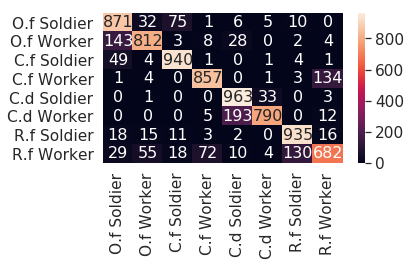

runtime :  471.0682682991028

[3] accuracy: 0.882 loss: 44.671

[0.815, 0.85625, 0.88175]
[64.11414223909378, 49.904711842536926, 44.67099912464619]


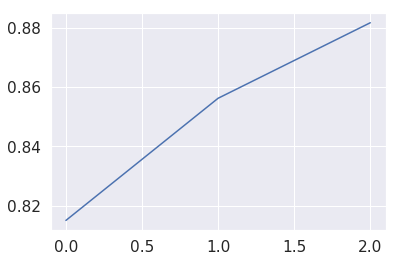

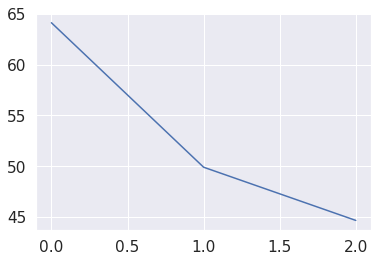

[4, 7, 7, 3, 6, 6, 2, 1, 6, 4, 1, 6, 5, 0, 7, 4, 6, 3, 0, 0, 2, 2, 1, 4, 6, 4, 0, 0, 2, 7, 0, 0, 3, 0, 6, 0, 7, 0, 6, 0, 7, 2, 7, 6, 0, 7, 7, 0, 1, 7, 7, 6, 3, 6, 4, 7, 0, 6, 7, 2, 4, 7, 7, 4, 4, 7, 1, 1, 7, 0, 0, 4, 4, 3, 4, 7, 0, 3, 7, 5, 6, 5, 2, 0, 5, 0, 0, 0, 5, 6, 6, 7, 0, 5, 3, 0, 0, 5, 7, 4, 6, 7, 4, 3, 2, 6, 3, 0, 1, 0, 0, 0, 6, 5, 7, 0, 4, 4, 7, 7, 4, 4, 1, 6, 6, 6, 2, 7, 1, 6, 4, 5, 0, 7, 7, 3, 0, 4, 6, 0, 0, 6, 2, 3, 4, 4, 0, 4, 2, 5, 2, 4, 4, 3, 0, 2, 6, 3, 7, 6, 7, 7, 0, 7, 4, 0, 1, 6, 0, 3, 5, 1, 1, 7, 6, 7, 4, 3, 2, 1, 3, 2, 3, 4, 1, 7, 4, 0, 4, 6, 0, 4, 1, 3, 7, 7, 3, 6, 1, 5, 6, 7, 0, 3, 0, 0, 3, 2, 7, 7, 6, 5, 7, 0, 6, 7, 0, 0, 0, 7, 0, 3, 6, 4, 6, 2, 0, 0, 6, 0, 0, 4, 7, 7, 3, 4, 6, 0, 3, 7, 6, 4, 7, 4, 1, 3, 6, 7, 4, 2, 0, 4, 7, 2, 6, 0, 4, 3, 6, 1, 0, 2, 1, 4, 7, 2, 0, 4, 1, 4, 3, 7, 0, 4, 7, 4, 2, 4, 2, 4, 6, 4, 6, 6, 0, 1, 1, 6, 7, 0, 2, 1, 5, 5, 7, 0, 0, 0, 6, 0, 1, 1, 1, 0, 3, 0, 7, 0, 4, 4, 4, 1, 1, 4, 6, 0, 1, 0, 3, 3, 6, 4, 6, 7, 3, 3, 0, 0, 3, 6, 0, 1, 4, 

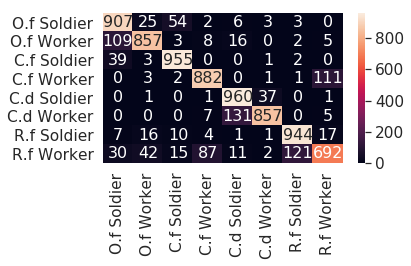

runtime :  706.2732663154602

[4] accuracy: 0.886 loss: 41.612

[0.815, 0.85625, 0.88175, 0.886375]
[64.11414223909378, 49.904711842536926, 44.67099912464619, 41.61231115460396]


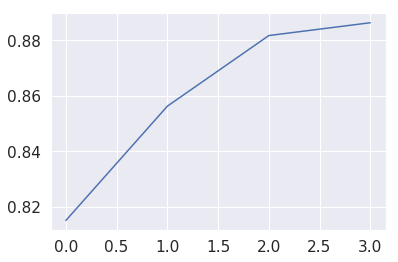

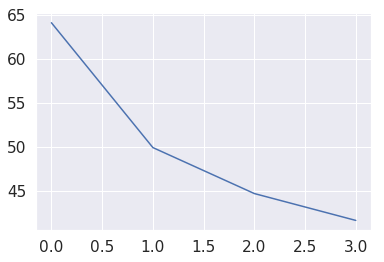

[7, 3, 7, 4, 6, 7, 0, 3, 3, 0, 0, 0, 3, 7, 0, 4, 2, 0, 1, 6, 1, 7, 6, 4, 3, 0, 3, 7, 4, 3, 6, 0, 7, 7, 7, 6, 3, 2, 0, 4, 2, 6, 3, 5, 0, 7, 3, 0, 4, 7, 2, 4, 6, 0, 6, 0, 7, 7, 0, 3, 2, 1, 3, 0, 7, 2, 3, 6, 6, 2, 1, 2, 0, 6, 1, 3, 4, 2, 5, 1, 4, 4, 0, 2, 6, 7, 4, 2, 5, 7, 3, 6, 7, 1, 7, 3, 7, 1, 4, 2, 7, 5, 2, 1, 0, 6, 7, 4, 0, 7, 0, 7, 6, 4, 3, 0, 4, 0, 4, 5, 3, 5, 7, 6, 1, 4, 0, 4, 2, 0, 7, 5, 5, 4, 6, 6, 4, 0, 6, 0, 4, 6, 1, 0, 4, 7, 2, 3, 3, 6, 1, 4, 4, 6, 7, 4, 6, 0, 4, 6, 3, 4, 3, 1, 3, 6, 3, 6, 0, 4, 7, 1, 3, 0, 4, 0, 1, 4, 4, 2, 7, 7, 6, 2, 2, 3, 1, 6, 2, 4, 5, 4, 4, 1, 6, 3, 7, 2, 4, 0, 5, 2, 4, 6, 1, 0, 0, 6, 5, 4, 4, 7, 3, 4, 4, 6, 4, 4, 0, 3, 4, 3, 3, 4, 0, 3, 2, 5, 0, 6, 1, 0, 0, 7, 7, 5, 1, 3, 7, 0, 6, 4, 6, 4, 5, 7, 1, 6, 6, 0, 0, 5, 4, 2, 0, 3, 3, 4, 4, 2, 0, 7, 0, 0, 4, 4, 4, 7, 0, 7, 5, 6, 3, 3, 0, 4, 4, 3, 4, 4, 6, 7, 1, 0, 1, 0, 0, 1, 6, 5, 1, 0, 0, 1, 3, 6, 3, 6, 7, 6, 4, 5, 1, 7, 0, 7, 4, 0, 2, 7, 1, 4, 6, 2, 6, 3, 4, 2, 1, 4, 6, 4, 3, 4, 3, 7, 3, 7, 0, 7, 1, 4, 6, 

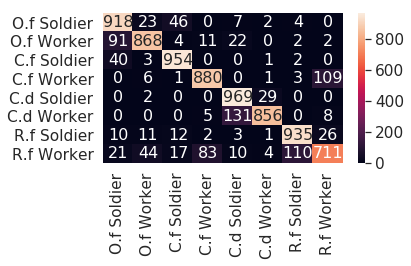

runtime :  941.9565358161926

[5] accuracy: 0.893 loss: 41.263

[0.815, 0.85625, 0.88175, 0.886375, 0.89325]
[64.11414223909378, 49.904711842536926, 44.67099912464619, 41.61231115460396, 41.263010531663895]


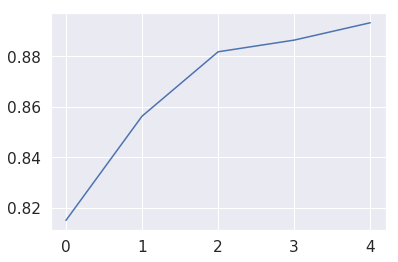

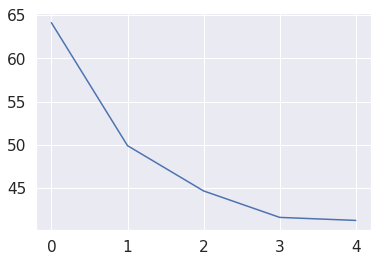

[7, 7, 6, 7, 7, 1, 5, 6, 0, 4, 7, 7, 3, 3, 5, 3, 1, 6, 1, 7, 3, 4, 4, 4, 5, 2, 2, 7, 0, 5, 3, 6, 3, 0, 3, 7, 0, 4, 0, 6, 7, 0, 5, 4, 0, 0, 1, 7, 6, 6, 1, 4, 0, 7, 6, 3, 5, 7, 0, 6, 7, 1, 4, 2, 2, 6, 4, 7, 3, 3, 4, 4, 1, 6, 4, 6, 0, 7, 0, 1, 7, 7, 7, 1, 1, 4, 1, 3, 0, 7, 4, 4, 0, 6, 7, 1, 6, 7, 4, 6, 6, 6, 3, 6, 0, 1, 1, 3, 4, 6, 1, 5, 7, 0, 0, 4, 4, 7, 3, 7, 0, 4, 4, 4, 4, 2, 2, 2, 0, 3, 2, 2, 6, 0, 6, 6, 0, 3, 4, 7, 0, 7, 3, 3, 0, 0, 2, 4, 4, 1, 6, 2, 4, 1, 3, 1, 4, 4, 2, 7, 6, 2, 4, 0, 6, 6, 0, 0, 6, 6, 1, 7, 0, 5, 0, 1, 4, 6, 4, 0, 6, 7, 1, 2, 3, 4, 0, 3, 1, 5, 4, 6, 0, 3, 7, 6, 2, 0, 2, 2, 7, 0, 7, 7, 0, 7, 0, 0, 0, 6, 0, 5, 3, 0, 7, 1, 0, 7, 3, 4, 4, 0, 3, 6, 0, 3, 3, 2, 5, 0, 7, 4, 1, 0, 4, 7, 7, 0, 6, 1, 3, 1, 4, 1, 0, 0, 4, 4, 6, 3, 7, 0, 4, 0, 6, 3, 3, 1, 4, 2, 1, 5, 3, 3, 0, 6, 2, 1, 7, 5, 5, 0, 3, 2, 1, 4, 7, 3, 4, 2, 7, 7, 1, 0, 5, 0, 5, 0, 0, 5, 4, 3, 5, 3, 3, 1, 0, 6, 3, 0, 4, 0, 4, 3, 7, 4, 7, 6, 0, 2, 6, 0, 0, 4, 4, 0, 6, 2, 3, 4, 0, 7, 2, 4, 2, 4, 2, 7, 4, 4, 7, 6, 7, 

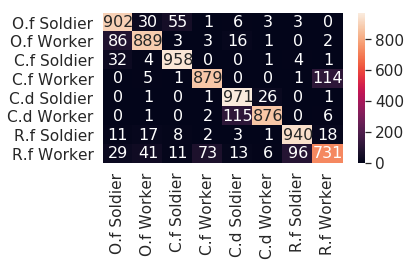

runtime :  1177.8217141628265

[6] accuracy: 0.899 loss: 39.302

[0.815, 0.85625, 0.88175, 0.886375, 0.89325, 0.899125]
[64.11414223909378, 49.904711842536926, 44.67099912464619, 41.61231115460396, 41.263010531663895, 39.30233183503151]


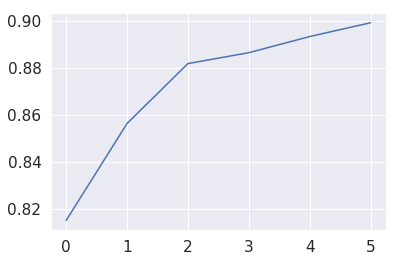

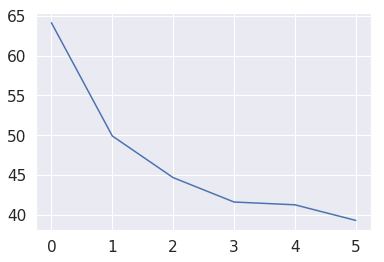

[0, 5, 7, 1, 3, 7, 6, 7, 4, 0, 2, 6, 1, 3, 1, 6, 6, 6, 7, 4, 0, 6, 1, 1, 2, 7, 3, 3, 0, 0, 0, 0, 1, 3, 4, 0, 0, 5, 4, 3, 4, 1, 2, 7, 0, 2, 0, 6, 6, 7, 0, 6, 6, 6, 4, 4, 3, 0, 6, 7, 1, 6, 2, 1, 0, 0, 3, 3, 7, 4, 3, 7, 0, 6, 3, 2, 6, 0, 4, 4, 7, 2, 0, 4, 1, 3, 0, 2, 3, 4, 3, 3, 0, 0, 6, 3, 7, 1, 1, 1, 7, 7, 3, 6, 7, 4, 7, 6, 0, 1, 4, 1, 4, 7, 7, 3, 4, 4, 1, 5, 4, 3, 6, 0, 1, 3, 1, 6, 7, 3, 0, 3, 4, 7, 6, 2, 7, 0, 6, 5, 6, 3, 4, 3, 4, 4, 0, 2, 6, 6, 5, 7, 7, 1, 3, 3, 4, 3, 4, 1, 1, 2, 6, 0, 1, 0, 5, 6, 2, 4, 0, 6, 0, 4, 0, 6, 0, 6, 6, 0, 3, 5, 7, 0, 4, 6, 1, 3, 7, 1, 2, 4, 7, 3, 6, 7, 6, 6, 0, 4, 7, 7, 6, 6, 2, 4, 1, 7, 0, 7, 4, 4, 7, 5, 4, 0, 2, 4, 0, 1, 0, 7, 3, 4, 3, 0, 0, 1, 4, 1, 5, 7, 7, 6, 7, 1, 3, 4, 0, 1, 7, 5, 0, 1, 3, 2, 6, 1, 4, 7, 6, 6, 0, 7, 6, 6, 2, 6, 4, 7, 1, 6, 4, 2, 3, 6, 6, 2, 1, 7, 2, 2, 7, 0, 3, 2, 6, 0, 7, 4, 3, 1, 6, 4, 0, 0, 2, 1, 4, 0, 6, 3, 6, 4, 0, 7, 1, 0, 6, 7, 1, 4, 1, 4, 4, 5, 7, 6, 2, 3, 4, 7, 3, 1, 4, 4, 4, 3, 2, 4, 4, 7, 6, 6, 5, 4, 2, 6, 1, 4, 2, 2, 4, 

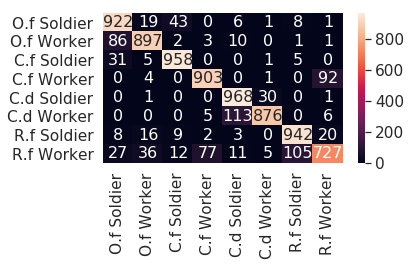

runtime :  1411.4617037773132

[7] accuracy: 0.902 loss: 38.276

[0.815, 0.85625, 0.88175, 0.886375, 0.89325, 0.899125, 0.902]
[64.11414223909378, 49.904711842536926, 44.67099912464619, 41.61231115460396, 41.263010531663895, 39.30233183503151, 38.275576405227184]


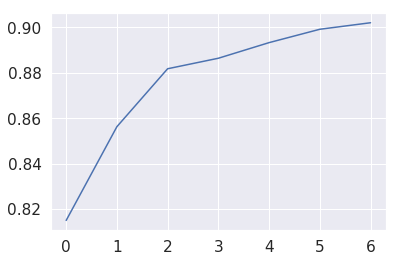

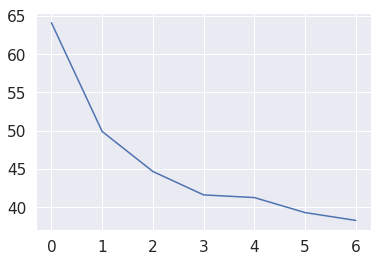

[4, 1, 6, 6, 7, 7, 0, 4, 4, 7, 4, 2, 4, 2, 3, 3, 5, 4, 6, 4, 6, 0, 6, 4, 7, 1, 5, 4, 3, 7, 4, 7, 4, 1, 7, 1, 2, 6, 4, 5, 0, 4, 6, 0, 5, 7, 2, 3, 4, 6, 1, 1, 1, 0, 6, 3, 4, 7, 2, 0, 6, 0, 2, 3, 7, 7, 0, 0, 3, 3, 7, 3, 3, 2, 1, 0, 3, 7, 3, 6, 7, 4, 6, 0, 3, 1, 6, 3, 1, 4, 0, 2, 4, 6, 0, 2, 0, 0, 3, 6, 7, 0, 3, 1, 7, 6, 3, 0, 3, 6, 0, 1, 7, 4, 2, 6, 7, 2, 3, 4, 4, 5, 4, 0, 7, 0, 0, 4, 4, 2, 0, 1, 6, 0, 1, 0, 1, 4, 1, 0, 6, 4, 2, 3, 4, 2, 7, 1, 3, 2, 2, 0, 2, 0, 5, 0, 1, 1, 0, 7, 4, 4, 1, 6, 2, 7, 6, 7, 3, 0, 4, 3, 4, 3, 0, 0, 3, 7, 7, 7, 0, 4, 4, 7, 1, 2, 3, 3, 5, 0, 4, 3, 0, 4, 0, 0, 4, 2, 7, 3, 4, 0, 4, 5, 6, 7, 4, 4, 6, 6, 0, 4, 0, 2, 3, 4, 1, 6, 4, 6, 3, 6, 2, 3, 1, 4, 7, 0, 6, 4, 2, 2, 0, 1, 0, 6, 4, 2, 2, 1, 1, 4, 1, 7, 0, 0, 4, 6, 0, 7, 3, 3, 0, 4, 0, 7, 0, 4, 7, 7, 4, 0, 1, 5, 0, 7, 4, 0, 7, 4, 6, 7, 1, 6, 3, 0, 4, 0, 0, 7, 7, 0, 0, 7, 7, 0, 0, 0, 3, 2, 3, 5, 5, 4, 7, 2, 6, 2, 2, 3, 0, 6, 4, 0, 0, 1, 5, 7, 0, 7, 3, 2, 1, 0, 7, 4, 4, 7, 0, 0, 6, 5, 0, 7, 0, 2, 4, 6, 1, 7, 1, 6, 7, 

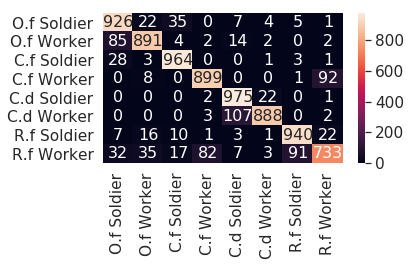

runtime :  1645.6368200778961

[8] accuracy: 0.905 loss: 37.626

[0.815, 0.85625, 0.88175, 0.886375, 0.89325, 0.899125, 0.902, 0.905]
[64.11414223909378, 49.904711842536926, 44.67099912464619, 41.61231115460396, 41.263010531663895, 39.30233183503151, 38.275576405227184, 37.62644839286804]


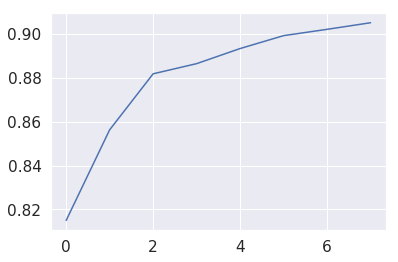

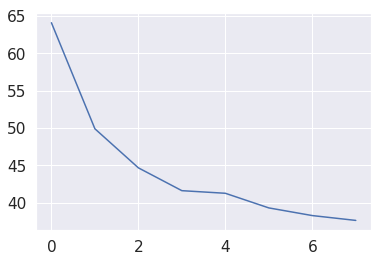

[1, 4, 4, 6, 0, 0, 3, 2, 1, 2, 4, 6, 0, 4, 0, 1, 2, 4, 7, 4, 6, 0, 0, 0, 4, 6, 4, 3, 7, 0, 0, 7, 5, 3, 2, 4, 2, 3, 1, 0, 5, 6, 7, 7, 4, 0, 0, 7, 4, 0, 7, 0, 0, 2, 7, 6, 0, 3, 0, 4, 4, 3, 3, 6, 6, 7, 6, 4, 6, 0, 4, 4, 4, 6, 3, 2, 4, 2, 6, 5, 1, 1, 6, 7, 7, 0, 4, 0, 6, 6, 7, 1, 5, 7, 3, 5, 4, 4, 3, 7, 4, 3, 1, 2, 4, 4, 4, 7, 2, 5, 0, 1, 7, 5, 1, 1, 2, 1, 1, 0, 4, 0, 4, 2, 6, 2, 0, 2, 6, 0, 3, 7, 6, 1, 7, 2, 1, 7, 2, 3, 3, 0, 2, 0, 1, 5, 6, 4, 3, 3, 2, 0, 0, 0, 6, 7, 3, 1, 4, 5, 3, 7, 2, 2, 0, 6, 6, 4, 3, 4, 2, 6, 4, 4, 0, 4, 0, 4, 6, 7, 7, 0, 1, 3, 6, 0, 4, 4, 6, 7, 7, 7, 1, 0, 3, 4, 6, 0, 4, 4, 2, 7, 4, 2, 5, 7, 4, 7, 0, 2, 0, 7, 0, 0, 5, 7, 0, 6, 4, 0, 4, 3, 1, 0, 1, 5, 0, 6, 0, 0, 1, 1, 4, 4, 4, 0, 0, 1, 0, 6, 4, 4, 7, 3, 3, 3, 6, 5, 7, 0, 1, 3, 7, 2, 4, 5, 4, 3, 4, 4, 3, 6, 2, 6, 6, 4, 4, 3, 6, 7, 2, 2, 2, 0, 0, 6, 6, 5, 6, 6, 4, 2, 7, 3, 0, 6, 0, 1, 3, 1, 1, 5, 3, 4, 7, 4, 0, 6, 3, 4, 7, 2, 7, 3, 4, 4, 0, 3, 4, 7, 7, 1, 2, 0, 3, 1, 7, 2, 2, 7, 4, 0, 7, 6, 2, 3, 0, 0, 1, 4, 7, 7, 4, 

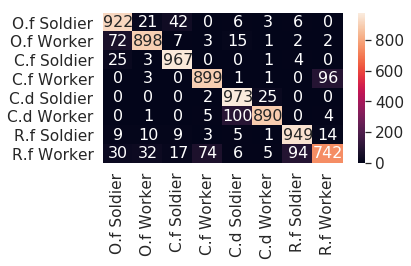

runtime :  1878.0931882858276

[9] accuracy: 0.906 loss: 37.150

[0.815, 0.85625, 0.88175, 0.886375, 0.89325, 0.899125, 0.902, 0.905, 0.90625]
[64.11414223909378, 49.904711842536926, 44.67099912464619, 41.61231115460396, 41.263010531663895, 39.30233183503151, 38.275576405227184, 37.62644839286804, 37.14999883621931]


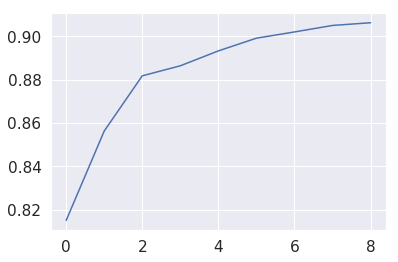

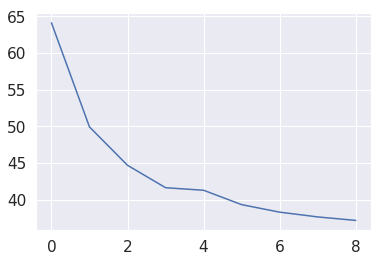

[7, 2, 0, 4, 2, 6, 4, 2, 6, 3, 7, 1, 7, 5, 0, 6, 7, 7, 6, 7, 3, 2, 4, 7, 5, 6, 0, 7, 6, 3, 4, 3, 2, 5, 4, 0, 0, 4, 0, 3, 1, 0, 7, 7, 7, 1, 7, 0, 6, 6, 6, 4, 3, 7, 4, 0, 6, 7, 6, 6, 1, 1, 4, 7, 4, 5, 6, 3, 6, 0, 0, 0, 3, 4, 1, 6, 0, 2, 7, 6, 6, 3, 1, 3, 0, 0, 1, 1, 6, 1, 1, 2, 1, 0, 1, 2, 0, 0, 6, 1, 7, 0, 3, 6, 2, 2, 6, 7, 4, 7, 1, 3, 7, 1, 4, 7, 1, 4, 3, 3, 0, 4, 4, 6, 7, 5, 1, 4, 0, 2, 7, 1, 7, 4, 4, 1, 3, 4, 4, 7, 4, 2, 4, 3, 3, 0, 1, 3, 0, 0, 4, 4, 0, 4, 3, 3, 1, 6, 4, 3, 2, 3, 0, 6, 3, 6, 0, 4, 6, 6, 7, 6, 0, 0, 2, 5, 3, 4, 7, 4, 4, 7, 0, 7, 4, 7, 6, 2, 3, 5, 4, 4, 3, 0, 6, 2, 0, 4, 6, 6, 0, 4, 0, 0, 0, 6, 7, 7, 4, 7, 2, 4, 5, 4, 4, 3, 3, 4, 6, 2, 0, 0, 0, 1, 0, 2, 2, 6, 7, 3, 3, 0, 6, 2, 6, 6, 6, 1, 4, 7, 3, 2, 1, 0, 0, 4, 4, 1, 3, 4, 0, 3, 5, 4, 4, 3, 1, 7, 4, 0, 0, 4, 1, 3, 0, 1, 6, 7, 6, 2, 7, 4, 7, 5, 0, 4, 0, 4, 1, 0, 7, 2, 1, 2, 7, 7, 7, 1, 0, 6, 0, 6, 3, 6, 4, 7, 7, 6, 6, 7, 0, 3, 0, 0, 5, 3, 6, 7, 1, 7, 7, 6, 7, 0, 1, 6, 5, 3, 3, 4, 6, 0, 0, 7, 4, 7, 4, 4, 2, 4, 4, 4, 2, 

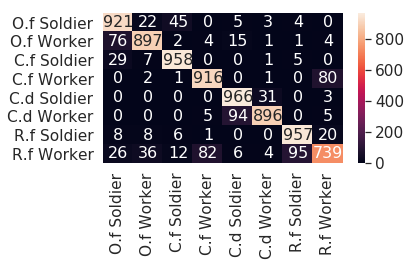

runtime :  2112.5508670806885

[10] accuracy: 0.908 loss: 37.157

[0.815, 0.85625, 0.88175, 0.886375, 0.89325, 0.899125, 0.902, 0.905, 0.90625, 0.907875]
[64.11414223909378, 49.904711842536926, 44.67099912464619, 41.61231115460396, 41.263010531663895, 39.30233183503151, 38.275576405227184, 37.62644839286804, 37.14999883621931, 37.15717602521181]


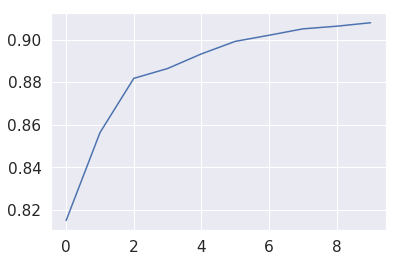

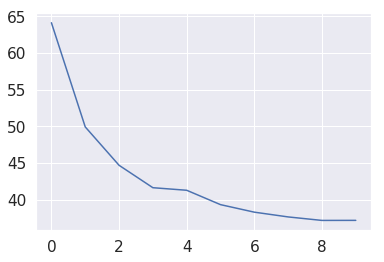

[2, 2, 4, 6, 4, 3, 3, 0, 3, 4, 3, 7, 6, 6, 6, 0, 4, 4, 5, 1, 6, 0, 6, 1, 1, 4, 7, 6, 6, 4, 1, 4, 3, 0, 3, 5, 2, 4, 7, 6, 4, 3, 5, 0, 6, 3, 1, 5, 1, 6, 4, 0, 4, 3, 6, 0, 6, 3, 4, 5, 7, 1, 4, 6, 0, 0, 3, 4, 6, 7, 7, 3, 1, 5, 2, 6, 6, 4, 7, 3, 0, 7, 0, 3, 0, 3, 0, 2, 6, 7, 4, 3, 0, 3, 4, 0, 6, 0, 2, 3, 4, 4, 2, 7, 2, 3, 1, 6, 2, 0, 3, 2, 0, 3, 2, 4, 0, 7, 2, 1, 0, 3, 0, 6, 0, 6, 1, 1, 5, 5, 4, 6, 1, 4, 7, 2, 4, 1, 7, 1, 6, 6, 7, 6, 4, 4, 0, 0, 1, 6, 7, 2, 7, 1, 2, 5, 2, 1, 4, 6, 0, 5, 6, 3, 2, 4, 6, 3, 1, 4, 4, 7, 4, 6, 0, 7, 3, 3, 0, 0, 2, 7, 0, 5, 4, 0, 0, 1, 4, 0, 4, 6, 7, 6, 3, 7, 4, 2, 3, 4, 6, 6, 4, 6, 2, 2, 3, 5, 4, 1, 7, 1, 7, 0, 4, 6, 1, 7, 0, 2, 0, 3, 4, 1, 0, 2, 2, 4, 6, 7, 1, 6, 6, 0, 7, 2, 7, 6, 1, 5, 0, 4, 0, 3, 5, 2, 2, 0, 6, 0, 7, 0, 2, 2, 4, 6, 6, 0, 0, 0, 6, 4, 1, 3, 1, 7, 6, 0, 5, 2, 7, 0, 6, 7, 0, 6, 6, 2, 7, 1, 1, 0, 6, 6, 2, 6, 7, 3, 4, 7, 2, 3, 2, 7, 0, 7, 4, 4, 0, 4, 1, 7, 7, 2, 7, 0, 6, 7, 0, 4, 4, 0, 7, 0, 6, 7, 1, 7, 1, 6, 7, 6, 6, 2, 2, 2, 0, 4, 3, 3, 6, 4, 4, 

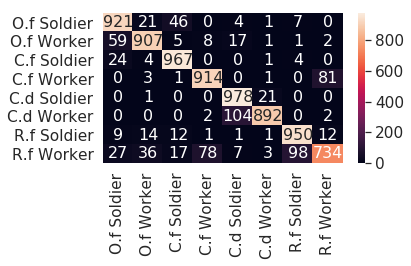

runtime :  2347.8939430713654

[11] accuracy: 0.906 loss: 38.370

[0.815, 0.85625, 0.88175, 0.886375, 0.89325, 0.899125, 0.902, 0.905, 0.90625, 0.907875, 0.90575]
[64.11414223909378, 49.904711842536926, 44.67099912464619, 41.61231115460396, 41.263010531663895, 39.30233183503151, 38.275576405227184, 37.62644839286804, 37.14999883621931, 37.15717602521181, 38.36975885927677]


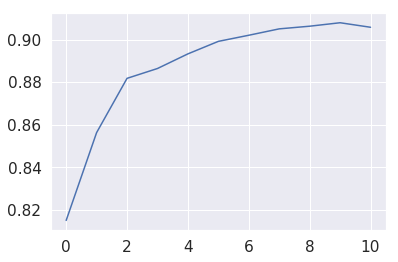

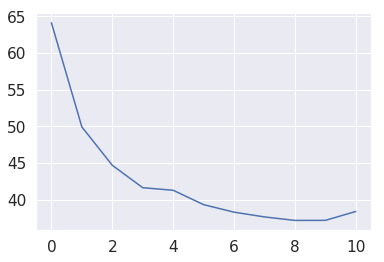

[6, 0, 6, 7, 4, 2, 4, 4, 3, 4, 4, 0, 5, 7, 1, 3, 6, 7, 6, 0, 6, 1, 6, 2, 0, 1, 7, 6, 3, 0, 7, 7, 4, 6, 7, 3, 1, 1, 4, 4, 5, 4, 3, 6, 4, 4, 0, 4, 2, 0, 0, 7, 6, 4, 7, 4, 1, 1, 6, 0, 6, 2, 6, 7, 6, 0, 0, 0, 4, 4, 7, 7, 7, 4, 3, 3, 1, 0, 6, 0, 4, 2, 4, 2, 3, 0, 0, 6, 0, 2, 2, 3, 0, 0, 4, 4, 0, 5, 6, 7, 1, 4, 6, 4, 6, 0, 3, 2, 4, 4, 0, 6, 6, 7, 7, 1, 0, 5, 0, 7, 4, 0, 3, 6, 3, 0, 5, 7, 7, 5, 7, 2, 4, 4, 7, 5, 6, 2, 5, 6, 7, 6, 5, 1, 0, 4, 4, 0, 7, 1, 7, 3, 4, 3, 2, 4, 3, 6, 7, 3, 6, 3, 6, 0, 6, 7, 4, 7, 5, 7, 2, 4, 1, 3, 0, 3, 2, 4, 7, 6, 3, 0, 5, 0, 4, 6, 0, 4, 6, 3, 1, 6, 0, 3, 5, 4, 2, 4, 6, 0, 0, 7, 4, 7, 6, 2, 4, 2, 5, 6, 3, 1, 0, 3, 6, 4, 1, 0, 4, 3, 7, 2, 6, 1, 0, 0, 4, 7, 0, 6, 2, 7, 0, 1, 7, 1, 4, 6, 3, 0, 1, 4, 2, 0, 7, 6, 7, 7, 7, 6, 2, 4, 5, 3, 6, 6, 6, 2, 3, 2, 0, 0, 7, 1, 0, 4, 6, 2, 0, 2, 7, 7, 0, 1, 6, 3, 3, 1, 6, 6, 2, 6, 5, 5, 6, 0, 0, 0, 7, 1, 3, 0, 4, 2, 6, 3, 0, 1, 0, 7, 3, 4, 0, 6, 1, 7, 0, 7, 6, 6, 6, 3, 2, 7, 1, 4, 4, 5, 3, 1, 0, 4, 1, 3, 1, 7, 4, 7, 6, 3, 4, 3, 2, 

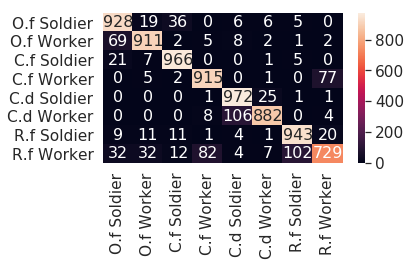

runtime :  2582.2039365768433

[12] accuracy: 0.910 loss: 38.006

[0.815, 0.85625, 0.88175, 0.886375, 0.89325, 0.899125, 0.902, 0.905, 0.90625, 0.907875, 0.90575, 0.910125]
[64.11414223909378, 49.904711842536926, 44.67099912464619, 41.61231115460396, 41.263010531663895, 39.30233183503151, 38.275576405227184, 37.62644839286804, 37.14999883621931, 37.15717602521181, 38.36975885927677, 38.00613395869732]


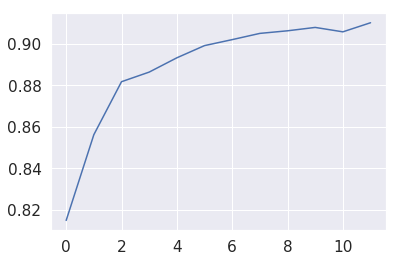

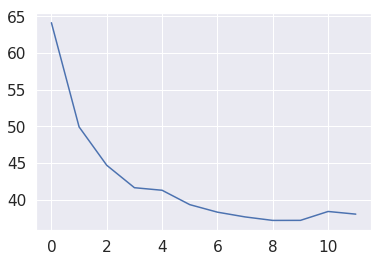

[4, 0, 3, 3, 4, 7, 4, 2, 6, 0, 7, 1, 4, 7, 0, 2, 6, 2, 4, 6, 7, 0, 7, 1, 1, 6, 6, 2, 4, 7, 2, 7, 0, 4, 7, 0, 6, 1, 2, 4, 4, 3, 2, 6, 4, 3, 4, 0, 4, 6, 7, 6, 4, 7, 3, 4, 2, 7, 5, 6, 2, 0, 0, 0, 5, 0, 4, 1, 1, 0, 0, 3, 6, 1, 4, 6, 6, 1, 1, 0, 3, 6, 4, 0, 4, 0, 7, 4, 2, 2, 7, 4, 7, 4, 5, 7, 3, 3, 6, 0, 7, 1, 1, 6, 3, 4, 0, 6, 3, 4, 6, 7, 0, 7, 4, 1, 4, 6, 0, 6, 6, 2, 4, 0, 1, 7, 4, 5, 1, 5, 0, 2, 1, 0, 4, 6, 3, 4, 5, 1, 7, 1, 1, 0, 6, 3, 0, 4, 6, 4, 6, 3, 6, 0, 0, 7, 0, 4, 1, 5, 4, 2, 3, 2, 7, 3, 5, 0, 7, 1, 2, 5, 7, 5, 0, 7, 4, 6, 0, 6, 3, 0, 4, 4, 4, 3, 1, 4, 4, 0, 0, 6, 7, 7, 1, 4, 4, 2, 1, 3, 0, 0, 0, 6, 0, 4, 0, 4, 3, 7, 4, 2, 7, 2, 5, 7, 2, 2, 6, 0, 6, 4, 3, 2, 2, 5, 0, 0, 0, 4, 0, 2, 7, 4, 6, 4, 3, 0, 3, 7, 0, 7, 7, 6, 3, 2, 7, 6, 0, 7, 6, 7, 2, 4, 1, 7, 2, 0, 0, 1, 6, 2, 5, 5, 6, 7, 5, 5, 0, 6, 4, 0, 0, 6, 6, 4, 0, 2, 6, 1, 2, 0, 4, 4, 0, 0, 6, 6, 3, 7, 0, 2, 6, 7, 1, 3, 1, 6, 2, 6, 0, 6, 3, 7, 6, 4, 3, 7, 6, 7, 4, 2, 7, 7, 2, 4, 4, 4, 4, 0, 6, 0, 1, 4, 4, 4, 7, 6, 3, 3, 0, 3, 6, 

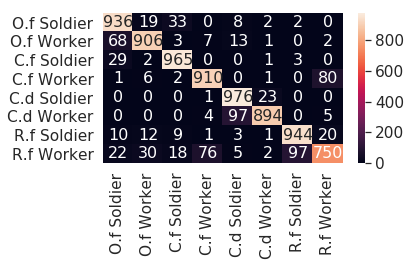

runtime :  2814.8475120067596

[13] accuracy: 0.909 loss: 37.109

[0.815, 0.85625, 0.88175, 0.886375, 0.89325, 0.899125, 0.902, 0.905, 0.90625, 0.907875, 0.90575, 0.910125, 0.909375]
[64.11414223909378, 49.904711842536926, 44.67099912464619, 41.61231115460396, 41.263010531663895, 39.30233183503151, 38.275576405227184, 37.62644839286804, 37.14999883621931, 37.15717602521181, 38.36975885927677, 38.00613395869732, 37.108960159122944]


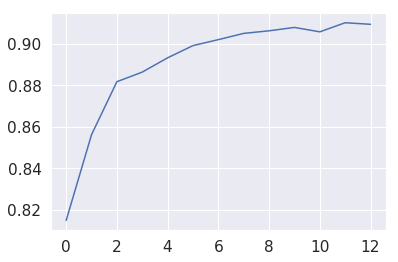

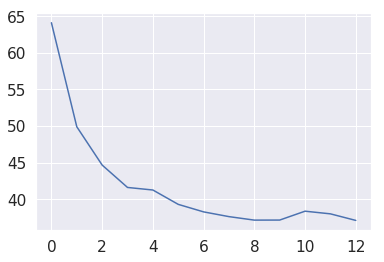

[7, 0, 3, 1, 0, 1, 5, 0, 3, 7, 7, 2, 5, 2, 1, 1, 0, 4, 0, 0, 4, 0, 4, 6, 6, 0, 7, 4, 3, 7, 6, 6, 6, 3, 3, 4, 4, 6, 0, 0, 6, 6, 1, 7, 3, 7, 0, 3, 4, 1, 4, 6, 2, 4, 0, 3, 0, 3, 7, 3, 6, 6, 7, 3, 1, 3, 7, 0, 7, 4, 7, 6, 7, 5, 4, 3, 6, 3, 6, 7, 2, 3, 0, 6, 4, 1, 6, 5, 3, 3, 5, 7, 0, 6, 3, 1, 4, 6, 7, 1, 0, 3, 7, 6, 1, 7, 4, 1, 7, 0, 6, 4, 3, 7, 3, 0, 7, 7, 1, 4, 7, 1, 4, 1, 2, 1, 3, 2, 2, 0, 4, 0, 7, 7, 6, 2, 0, 7, 7, 4, 3, 6, 6, 0, 0, 4, 1, 7, 0, 7, 7, 4, 4, 5, 6, 7, 6, 0, 5, 0, 4, 7, 2, 2, 0, 4, 3, 2, 1, 6, 7, 1, 3, 6, 1, 6, 7, 6, 1, 0, 0, 6, 3, 2, 3, 5, 5, 4, 4, 4, 2, 6, 0, 1, 0, 4, 4, 7, 3, 2, 6, 5, 0, 0, 4, 2, 1, 7, 4, 6, 2, 5, 6, 4, 6, 7, 7, 0, 4, 1, 3, 3, 3, 4, 3, 0, 1, 4, 0, 3, 6, 4, 4, 6, 6, 7, 4, 1, 1, 7, 0, 2, 1, 7, 0, 6, 1, 4, 3, 0, 6, 4, 0, 3, 0, 4, 7, 4, 4, 0, 7, 0, 2, 0, 1, 7, 3, 4, 7, 0, 4, 4, 6, 2, 3, 3, 0, 4, 6, 4, 2, 4, 0, 7, 5, 6, 7, 4, 1, 7, 0, 6, 4, 1, 0, 0, 4, 5, 0, 2, 6, 4, 3, 6, 3, 2, 1, 4, 6, 3, 4, 0, 3, 7, 3, 0, 0, 4, 6, 7, 2, 4, 4, 0, 3, 6, 6, 1, 0, 1, 4, 7, 1, 

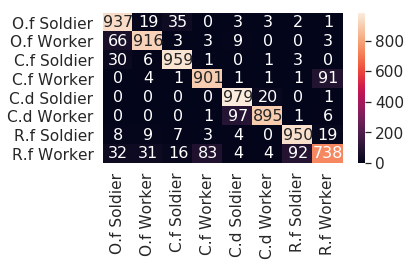

runtime :  3047.7001147270203

[14] accuracy: 0.911 loss: 37.270

[0.815, 0.85625, 0.88175, 0.886375, 0.89325, 0.899125, 0.902, 0.905, 0.90625, 0.907875, 0.90575, 0.910125, 0.909375, 0.911]
[64.11414223909378, 49.904711842536926, 44.67099912464619, 41.61231115460396, 41.263010531663895, 39.30233183503151, 38.275576405227184, 37.62644839286804, 37.14999883621931, 37.15717602521181, 38.36975885927677, 38.00613395869732, 37.108960159122944, 37.26954859495163]


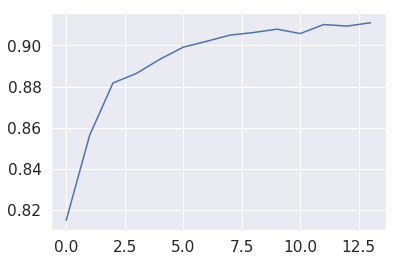

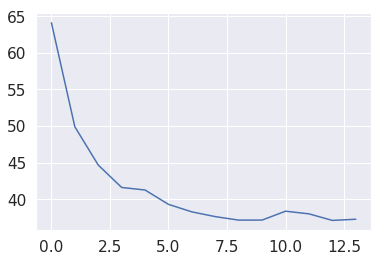

[7, 0, 7, 4, 1, 5, 5, 7, 0, 2, 1, 7, 0, 3, 0, 5, 0, 4, 6, 0, 7, 3, 4, 4, 3, 6, 7, 0, 6, 1, 6, 1, 4, 2, 2, 3, 7, 3, 4, 4, 1, 4, 0, 2, 7, 4, 2, 2, 4, 5, 6, 4, 0, 7, 6, 7, 2, 4, 7, 6, 6, 7, 4, 5, 6, 7, 4, 4, 2, 1, 7, 3, 0, 6, 6, 6, 3, 7, 0, 1, 1, 4, 2, 7, 7, 2, 4, 2, 1, 2, 6, 6, 0, 7, 2, 7, 0, 7, 4, 3, 2, 0, 4, 3, 6, 1, 4, 2, 3, 6, 0, 4, 7, 4, 6, 4, 0, 6, 5, 3, 2, 2, 1, 3, 6, 4, 0, 2, 1, 4, 6, 5, 0, 0, 4, 3, 0, 2, 6, 1, 4, 1, 6, 6, 1, 2, 1, 0, 3, 1, 5, 4, 7, 3, 7, 0, 3, 3, 0, 4, 6, 4, 6, 5, 1, 6, 1, 1, 4, 0, 6, 3, 4, 4, 6, 6, 5, 4, 2, 0, 6, 4, 6, 7, 1, 2, 0, 1, 6, 4, 3, 5, 7, 7, 3, 1, 5, 0, 0, 1, 1, 2, 3, 2, 0, 5, 0, 5, 0, 7, 0, 0, 3, 4, 4, 7, 3, 1, 2, 0, 2, 3, 7, 4, 4, 4, 6, 1, 6, 0, 6, 4, 7, 1, 7, 6, 1, 0, 1, 4, 4, 0, 7, 3, 3, 1, 2, 1, 1, 4, 5, 2, 0, 7, 0, 6, 0, 3, 1, 5, 0, 0, 6, 0, 4, 0, 1, 4, 4, 3, 0, 4, 6, 6, 6, 7, 4, 4, 0, 1, 3, 2, 0, 7, 7, 4, 7, 2, 7, 4, 6, 7, 4, 3, 4, 3, 1, 7, 6, 0, 1, 1, 6, 4, 0, 7, 7, 6, 1, 4, 3, 7, 3, 0, 7, 0, 1, 2, 3, 0, 0, 6, 4, 3, 0, 3, 6, 0, 3, 0, 6, 0, 6, 

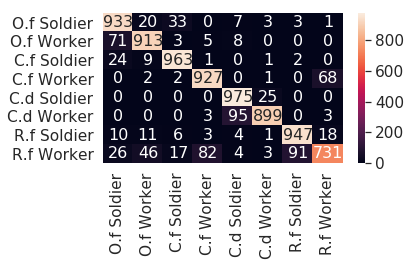

runtime :  3285.5868825912476

[15] accuracy: 0.909 loss: 37.774

[0.815, 0.85625, 0.88175, 0.886375, 0.89325, 0.899125, 0.902, 0.905, 0.90625, 0.907875, 0.90575, 0.910125, 0.909375, 0.911, 0.90925]
[64.11414223909378, 49.904711842536926, 44.67099912464619, 41.61231115460396, 41.263010531663895, 39.30233183503151, 38.275576405227184, 37.62644839286804, 37.14999883621931, 37.15717602521181, 38.36975885927677, 38.00613395869732, 37.108960159122944, 37.26954859495163, 37.773814633488655]


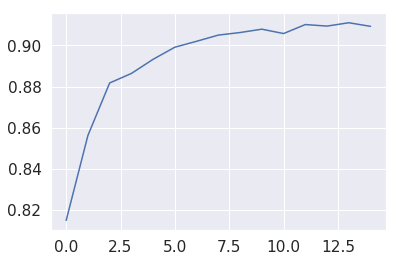

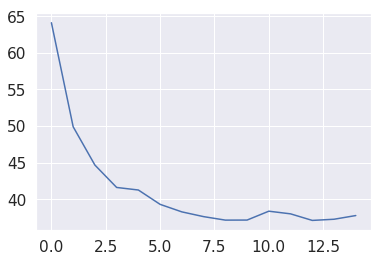

[4, 0, 3, 0, 1, 4, 4, 3, 2, 0, 1, 1, 5, 3, 2, 4, 0, 3, 3, 7, 4, 4, 5, 5, 6, 4, 5, 6, 3, 0, 1, 7, 0, 0, 0, 0, 6, 6, 2, 6, 0, 6, 1, 1, 4, 2, 7, 4, 2, 2, 0, 0, 0, 7, 1, 7, 3, 1, 4, 4, 2, 2, 6, 0, 0, 3, 4, 6, 6, 4, 1, 0, 1, 0, 7, 6, 5, 2, 0, 4, 3, 7, 5, 2, 4, 0, 0, 1, 4, 4, 3, 5, 0, 4, 1, 0, 4, 3, 2, 0, 7, 7, 7, 0, 7, 6, 4, 7, 3, 4, 1, 3, 0, 1, 1, 4, 6, 6, 4, 6, 4, 2, 3, 0, 0, 0, 0, 3, 0, 4, 3, 4, 5, 3, 1, 2, 7, 1, 2, 4, 4, 4, 1, 0, 0, 6, 1, 6, 7, 4, 6, 3, 6, 7, 1, 7, 7, 6, 7, 7, 3, 4, 6, 0, 0, 7, 0, 1, 0, 4, 7, 4, 7, 5, 6, 3, 6, 2, 1, 1, 6, 2, 4, 3, 2, 5, 5, 0, 7, 4, 1, 0, 1, 3, 1, 0, 0, 3, 0, 7, 2, 1, 1, 6, 4, 1, 3, 0, 2, 1, 6, 5, 3, 4, 6, 3, 3, 1, 7, 0, 4, 7, 7, 7, 4, 7, 4, 1, 0, 7, 0, 0, 2, 6, 6, 3, 5, 0, 5, 0, 5, 0, 2, 7, 7, 4, 3, 7, 4, 2, 3, 0, 1, 0, 4, 3, 4, 0, 3, 6, 1, 1, 3, 4, 3, 7, 5, 7, 7, 1, 0, 1, 0, 4, 4, 3, 1, 5, 3, 5, 4, 6, 0, 3, 6, 0, 7, 7, 2, 4, 0, 3, 7, 4, 1, 4, 2, 1, 6, 6, 2, 5, 2, 2, 2, 4, 6, 1, 6, 4, 0, 4, 3, 6, 1, 4, 6, 0, 2, 0, 7, 0, 1, 2, 6, 6, 1, 4, 2, 2, 4, 6, 1, 

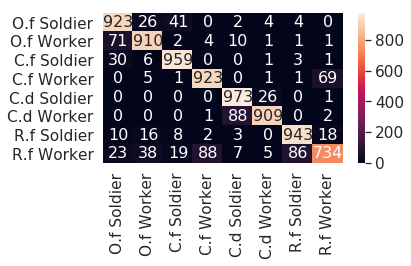

runtime :  3519.170154809952

[16] accuracy: 0.908 loss: 37.714

[0.815, 0.85625, 0.88175, 0.886375, 0.89325, 0.899125, 0.902, 0.905, 0.90625, 0.907875, 0.90575, 0.910125, 0.909375, 0.911, 0.90925, 0.907875]
[64.11414223909378, 49.904711842536926, 44.67099912464619, 41.61231115460396, 41.263010531663895, 39.30233183503151, 38.275576405227184, 37.62644839286804, 37.14999883621931, 37.15717602521181, 38.36975885927677, 38.00613395869732, 37.108960159122944, 37.26954859495163, 37.773814633488655, 37.71399527788162]


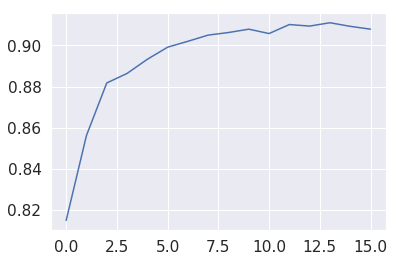

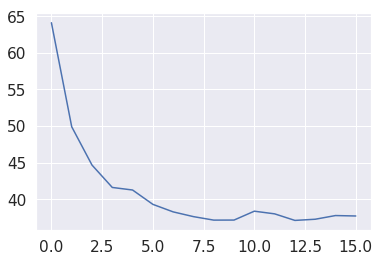

[2, 0, 0, 7, 7, 2, 2, 4, 0, 7, 3, 4, 0, 0, 5, 1, 6, 0, 4, 1, 3, 7, 4, 0, 3, 0, 4, 0, 1, 0, 0, 6, 0, 3, 6, 4, 0, 1, 3, 4, 6, 2, 2, 2, 6, 3, 3, 4, 4, 6, 0, 0, 3, 7, 1, 0, 4, 3, 0, 1, 6, 4, 0, 0, 3, 3, 4, 6, 4, 0, 4, 4, 4, 6, 0, 0, 7, 2, 1, 3, 5, 5, 4, 6, 4, 0, 1, 6, 7, 7, 0, 6, 4, 0, 7, 3, 6, 4, 0, 0, 6, 7, 6, 7, 1, 0, 4, 1, 4, 6, 0, 1, 4, 5, 6, 0, 4, 6, 3, 1, 0, 6, 3, 0, 1, 4, 1, 3, 1, 6, 2, 6, 6, 4, 7, 2, 3, 5, 5, 1, 6, 0, 0, 0, 5, 4, 0, 3, 2, 7, 7, 0, 0, 4, 0, 1, 1, 4, 4, 4, 6, 3, 0, 3, 5, 6, 0, 6, 6, 4, 1, 7, 6, 3, 3, 3, 4, 5, 6, 0, 3, 4, 3, 2, 4, 0, 6, 0, 3, 0, 3, 4, 6, 1, 2, 4, 3, 2, 7, 0, 4, 0, 7, 2, 6, 4, 0, 4, 4, 1, 4, 0, 5, 0, 3, 2, 0, 6, 7, 0, 7, 6, 3, 0, 0, 3, 4, 3, 0, 1, 7, 0, 3, 1, 6, 0, 1, 7, 2, 5, 7, 1, 7, 5, 0, 4, 2, 1, 3, 4, 1, 7, 7, 1, 4, 1, 7, 0, 7, 2, 3, 4, 3, 0, 2, 4, 4, 3, 2, 2, 7, 7, 2, 5, 5, 7, 3, 7, 7, 6, 1, 0, 4, 4, 4, 0, 0, 6, 1, 0, 2, 7, 7, 7, 1, 0, 0, 1, 4, 0, 5, 1, 1, 7, 7, 0, 4, 6, 6, 0, 3, 1, 0, 0, 3, 4, 1, 2, 3, 4, 0, 3, 7, 0, 0, 6, 6, 5, 7, 7, 1, 3, 1, 

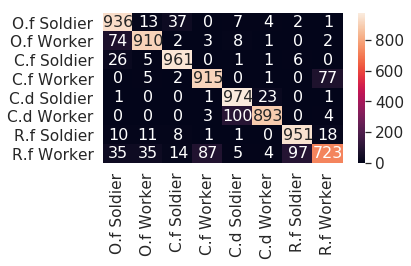

runtime :  3751.7896223068237

[17] accuracy: 0.911 loss: 37.361

[0.815, 0.85625, 0.88175, 0.886375, 0.89325, 0.899125, 0.902, 0.905, 0.90625, 0.907875, 0.90575, 0.910125, 0.909375, 0.911, 0.90925, 0.907875, 0.911125]
[64.11414223909378, 49.904711842536926, 44.67099912464619, 41.61231115460396, 41.263010531663895, 39.30233183503151, 38.275576405227184, 37.62644839286804, 37.14999883621931, 37.15717602521181, 38.36975885927677, 38.00613395869732, 37.108960159122944, 37.26954859495163, 37.773814633488655, 37.71399527788162, 37.36094921082258]


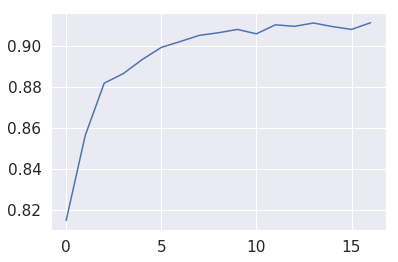

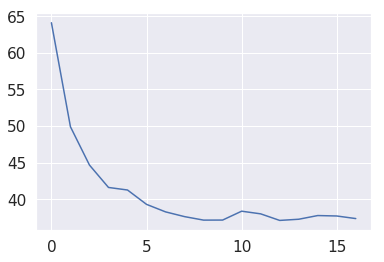

[2, 3, 0, 3, 7, 5, 6, 6, 4, 2, 1, 1, 4, 6, 3, 2, 2, 7, 6, 3, 4, 2, 0, 6, 3, 6, 6, 4, 4, 3, 4, 1, 6, 7, 1, 7, 1, 1, 1, 5, 4, 4, 4, 0, 0, 3, 4, 7, 6, 5, 2, 3, 1, 6, 0, 0, 7, 3, 2, 0, 6, 3, 5, 3, 7, 7, 7, 6, 2, 4, 4, 6, 6, 7, 4, 0, 7, 4, 3, 7, 4, 4, 3, 4, 4, 1, 6, 0, 7, 0, 4, 0, 0, 4, 7, 3, 7, 0, 5, 0, 6, 5, 2, 0, 0, 5, 0, 1, 4, 1, 6, 3, 4, 3, 4, 5, 7, 2, 1, 0, 6, 1, 1, 3, 0, 3, 5, 0, 3, 2, 6, 0, 4, 1, 7, 0, 4, 6, 3, 2, 0, 6, 0, 6, 0, 0, 1, 7, 0, 4, 6, 1, 3, 5, 4, 0, 2, 3, 6, 0, 6, 4, 7, 1, 3, 3, 3, 7, 4, 2, 0, 7, 0, 7, 2, 7, 6, 7, 4, 1, 3, 6, 6, 0, 4, 3, 7, 4, 0, 6, 6, 6, 7, 4, 0, 2, 4, 4, 4, 0, 7, 0, 2, 7, 0, 0, 0, 0, 6, 0, 6, 6, 4, 3, 3, 1, 1, 3, 6, 2, 0, 7, 6, 5, 0, 2, 2, 6, 0, 7, 7, 0, 3, 0, 3, 0, 4, 0, 1, 4, 0, 4, 6, 7, 1, 1, 0, 6, 3, 1, 2, 0, 1, 2, 4, 7, 0, 4, 4, 0, 4, 4, 7, 1, 3, 6, 0, 3, 3, 6, 6, 6, 2, 7, 2, 7, 4, 5, 2, 1, 0, 6, 0, 7, 3, 0, 4, 2, 2, 6, 0, 6, 0, 4, 6, 0, 1, 6, 3, 2, 1, 4, 6, 1, 3, 4, 3, 0, 6, 0, 0, 3, 5, 7, 6, 2, 7, 3, 7, 0, 6, 1, 3, 0, 1, 2, 7, 6, 7, 6, 1, 3, 6, 

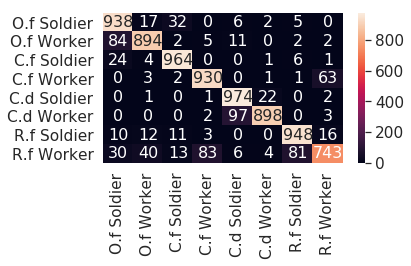

runtime :  3988.943543434143

[18] accuracy: 0.910 loss: 38.734

[0.815, 0.85625, 0.88175, 0.886375, 0.89325, 0.899125, 0.902, 0.905, 0.90625, 0.907875, 0.90575, 0.910125, 0.909375, 0.911, 0.90925, 0.907875, 0.911125, 0.910125]
[64.11414223909378, 49.904711842536926, 44.67099912464619, 41.61231115460396, 41.263010531663895, 39.30233183503151, 38.275576405227184, 37.62644839286804, 37.14999883621931, 37.15717602521181, 38.36975885927677, 38.00613395869732, 37.108960159122944, 37.26954859495163, 37.773814633488655, 37.71399527788162, 37.36094921082258, 38.73386053740978]


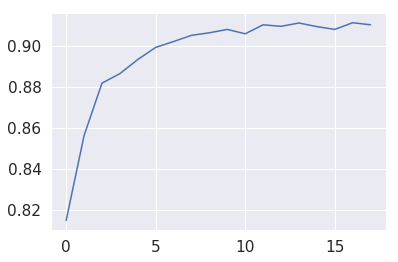

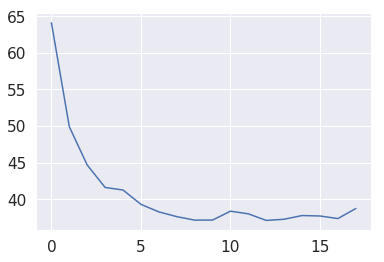

[7, 6, 3, 0, 2, 6, 3, 2, 1, 6, 1, 3, 6, 1, 0, 6, 4, 7, 4, 3, 6, 1, 0, 3, 0, 0, 7, 0, 4, 7, 2, 6, 4, 7, 2, 3, 3, 4, 2, 6, 0, 5, 7, 6, 7, 3, 1, 7, 6, 3, 5, 5, 6, 3, 4, 5, 0, 4, 0, 3, 3, 0, 7, 4, 0, 6, 7, 4, 0, 0, 0, 0, 0, 1, 3, 0, 3, 6, 6, 4, 5, 6, 0, 6, 1, 0, 1, 1, 3, 3, 3, 2, 3, 1, 7, 3, 6, 6, 6, 0, 5, 3, 6, 3, 0, 6, 6, 1, 7, 4, 2, 2, 2, 5, 3, 0, 4, 1, 4, 4, 1, 0, 7, 0, 6, 3, 0, 4, 0, 6, 3, 3, 6, 1, 7, 7, 0, 4, 4, 2, 2, 2, 5, 4, 3, 6, 6, 2, 1, 4, 0, 6, 0, 5, 1, 6, 6, 6, 5, 0, 0, 0, 4, 0, 0, 5, 2, 0, 1, 3, 1, 4, 4, 6, 7, 4, 1, 1, 0, 6, 6, 4, 3, 0, 7, 6, 0, 6, 6, 3, 7, 0, 2, 4, 1, 2, 1, 6, 3, 2, 3, 6, 4, 0, 4, 6, 4, 1, 4, 2, 3, 7, 3, 4, 2, 4, 7, 4, 7, 6, 0, 2, 1, 2, 7, 7, 0, 6, 3, 0, 3, 4, 6, 1, 4, 2, 7, 0, 3, 3, 6, 3, 1, 6, 7, 3, 2, 0, 3, 4, 2, 3, 0, 5, 7, 0, 1, 1, 4, 6, 6, 7, 3, 3, 5, 3, 4, 4, 0, 0, 0, 3, 4, 1, 4, 7, 1, 3, 4, 4, 3, 6, 6, 3, 0, 3, 6, 1, 1, 1, 6, 3, 4, 7, 2, 4, 5, 7, 0, 0, 7, 5, 7, 4, 4, 0, 0, 7, 0, 7, 2, 4, 5, 4, 0, 7, 7, 2, 7, 4, 0, 0, 0, 0, 0, 4, 0, 0, 2, 6, 0, 2, 2, 

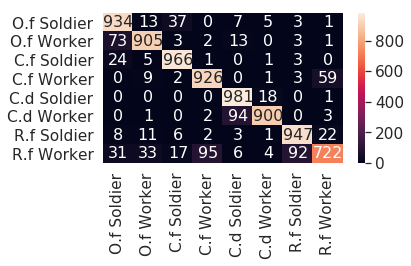

runtime :  4222.020384073257

[19] accuracy: 0.910 loss: 38.443

[0.815, 0.85625, 0.88175, 0.886375, 0.89325, 0.899125, 0.902, 0.905, 0.90625, 0.907875, 0.90575, 0.910125, 0.909375, 0.911, 0.90925, 0.907875, 0.911125, 0.910125, 0.909875]
[64.11414223909378, 49.904711842536926, 44.67099912464619, 41.61231115460396, 41.263010531663895, 39.30233183503151, 38.275576405227184, 37.62644839286804, 37.14999883621931, 37.15717602521181, 38.36975885927677, 38.00613395869732, 37.108960159122944, 37.26954859495163, 37.773814633488655, 37.71399527788162, 37.36094921082258, 38.73386053740978, 38.443429566919804]


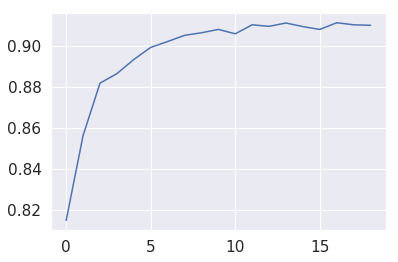

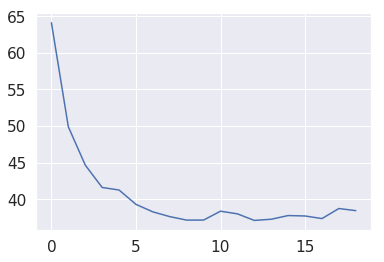

[0, 2, 1, 7, 1, 1, 0, 5, 6, 5, 4, 7, 4, 3, 3, 0, 7, 0, 6, 2, 4, 0, 0, 4, 6, 3, 3, 3, 1, 4, 0, 4, 6, 5, 6, 3, 6, 3, 4, 6, 6, 7, 0, 1, 6, 0, 4, 4, 1, 4, 3, 4, 7, 4, 7, 1, 7, 4, 6, 4, 0, 1, 7, 4, 7, 4, 7, 7, 5, 0, 0, 0, 7, 7, 3, 3, 0, 4, 4, 1, 0, 2, 2, 0, 4, 6, 4, 3, 3, 4, 4, 1, 3, 7, 0, 0, 6, 4, 3, 5, 4, 3, 4, 4, 6, 4, 4, 2, 0, 0, 6, 6, 3, 4, 7, 6, 4, 6, 2, 0, 0, 7, 4, 6, 7, 7, 1, 0, 4, 4, 6, 0, 2, 4, 0, 4, 6, 5, 1, 4, 4, 7, 4, 1, 7, 7, 1, 5, 4, 0, 4, 2, 6, 4, 3, 6, 2, 6, 6, 7, 4, 5, 1, 4, 5, 0, 4, 3, 6, 0, 4, 7, 2, 4, 6, 1, 0, 4, 0, 7, 3, 6, 4, 4, 6, 3, 5, 4, 3, 7, 4, 1, 3, 7, 0, 1, 4, 0, 7, 0, 3, 7, 0, 6, 3, 0, 7, 0, 3, 6, 7, 1, 1, 0, 4, 1, 2, 0, 2, 4, 2, 5, 3, 3, 2, 2, 3, 5, 7, 4, 6, 4, 1, 7, 6, 0, 3, 0, 4, 6, 7, 3, 6, 1, 0, 2, 0, 6, 7, 6, 0, 7, 6, 0, 0, 2, 0, 6, 1, 7, 2, 4, 1, 4, 0, 0, 0, 3, 6, 2, 0, 7, 3, 6, 7, 1, 1, 5, 1, 7, 6, 6, 7, 6, 0, 5, 7, 0, 4, 3, 0, 6, 6, 3, 0, 0, 2, 4, 4, 6, 5, 1, 3, 7, 6, 2, 4, 7, 0, 3, 4, 0, 6, 4, 7, 0, 2, 3, 4, 0, 7, 4, 0, 6, 7, 3, 0, 4, 6, 4, 7, 2, 6, 

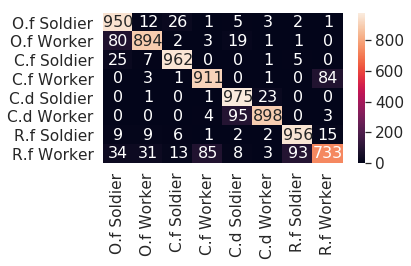

runtime :  4455.796848535538

[20] accuracy: 0.914 loss: 36.634

[0.815, 0.85625, 0.88175, 0.886375, 0.89325, 0.899125, 0.902, 0.905, 0.90625, 0.907875, 0.90575, 0.910125, 0.909375, 0.911, 0.90925, 0.907875, 0.911125, 0.910125, 0.909875, 0.914375]
[64.11414223909378, 49.904711842536926, 44.67099912464619, 41.61231115460396, 41.263010531663895, 39.30233183503151, 38.275576405227184, 37.62644839286804, 37.14999883621931, 37.15717602521181, 38.36975885927677, 38.00613395869732, 37.108960159122944, 37.26954859495163, 37.773814633488655, 37.71399527788162, 37.36094921082258, 38.73386053740978, 38.443429566919804, 36.634050503373146]


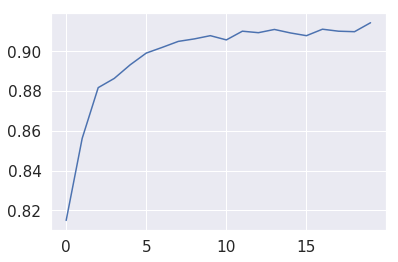

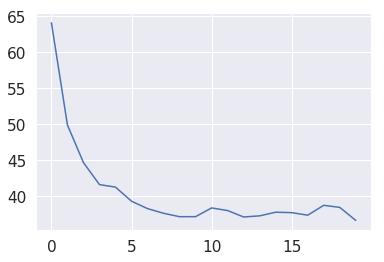

[0, 4, 6, 0, 6, 3, 6, 0, 7, 1, 5, 7, 4, 0, 6, 4, 5, 6, 3, 3, 1, 6, 4, 4, 5, 4, 0, 3, 1, 0, 6, 6, 6, 0, 7, 4, 0, 2, 4, 2, 7, 5, 3, 3, 3, 4, 4, 0, 0, 0, 4, 5, 3, 1, 6, 6, 7, 3, 3, 5, 7, 4, 3, 0, 3, 1, 4, 7, 0, 6, 1, 6, 3, 1, 3, 6, 0, 3, 3, 6, 3, 6, 5, 6, 4, 0, 0, 0, 7, 7, 5, 0, 0, 4, 7, 2, 7, 6, 4, 3, 4, 4, 4, 0, 0, 4, 2, 6, 2, 1, 5, 0, 4, 7, 4, 0, 0, 2, 0, 4, 0, 4, 2, 7, 6, 4, 1, 7, 4, 4, 2, 2, 6, 7, 1, 4, 0, 2, 0, 6, 0, 0, 3, 4, 3, 4, 5, 0, 5, 2, 6, 6, 6, 0, 7, 1, 0, 0, 4, 6, 0, 6, 1, 3, 4, 4, 2, 2, 1, 3, 0, 6, 4, 2, 6, 1, 2, 1, 7, 1, 0, 4, 7, 1, 0, 2, 3, 0, 2, 4, 7, 7, 7, 4, 4, 4, 1, 6, 4, 3, 6, 0, 7, 3, 7, 4, 0, 7, 7, 6, 6, 4, 3, 1, 6, 4, 3, 4, 0, 0, 1, 4, 4, 3, 7, 4, 4, 7, 6, 7, 6, 6, 0, 3, 5, 2, 1, 3, 0, 4, 1, 7, 4, 1, 0, 6, 6, 7, 4, 1, 1, 5, 6, 6, 3, 7, 4, 2, 1, 4, 4, 7, 7, 4, 3, 4, 1, 1, 4, 4, 5, 4, 0, 0, 0, 3, 1, 7, 7, 1, 3, 1, 7, 7, 4, 7, 0, 1, 3, 0, 0, 0, 1, 2, 0, 7, 0, 5, 2, 4, 6, 0, 7, 0, 0, 1, 1, 3, 4, 2, 6, 4, 4, 5, 5, 3, 1, 4, 2, 7, 4, 1, 0, 3, 1, 4, 2, 6, 0, 0, 6, 1, 0, 

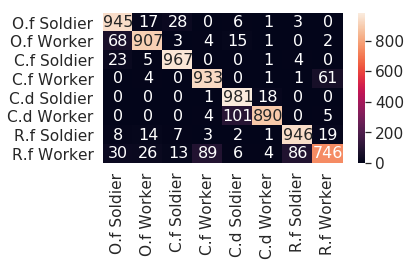

runtime :  4691.262600660324

[21] accuracy: 0.915 loss: 36.482

[0.815, 0.85625, 0.88175, 0.886375, 0.89325, 0.899125, 0.902, 0.905, 0.90625, 0.907875, 0.90575, 0.910125, 0.909375, 0.911, 0.90925, 0.907875, 0.911125, 0.910125, 0.909875, 0.914375, 0.91475]
[64.11414223909378, 49.904711842536926, 44.67099912464619, 41.61231115460396, 41.263010531663895, 39.30233183503151, 38.275576405227184, 37.62644839286804, 37.14999883621931, 37.15717602521181, 38.36975885927677, 38.00613395869732, 37.108960159122944, 37.26954859495163, 37.773814633488655, 37.71399527788162, 37.36094921082258, 38.73386053740978, 38.443429566919804, 36.634050503373146, 36.48204176872969]


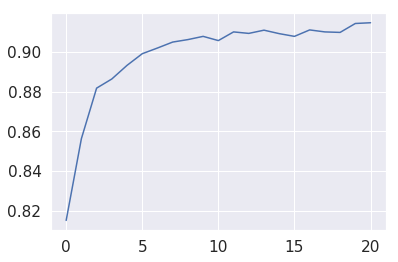

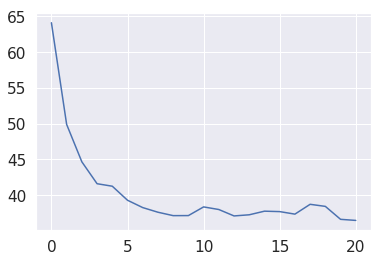

[3, 3, 6, 0, 0, 7, 7, 6, 0, 6, 4, 3, 3, 4, 6, 3, 4, 0, 6, 6, 4, 7, 0, 7, 4, 6, 6, 2, 5, 4, 7, 1, 7, 4, 0, 4, 3, 3, 4, 1, 7, 3, 5, 1, 4, 6, 4, 4, 6, 7, 2, 0, 6, 4, 0, 3, 1, 7, 2, 7, 7, 0, 0, 7, 4, 3, 7, 4, 1, 5, 3, 0, 4, 4, 7, 2, 4, 7, 4, 2, 7, 6, 6, 7, 2, 0, 4, 5, 0, 1, 6, 4, 0, 1, 1, 4, 6, 1, 6, 5, 1, 0, 5, 4, 6, 4, 5, 6, 3, 3, 6, 7, 1, 6, 3, 6, 0, 4, 3, 1, 6, 2, 1, 3, 4, 7, 1, 7, 0, 3, 4, 1, 1, 2, 6, 7, 3, 0, 6, 2, 4, 7, 1, 0, 7, 1, 4, 7, 0, 2, 3, 7, 3, 4, 7, 4, 1, 1, 1, 3, 1, 4, 2, 4, 4, 4, 6, 6, 3, 3, 6, 0, 0, 0, 1, 0, 7, 6, 1, 4, 0, 0, 0, 0, 4, 6, 4, 2, 7, 6, 0, 7, 0, 2, 6, 0, 6, 3, 0, 5, 2, 4, 2, 0, 2, 4, 3, 6, 4, 7, 2, 7, 7, 0, 1, 1, 4, 7, 1, 7, 7, 0, 4, 2, 1, 1, 0, 0, 0, 6, 4, 6, 7, 4, 6, 4, 3, 6, 0, 3, 6, 7, 6, 3, 4, 4, 4, 0, 4, 3, 3, 0, 0, 4, 6, 0, 4, 0, 3, 5, 6, 4, 1, 7, 2, 0, 0, 4, 7, 4, 3, 6, 3, 0, 6, 2, 2, 4, 7, 0, 1, 3, 0, 0, 2, 0, 7, 3, 1, 0, 4, 0, 7, 3, 5, 7, 3, 2, 2, 5, 4, 1, 6, 1, 7, 0, 4, 2, 4, 2, 7, 4, 0, 0, 6, 7, 6, 3, 4, 4, 0, 3, 7, 6, 0, 1, 6, 4, 3, 3, 0, 1, 4, 

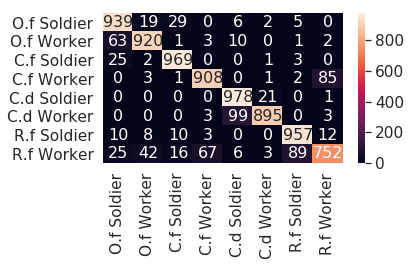

runtime :  4925.995997905731

[22] accuracy: 0.913 loss: 37.400

[0.815, 0.85625, 0.88175, 0.886375, 0.89325, 0.899125, 0.902, 0.905, 0.90625, 0.907875, 0.90575, 0.910125, 0.909375, 0.911, 0.90925, 0.907875, 0.911125, 0.910125, 0.909875, 0.914375, 0.91475, 0.9135]
[64.11414223909378, 49.904711842536926, 44.67099912464619, 41.61231115460396, 41.263010531663895, 39.30233183503151, 38.275576405227184, 37.62644839286804, 37.14999883621931, 37.15717602521181, 38.36975885927677, 38.00613395869732, 37.108960159122944, 37.26954859495163, 37.773814633488655, 37.71399527788162, 37.36094921082258, 38.73386053740978, 38.443429566919804, 36.634050503373146, 36.48204176872969, 37.40003118664026]


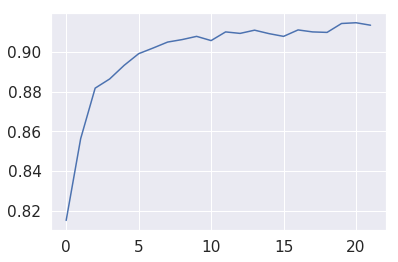

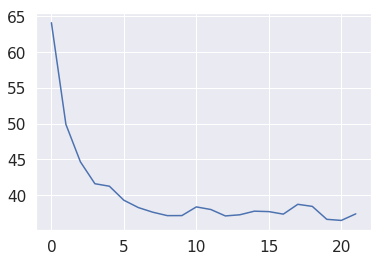

[7, 7, 0, 6, 0, 2, 3, 0, 6, 4, 7, 4, 3, 0, 6, 3, 3, 1, 1, 1, 5, 4, 7, 2, 3, 4, 7, 3, 4, 1, 6, 5, 6, 1, 2, 6, 4, 3, 6, 1, 0, 3, 6, 6, 6, 6, 0, 3, 4, 6, 5, 2, 3, 1, 2, 4, 0, 6, 7, 2, 3, 4, 0, 3, 4, 4, 4, 0, 3, 4, 4, 7, 3, 1, 7, 7, 3, 7, 7, 4, 7, 3, 4, 7, 1, 7, 4, 0, 5, 4, 7, 4, 3, 7, 1, 3, 1, 3, 6, 2, 7, 3, 4, 0, 6, 1, 0, 7, 6, 6, 0, 1, 6, 6, 0, 4, 7, 4, 0, 4, 4, 1, 2, 3, 4, 3, 4, 1, 3, 6, 4, 0, 1, 3, 4, 6, 7, 4, 0, 6, 0, 4, 6, 7, 4, 3, 4, 5, 7, 4, 7, 5, 3, 0, 2, 6, 6, 4, 0, 3, 4, 3, 0, 4, 7, 7, 0, 7, 3, 1, 0, 1, 0, 3, 1, 0, 0, 6, 6, 2, 1, 3, 7, 2, 7, 4, 4, 6, 4, 6, 4, 3, 2, 3, 0, 4, 0, 1, 1, 7, 1, 4, 2, 4, 4, 0, 3, 5, 2, 1, 1, 3, 6, 7, 1, 3, 7, 0, 6, 6, 7, 7, 4, 4, 6, 0, 0, 7, 6, 0, 6, 3, 1, 6, 0, 6, 1, 6, 0, 1, 6, 7, 4, 2, 3, 3, 5, 1, 1, 4, 0, 3, 4, 4, 0, 1, 4, 4, 3, 0, 0, 0, 4, 7, 6, 0, 2, 1, 1, 1, 0, 3, 1, 4, 7, 4, 4, 2, 3, 7, 6, 7, 7, 1, 1, 7, 4, 4, 5, 4, 2, 2, 7, 4, 1, 4, 0, 7, 0, 3, 0, 0, 4, 3, 4, 7, 1, 7, 7, 0, 5, 7, 0, 4, 7, 0, 3, 6, 6, 5, 0, 7, 1, 6, 0, 0, 7, 7, 7, 3, 1, 3, 0, 

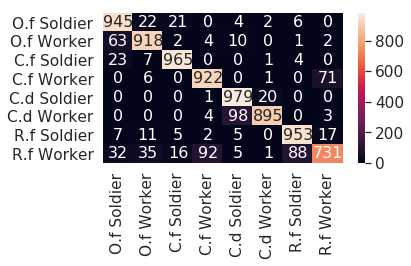

runtime :  5159.283912420273

[23] accuracy: 0.910 loss: 38.076

[0.815, 0.85625, 0.88175, 0.886375, 0.89325, 0.899125, 0.902, 0.905, 0.90625, 0.907875, 0.90575, 0.910125, 0.909375, 0.911, 0.90925, 0.907875, 0.911125, 0.910125, 0.909875, 0.914375, 0.91475, 0.9135, 0.90975]
[64.11414223909378, 49.904711842536926, 44.67099912464619, 41.61231115460396, 41.263010531663895, 39.30233183503151, 38.275576405227184, 37.62644839286804, 37.14999883621931, 37.15717602521181, 38.36975885927677, 38.00613395869732, 37.108960159122944, 37.26954859495163, 37.773814633488655, 37.71399527788162, 37.36094921082258, 38.73386053740978, 38.443429566919804, 36.634050503373146, 36.48204176872969, 37.40003118664026, 38.07550660520792]


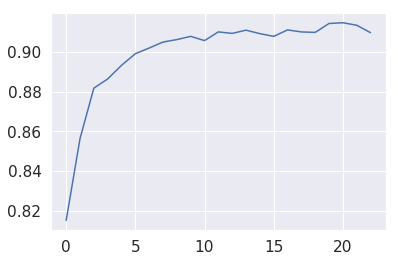

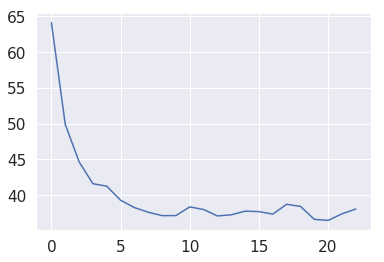

[6, 0, 3, 1, 0, 0, 0, 0, 3, 7, 0, 4, 3, 4, 0, 7, 1, 2, 0, 4, 1, 4, 2, 0, 0, 7, 0, 3, 3, 0, 5, 6, 1, 0, 4, 6, 7, 0, 0, 6, 5, 4, 7, 6, 2, 3, 4, 1, 6, 6, 0, 7, 0, 7, 2, 0, 3, 0, 5, 3, 0, 3, 3, 4, 7, 7, 1, 0, 2, 3, 4, 1, 6, 3, 4, 6, 4, 6, 4, 4, 4, 3, 1, 2, 2, 4, 0, 7, 7, 1, 0, 1, 4, 3, 3, 5, 2, 3, 2, 6, 6, 1, 7, 0, 0, 4, 4, 5, 7, 1, 3, 0, 6, 0, 2, 4, 6, 0, 5, 0, 3, 2, 7, 5, 4, 2, 5, 1, 7, 0, 0, 0, 0, 3, 6, 2, 1, 7, 4, 6, 3, 3, 7, 0, 0, 4, 1, 0, 6, 1, 4, 3, 0, 7, 3, 0, 0, 2, 6, 1, 0, 4, 6, 6, 1, 0, 2, 7, 1, 4, 1, 0, 7, 0, 4, 3, 6, 1, 7, 0, 4, 0, 4, 2, 4, 5, 0, 4, 7, 0, 7, 4, 4, 2, 0, 4, 7, 3, 7, 0, 1, 7, 3, 3, 0, 3, 4, 1, 6, 3, 1, 7, 1, 4, 3, 0, 3, 7, 2, 6, 6, 2, 0, 6, 3, 7, 0, 4, 0, 4, 6, 1, 6, 1, 6, 6, 0, 7, 7, 4, 4, 0, 6, 6, 3, 0, 2, 0, 3, 1, 1, 4, 2, 6, 0, 0, 2, 0, 2, 7, 0, 4, 1, 5, 3, 4, 6, 3, 0, 0, 6, 0, 5, 6, 6, 1, 4, 5, 6, 3, 2, 3, 7, 7, 6, 7, 7, 1, 7, 7, 1, 3, 1, 4, 4, 3, 7, 1, 5, 3, 7, 6, 5, 1, 1, 7, 1, 4, 3, 6, 1, 4, 5, 4, 3, 4, 7, 0, 3, 3, 3, 0, 6, 4, 2, 7, 7, 1, 4, 0, 6, 2, 0, 

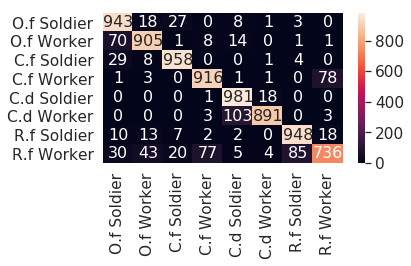

runtime :  5397.611865997314

[24] accuracy: 0.914 loss: 37.082

[0.815, 0.85625, 0.88175, 0.886375, 0.89325, 0.899125, 0.902, 0.905, 0.90625, 0.907875, 0.90575, 0.910125, 0.909375, 0.911, 0.90925, 0.907875, 0.911125, 0.910125, 0.909875, 0.914375, 0.91475, 0.9135, 0.90975, 0.914125]
[64.11414223909378, 49.904711842536926, 44.67099912464619, 41.61231115460396, 41.263010531663895, 39.30233183503151, 38.275576405227184, 37.62644839286804, 37.14999883621931, 37.15717602521181, 38.36975885927677, 38.00613395869732, 37.108960159122944, 37.26954859495163, 37.773814633488655, 37.71399527788162, 37.36094921082258, 38.73386053740978, 38.443429566919804, 36.634050503373146, 36.48204176872969, 37.40003118664026, 38.07550660520792, 37.081875782459974]


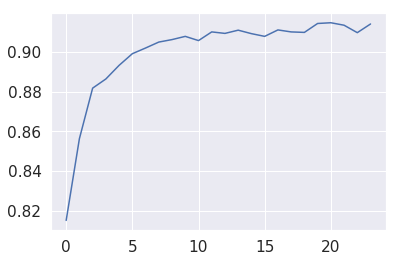

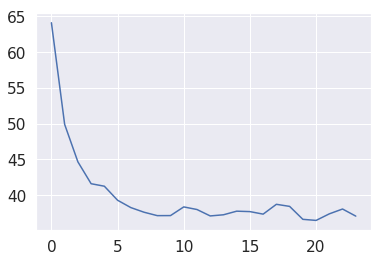

[4, 2, 6, 3, 3, 4, 0, 3, 0, 0, 0, 6, 7, 0, 7, 4, 2, 6, 4, 0, 6, 0, 0, 3, 7, 5, 3, 0, 3, 2, 6, 5, 4, 0, 4, 1, 2, 1, 7, 1, 3, 4, 0, 0, 2, 4, 7, 0, 7, 0, 1, 1, 7, 6, 1, 3, 2, 4, 6, 2, 3, 4, 6, 3, 4, 4, 5, 4, 0, 2, 4, 4, 3, 6, 1, 4, 1, 0, 5, 3, 1, 7, 6, 0, 3, 3, 6, 3, 6, 0, 7, 4, 4, 4, 3, 3, 4, 0, 5, 4, 6, 0, 7, 4, 1, 3, 2, 7, 6, 0, 2, 4, 3, 3, 4, 4, 7, 2, 2, 2, 0, 2, 1, 0, 0, 4, 0, 7, 4, 3, 6, 3, 6, 5, 2, 5, 1, 3, 7, 6, 4, 0, 4, 1, 1, 0, 3, 6, 7, 5, 0, 0, 3, 4, 7, 6, 2, 0, 0, 0, 0, 1, 0, 0, 6, 7, 6, 4, 3, 3, 7, 0, 3, 3, 7, 1, 0, 7, 1, 0, 7, 0, 7, 3, 5, 1, 3, 7, 7, 1, 1, 0, 1, 5, 1, 2, 1, 0, 7, 0, 5, 5, 3, 2, 3, 1, 0, 7, 4, 5, 7, 7, 0, 1, 6, 4, 4, 3, 0, 6, 2, 7, 2, 2, 5, 3, 2, 3, 0, 0, 4, 0, 0, 3, 6, 4, 4, 3, 6, 0, 0, 2, 6, 6, 7, 6, 4, 0, 7, 0, 0, 1, 0, 2, 4, 2, 4, 1, 7, 4, 5, 3, 0, 4, 3, 2, 3, 6, 4, 7, 4, 0, 7, 4, 4, 3, 6, 0, 6, 2, 4, 2, 7, 4, 3, 1, 2, 2, 2, 0, 6, 6, 5, 4, 3, 1, 0, 4, 1, 0, 1, 1, 2, 0, 6, 3, 2, 4, 2, 6, 6, 4, 6, 5, 3, 3, 4, 5, 7, 7, 4, 7, 7, 3, 7, 7, 6, 7, 3, 3, 4, 2, 0, 

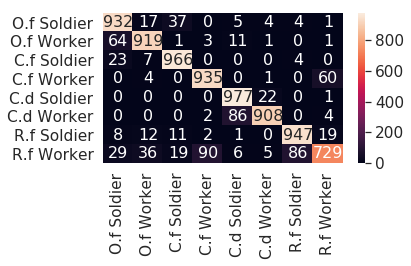

runtime :  5632.562545776367

[25] accuracy: 0.914 loss: 37.043

[0.815, 0.85625, 0.88175, 0.886375, 0.89325, 0.899125, 0.902, 0.905, 0.90625, 0.907875, 0.90575, 0.910125, 0.909375, 0.911, 0.90925, 0.907875, 0.911125, 0.910125, 0.909875, 0.914375, 0.91475, 0.9135, 0.90975, 0.914125, 0.914375]
[64.11414223909378, 49.904711842536926, 44.67099912464619, 41.61231115460396, 41.263010531663895, 39.30233183503151, 38.275576405227184, 37.62644839286804, 37.14999883621931, 37.15717602521181, 38.36975885927677, 38.00613395869732, 37.108960159122944, 37.26954859495163, 37.773814633488655, 37.71399527788162, 37.36094921082258, 38.73386053740978, 38.443429566919804, 36.634050503373146, 36.48204176872969, 37.40003118664026, 38.07550660520792, 37.081875782459974, 37.04349867999554]


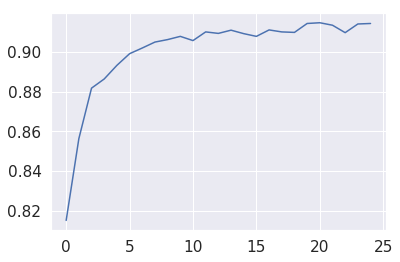

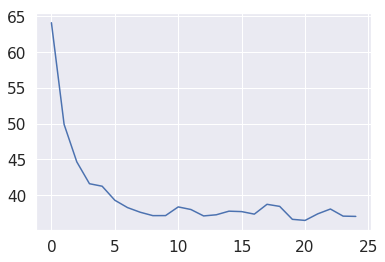

[6, 4, 4, 0, 6, 0, 4, 4, 2, 3, 6, 7, 6, 6, 4, 1, 3, 4, 2, 1, 6, 0, 3, 4, 1, 0, 6, 1, 3, 4, 2, 4, 4, 6, 3, 6, 0, 5, 0, 2, 7, 4, 2, 5, 0, 7, 0, 1, 0, 7, 4, 3, 0, 3, 2, 6, 3, 4, 0, 0, 1, 6, 4, 4, 0, 3, 2, 6, 3, 7, 4, 0, 3, 6, 7, 0, 0, 0, 4, 4, 5, 7, 0, 7, 4, 3, 6, 2, 7, 6, 0, 6, 7, 3, 6, 6, 0, 0, 7, 6, 2, 1, 0, 2, 7, 0, 0, 2, 0, 3, 3, 5, 7, 0, 0, 4, 7, 3, 5, 2, 3, 0, 1, 7, 0, 4, 6, 6, 6, 3, 7, 4, 3, 1, 1, 4, 0, 3, 7, 2, 3, 3, 6, 6, 3, 3, 5, 7, 4, 0, 0, 3, 7, 1, 1, 2, 1, 4, 5, 2, 7, 1, 0, 6, 0, 3, 6, 4, 4, 7, 5, 6, 1, 4, 7, 2, 0, 3, 3, 0, 3, 2, 1, 3, 1, 6, 3, 4, 3, 3, 4, 1, 3, 6, 1, 7, 6, 0, 1, 5, 2, 0, 3, 4, 4, 7, 3, 7, 0, 6, 1, 6, 0, 7, 6, 4, 4, 3, 7, 0, 4, 6, 5, 6, 0, 7, 4, 1, 7, 6, 4, 4, 2, 5, 4, 6, 3, 7, 0, 7, 3, 3, 0, 0, 7, 2, 7, 6, 0, 3, 0, 2, 2, 2, 1, 7, 7, 4, 4, 0, 3, 0, 0, 4, 7, 6, 6, 6, 5, 1, 4, 1, 0, 4, 6, 0, 5, 4, 2, 3, 4, 7, 2, 7, 3, 1, 5, 0, 3, 2, 0, 4, 1, 6, 3, 4, 5, 6, 4, 6, 6, 0, 0, 4, 4, 4, 1, 3, 3, 7, 1, 0, 3, 5, 4, 6, 7, 4, 7, 0, 7, 4, 0, 4, 6, 4, 3, 7, 3, 3, 6, 0, 3, 

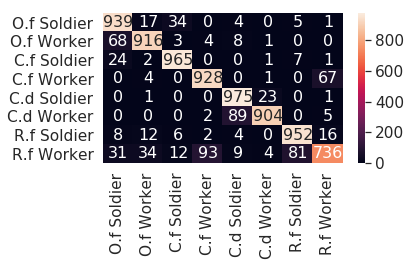

runtime :  5865.9878833293915

[26] accuracy: 0.912 loss: 38.456

[0.815, 0.85625, 0.88175, 0.886375, 0.89325, 0.899125, 0.902, 0.905, 0.90625, 0.907875, 0.90575, 0.910125, 0.909375, 0.911, 0.90925, 0.907875, 0.911125, 0.910125, 0.909875, 0.914375, 0.91475, 0.9135, 0.90975, 0.914125, 0.914375, 0.911875]
[64.11414223909378, 49.904711842536926, 44.67099912464619, 41.61231115460396, 41.263010531663895, 39.30233183503151, 38.275576405227184, 37.62644839286804, 37.14999883621931, 37.15717602521181, 38.36975885927677, 38.00613395869732, 37.108960159122944, 37.26954859495163, 37.773814633488655, 37.71399527788162, 37.36094921082258, 38.73386053740978, 38.443429566919804, 36.634050503373146, 36.48204176872969, 37.40003118664026, 38.07550660520792, 37.081875782459974, 37.04349867999554, 38.456205144524574]


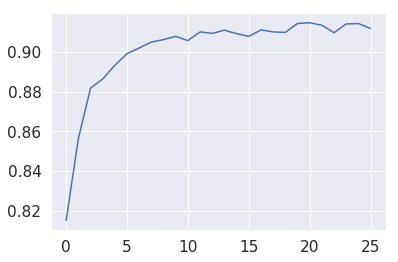

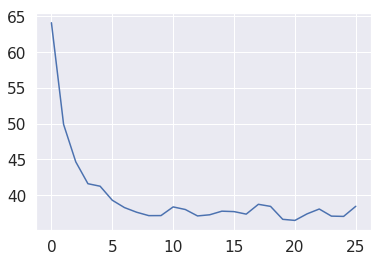

[1, 1, 4, 7, 6, 4, 4, 6, 7, 1, 0, 0, 2, 6, 3, 0, 7, 3, 3, 3, 3, 0, 0, 0, 0, 7, 4, 4, 3, 0, 3, 2, 4, 1, 3, 0, 0, 4, 4, 4, 4, 7, 0, 4, 6, 0, 1, 4, 7, 2, 4, 1, 4, 1, 2, 0, 0, 3, 4, 2, 4, 4, 1, 0, 3, 6, 3, 6, 3, 3, 4, 1, 7, 4, 3, 3, 7, 3, 2, 1, 2, 4, 4, 1, 0, 0, 3, 3, 1, 6, 1, 3, 7, 6, 1, 7, 3, 4, 6, 2, 4, 7, 0, 2, 0, 2, 1, 1, 6, 2, 6, 0, 2, 0, 7, 4, 2, 0, 0, 6, 4, 7, 1, 0, 7, 6, 6, 4, 0, 5, 3, 3, 4, 6, 3, 2, 2, 4, 4, 6, 0, 1, 3, 3, 1, 7, 6, 0, 0, 7, 2, 1, 6, 0, 1, 4, 7, 0, 1, 7, 4, 6, 0, 7, 5, 0, 3, 4, 4, 0, 1, 6, 7, 6, 0, 0, 4, 6, 2, 0, 2, 3, 7, 0, 6, 7, 1, 3, 2, 7, 0, 0, 7, 4, 7, 4, 7, 4, 4, 1, 3, 0, 3, 7, 0, 4, 1, 4, 7, 4, 0, 2, 1, 4, 4, 0, 0, 1, 7, 1, 0, 7, 6, 6, 4, 1, 1, 0, 3, 4, 4, 4, 7, 5, 6, 1, 6, 2, 1, 0, 0, 2, 6, 0, 3, 7, 2, 6, 0, 5, 3, 1, 3, 7, 4, 5, 3, 4, 7, 4, 2, 3, 1, 6, 0, 2, 2, 6, 5, 6, 0, 6, 4, 6, 7, 6, 1, 3, 1, 4, 7, 0, 0, 4, 0, 0, 5, 0, 0, 0, 0, 7, 7, 7, 7, 7, 6, 7, 0, 6, 7, 1, 7, 0, 5, 0, 4, 2, 0, 3, 4, 2, 6, 6, 4, 3, 3, 3, 1, 6, 2, 3, 7, 6, 4, 1, 4, 1, 7, 2, 2, 0, 0, 

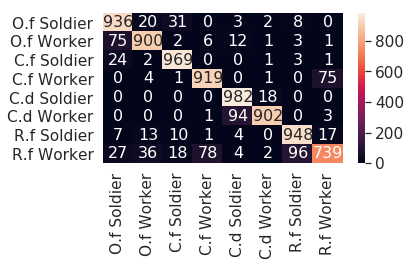

runtime :  6100.8898804187775

[27] accuracy: 0.916 loss: 36.588

[0.815, 0.85625, 0.88175, 0.886375, 0.89325, 0.899125, 0.902, 0.905, 0.90625, 0.907875, 0.90575, 0.910125, 0.909375, 0.911, 0.90925, 0.907875, 0.911125, 0.910125, 0.909875, 0.914375, 0.91475, 0.9135, 0.90975, 0.914125, 0.914375, 0.911875, 0.9165]
[64.11414223909378, 49.904711842536926, 44.67099912464619, 41.61231115460396, 41.263010531663895, 39.30233183503151, 38.275576405227184, 37.62644839286804, 37.14999883621931, 37.15717602521181, 38.36975885927677, 38.00613395869732, 37.108960159122944, 37.26954859495163, 37.773814633488655, 37.71399527788162, 37.36094921082258, 38.73386053740978, 38.443429566919804, 36.634050503373146, 36.48204176872969, 37.40003118664026, 38.07550660520792, 37.081875782459974, 37.04349867999554, 38.456205144524574, 36.58829292654991]


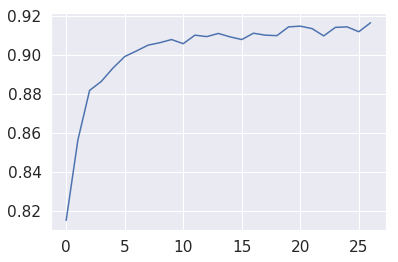

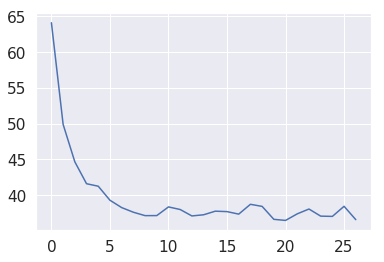

[4, 4, 1, 6, 4, 4, 1, 1, 1, 3, 0, 6, 0, 0, 7, 0, 6, 7, 7, 4, 0, 3, 4, 4, 5, 7, 2, 0, 1, 0, 7, 2, 4, 2, 7, 1, 0, 3, 4, 7, 0, 0, 7, 6, 7, 3, 3, 6, 0, 0, 0, 3, 0, 3, 0, 0, 4, 6, 1, 6, 4, 3, 5, 7, 0, 6, 2, 1, 7, 7, 6, 1, 5, 7, 4, 6, 6, 2, 0, 7, 6, 0, 1, 3, 4, 1, 6, 0, 4, 7, 4, 2, 0, 7, 2, 4, 0, 7, 0, 4, 0, 3, 6, 4, 6, 6, 1, 6, 5, 1, 7, 7, 7, 3, 2, 6, 3, 1, 4, 7, 3, 1, 4, 3, 3, 2, 2, 2, 6, 6, 4, 0, 0, 6, 0, 5, 0, 4, 1, 2, 3, 4, 1, 5, 1, 5, 0, 0, 0, 7, 7, 3, 0, 4, 2, 2, 7, 7, 6, 7, 0, 6, 1, 3, 4, 6, 6, 3, 1, 3, 7, 4, 0, 7, 0, 7, 3, 6, 4, 2, 3, 1, 0, 6, 4, 3, 6, 7, 0, 7, 3, 6, 7, 1, 3, 3, 0, 0, 5, 2, 7, 3, 7, 3, 4, 6, 3, 3, 0, 7, 4, 3, 6, 1, 5, 0, 3, 7, 7, 3, 2, 4, 5, 4, 2, 2, 4, 4, 4, 4, 3, 4, 4, 4, 2, 7, 4, 7, 4, 0, 1, 4, 6, 1, 0, 0, 3, 0, 1, 0, 4, 0, 7, 0, 3, 0, 4, 0, 2, 0, 4, 7, 0, 6, 7, 2, 7, 1, 6, 4, 6, 7, 4, 1, 7, 1, 4, 3, 1, 1, 7, 3, 0, 3, 7, 3, 5, 4, 7, 7, 6, 0, 4, 3, 1, 2, 3, 3, 1, 7, 6, 7, 6, 4, 0, 7, 4, 0, 1, 1, 1, 4, 7, 4, 0, 7, 1, 4, 0, 3, 6, 0, 6, 0, 6, 0, 3, 3, 2, 3, 3, 4, 7, 

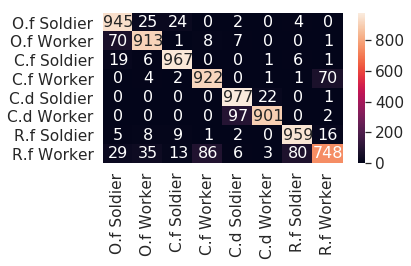

runtime :  6333.1002469062805

[28] accuracy: 0.915 loss: 37.064

[0.815, 0.85625, 0.88175, 0.886375, 0.89325, 0.899125, 0.902, 0.905, 0.90625, 0.907875, 0.90575, 0.910125, 0.909375, 0.911, 0.90925, 0.907875, 0.911125, 0.910125, 0.909875, 0.914375, 0.91475, 0.9135, 0.90975, 0.914125, 0.914375, 0.911875, 0.9165, 0.914875]
[64.11414223909378, 49.904711842536926, 44.67099912464619, 41.61231115460396, 41.263010531663895, 39.30233183503151, 38.275576405227184, 37.62644839286804, 37.14999883621931, 37.15717602521181, 38.36975885927677, 38.00613395869732, 37.108960159122944, 37.26954859495163, 37.773814633488655, 37.71399527788162, 37.36094921082258, 38.73386053740978, 38.443429566919804, 36.634050503373146, 36.48204176872969, 37.40003118664026, 38.07550660520792, 37.081875782459974, 37.04349867999554, 38.456205144524574, 36.58829292654991, 37.063568487763405]


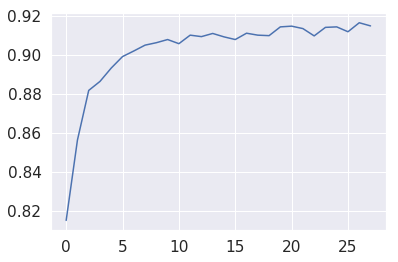

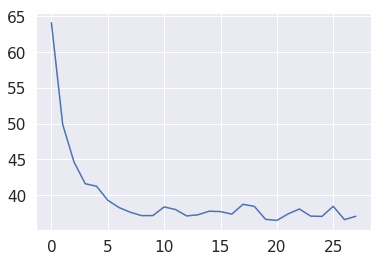

[0, 4, 1, 0, 1, 0, 7, 5, 2, 6, 0, 0, 2, 2, 4, 6, 5, 6, 0, 7, 1, 6, 1, 4, 3, 1, 3, 4, 1, 2, 1, 0, 6, 3, 7, 2, 0, 1, 0, 7, 2, 4, 7, 4, 6, 4, 4, 7, 3, 6, 3, 7, 3, 4, 0, 7, 4, 4, 4, 0, 7, 4, 7, 4, 0, 4, 0, 5, 4, 0, 5, 4, 3, 1, 4, 0, 6, 3, 6, 4, 4, 6, 0, 4, 6, 3, 1, 0, 5, 3, 6, 0, 4, 2, 0, 6, 2, 5, 6, 7, 4, 0, 6, 0, 3, 7, 3, 6, 3, 5, 3, 3, 1, 0, 7, 3, 7, 7, 6, 4, 2, 7, 7, 7, 6, 4, 6, 0, 4, 7, 0, 7, 1, 7, 0, 2, 2, 7, 0, 2, 4, 4, 0, 6, 7, 4, 2, 0, 3, 7, 1, 0, 7, 1, 1, 2, 1, 1, 0, 1, 7, 7, 7, 1, 6, 0, 7, 0, 7, 6, 6, 2, 2, 4, 6, 1, 0, 0, 1, 0, 2, 1, 3, 7, 7, 1, 1, 5, 7, 0, 6, 0, 7, 6, 0, 7, 3, 1, 7, 6, 1, 4, 6, 3, 2, 7, 4, 4, 0, 2, 1, 3, 7, 4, 7, 0, 3, 1, 4, 4, 6, 2, 2, 6, 4, 6, 4, 1, 0, 3, 4, 4, 7, 5, 0, 3, 3, 2, 6, 4, 3, 4, 2, 4, 0, 1, 3, 0, 1, 3, 3, 6, 6, 0, 3, 0, 6, 0, 3, 0, 6, 1, 3, 6, 7, 7, 5, 0, 7, 7, 0, 4, 6, 1, 7, 4, 6, 7, 3, 3, 3, 7, 0, 1, 0, 4, 3, 0, 3, 0, 0, 0, 5, 2, 0, 4, 0, 3, 1, 3, 6, 1, 6, 4, 7, 1, 1, 6, 7, 3, 0, 6, 3, 4, 0, 1, 4, 3, 0, 6, 3, 1, 3, 4, 6, 7, 2, 4, 6, 1, 0, 1, 1, 

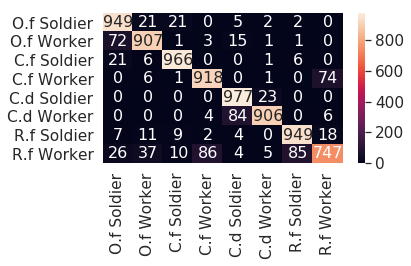

runtime :  6565.8018634319305

[29] accuracy: 0.916 loss: 37.767

[0.815, 0.85625, 0.88175, 0.886375, 0.89325, 0.899125, 0.902, 0.905, 0.90625, 0.907875, 0.90575, 0.910125, 0.909375, 0.911, 0.90925, 0.907875, 0.911125, 0.910125, 0.909875, 0.914375, 0.91475, 0.9135, 0.90975, 0.914125, 0.914375, 0.911875, 0.9165, 0.914875, 0.916125]
[64.11414223909378, 49.904711842536926, 44.67099912464619, 41.61231115460396, 41.263010531663895, 39.30233183503151, 38.275576405227184, 37.62644839286804, 37.14999883621931, 37.15717602521181, 38.36975885927677, 38.00613395869732, 37.108960159122944, 37.26954859495163, 37.773814633488655, 37.71399527788162, 37.36094921082258, 38.73386053740978, 38.443429566919804, 36.634050503373146, 36.48204176872969, 37.40003118664026, 38.07550660520792, 37.081875782459974, 37.04349867999554, 38.456205144524574, 36.58829292654991, 37.063568487763405, 37.766623981297016]


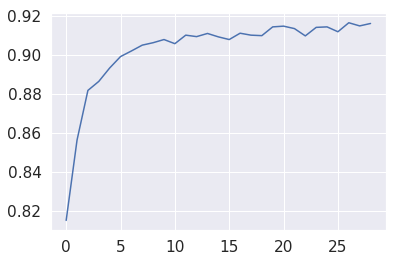

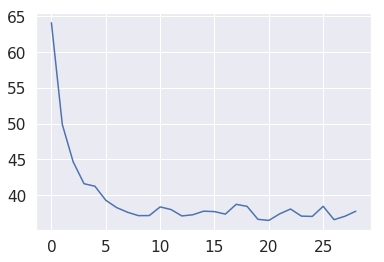

[7, 7, 1, 3, 3, 6, 0, 7, 7, 6, 6, 5, 4, 7, 2, 4, 6, 2, 0, 7, 4, 6, 7, 6, 2, 3, 6, 7, 0, 6, 4, 4, 1, 2, 6, 2, 3, 0, 4, 7, 1, 0, 6, 2, 7, 3, 7, 0, 4, 3, 3, 4, 7, 4, 4, 7, 1, 7, 7, 6, 3, 2, 2, 1, 2, 0, 4, 0, 1, 4, 6, 3, 0, 7, 7, 6, 0, 6, 7, 0, 1, 0, 1, 6, 1, 4, 3, 3, 6, 0, 0, 7, 4, 2, 1, 3, 0, 3, 3, 7, 0, 6, 1, 2, 7, 6, 4, 4, 7, 1, 5, 0, 4, 4, 6, 3, 4, 0, 1, 3, 4, 0, 1, 7, 1, 4, 1, 0, 3, 4, 0, 7, 0, 6, 6, 7, 0, 4, 6, 2, 2, 3, 4, 2, 3, 6, 5, 1, 0, 7, 6, 0, 5, 5, 6, 0, 0, 6, 5, 7, 0, 3, 4, 1, 6, 6, 2, 4, 6, 2, 3, 1, 3, 4, 1, 2, 6, 0, 0, 6, 2, 6, 5, 3, 0, 5, 7, 3, 0, 5, 7, 0, 0, 2, 7, 0, 6, 6, 3, 0, 0, 5, 2, 5, 1, 6, 4, 7, 4, 4, 1, 4, 6, 4, 3, 6, 4, 7, 4, 4, 7, 0, 0, 0, 0, 3, 0, 7, 2, 0, 2, 5, 0, 1, 0, 7, 6, 2, 7, 6, 4, 3, 3, 6, 3, 3, 1, 7, 0, 6, 6, 0, 0, 3, 3, 2, 1, 4, 1, 4, 1, 0, 1, 2, 7, 4, 4, 7, 6, 6, 4, 3, 3, 5, 3, 3, 3, 1, 2, 4, 5, 1, 0, 3, 0, 0, 0, 1, 4, 6, 4, 1, 1, 0, 7, 2, 7, 6, 7, 0, 2, 4, 6, 7, 7, 3, 1, 0, 7, 6, 3, 1, 4, 5, 1, 3, 7, 7, 5, 0, 6, 2, 4, 6, 3, 3, 4, 0, 4, 0, 7, 0, 6, 

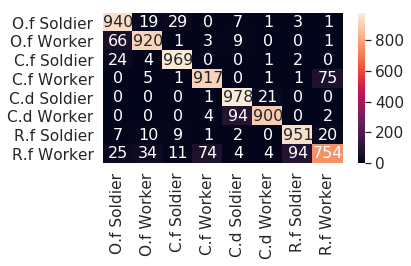

runtime :  6798.784254312515

[30] accuracy: 0.913 loss: 38.038

[0.815, 0.85625, 0.88175, 0.886375, 0.89325, 0.899125, 0.902, 0.905, 0.90625, 0.907875, 0.90575, 0.910125, 0.909375, 0.911, 0.90925, 0.907875, 0.911125, 0.910125, 0.909875, 0.914375, 0.91475, 0.9135, 0.90975, 0.914125, 0.914375, 0.911875, 0.9165, 0.914875, 0.916125, 0.912875]
[64.11414223909378, 49.904711842536926, 44.67099912464619, 41.61231115460396, 41.263010531663895, 39.30233183503151, 38.275576405227184, 37.62644839286804, 37.14999883621931, 37.15717602521181, 38.36975885927677, 38.00613395869732, 37.108960159122944, 37.26954859495163, 37.773814633488655, 37.71399527788162, 37.36094921082258, 38.73386053740978, 38.443429566919804, 36.634050503373146, 36.48204176872969, 37.40003118664026, 38.07550660520792, 37.081875782459974, 37.04349867999554, 38.456205144524574, 36.58829292654991, 37.063568487763405, 37.766623981297016, 38.03842497617006]


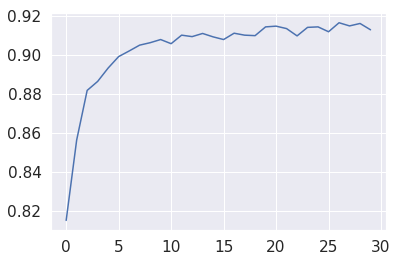

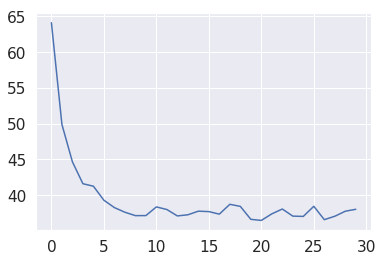

[7, 4, 2, 7, 0, 0, 1, 1, 7, 7, 4, 7, 4, 2, 0, 5, 2, 6, 7, 4, 4, 7, 0, 6, 4, 5, 0, 0, 3, 4, 7, 4, 2, 0, 6, 0, 3, 3, 1, 0, 4, 4, 7, 6, 5, 0, 0, 0, 1, 0, 3, 0, 7, 0, 7, 6, 1, 6, 7, 3, 6, 0, 4, 3, 4, 4, 4, 4, 6, 3, 3, 4, 5, 0, 7, 1, 7, 3, 4, 7, 6, 6, 0, 4, 2, 1, 1, 5, 2, 6, 4, 0, 7, 4, 0, 1, 4, 3, 5, 1, 0, 3, 3, 4, 1, 6, 3, 1, 1, 1, 1, 4, 7, 6, 0, 2, 6, 3, 6, 3, 3, 4, 2, 2, 1, 6, 6, 2, 3, 1, 1, 6, 0, 4, 0, 2, 2, 0, 6, 6, 5, 4, 6, 1, 4, 7, 4, 2, 3, 7, 3, 3, 6, 4, 4, 2, 2, 7, 2, 3, 5, 2, 7, 4, 7, 5, 0, 3, 7, 2, 0, 2, 0, 2, 6, 3, 0, 6, 3, 3, 0, 7, 6, 6, 6, 7, 6, 1, 0, 3, 0, 3, 4, 4, 6, 4, 0, 2, 6, 5, 0, 0, 3, 3, 1, 3, 1, 2, 7, 4, 0, 3, 2, 6, 7, 0, 0, 7, 6, 7, 7, 7, 3, 3, 1, 7, 2, 5, 2, 7, 4, 0, 7, 3, 6, 6, 0, 1, 4, 3, 7, 4, 4, 0, 4, 0, 5, 2, 1, 1, 6, 4, 1, 6, 4, 0, 0, 3, 4, 3, 7, 4, 3, 1, 0, 3, 7, 0, 3, 3, 7, 6, 6, 4, 0, 4, 3, 7, 3, 6, 0, 6, 4, 4, 3, 4, 6, 4, 7, 3, 0, 7, 0, 7, 2, 0, 2, 0, 0, 3, 3, 3, 6, 6, 6, 2, 6, 1, 6, 4, 1, 0, 4, 1, 6, 7, 4, 3, 3, 6, 4, 2, 3, 7, 6, 2, 6, 6, 7, 4, 4, 7, 6, 

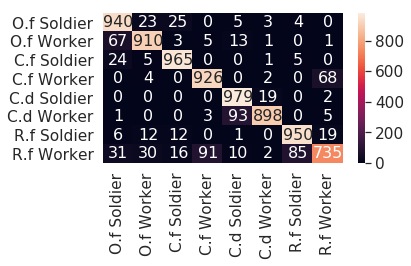

runtime :  7032.60597038269

[31] accuracy: 0.918 loss: 36.309

[0.815, 0.85625, 0.88175, 0.886375, 0.89325, 0.899125, 0.902, 0.905, 0.90625, 0.907875, 0.90575, 0.910125, 0.909375, 0.911, 0.90925, 0.907875, 0.911125, 0.910125, 0.909875, 0.914375, 0.91475, 0.9135, 0.90975, 0.914125, 0.914375, 0.911875, 0.9165, 0.914875, 0.916125, 0.912875, 0.917875]
[64.11414223909378, 49.904711842536926, 44.67099912464619, 41.61231115460396, 41.263010531663895, 39.30233183503151, 38.275576405227184, 37.62644839286804, 37.14999883621931, 37.15717602521181, 38.36975885927677, 38.00613395869732, 37.108960159122944, 37.26954859495163, 37.773814633488655, 37.71399527788162, 37.36094921082258, 38.73386053740978, 38.443429566919804, 36.634050503373146, 36.48204176872969, 37.40003118664026, 38.07550660520792, 37.081875782459974, 37.04349867999554, 38.456205144524574, 36.58829292654991, 37.063568487763405, 37.766623981297016, 38.03842497617006, 36.30857773125172]


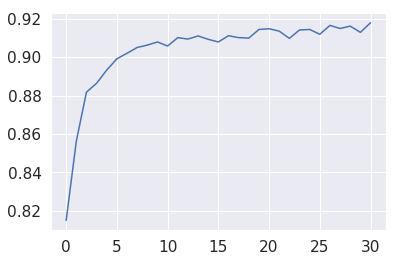

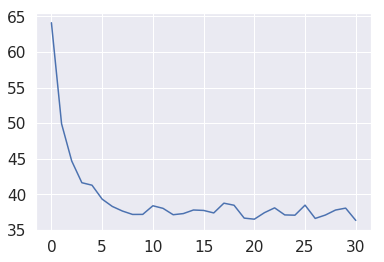

[6, 6, 3, 0, 0, 1, 3, 6, 4, 7, 7, 0, 6, 4, 1, 3, 0, 0, 4, 2, 0, 3, 0, 0, 6, 1, 6, 7, 6, 3, 4, 2, 6, 7, 2, 7, 6, 3, 5, 4, 4, 2, 3, 5, 3, 5, 7, 2, 4, 2, 1, 6, 7, 0, 3, 0, 0, 3, 0, 3, 6, 7, 7, 2, 4, 5, 3, 7, 1, 4, 1, 6, 5, 4, 0, 1, 7, 2, 7, 1, 3, 6, 4, 6, 6, 3, 0, 4, 3, 4, 2, 4, 6, 4, 7, 0, 1, 1, 6, 0, 7, 7, 4, 4, 4, 2, 5, 3, 0, 0, 4, 5, 0, 5, 6, 0, 0, 3, 4, 3, 1, 7, 4, 7, 3, 1, 0, 6, 0, 0, 0, 6, 7, 3, 3, 6, 5, 0, 6, 5, 0, 0, 2, 6, 6, 1, 3, 1, 0, 0, 0, 4, 7, 6, 0, 1, 1, 5, 7, 0, 1, 2, 5, 3, 5, 4, 5, 4, 6, 6, 0, 0, 2, 3, 6, 1, 0, 4, 6, 2, 2, 3, 1, 4, 7, 7, 4, 7, 3, 4, 6, 6, 1, 7, 0, 7, 4, 3, 7, 4, 3, 3, 6, 5, 0, 1, 0, 0, 7, 6, 7, 4, 6, 1, 6, 0, 6, 1, 6, 4, 0, 0, 7, 4, 3, 4, 6, 3, 3, 7, 6, 6, 0, 1, 6, 4, 5, 0, 0, 6, 6, 6, 0, 5, 3, 0, 4, 6, 3, 0, 0, 6, 3, 7, 4, 1, 4, 6, 0, 7, 0, 6, 1, 0, 1, 0, 0, 0, 4, 0, 3, 4, 0, 6, 4, 2, 0, 2, 3, 0, 6, 2, 3, 0, 7, 4, 4, 4, 7, 4, 1, 7, 3, 2, 2, 0, 6, 0, 3, 3, 4, 4, 3, 7, 6, 0, 6, 4, 3, 0, 3, 4, 0, 1, 6, 4, 1, 0, 4, 6, 7, 7, 0, 1, 0, 4, 6, 6, 0, 0, 6, 7, 0, 

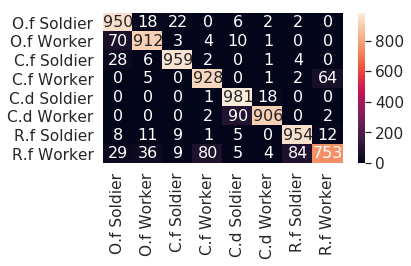

runtime :  7265.443756341934

[32] accuracy: 0.918 loss: 35.701

[0.815, 0.85625, 0.88175, 0.886375, 0.89325, 0.899125, 0.902, 0.905, 0.90625, 0.907875, 0.90575, 0.910125, 0.909375, 0.911, 0.90925, 0.907875, 0.911125, 0.910125, 0.909875, 0.914375, 0.91475, 0.9135, 0.90975, 0.914125, 0.914375, 0.911875, 0.9165, 0.914875, 0.916125, 0.912875, 0.917875, 0.917875]
[64.11414223909378, 49.904711842536926, 44.67099912464619, 41.61231115460396, 41.263010531663895, 39.30233183503151, 38.275576405227184, 37.62644839286804, 37.14999883621931, 37.15717602521181, 38.36975885927677, 38.00613395869732, 37.108960159122944, 37.26954859495163, 37.773814633488655, 37.71399527788162, 37.36094921082258, 38.73386053740978, 38.443429566919804, 36.634050503373146, 36.48204176872969, 37.40003118664026, 38.07550660520792, 37.081875782459974, 37.04349867999554, 38.456205144524574, 36.58829292654991, 37.063568487763405, 37.766623981297016, 38.03842497617006, 36.30857773125172, 35.70131376385689]


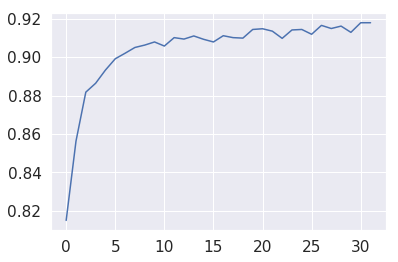

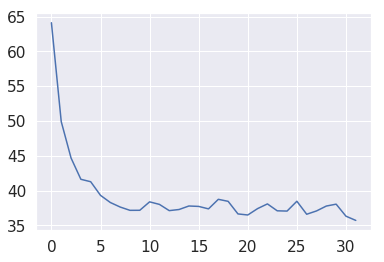

[7, 6, 0, 6, 3, 3, 6, 6, 4, 1, 3, 7, 0, 7, 1, 1, 7, 2, 3, 6, 1, 3, 6, 2, 5, 3, 7, 7, 1, 3, 7, 0, 0, 7, 4, 1, 4, 7, 7, 3, 4, 0, 4, 4, 7, 4, 1, 7, 1, 0, 3, 7, 3, 3, 1, 4, 1, 3, 3, 2, 3, 0, 3, 0, 4, 7, 7, 6, 2, 0, 1, 7, 4, 7, 7, 6, 7, 7, 1, 4, 0, 6, 6, 4, 0, 2, 4, 4, 1, 3, 2, 4, 4, 6, 7, 7, 7, 4, 3, 2, 4, 6, 0, 1, 0, 0, 0, 4, 6, 6, 3, 4, 3, 3, 4, 2, 4, 6, 6, 3, 1, 1, 3, 7, 4, 6, 3, 4, 6, 7, 4, 7, 3, 0, 1, 0, 5, 1, 4, 6, 5, 0, 2, 0, 3, 0, 3, 1, 5, 4, 5, 3, 0, 6, 3, 4, 6, 1, 7, 1, 7, 1, 1, 4, 6, 7, 4, 0, 7, 0, 5, 6, 4, 0, 0, 0, 7, 0, 4, 3, 3, 5, 6, 6, 1, 4, 7, 2, 4, 3, 6, 0, 1, 0, 4, 0, 4, 0, 5, 3, 7, 2, 4, 3, 5, 6, 0, 3, 0, 6, 0, 4, 3, 0, 3, 6, 3, 0, 4, 0, 0, 0, 0, 0, 2, 3, 4, 0, 4, 0, 2, 4, 0, 2, 2, 6, 7, 0, 4, 3, 0, 7, 6, 1, 4, 3, 6, 3, 2, 4, 4, 6, 0, 7, 1, 4, 0, 7, 4, 0, 3, 4, 6, 7, 1, 3, 0, 7, 4, 7, 4, 7, 3, 7, 4, 3, 7, 0, 2, 7, 7, 3, 6, 0, 2, 4, 4, 0, 7, 7, 0, 1, 4, 2, 4, 4, 1, 2, 5, 7, 3, 4, 7, 7, 2, 4, 4, 2, 5, 0, 3, 2, 4, 3, 1, 3, 6, 6, 4, 0, 4, 4, 6, 2, 2, 0, 1, 1, 0, 4, 7, 0, 1, 

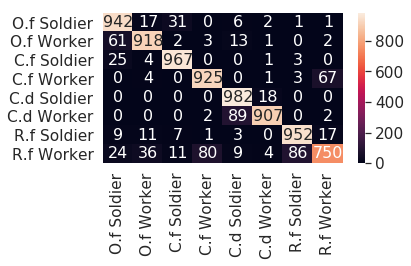

runtime :  7499.951281547546

[33] accuracy: 0.914 loss: 37.605

[0.815, 0.85625, 0.88175, 0.886375, 0.89325, 0.899125, 0.902, 0.905, 0.90625, 0.907875, 0.90575, 0.910125, 0.909375, 0.911, 0.90925, 0.907875, 0.911125, 0.910125, 0.909875, 0.914375, 0.91475, 0.9135, 0.90975, 0.914125, 0.914375, 0.911875, 0.9165, 0.914875, 0.916125, 0.912875, 0.917875, 0.917875, 0.913875]
[64.11414223909378, 49.904711842536926, 44.67099912464619, 41.61231115460396, 41.263010531663895, 39.30233183503151, 38.275576405227184, 37.62644839286804, 37.14999883621931, 37.15717602521181, 38.36975885927677, 38.00613395869732, 37.108960159122944, 37.26954859495163, 37.773814633488655, 37.71399527788162, 37.36094921082258, 38.73386053740978, 38.443429566919804, 36.634050503373146, 36.48204176872969, 37.40003118664026, 38.07550660520792, 37.081875782459974, 37.04349867999554, 38.456205144524574, 36.58829292654991, 37.063568487763405, 37.766623981297016, 38.03842497617006, 36.30857773125172, 35.70131376385689, 37.60530

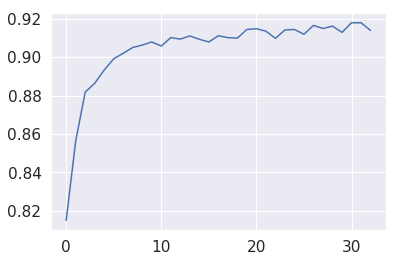

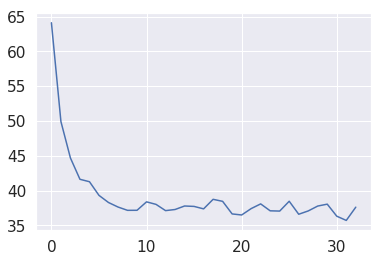

[2, 6, 4, 0, 7, 3, 4, 0, 7, 6, 1, 6, 6, 1, 6, 0, 4, 2, 7, 7, 3, 5, 6, 2, 1, 7, 7, 1, 4, 1, 0, 7, 7, 4, 2, 4, 6, 0, 3, 4, 1, 7, 3, 0, 3, 2, 0, 0, 3, 5, 1, 7, 4, 6, 4, 4, 1, 1, 4, 2, 3, 3, 6, 3, 4, 6, 0, 1, 2, 7, 6, 0, 0, 0, 7, 7, 7, 0, 7, 1, 4, 0, 0, 7, 6, 4, 4, 1, 3, 2, 6, 1, 3, 6, 6, 1, 0, 5, 3, 7, 1, 4, 2, 0, 4, 7, 3, 4, 6, 0, 3, 1, 5, 7, 4, 6, 1, 0, 7, 0, 6, 7, 0, 6, 7, 3, 4, 1, 0, 6, 4, 7, 7, 7, 3, 7, 1, 0, 4, 4, 0, 6, 3, 0, 6, 5, 3, 0, 7, 7, 7, 1, 2, 2, 7, 5, 7, 1, 0, 1, 2, 5, 4, 0, 7, 4, 0, 5, 1, 6, 6, 3, 0, 3, 2, 3, 4, 0, 0, 7, 0, 0, 4, 0, 0, 4, 2, 3, 4, 4, 0, 4, 4, 0, 6, 6, 6, 2, 0, 6, 4, 0, 6, 0, 6, 5, 4, 0, 5, 6, 1, 6, 1, 4, 6, 4, 4, 0, 6, 3, 0, 4, 6, 3, 3, 7, 0, 6, 4, 1, 1, 1, 3, 3, 6, 3, 4, 3, 1, 6, 3, 0, 5, 3, 0, 6, 0, 3, 6, 3, 6, 0, 0, 0, 7, 0, 1, 7, 6, 0, 4, 4, 6, 7, 3, 2, 2, 7, 0, 1, 4, 4, 6, 4, 6, 4, 6, 7, 3, 0, 6, 1, 3, 3, 4, 5, 4, 4, 3, 3, 4, 7, 7, 5, 4, 7, 6, 0, 0, 6, 7, 5, 4, 2, 0, 4, 6, 4, 6, 6, 1, 7, 1, 7, 3, 4, 3, 5, 7, 7, 4, 0, 1, 7, 3, 6, 4, 2, 6, 0, 4, 6, 0, 

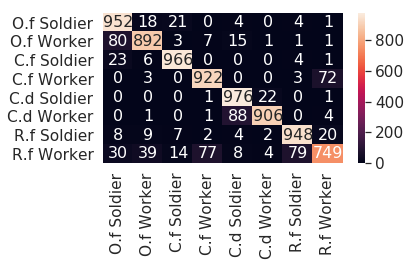

runtime :  7736.455619812012

[34] accuracy: 0.919 loss: 36.708

[0.815, 0.85625, 0.88175, 0.886375, 0.89325, 0.899125, 0.902, 0.905, 0.90625, 0.907875, 0.90575, 0.910125, 0.909375, 0.911, 0.90925, 0.907875, 0.911125, 0.910125, 0.909875, 0.914375, 0.91475, 0.9135, 0.90975, 0.914125, 0.914375, 0.911875, 0.9165, 0.914875, 0.916125, 0.912875, 0.917875, 0.917875, 0.913875, 0.9195]
[64.11414223909378, 49.904711842536926, 44.67099912464619, 41.61231115460396, 41.263010531663895, 39.30233183503151, 38.275576405227184, 37.62644839286804, 37.14999883621931, 37.15717602521181, 38.36975885927677, 38.00613395869732, 37.108960159122944, 37.26954859495163, 37.773814633488655, 37.71399527788162, 37.36094921082258, 38.73386053740978, 38.443429566919804, 36.634050503373146, 36.48204176872969, 37.40003118664026, 38.07550660520792, 37.081875782459974, 37.04349867999554, 38.456205144524574, 36.58829292654991, 37.063568487763405, 37.766623981297016, 38.03842497617006, 36.30857773125172, 35.70131376385689, 

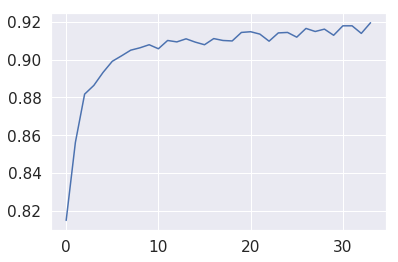

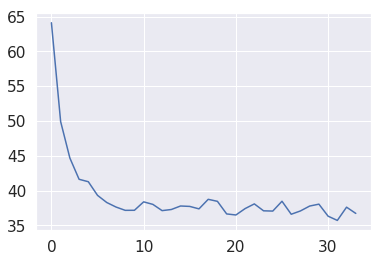

[2, 7, 3, 4, 1, 1, 3, 4, 7, 3, 0, 7, 0, 2, 1, 7, 6, 2, 0, 6, 2, 4, 0, 3, 4, 7, 7, 4, 6, 4, 0, 6, 1, 6, 0, 6, 6, 1, 3, 6, 1, 2, 5, 3, 2, 2, 4, 6, 3, 1, 1, 3, 0, 0, 1, 4, 0, 0, 7, 0, 3, 4, 1, 6, 1, 6, 6, 2, 7, 2, 0, 6, 4, 5, 6, 7, 6, 4, 2, 7, 5, 3, 3, 5, 3, 0, 1, 7, 6, 1, 6, 5, 6, 3, 6, 6, 4, 3, 4, 4, 1, 6, 4, 1, 7, 1, 3, 2, 6, 6, 7, 3, 1, 5, 3, 4, 1, 7, 1, 7, 3, 3, 0, 4, 7, 7, 4, 4, 3, 5, 3, 4, 4, 2, 5, 0, 2, 4, 2, 7, 4, 0, 3, 4, 6, 4, 6, 4, 3, 1, 5, 4, 7, 5, 3, 0, 3, 7, 5, 4, 0, 0, 4, 3, 2, 1, 3, 3, 3, 6, 7, 4, 4, 1, 3, 3, 7, 6, 2, 1, 7, 3, 0, 0, 2, 7, 5, 5, 7, 2, 7, 5, 2, 4, 7, 0, 6, 7, 6, 0, 2, 0, 4, 4, 4, 1, 2, 6, 1, 0, 0, 5, 6, 4, 7, 3, 5, 7, 7, 0, 4, 2, 0, 1, 0, 6, 0, 4, 4, 0, 3, 0, 1, 0, 2, 7, 7, 3, 1, 4, 7, 0, 7, 4, 4, 1, 4, 3, 7, 4, 0, 0, 7, 2, 6, 3, 4, 3, 3, 0, 4, 1, 4, 4, 7, 0, 3, 3, 3, 0, 4, 6, 5, 7, 1, 6, 3, 0, 6, 6, 7, 2, 2, 2, 0, 7, 7, 6, 6, 7, 0, 6, 4, 7, 4, 3, 0, 3, 2, 1, 4, 7, 0, 6, 0, 3, 3, 4, 3, 7, 3, 6, 6, 3, 3, 0, 7, 7, 7, 6, 4, 3, 7, 7, 6, 7, 6, 6, 7, 3, 7, 2, 0, 

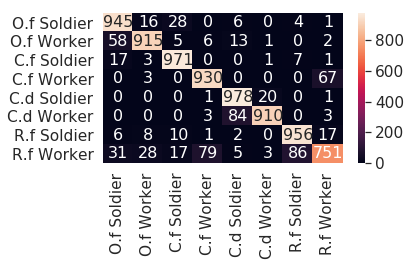

runtime :  7971.282685995102

[35] accuracy: 0.918 loss: 36.528

[0.815, 0.85625, 0.88175, 0.886375, 0.89325, 0.899125, 0.902, 0.905, 0.90625, 0.907875, 0.90575, 0.910125, 0.909375, 0.911, 0.90925, 0.907875, 0.911125, 0.910125, 0.909875, 0.914375, 0.91475, 0.9135, 0.90975, 0.914125, 0.914375, 0.911875, 0.9165, 0.914875, 0.916125, 0.912875, 0.917875, 0.917875, 0.913875, 0.9195, 0.918375]
[64.11414223909378, 49.904711842536926, 44.67099912464619, 41.61231115460396, 41.263010531663895, 39.30233183503151, 38.275576405227184, 37.62644839286804, 37.14999883621931, 37.15717602521181, 38.36975885927677, 38.00613395869732, 37.108960159122944, 37.26954859495163, 37.773814633488655, 37.71399527788162, 37.36094921082258, 38.73386053740978, 38.443429566919804, 36.634050503373146, 36.48204176872969, 37.40003118664026, 38.07550660520792, 37.081875782459974, 37.04349867999554, 38.456205144524574, 36.58829292654991, 37.063568487763405, 37.766623981297016, 38.03842497617006, 36.30857773125172, 35.701313

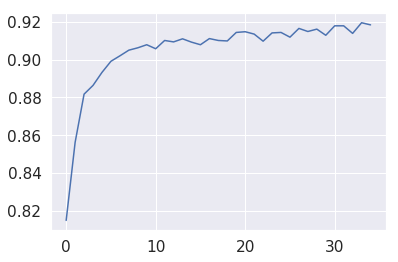

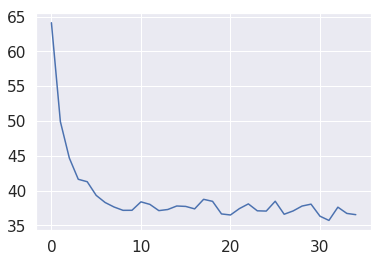

[0, 3, 4, 1, 3, 6, 6, 1, 3, 7, 0, 6, 1, 0, 5, 7, 0, 0, 2, 0, 4, 0, 2, 6, 1, 7, 4, 7, 6, 4, 6, 6, 0, 4, 3, 0, 0, 4, 5, 7, 6, 3, 6, 4, 0, 6, 3, 0, 1, 2, 1, 4, 2, 3, 0, 5, 4, 7, 2, 7, 0, 5, 0, 6, 1, 0, 1, 6, 6, 3, 4, 3, 4, 7, 7, 4, 7, 0, 0, 0, 4, 6, 4, 3, 6, 3, 3, 0, 0, 1, 6, 4, 0, 3, 6, 4, 7, 3, 0, 4, 6, 0, 4, 4, 7, 6, 4, 2, 2, 7, 6, 1, 6, 7, 0, 2, 7, 6, 6, 4, 2, 1, 6, 6, 6, 7, 4, 6, 4, 0, 3, 3, 7, 1, 3, 3, 6, 3, 4, 4, 0, 1, 3, 2, 6, 7, 3, 4, 6, 3, 7, 7, 5, 1, 2, 1, 1, 4, 7, 1, 7, 4, 6, 4, 4, 6, 3, 1, 6, 7, 1, 4, 3, 1, 3, 4, 6, 0, 1, 0, 6, 0, 0, 0, 0, 0, 1, 0, 0, 4, 3, 7, 7, 7, 7, 4, 1, 0, 6, 1, 3, 2, 3, 3, 1, 3, 0, 3, 7, 0, 1, 3, 1, 0, 7, 2, 1, 3, 4, 2, 7, 4, 4, 0, 4, 4, 4, 2, 2, 0, 6, 4, 2, 2, 6, 7, 7, 7, 1, 1, 4, 4, 3, 7, 7, 6, 4, 6, 3, 3, 3, 3, 0, 0, 1, 3, 7, 0, 0, 7, 0, 6, 7, 1, 1, 4, 3, 0, 0, 0, 2, 7, 3, 4, 2, 6, 0, 4, 6, 0, 4, 4, 0, 6, 3, 1, 7, 0, 6, 0, 6, 4, 2, 4, 6, 4, 7, 3, 0, 6, 0, 3, 4, 1, 6, 0, 4, 1, 7, 0, 6, 0, 4, 6, 5, 0, 1, 6, 7, 7, 7, 1, 2, 7, 7, 0, 4, 6, 0, 2, 5, 4, 3, 

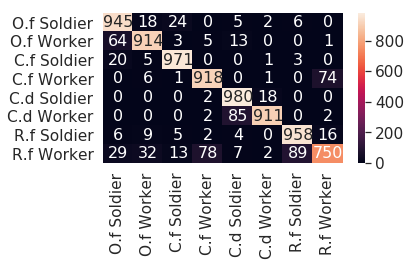

runtime :  8207.933832883835

[36] accuracy: 0.920 loss: 36.237

[0.815, 0.85625, 0.88175, 0.886375, 0.89325, 0.899125, 0.902, 0.905, 0.90625, 0.907875, 0.90575, 0.910125, 0.909375, 0.911, 0.90925, 0.907875, 0.911125, 0.910125, 0.909875, 0.914375, 0.91475, 0.9135, 0.90975, 0.914125, 0.914375, 0.911875, 0.9165, 0.914875, 0.916125, 0.912875, 0.917875, 0.917875, 0.913875, 0.9195, 0.918375, 0.9205]
[64.11414223909378, 49.904711842536926, 44.67099912464619, 41.61231115460396, 41.263010531663895, 39.30233183503151, 38.275576405227184, 37.62644839286804, 37.14999883621931, 37.15717602521181, 38.36975885927677, 38.00613395869732, 37.108960159122944, 37.26954859495163, 37.773814633488655, 37.71399527788162, 37.36094921082258, 38.73386053740978, 38.443429566919804, 36.634050503373146, 36.48204176872969, 37.40003118664026, 38.07550660520792, 37.081875782459974, 37.04349867999554, 38.456205144524574, 36.58829292654991, 37.063568487763405, 37.766623981297016, 38.03842497617006, 36.30857773125172, 3

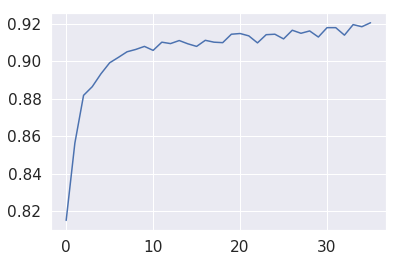

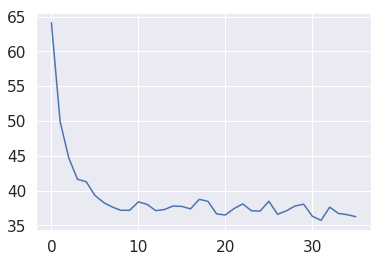

[3, 0, 3, 4, 7, 6, 0, 0, 1, 4, 3, 2, 4, 1, 3, 4, 1, 0, 0, 0, 4, 2, 0, 4, 6, 7, 2, 4, 6, 1, 4, 3, 7, 4, 3, 2, 2, 6, 6, 6, 7, 2, 6, 6, 4, 6, 4, 0, 3, 0, 3, 1, 4, 0, 1, 4, 3, 1, 3, 7, 5, 4, 4, 6, 3, 4, 5, 2, 0, 4, 1, 0, 5, 6, 6, 4, 6, 1, 0, 7, 0, 3, 7, 2, 6, 5, 3, 3, 0, 0, 1, 6, 0, 3, 1, 7, 0, 4, 0, 6, 7, 4, 3, 3, 4, 7, 0, 6, 7, 0, 0, 1, 4, 4, 4, 4, 3, 0, 0, 0, 7, 4, 7, 0, 0, 0, 3, 0, 4, 6, 3, 7, 1, 7, 0, 4, 7, 2, 7, 2, 4, 4, 3, 4, 0, 6, 7, 6, 2, 6, 7, 7, 3, 7, 6, 4, 0, 5, 0, 3, 5, 3, 3, 0, 0, 0, 6, 7, 0, 6, 1, 2, 6, 4, 1, 4, 3, 5, 3, 6, 0, 3, 3, 3, 3, 2, 0, 7, 3, 7, 7, 0, 7, 3, 2, 4, 0, 2, 3, 6, 4, 4, 4, 6, 6, 7, 0, 5, 5, 1, 6, 4, 7, 7, 4, 4, 3, 7, 0, 0, 5, 1, 0, 7, 4, 6, 0, 3, 6, 6, 6, 4, 1, 4, 0, 0, 1, 0, 1, 4, 2, 6, 5, 0, 0, 7, 6, 6, 5, 1, 3, 6, 0, 2, 2, 3, 2, 5, 7, 5, 4, 2, 0, 2, 6, 6, 1, 4, 5, 6, 0, 1, 0, 4, 4, 0, 7, 4, 1, 0, 7, 4, 4, 6, 6, 4, 6, 4, 0, 3, 4, 5, 2, 4, 2, 4, 3, 7, 7, 3, 7, 6, 7, 0, 3, 4, 7, 3, 4, 0, 7, 6, 0, 2, 0, 3, 0, 4, 7, 7, 1, 0, 4, 4, 6, 2, 4, 3, 0, 7, 7, 6, 4, 

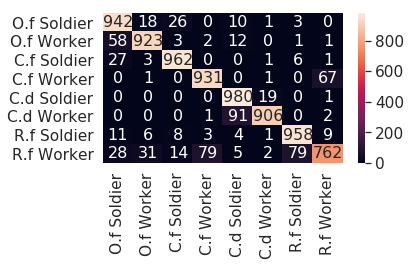

runtime :  8443.675339460373

[37] accuracy: 0.918 loss: 36.379

[0.815, 0.85625, 0.88175, 0.886375, 0.89325, 0.899125, 0.902, 0.905, 0.90625, 0.907875, 0.90575, 0.910125, 0.909375, 0.911, 0.90925, 0.907875, 0.911125, 0.910125, 0.909875, 0.914375, 0.91475, 0.9135, 0.90975, 0.914125, 0.914375, 0.911875, 0.9165, 0.914875, 0.916125, 0.912875, 0.917875, 0.917875, 0.913875, 0.9195, 0.918375, 0.9205, 0.917875]
[64.11414223909378, 49.904711842536926, 44.67099912464619, 41.61231115460396, 41.263010531663895, 39.30233183503151, 38.275576405227184, 37.62644839286804, 37.14999883621931, 37.15717602521181, 38.36975885927677, 38.00613395869732, 37.108960159122944, 37.26954859495163, 37.773814633488655, 37.71399527788162, 37.36094921082258, 38.73386053740978, 38.443429566919804, 36.634050503373146, 36.48204176872969, 37.40003118664026, 38.07550660520792, 37.081875782459974, 37.04349867999554, 38.456205144524574, 36.58829292654991, 37.063568487763405, 37.766623981297016, 38.03842497617006, 36.3085777

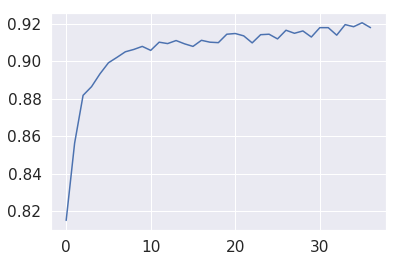

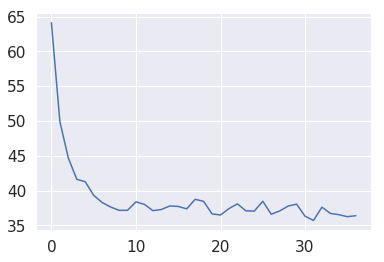

[0, 3, 4, 0, 1, 2, 3, 0, 1, 1, 6, 4, 1, 4, 0, 6, 2, 4, 4, 7, 3, 7, 5, 0, 6, 3, 1, 7, 6, 4, 0, 7, 0, 1, 7, 0, 4, 2, 1, 1, 6, 5, 0, 3, 0, 6, 5, 0, 7, 6, 4, 0, 0, 4, 4, 3, 7, 4, 0, 6, 4, 0, 4, 3, 4, 4, 6, 2, 1, 5, 0, 1, 4, 2, 4, 5, 2, 2, 1, 7, 7, 0, 0, 4, 4, 1, 0, 0, 3, 1, 2, 1, 4, 0, 6, 7, 5, 4, 4, 7, 3, 1, 1, 3, 0, 6, 6, 4, 0, 6, 0, 2, 0, 7, 0, 1, 4, 3, 6, 4, 4, 3, 0, 7, 1, 4, 2, 3, 3, 7, 4, 4, 6, 1, 5, 3, 0, 7, 2, 3, 7, 2, 7, 4, 2, 4, 2, 4, 0, 3, 6, 6, 2, 7, 3, 2, 2, 4, 0, 6, 0, 5, 3, 0, 7, 2, 0, 2, 6, 7, 7, 3, 5, 3, 7, 1, 5, 5, 4, 7, 7, 6, 6, 2, 4, 6, 5, 3, 0, 7, 7, 6, 5, 0, 4, 7, 4, 0, 0, 6, 3, 3, 3, 0, 1, 2, 6, 2, 7, 1, 3, 1, 2, 4, 3, 0, 2, 7, 7, 4, 3, 7, 6, 5, 0, 7, 3, 3, 0, 0, 7, 3, 3, 0, 4, 0, 4, 4, 4, 3, 7, 3, 4, 3, 2, 7, 5, 1, 0, 3, 4, 3, 4, 6, 1, 7, 6, 7, 4, 2, 1, 4, 7, 2, 0, 0, 7, 3, 6, 0, 6, 6, 6, 3, 5, 0, 6, 7, 0, 7, 7, 5, 1, 4, 0, 3, 7, 7, 7, 7, 6, 7, 0, 2, 4, 0, 7, 6, 6, 5, 6, 1, 6, 1, 0, 7, 1, 3, 3, 4, 4, 6, 1, 2, 3, 0, 7, 0, 3, 6, 0, 6, 7, 7, 5, 6, 0, 1, 2, 6, 7, 4, 3, 

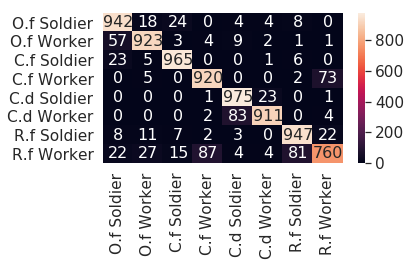

runtime :  8678.397727966309

[38] accuracy: 0.919 loss: 35.868

[0.815, 0.85625, 0.88175, 0.886375, 0.89325, 0.899125, 0.902, 0.905, 0.90625, 0.907875, 0.90575, 0.910125, 0.909375, 0.911, 0.90925, 0.907875, 0.911125, 0.910125, 0.909875, 0.914375, 0.91475, 0.9135, 0.90975, 0.914125, 0.914375, 0.911875, 0.9165, 0.914875, 0.916125, 0.912875, 0.917875, 0.917875, 0.913875, 0.9195, 0.918375, 0.9205, 0.917875, 0.918625]
[64.11414223909378, 49.904711842536926, 44.67099912464619, 41.61231115460396, 41.263010531663895, 39.30233183503151, 38.275576405227184, 37.62644839286804, 37.14999883621931, 37.15717602521181, 38.36975885927677, 38.00613395869732, 37.108960159122944, 37.26954859495163, 37.773814633488655, 37.71399527788162, 37.36094921082258, 38.73386053740978, 38.443429566919804, 36.634050503373146, 36.48204176872969, 37.40003118664026, 38.07550660520792, 37.081875782459974, 37.04349867999554, 38.456205144524574, 36.58829292654991, 37.063568487763405, 37.766623981297016, 38.03842497617006, 

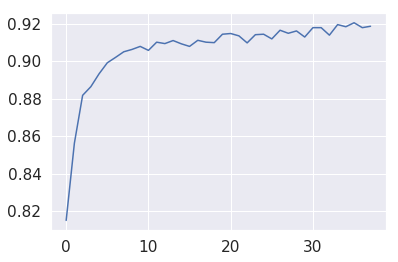

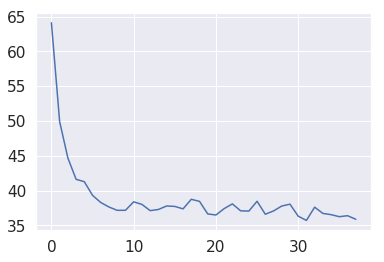

[4, 6, 6, 0, 7, 2, 1, 4, 5, 3, 7, 0, 4, 0, 3, 4, 2, 7, 6, 3, 7, 3, 0, 0, 7, 0, 1, 4, 2, 1, 0, 5, 6, 2, 7, 4, 3, 6, 2, 4, 7, 4, 4, 0, 4, 3, 1, 0, 1, 0, 3, 4, 4, 3, 7, 4, 6, 6, 4, 4, 1, 7, 3, 4, 3, 0, 0, 7, 7, 5, 6, 7, 4, 0, 4, 4, 3, 0, 4, 6, 1, 0, 1, 4, 3, 1, 7, 6, 2, 3, 2, 1, 0, 4, 2, 1, 7, 4, 7, 0, 3, 3, 6, 3, 5, 3, 6, 1, 4, 7, 7, 5, 6, 4, 3, 7, 6, 1, 7, 1, 6, 0, 3, 6, 7, 2, 0, 1, 0, 4, 0, 4, 4, 7, 0, 6, 3, 6, 0, 0, 4, 0, 4, 2, 4, 4, 0, 4, 3, 1, 0, 3, 2, 1, 5, 3, 0, 3, 4, 4, 1, 3, 0, 0, 4, 2, 1, 3, 4, 1, 5, 3, 1, 0, 4, 4, 4, 4, 4, 2, 4, 6, 1, 7, 6, 0, 7, 6, 1, 4, 7, 7, 0, 0, 7, 4, 0, 3, 0, 7, 3, 7, 4, 6, 2, 4, 7, 7, 3, 6, 5, 7, 1, 2, 7, 3, 7, 6, 6, 4, 6, 1, 3, 0, 3, 1, 0, 0, 6, 0, 3, 3, 3, 0, 4, 3, 1, 0, 3, 1, 0, 3, 5, 7, 0, 5, 7, 6, 0, 4, 1, 1, 3, 3, 0, 0, 4, 7, 2, 4, 1, 2, 4, 4, 1, 0, 6, 0, 4, 1, 6, 7, 4, 0, 6, 1, 4, 0, 1, 3, 2, 2, 1, 2, 1, 3, 4, 6, 7, 1, 7, 4, 1, 0, 2, 4, 1, 4, 4, 2, 5, 2, 3, 7, 2, 3, 7, 7, 4, 4, 0, 3, 0, 6, 6, 0, 6, 7, 6, 4, 4, 0, 2, 3, 6, 1, 4, 6, 3, 3, 1, 4, 0, 

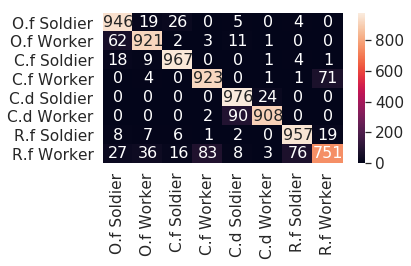

runtime :  8912.23375415802

[39] accuracy: 0.921 loss: 37.023

[0.815, 0.85625, 0.88175, 0.886375, 0.89325, 0.899125, 0.902, 0.905, 0.90625, 0.907875, 0.90575, 0.910125, 0.909375, 0.911, 0.90925, 0.907875, 0.911125, 0.910125, 0.909875, 0.914375, 0.91475, 0.9135, 0.90975, 0.914125, 0.914375, 0.911875, 0.9165, 0.914875, 0.916125, 0.912875, 0.917875, 0.917875, 0.913875, 0.9195, 0.918375, 0.9205, 0.917875, 0.918625, 0.921375]
[64.11414223909378, 49.904711842536926, 44.67099912464619, 41.61231115460396, 41.263010531663895, 39.30233183503151, 38.275576405227184, 37.62644839286804, 37.14999883621931, 37.15717602521181, 38.36975885927677, 38.00613395869732, 37.108960159122944, 37.26954859495163, 37.773814633488655, 37.71399527788162, 37.36094921082258, 38.73386053740978, 38.443429566919804, 36.634050503373146, 36.48204176872969, 37.40003118664026, 38.07550660520792, 37.081875782459974, 37.04349867999554, 38.456205144524574, 36.58829292654991, 37.063568487763405, 37.766623981297016, 38.0384249

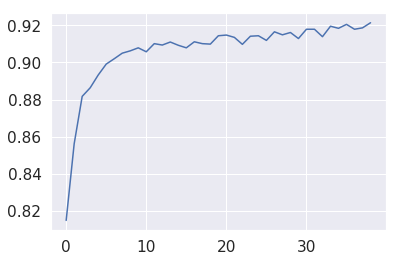

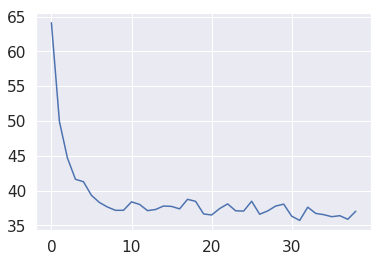

[6, 1, 0, 6, 7, 6, 3, 3, 7, 6, 6, 4, 1, 0, 4, 1, 3, 1, 7, 1, 2, 0, 4, 0, 4, 4, 1, 6, 7, 2, 3, 4, 2, 5, 6, 4, 1, 1, 0, 4, 3, 0, 5, 2, 0, 6, 0, 3, 7, 3, 1, 2, 3, 4, 5, 4, 6, 5, 5, 0, 2, 0, 3, 1, 4, 6, 6, 4, 6, 4, 3, 1, 3, 2, 0, 6, 4, 6, 4, 0, 3, 7, 6, 2, 4, 4, 5, 0, 1, 2, 7, 0, 6, 7, 3, 0, 6, 5, 4, 7, 3, 3, 3, 5, 5, 1, 6, 0, 0, 7, 4, 1, 7, 4, 2, 2, 4, 7, 4, 3, 2, 6, 1, 2, 6, 3, 0, 0, 3, 2, 0, 2, 2, 2, 6, 4, 6, 1, 6, 2, 4, 1, 1, 3, 1, 5, 0, 5, 1, 7, 4, 6, 3, 3, 2, 7, 4, 5, 6, 5, 0, 2, 0, 7, 2, 1, 2, 2, 7, 5, 4, 0, 0, 1, 7, 7, 6, 6, 1, 0, 6, 0, 7, 4, 7, 7, 2, 6, 0, 7, 0, 2, 3, 1, 3, 0, 1, 0, 3, 5, 0, 0, 7, 6, 7, 6, 0, 3, 1, 3, 3, 3, 1, 4, 4, 4, 4, 4, 3, 4, 7, 4, 4, 4, 5, 4, 6, 2, 3, 0, 3, 4, 1, 3, 6, 6, 7, 0, 6, 4, 3, 3, 3, 7, 4, 0, 6, 3, 7, 3, 0, 0, 7, 6, 7, 0, 6, 0, 4, 0, 6, 7, 7, 7, 7, 1, 5, 3, 0, 7, 7, 7, 0, 1, 4, 1, 0, 2, 7, 4, 6, 4, 4, 2, 2, 3, 1, 7, 4, 6, 1, 7, 6, 3, 6, 0, 4, 0, 4, 1, 0, 4, 3, 4, 4, 0, 4, 7, 0, 2, 4, 1, 1, 1, 3, 6, 4, 0, 4, 4, 3, 6, 0, 3, 4, 1, 3, 6, 0, 1, 4, 6, 3, 

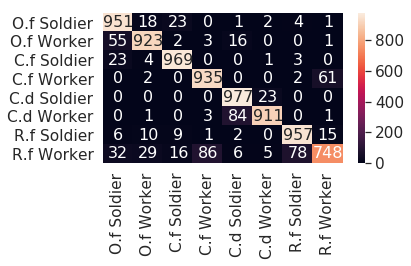

runtime :  9146.2951130867

[40] accuracy: 0.916 loss: 37.448

[0.815, 0.85625, 0.88175, 0.886375, 0.89325, 0.899125, 0.902, 0.905, 0.90625, 0.907875, 0.90575, 0.910125, 0.909375, 0.911, 0.90925, 0.907875, 0.911125, 0.910125, 0.909875, 0.914375, 0.91475, 0.9135, 0.90975, 0.914125, 0.914375, 0.911875, 0.9165, 0.914875, 0.916125, 0.912875, 0.917875, 0.917875, 0.913875, 0.9195, 0.918375, 0.9205, 0.917875, 0.918625, 0.921375, 0.916125]
[64.11414223909378, 49.904711842536926, 44.67099912464619, 41.61231115460396, 41.263010531663895, 39.30233183503151, 38.275576405227184, 37.62644839286804, 37.14999883621931, 37.15717602521181, 38.36975885927677, 38.00613395869732, 37.108960159122944, 37.26954859495163, 37.773814633488655, 37.71399527788162, 37.36094921082258, 38.73386053740978, 38.443429566919804, 36.634050503373146, 36.48204176872969, 37.40003118664026, 38.07550660520792, 37.081875782459974, 37.04349867999554, 38.456205144524574, 36.58829292654991, 37.063568487763405, 37.766623981297016, 3

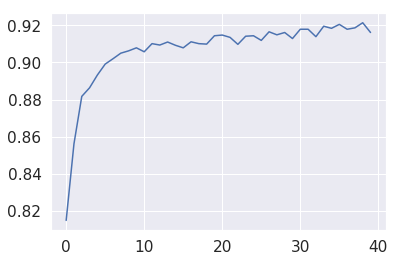

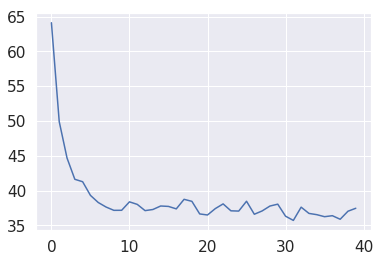

[0, 3, 4, 4, 1, 0, 6, 0, 3, 3, 3, 6, 0, 3, 4, 4, 0, 3, 1, 4, 0, 4, 5, 7, 1, 6, 3, 0, 7, 6, 1, 7, 4, 6, 2, 2, 2, 6, 1, 2, 1, 3, 0, 6, 4, 0, 7, 5, 1, 3, 6, 6, 2, 4, 2, 6, 0, 0, 6, 6, 3, 6, 4, 6, 4, 4, 4, 1, 7, 0, 5, 4, 6, 6, 1, 0, 3, 7, 7, 1, 4, 6, 7, 4, 7, 0, 1, 1, 6, 7, 1, 3, 6, 4, 6, 0, 3, 0, 3, 3, 6, 3, 0, 0, 0, 3, 3, 3, 3, 0, 4, 4, 0, 6, 0, 4, 4, 1, 2, 6, 7, 5, 3, 6, 3, 6, 4, 3, 6, 1, 7, 1, 7, 5, 7, 6, 7, 3, 1, 3, 4, 2, 1, 0, 0, 1, 7, 7, 4, 4, 0, 4, 7, 1, 3, 3, 3, 6, 4, 1, 4, 2, 0, 5, 2, 6, 3, 1, 1, 2, 2, 6, 5, 4, 2, 1, 4, 3, 4, 0, 0, 0, 4, 5, 1, 3, 2, 0, 6, 4, 2, 0, 0, 3, 6, 6, 7, 4, 6, 7, 6, 0, 3, 6, 7, 5, 2, 3, 0, 5, 3, 7, 6, 0, 4, 2, 0, 5, 0, 0, 3, 1, 3, 2, 7, 6, 3, 2, 7, 2, 5, 6, 2, 0, 7, 1, 7, 2, 6, 0, 1, 4, 0, 4, 1, 0, 2, 3, 3, 1, 3, 6, 6, 1, 0, 2, 3, 3, 0, 4, 6, 0, 2, 7, 2, 1, 2, 0, 3, 7, 0, 4, 5, 1, 0, 0, 6, 4, 7, 1, 7, 5, 7, 4, 1, 3, 7, 1, 0, 4, 3, 7, 7, 4, 4, 4, 2, 4, 6, 0, 1, 2, 7, 4, 1, 6, 0, 5, 7, 2, 3, 7, 0, 0, 5, 1, 2, 6, 6, 7, 6, 0, 7, 0, 4, 7, 4, 6, 6, 7, 1, 1, 5, 

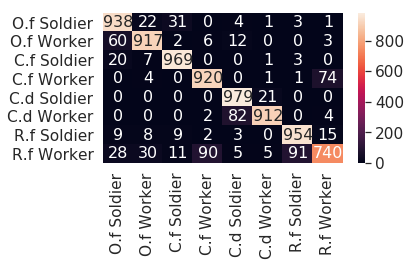

runtime :  9383.127486228943

[41] accuracy: 0.916 loss: 37.229

[0.815, 0.85625, 0.88175, 0.886375, 0.89325, 0.899125, 0.902, 0.905, 0.90625, 0.907875, 0.90575, 0.910125, 0.909375, 0.911, 0.90925, 0.907875, 0.911125, 0.910125, 0.909875, 0.914375, 0.91475, 0.9135, 0.90975, 0.914125, 0.914375, 0.911875, 0.9165, 0.914875, 0.916125, 0.912875, 0.917875, 0.917875, 0.913875, 0.9195, 0.918375, 0.9205, 0.917875, 0.918625, 0.921375, 0.916125, 0.91625]
[64.11414223909378, 49.904711842536926, 44.67099912464619, 41.61231115460396, 41.263010531663895, 39.30233183503151, 38.275576405227184, 37.62644839286804, 37.14999883621931, 37.15717602521181, 38.36975885927677, 38.00613395869732, 37.108960159122944, 37.26954859495163, 37.773814633488655, 37.71399527788162, 37.36094921082258, 38.73386053740978, 38.443429566919804, 36.634050503373146, 36.48204176872969, 37.40003118664026, 38.07550660520792, 37.081875782459974, 37.04349867999554, 38.456205144524574, 36.58829292654991, 37.063568487763405, 37.7666239

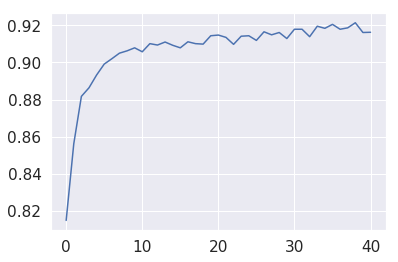

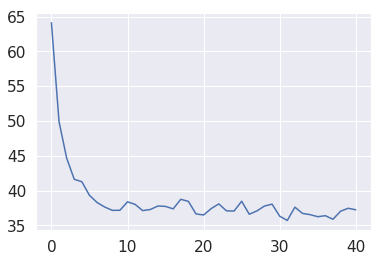

[3, 1, 0, 1, 4, 7, 7, 3, 6, 7, 4, 5, 0, 0, 1, 7, 2, 2, 4, 0, 7, 6, 2, 7, 4, 2, 4, 5, 2, 6, 1, 2, 0, 6, 3, 4, 7, 0, 0, 1, 6, 4, 5, 0, 7, 1, 2, 4, 2, 4, 4, 0, 0, 0, 7, 6, 7, 7, 3, 4, 2, 4, 5, 0, 2, 7, 4, 1, 6, 2, 2, 0, 4, 0, 6, 7, 1, 4, 6, 2, 2, 2, 1, 1, 2, 1, 0, 1, 7, 3, 0, 4, 0, 2, 2, 6, 0, 6, 0, 3, 0, 0, 3, 0, 3, 6, 1, 1, 6, 4, 4, 4, 1, 3, 3, 1, 2, 0, 4, 3, 1, 1, 0, 6, 4, 0, 2, 3, 2, 3, 1, 4, 6, 4, 4, 6, 1, 7, 3, 0, 4, 3, 1, 2, 4, 4, 4, 1, 3, 7, 1, 6, 7, 0, 2, 1, 7, 6, 3, 0, 6, 7, 7, 0, 7, 0, 3, 6, 6, 4, 3, 3, 7, 0, 3, 1, 4, 1, 7, 1, 1, 2, 0, 0, 7, 1, 2, 1, 6, 7, 0, 3, 1, 7, 1, 0, 1, 3, 1, 7, 4, 0, 0, 6, 2, 7, 0, 6, 2, 1, 0, 2, 2, 6, 6, 6, 7, 0, 3, 0, 3, 4, 3, 0, 1, 7, 6, 6, 3, 1, 7, 7, 0, 7, 3, 7, 7, 7, 2, 3, 0, 2, 4, 0, 0, 0, 6, 7, 0, 0, 4, 7, 2, 0, 6, 6, 0, 6, 4, 3, 3, 1, 5, 6, 5, 0, 3, 6, 1, 4, 0, 4, 3, 0, 0, 0, 7, 0, 7, 6, 7, 6, 3, 6, 0, 2, 1, 4, 4, 1, 6, 0, 4, 3, 2, 6, 4, 3, 6, 7, 7, 2, 2, 3, 3, 1, 1, 7, 5, 6, 5, 3, 0, 0, 0, 0, 1, 0, 7, 0, 4, 6, 5, 4, 6, 3, 4, 4, 3, 6, 7, 1, 1, 

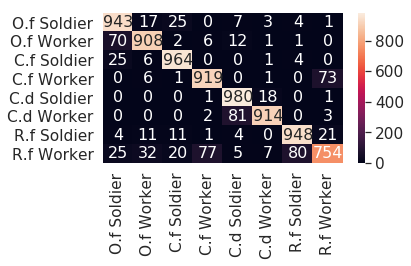

runtime :  9619.496814727783

[42] accuracy: 0.921 loss: 36.322

[0.815, 0.85625, 0.88175, 0.886375, 0.89325, 0.899125, 0.902, 0.905, 0.90625, 0.907875, 0.90575, 0.910125, 0.909375, 0.911, 0.90925, 0.907875, 0.911125, 0.910125, 0.909875, 0.914375, 0.91475, 0.9135, 0.90975, 0.914125, 0.914375, 0.911875, 0.9165, 0.914875, 0.916125, 0.912875, 0.917875, 0.917875, 0.913875, 0.9195, 0.918375, 0.9205, 0.917875, 0.918625, 0.921375, 0.916125, 0.91625, 0.921]
[64.11414223909378, 49.904711842536926, 44.67099912464619, 41.61231115460396, 41.263010531663895, 39.30233183503151, 38.275576405227184, 37.62644839286804, 37.14999883621931, 37.15717602521181, 38.36975885927677, 38.00613395869732, 37.108960159122944, 37.26954859495163, 37.773814633488655, 37.71399527788162, 37.36094921082258, 38.73386053740978, 38.443429566919804, 36.634050503373146, 36.48204176872969, 37.40003118664026, 38.07550660520792, 37.081875782459974, 37.04349867999554, 38.456205144524574, 36.58829292654991, 37.063568487763405, 37.

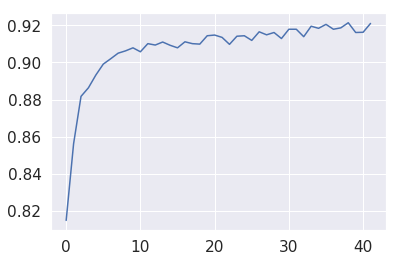

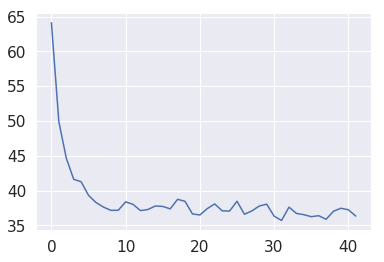

[4, 0, 3, 6, 6, 6, 4, 7, 2, 0, 0, 7, 7, 5, 0, 6, 4, 4, 1, 1, 0, 7, 4, 0, 2, 7, 3, 4, 6, 3, 0, 5, 5, 0, 0, 4, 4, 0, 3, 7, 7, 6, 3, 3, 1, 1, 3, 3, 7, 5, 0, 5, 6, 0, 0, 1, 0, 0, 6, 6, 7, 6, 0, 4, 0, 7, 4, 1, 4, 7, 3, 6, 6, 4, 7, 6, 6, 7, 7, 6, 4, 7, 6, 4, 0, 7, 5, 7, 0, 0, 1, 7, 4, 5, 0, 6, 1, 0, 1, 0, 3, 0, 4, 0, 0, 3, 4, 3, 3, 7, 4, 4, 4, 2, 6, 7, 3, 3, 3, 6, 1, 4, 7, 0, 7, 0, 1, 6, 0, 0, 2, 7, 0, 4, 4, 7, 1, 7, 1, 0, 6, 3, 0, 4, 6, 0, 3, 7, 4, 0, 0, 2, 0, 2, 4, 5, 0, 3, 3, 6, 4, 4, 4, 3, 4, 0, 7, 7, 4, 1, 3, 0, 0, 1, 0, 4, 4, 0, 4, 4, 0, 7, 3, 1, 1, 1, 1, 4, 4, 7, 1, 1, 3, 7, 4, 6, 7, 6, 0, 4, 1, 7, 7, 6, 0, 1, 5, 6, 2, 5, 5, 5, 1, 3, 4, 3, 4, 7, 4, 3, 5, 0, 0, 7, 0, 0, 3, 6, 5, 1, 6, 6, 4, 6, 4, 2, 2, 3, 3, 6, 1, 7, 2, 6, 3, 6, 0, 0, 3, 4, 3, 3, 4, 6, 4, 4, 2, 5, 7, 6, 0, 0, 4, 6, 1, 1, 6, 5, 4, 0, 1, 6, 7, 7, 6, 5, 7, 0, 4, 3, 6, 7, 5, 0, 6, 1, 7, 4, 4, 3, 4, 7, 7, 0, 6, 2, 4, 5, 7, 0, 0, 0, 2, 0, 7, 7, 7, 7, 4, 4, 3, 0, 0, 7, 4, 0, 0, 7, 4, 1, 7, 5, 6, 6, 6, 7, 7, 5, 3, 1, 7, 7, 3, 

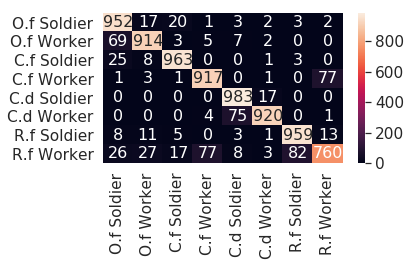

runtime :  9856.71277499199

[43] accuracy: 0.917 loss: 37.584

[0.815, 0.85625, 0.88175, 0.886375, 0.89325, 0.899125, 0.902, 0.905, 0.90625, 0.907875, 0.90575, 0.910125, 0.909375, 0.911, 0.90925, 0.907875, 0.911125, 0.910125, 0.909875, 0.914375, 0.91475, 0.9135, 0.90975, 0.914125, 0.914375, 0.911875, 0.9165, 0.914875, 0.916125, 0.912875, 0.917875, 0.917875, 0.913875, 0.9195, 0.918375, 0.9205, 0.917875, 0.918625, 0.921375, 0.916125, 0.91625, 0.921, 0.916875]
[64.11414223909378, 49.904711842536926, 44.67099912464619, 41.61231115460396, 41.263010531663895, 39.30233183503151, 38.275576405227184, 37.62644839286804, 37.14999883621931, 37.15717602521181, 38.36975885927677, 38.00613395869732, 37.108960159122944, 37.26954859495163, 37.773814633488655, 37.71399527788162, 37.36094921082258, 38.73386053740978, 38.443429566919804, 36.634050503373146, 36.48204176872969, 37.40003118664026, 38.07550660520792, 37.081875782459974, 37.04349867999554, 38.456205144524574, 36.58829292654991, 37.06356848776

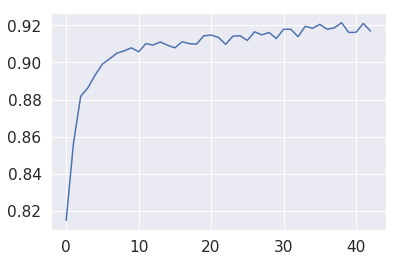

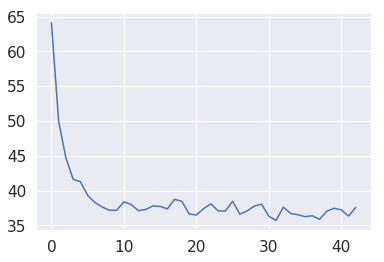

[7, 0, 3, 6, 3, 4, 0, 3, 1, 4, 0, 5, 4, 1, 0, 7, 6, 6, 7, 6, 0, 0, 0, 7, 6, 6, 4, 6, 0, 4, 6, 4, 4, 0, 1, 2, 7, 7, 2, 6, 6, 5, 2, 2, 6, 7, 2, 4, 1, 7, 6, 6, 7, 3, 6, 2, 4, 3, 4, 2, 7, 1, 1, 7, 4, 1, 0, 0, 2, 3, 3, 4, 3, 6, 0, 1, 0, 1, 6, 5, 4, 0, 0, 6, 6, 5, 2, 3, 6, 6, 6, 2, 0, 0, 0, 0, 0, 6, 1, 1, 3, 7, 4, 7, 3, 7, 7, 1, 6, 7, 1, 1, 7, 5, 4, 4, 3, 5, 6, 2, 2, 4, 2, 2, 1, 5, 4, 7, 3, 4, 1, 0, 6, 1, 3, 6, 3, 6, 1, 0, 0, 4, 0, 1, 5, 2, 1, 7, 3, 0, 2, 1, 6, 0, 5, 7, 7, 1, 7, 5, 4, 2, 5, 5, 0, 5, 0, 4, 7, 4, 7, 0, 4, 0, 0, 6, 6, 2, 1, 4, 0, 4, 6, 1, 0, 6, 2, 6, 5, 6, 3, 6, 3, 0, 3, 7, 2, 4, 6, 1, 0, 0, 0, 4, 3, 4, 5, 6, 6, 0, 7, 1, 3, 2, 6, 1, 0, 6, 4, 3, 0, 1, 4, 4, 1, 6, 4, 0, 0, 2, 0, 0, 7, 3, 0, 0, 7, 1, 7, 1, 6, 3, 4, 2, 7, 4, 1, 7, 0, 4, 4, 4, 6, 6, 3, 4, 0, 7, 7, 1, 0, 4, 4, 2, 0, 7, 4, 0, 4, 0, 4, 3, 3, 0, 6, 7, 0, 4, 0, 0, 3, 6, 7, 6, 4, 7, 2, 7, 0, 4, 5, 7, 3, 4, 5, 0, 7, 7, 6, 6, 4, 1, 1, 7, 6, 4, 0, 4, 3, 6, 7, 7, 2, 6, 0, 6, 4, 4, 4, 7, 1, 7, 4, 4, 0, 4, 4, 6, 4, 3, 4, 0, 3, 

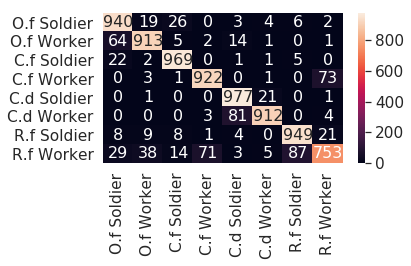

runtime :  10091.551329612732

[44] accuracy: 0.922 loss: 35.747

[0.815, 0.85625, 0.88175, 0.886375, 0.89325, 0.899125, 0.902, 0.905, 0.90625, 0.907875, 0.90575, 0.910125, 0.909375, 0.911, 0.90925, 0.907875, 0.911125, 0.910125, 0.909875, 0.914375, 0.91475, 0.9135, 0.90975, 0.914125, 0.914375, 0.911875, 0.9165, 0.914875, 0.916125, 0.912875, 0.917875, 0.917875, 0.913875, 0.9195, 0.918375, 0.9205, 0.917875, 0.918625, 0.921375, 0.916125, 0.91625, 0.921, 0.916875, 0.92175]
[64.11414223909378, 49.904711842536926, 44.67099912464619, 41.61231115460396, 41.263010531663895, 39.30233183503151, 38.275576405227184, 37.62644839286804, 37.14999883621931, 37.15717602521181, 38.36975885927677, 38.00613395869732, 37.108960159122944, 37.26954859495163, 37.773814633488655, 37.71399527788162, 37.36094921082258, 38.73386053740978, 38.443429566919804, 36.634050503373146, 36.48204176872969, 37.40003118664026, 38.07550660520792, 37.081875782459974, 37.04349867999554, 38.456205144524574, 36.58829292654991, 37.

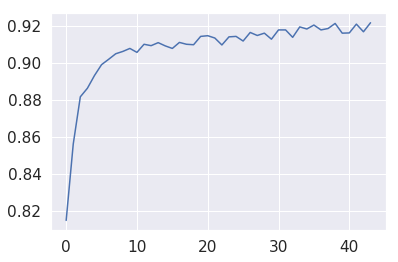

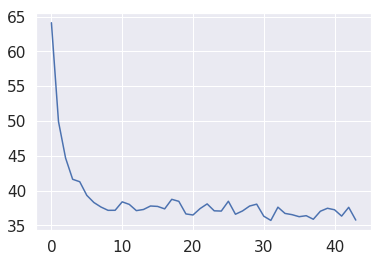

[6, 1, 1, 6, 1, 7, 3, 2, 6, 4, 4, 0, 4, 2, 3, 6, 0, 0, 0, 2, 4, 6, 7, 7, 5, 3, 6, 0, 0, 5, 0, 4, 5, 2, 1, 0, 6, 0, 0, 0, 6, 2, 7, 6, 0, 1, 7, 6, 1, 4, 2, 3, 7, 3, 6, 7, 3, 3, 4, 7, 6, 4, 7, 3, 4, 1, 3, 6, 1, 6, 4, 6, 7, 5, 3, 0, 1, 4, 4, 1, 2, 3, 7, 2, 6, 0, 1, 0, 6, 2, 3, 6, 2, 3, 1, 3, 6, 0, 1, 4, 2, 0, 2, 2, 7, 2, 5, 0, 4, 1, 4, 2, 1, 7, 3, 2, 2, 1, 3, 4, 6, 6, 7, 1, 4, 3, 1, 1, 4, 0, 0, 0, 6, 4, 5, 0, 6, 1, 1, 0, 7, 3, 4, 0, 0, 1, 0, 6, 5, 2, 6, 6, 6, 6, 6, 2, 6, 5, 3, 5, 7, 6, 7, 0, 0, 1, 2, 0, 0, 7, 7, 4, 1, 6, 5, 6, 2, 0, 1, 0, 3, 0, 0, 0, 7, 4, 7, 6, 7, 4, 4, 0, 0, 1, 7, 3, 7, 0, 7, 4, 0, 0, 7, 7, 7, 1, 0, 4, 7, 4, 6, 6, 3, 0, 2, 1, 3, 4, 7, 3, 3, 1, 3, 6, 6, 2, 2, 0, 4, 4, 4, 4, 0, 6, 7, 5, 3, 7, 3, 2, 0, 6, 7, 0, 0, 6, 4, 6, 3, 7, 2, 3, 1, 3, 3, 6, 7, 0, 7, 0, 6, 7, 3, 6, 0, 6, 5, 0, 3, 3, 6, 7, 6, 4, 2, 4, 0, 5, 2, 3, 6, 6, 7, 5, 6, 2, 3, 1, 3, 0, 6, 7, 0, 1, 0, 2, 5, 6, 0, 2, 6, 0, 7, 6, 6, 4, 4, 3, 0, 0, 3, 4, 0, 6, 1, 4, 4, 3, 4, 7, 4, 4, 4, 3, 5, 0, 6, 2, 7, 4, 4, 3, 1, 

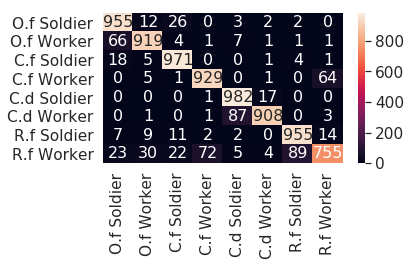

runtime :  10327.69404911995

[45] accuracy: 0.920 loss: 36.682

[0.815, 0.85625, 0.88175, 0.886375, 0.89325, 0.899125, 0.902, 0.905, 0.90625, 0.907875, 0.90575, 0.910125, 0.909375, 0.911, 0.90925, 0.907875, 0.911125, 0.910125, 0.909875, 0.914375, 0.91475, 0.9135, 0.90975, 0.914125, 0.914375, 0.911875, 0.9165, 0.914875, 0.916125, 0.912875, 0.917875, 0.917875, 0.913875, 0.9195, 0.918375, 0.9205, 0.917875, 0.918625, 0.921375, 0.916125, 0.91625, 0.921, 0.916875, 0.92175, 0.92]
[64.11414223909378, 49.904711842536926, 44.67099912464619, 41.61231115460396, 41.263010531663895, 39.30233183503151, 38.275576405227184, 37.62644839286804, 37.14999883621931, 37.15717602521181, 38.36975885927677, 38.00613395869732, 37.108960159122944, 37.26954859495163, 37.773814633488655, 37.71399527788162, 37.36094921082258, 38.73386053740978, 38.443429566919804, 36.634050503373146, 36.48204176872969, 37.40003118664026, 38.07550660520792, 37.081875782459974, 37.04349867999554, 38.456205144524574, 36.58829292654991

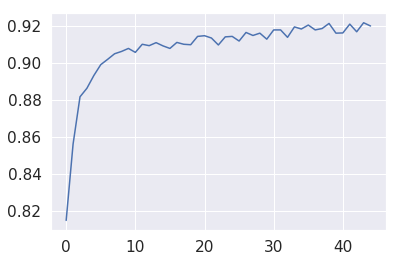

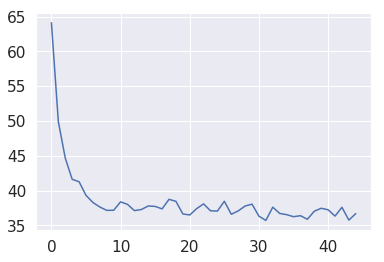

[6, 0, 7, 1, 4, 0, 0, 7, 4, 1, 5, 4, 0, 7, 3, 3, 1, 7, 0, 4, 6, 1, 1, 3, 3, 4, 6, 3, 1, 1, 4, 7, 1, 6, 3, 2, 3, 7, 3, 0, 1, 5, 0, 6, 6, 2, 0, 2, 0, 6, 0, 7, 0, 3, 4, 0, 4, 1, 7, 2, 1, 0, 1, 3, 4, 0, 3, 4, 4, 4, 0, 5, 2, 6, 6, 0, 4, 2, 6, 2, 6, 0, 6, 7, 0, 7, 7, 6, 1, 0, 6, 1, 2, 3, 1, 1, 3, 0, 7, 4, 0, 7, 0, 6, 2, 0, 7, 1, 3, 0, 4, 7, 2, 2, 2, 2, 0, 7, 3, 4, 6, 7, 1, 7, 0, 0, 1, 5, 7, 0, 6, 7, 6, 4, 7, 1, 1, 0, 7, 0, 0, 2, 6, 1, 2, 6, 7, 0, 2, 7, 4, 3, 0, 7, 4, 0, 6, 0, 0, 4, 1, 0, 7, 3, 3, 3, 0, 4, 4, 0, 2, 7, 1, 4, 4, 6, 3, 4, 1, 4, 0, 7, 7, 6, 7, 6, 3, 3, 0, 5, 4, 6, 0, 4, 7, 7, 1, 6, 4, 6, 7, 0, 1, 1, 6, 2, 3, 4, 0, 4, 6, 7, 2, 6, 0, 2, 6, 3, 1, 7, 2, 6, 3, 4, 1, 1, 4, 4, 1, 1, 4, 0, 1, 0, 3, 0, 4, 7, 0, 0, 6, 2, 1, 7, 7, 2, 6, 2, 1, 7, 6, 5, 2, 6, 3, 5, 0, 6, 4, 6, 1, 4, 2, 4, 7, 0, 1, 4, 2, 6, 4, 4, 2, 6, 7, 4, 0, 4, 0, 7, 3, 3, 0, 2, 3, 6, 4, 4, 7, 6, 5, 0, 1, 0, 4, 6, 6, 4, 6, 4, 1, 2, 4, 6, 0, 3, 6, 3, 6, 3, 2, 7, 3, 0, 0, 0, 0, 3, 4, 7, 0, 1, 4, 4, 5, 6, 6, 3, 3, 2, 0, 3, 3, 

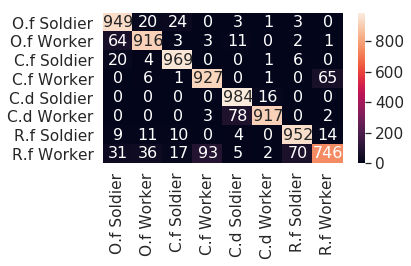

runtime :  10562.783619642258

[46] accuracy: 0.917 loss: 36.982

[0.815, 0.85625, 0.88175, 0.886375, 0.89325, 0.899125, 0.902, 0.905, 0.90625, 0.907875, 0.90575, 0.910125, 0.909375, 0.911, 0.90925, 0.907875, 0.911125, 0.910125, 0.909875, 0.914375, 0.91475, 0.9135, 0.90975, 0.914125, 0.914375, 0.911875, 0.9165, 0.914875, 0.916125, 0.912875, 0.917875, 0.917875, 0.913875, 0.9195, 0.918375, 0.9205, 0.917875, 0.918625, 0.921375, 0.916125, 0.91625, 0.921, 0.916875, 0.92175, 0.92, 0.91725]
[64.11414223909378, 49.904711842536926, 44.67099912464619, 41.61231115460396, 41.263010531663895, 39.30233183503151, 38.275576405227184, 37.62644839286804, 37.14999883621931, 37.15717602521181, 38.36975885927677, 38.00613395869732, 37.108960159122944, 37.26954859495163, 37.773814633488655, 37.71399527788162, 37.36094921082258, 38.73386053740978, 38.443429566919804, 36.634050503373146, 36.48204176872969, 37.40003118664026, 38.07550660520792, 37.081875782459974, 37.04349867999554, 38.456205144524574, 36.5882

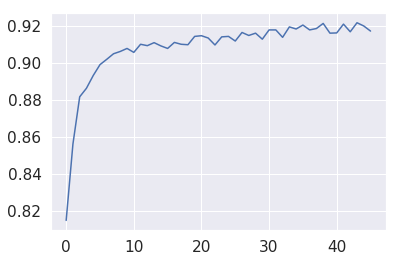

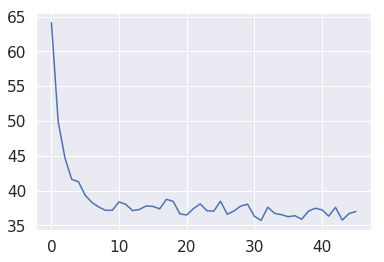

[5, 6, 0, 0, 1, 5, 3, 6, 6, 5, 3, 7, 3, 5, 4, 4, 6, 0, 6, 3, 2, 2, 7, 2, 2, 6, 6, 6, 1, 5, 4, 6, 7, 3, 0, 0, 0, 6, 7, 6, 4, 4, 7, 6, 5, 3, 0, 7, 2, 2, 6, 0, 3, 1, 4, 7, 7, 1, 4, 4, 4, 6, 4, 4, 7, 0, 0, 1, 4, 1, 0, 4, 0, 5, 7, 0, 0, 1, 4, 0, 3, 0, 3, 1, 3, 2, 4, 0, 0, 5, 2, 7, 4, 5, 2, 6, 1, 2, 0, 0, 7, 0, 0, 7, 6, 3, 4, 0, 7, 6, 0, 2, 6, 7, 6, 0, 4, 6, 0, 5, 2, 6, 1, 2, 7, 1, 4, 4, 2, 4, 3, 7, 0, 4, 7, 0, 3, 4, 0, 4, 2, 6, 6, 0, 7, 7, 2, 3, 4, 6, 4, 5, 0, 6, 7, 4, 3, 1, 3, 6, 5, 0, 3, 0, 7, 0, 3, 7, 3, 4, 0, 3, 6, 3, 7, 7, 2, 3, 4, 3, 0, 6, 0, 7, 0, 4, 5, 1, 4, 3, 4, 6, 4, 6, 6, 7, 3, 7, 7, 2, 1, 0, 0, 1, 4, 3, 4, 2, 5, 1, 0, 0, 6, 6, 7, 0, 0, 7, 0, 4, 4, 4, 4, 4, 2, 6, 0, 7, 0, 0, 5, 1, 4, 4, 0, 0, 7, 2, 4, 0, 4, 6, 3, 0, 6, 4, 1, 7, 7, 4, 3, 0, 6, 3, 4, 1, 1, 1, 4, 3, 1, 0, 2, 1, 1, 4, 5, 3, 4, 0, 3, 7, 0, 7, 7, 5, 6, 3, 0, 6, 3, 0, 7, 4, 6, 6, 0, 2, 5, 7, 1, 6, 5, 5, 2, 0, 5, 3, 3, 0, 4, 1, 6, 3, 1, 6, 2, 5, 5, 4, 3, 4, 0, 4, 6, 3, 7, 4, 0, 1, 4, 2, 0, 3, 5, 3, 1, 5, 0, 0, 4, 4, 1, 

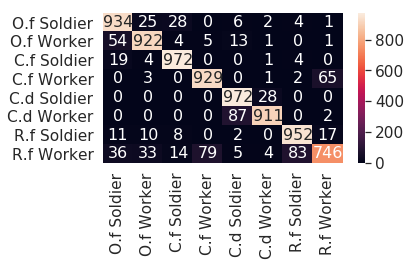

runtime :  10798.38661813736

[47] accuracy: 0.917 loss: 37.505

[0.815, 0.85625, 0.88175, 0.886375, 0.89325, 0.899125, 0.902, 0.905, 0.90625, 0.907875, 0.90575, 0.910125, 0.909375, 0.911, 0.90925, 0.907875, 0.911125, 0.910125, 0.909875, 0.914375, 0.91475, 0.9135, 0.90975, 0.914125, 0.914375, 0.911875, 0.9165, 0.914875, 0.916125, 0.912875, 0.917875, 0.917875, 0.913875, 0.9195, 0.918375, 0.9205, 0.917875, 0.918625, 0.921375, 0.916125, 0.91625, 0.921, 0.916875, 0.92175, 0.92, 0.91725, 0.9175]
[64.11414223909378, 49.904711842536926, 44.67099912464619, 41.61231115460396, 41.263010531663895, 39.30233183503151, 38.275576405227184, 37.62644839286804, 37.14999883621931, 37.15717602521181, 38.36975885927677, 38.00613395869732, 37.108960159122944, 37.26954859495163, 37.773814633488655, 37.71399527788162, 37.36094921082258, 38.73386053740978, 38.443429566919804, 36.634050503373146, 36.48204176872969, 37.40003118664026, 38.07550660520792, 37.081875782459974, 37.04349867999554, 38.456205144524574, 

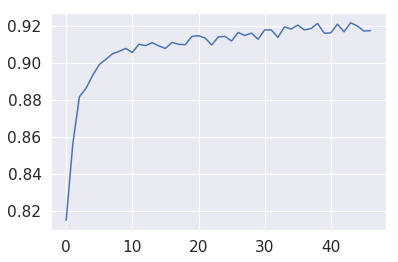

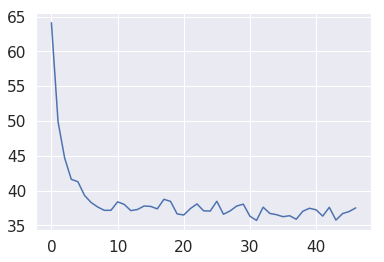

[3, 3, 6, 6, 6, 3, 1, 6, 1, 2, 1, 2, 4, 0, 5, 2, 0, 6, 6, 7, 6, 4, 3, 4, 0, 0, 5, 0, 0, 1, 3, 7, 0, 3, 3, 6, 4, 4, 4, 2, 4, 7, 7, 5, 2, 7, 7, 1, 0, 3, 5, 0, 6, 3, 0, 1, 2, 2, 7, 6, 5, 6, 0, 7, 0, 3, 4, 4, 0, 6, 2, 2, 1, 2, 4, 0, 7, 4, 1, 4, 1, 2, 4, 4, 2, 0, 1, 7, 7, 7, 1, 6, 5, 0, 6, 7, 6, 6, 0, 2, 1, 4, 2, 1, 7, 7, 6, 0, 3, 6, 4, 6, 0, 3, 7, 4, 1, 0, 0, 4, 1, 4, 3, 4, 2, 3, 3, 4, 1, 0, 0, 4, 2, 0, 7, 0, 2, 4, 7, 1, 3, 0, 5, 5, 0, 4, 7, 6, 5, 2, 0, 4, 7, 1, 3, 1, 3, 6, 7, 6, 3, 3, 6, 1, 4, 7, 0, 1, 6, 3, 1, 6, 7, 3, 7, 6, 4, 0, 7, 2, 3, 1, 1, 0, 1, 4, 1, 5, 4, 1, 0, 0, 4, 2, 1, 6, 4, 4, 0, 3, 0, 4, 2, 1, 3, 3, 0, 2, 6, 6, 0, 0, 3, 3, 1, 4, 3, 7, 4, 4, 0, 6, 3, 3, 4, 7, 4, 7, 3, 5, 0, 1, 4, 7, 4, 1, 4, 7, 3, 2, 6, 6, 1, 0, 0, 6, 4, 2, 0, 3, 4, 4, 4, 2, 4, 3, 7, 6, 3, 0, 0, 1, 0, 0, 6, 2, 4, 7, 7, 5, 0, 7, 3, 4, 4, 7, 3, 2, 0, 4, 1, 2, 1, 6, 3, 1, 7, 2, 2, 2, 6, 6, 7, 3, 4, 4, 0, 0, 4, 6, 0, 7, 6, 4, 7, 1, 6, 2, 0, 4, 7, 7, 3, 4, 3, 0, 3, 0, 2, 1, 5, 1, 4, 6, 7, 0, 6, 2, 0, 0, 3, 4, 5, 

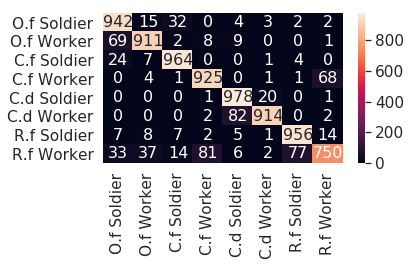

runtime :  11032.565407037735

[48] accuracy: 0.920 loss: 36.879

[0.815, 0.85625, 0.88175, 0.886375, 0.89325, 0.899125, 0.902, 0.905, 0.90625, 0.907875, 0.90575, 0.910125, 0.909375, 0.911, 0.90925, 0.907875, 0.911125, 0.910125, 0.909875, 0.914375, 0.91475, 0.9135, 0.90975, 0.914125, 0.914375, 0.911875, 0.9165, 0.914875, 0.916125, 0.912875, 0.917875, 0.917875, 0.913875, 0.9195, 0.918375, 0.9205, 0.917875, 0.918625, 0.921375, 0.916125, 0.91625, 0.921, 0.916875, 0.92175, 0.92, 0.91725, 0.9175, 0.920125]
[64.11414223909378, 49.904711842536926, 44.67099912464619, 41.61231115460396, 41.263010531663895, 39.30233183503151, 38.275576405227184, 37.62644839286804, 37.14999883621931, 37.15717602521181, 38.36975885927677, 38.00613395869732, 37.108960159122944, 37.26954859495163, 37.773814633488655, 37.71399527788162, 37.36094921082258, 38.73386053740978, 38.443429566919804, 36.634050503373146, 36.48204176872969, 37.40003118664026, 38.07550660520792, 37.081875782459974, 37.04349867999554, 38.456205

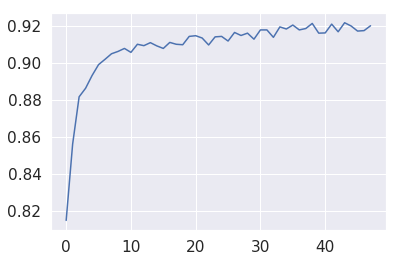

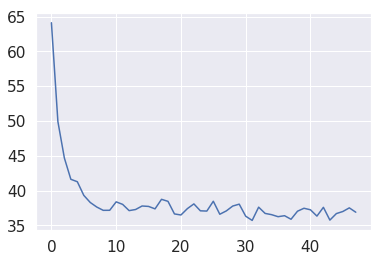

[1, 2, 4, 6, 4, 7, 3, 1, 0, 4, 2, 3, 3, 5, 1, 0, 3, 7, 2, 7, 5, 0, 2, 7, 7, 0, 0, 3, 0, 0, 7, 2, 0, 1, 1, 1, 2, 4, 3, 4, 0, 3, 2, 3, 7, 4, 6, 0, 0, 1, 0, 7, 1, 4, 7, 7, 2, 1, 2, 2, 3, 6, 6, 6, 7, 3, 7, 3, 3, 7, 6, 3, 4, 3, 0, 6, 0, 7, 0, 1, 4, 7, 3, 4, 6, 4, 6, 1, 7, 6, 6, 6, 2, 3, 4, 2, 0, 4, 7, 0, 4, 0, 2, 3, 1, 5, 4, 0, 1, 6, 7, 1, 3, 2, 5, 3, 6, 3, 7, 4, 6, 5, 0, 3, 3, 3, 4, 0, 3, 4, 6, 5, 4, 0, 2, 7, 0, 0, 1, 1, 3, 0, 3, 3, 6, 3, 1, 1, 4, 7, 6, 0, 7, 7, 1, 2, 3, 7, 6, 7, 3, 6, 4, 6, 6, 4, 6, 6, 4, 6, 6, 4, 0, 3, 4, 4, 3, 2, 7, 0, 5, 0, 0, 2, 0, 4, 5, 6, 5, 0, 3, 0, 5, 0, 2, 4, 4, 3, 6, 1, 4, 0, 1, 5, 3, 7, 3, 4, 3, 7, 4, 6, 6, 1, 6, 3, 0, 0, 1, 0, 3, 2, 2, 0, 0, 7, 0, 4, 0, 4, 6, 3, 0, 0, 4, 5, 4, 0, 0, 2, 7, 6, 1, 7, 6, 7, 0, 3, 0, 7, 6, 6, 4, 3, 6, 3, 3, 0, 5, 0, 4, 4, 6, 0, 3, 7, 4, 1, 3, 0, 4, 2, 7, 7, 3, 7, 4, 3, 0, 0, 1, 0, 2, 1, 0, 2, 4, 3, 7, 2, 3, 7, 0, 4, 4, 0, 3, 4, 4, 7, 7, 7, 4, 7, 0, 6, 7, 3, 4, 7, 4, 7, 0, 3, 0, 3, 1, 7, 0, 0, 7, 4, 1, 5, 3, 4, 0, 7, 3, 1, 0, 7, 2, 

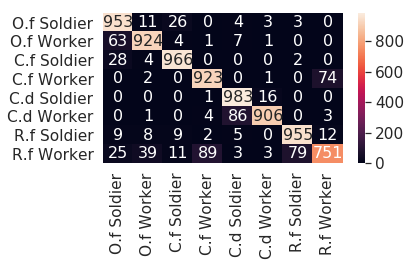

runtime :  11267.284717559814

[49] accuracy: 0.920 loss: 36.221

[0.815, 0.85625, 0.88175, 0.886375, 0.89325, 0.899125, 0.902, 0.905, 0.90625, 0.907875, 0.90575, 0.910125, 0.909375, 0.911, 0.90925, 0.907875, 0.911125, 0.910125, 0.909875, 0.914375, 0.91475, 0.9135, 0.90975, 0.914125, 0.914375, 0.911875, 0.9165, 0.914875, 0.916125, 0.912875, 0.917875, 0.917875, 0.913875, 0.9195, 0.918375, 0.9205, 0.917875, 0.918625, 0.921375, 0.916125, 0.91625, 0.921, 0.916875, 0.92175, 0.92, 0.91725, 0.9175, 0.920125, 0.92]
[64.11414223909378, 49.904711842536926, 44.67099912464619, 41.61231115460396, 41.263010531663895, 39.30233183503151, 38.275576405227184, 37.62644839286804, 37.14999883621931, 37.15717602521181, 38.36975885927677, 38.00613395869732, 37.108960159122944, 37.26954859495163, 37.773814633488655, 37.71399527788162, 37.36094921082258, 38.73386053740978, 38.443429566919804, 36.634050503373146, 36.48204176872969, 37.40003118664026, 38.07550660520792, 37.081875782459974, 37.04349867999554, 38.

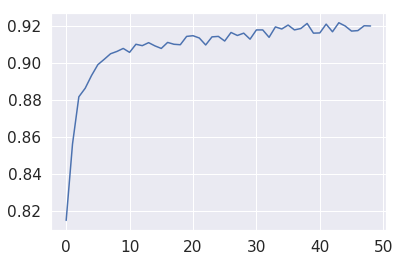

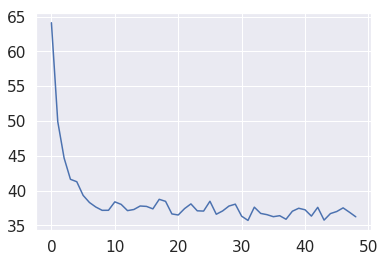

[0, 0, 4, 4, 6, 6, 1, 3, 0, 0, 2, 0, 7, 0, 3, 3, 2, 5, 3, 0, 0, 3, 4, 2, 2, 4, 0, 0, 7, 1, 2, 2, 3, 6, 1, 3, 3, 2, 1, 2, 0, 7, 7, 2, 7, 7, 5, 6, 1, 5, 0, 2, 4, 0, 4, 0, 4, 2, 7, 0, 4, 7, 7, 2, 1, 3, 4, 1, 6, 4, 1, 6, 4, 0, 2, 0, 3, 0, 7, 1, 0, 2, 3, 1, 4, 1, 5, 6, 2, 0, 4, 6, 3, 3, 6, 7, 5, 0, 0, 0, 3, 3, 7, 3, 7, 0, 4, 0, 6, 4, 4, 2, 0, 2, 7, 2, 2, 0, 5, 7, 3, 2, 6, 3, 4, 0, 4, 7, 6, 6, 4, 1, 7, 0, 6, 1, 4, 7, 4, 6, 1, 6, 7, 0, 0, 4, 7, 4, 4, 4, 6, 7, 4, 3, 3, 6, 3, 6, 0, 6, 4, 4, 1, 6, 2, 3, 1, 1, 6, 0, 1, 0, 0, 0, 6, 4, 6, 4, 0, 4, 2, 6, 2, 4, 5, 1, 0, 1, 4, 0, 2, 0, 0, 6, 0, 2, 3, 0, 3, 6, 7, 3, 0, 2, 6, 7, 4, 3, 6, 3, 3, 1, 3, 6, 1, 0, 0, 7, 5, 2, 1, 7, 5, 6, 6, 4, 7, 4, 0, 0, 4, 7, 3, 7, 1, 6, 3, 4, 0, 4, 0, 3, 4, 2, 3, 2, 6, 6, 7, 0, 3, 4, 7, 4, 3, 4, 0, 7, 5, 2, 7, 4, 4, 4, 0, 0, 4, 1, 0, 3, 7, 0, 6, 1, 4, 3, 1, 1, 4, 1, 7, 7, 6, 6, 3, 3, 1, 7, 7, 0, 1, 6, 4, 7, 0, 6, 6, 6, 5, 5, 0, 2, 7, 7, 0, 0, 3, 0, 1, 0, 7, 1, 4, 5, 4, 0, 3, 5, 0, 7, 0, 7, 7, 5, 1, 7, 7, 6, 4, 0, 0, 4, 3, 

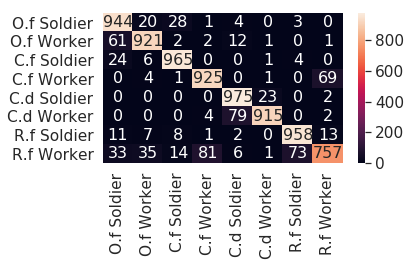

runtime :  11502.00863814354

[50] accuracy: 0.920 loss: 36.459

[0.815, 0.85625, 0.88175, 0.886375, 0.89325, 0.899125, 0.902, 0.905, 0.90625, 0.907875, 0.90575, 0.910125, 0.909375, 0.911, 0.90925, 0.907875, 0.911125, 0.910125, 0.909875, 0.914375, 0.91475, 0.9135, 0.90975, 0.914125, 0.914375, 0.911875, 0.9165, 0.914875, 0.916125, 0.912875, 0.917875, 0.917875, 0.913875, 0.9195, 0.918375, 0.9205, 0.917875, 0.918625, 0.921375, 0.916125, 0.91625, 0.921, 0.916875, 0.92175, 0.92, 0.91725, 0.9175, 0.920125, 0.92, 0.920375]
[64.11414223909378, 49.904711842536926, 44.67099912464619, 41.61231115460396, 41.263010531663895, 39.30233183503151, 38.275576405227184, 37.62644839286804, 37.14999883621931, 37.15717602521181, 38.36975885927677, 38.00613395869732, 37.108960159122944, 37.26954859495163, 37.773814633488655, 37.71399527788162, 37.36094921082258, 38.73386053740978, 38.443429566919804, 36.634050503373146, 36.48204176872969, 37.40003118664026, 38.07550660520792, 37.081875782459974, 37.0434986799

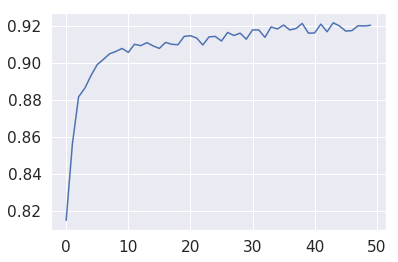

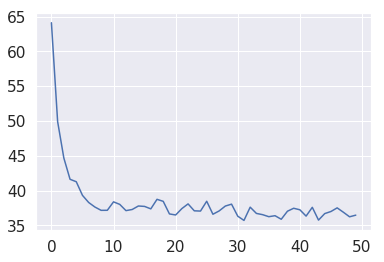

[6, 1, 6, 0, 5, 2, 0, 7, 6, 0, 4, 0, 7, 4, 6, 6, 3, 7, 3, 3, 4, 1, 6, 2, 4, 0, 2, 4, 4, 5, 2, 1, 3, 7, 0, 0, 4, 6, 4, 1, 0, 0, 3, 0, 0, 3, 2, 1, 3, 4, 7, 5, 0, 0, 0, 3, 4, 2, 4, 4, 3, 1, 3, 7, 7, 7, 1, 7, 4, 4, 1, 7, 4, 1, 7, 1, 2, 6, 5, 7, 7, 7, 4, 7, 0, 0, 2, 3, 5, 2, 4, 3, 7, 3, 2, 1, 4, 6, 1, 4, 0, 6, 2, 4, 0, 1, 1, 7, 6, 6, 4, 0, 0, 7, 4, 1, 1, 3, 4, 0, 3, 6, 2, 7, 0, 0, 7, 0, 0, 2, 7, 4, 7, 7, 0, 6, 2, 0, 0, 0, 3, 7, 0, 6, 3, 3, 4, 4, 2, 1, 6, 1, 4, 3, 3, 3, 2, 4, 4, 1, 6, 7, 5, 0, 4, 3, 1, 7, 3, 7, 3, 5, 0, 4, 2, 1, 7, 1, 5, 7, 6, 3, 1, 4, 0, 3, 0, 4, 7, 6, 7, 7, 6, 6, 3, 4, 2, 6, 2, 3, 4, 4, 2, 1, 4, 4, 3, 3, 4, 1, 1, 7, 3, 1, 3, 4, 6, 7, 7, 0, 7, 4, 7, 6, 6, 3, 3, 4, 0, 4, 4, 3, 6, 2, 2, 5, 0, 0, 6, 5, 4, 4, 3, 7, 0, 4, 0, 6, 7, 7, 4, 4, 6, 7, 6, 6, 2, 3, 6, 3, 1, 4, 3, 4, 7, 7, 7, 0, 4, 7, 4, 7, 0, 5, 3, 0, 2, 7, 7, 6, 0, 0, 5, 5, 3, 6, 0, 3, 1, 3, 3, 0, 5, 6, 1, 5, 3, 7, 4, 7, 4, 6, 4, 5, 2, 3, 6, 1, 4, 4, 3, 4, 4, 2, 1, 7, 2, 6, 7, 5, 6, 0, 0, 6, 3, 6, 0, 5, 0, 1, 4, 4, 3, 

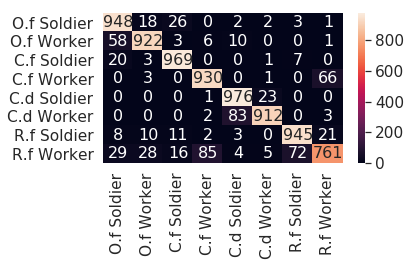

runtime :  11736.878675222397

[51] accuracy: 0.922 loss: 36.176

[0.815, 0.85625, 0.88175, 0.886375, 0.89325, 0.899125, 0.902, 0.905, 0.90625, 0.907875, 0.90575, 0.910125, 0.909375, 0.911, 0.90925, 0.907875, 0.911125, 0.910125, 0.909875, 0.914375, 0.91475, 0.9135, 0.90975, 0.914125, 0.914375, 0.911875, 0.9165, 0.914875, 0.916125, 0.912875, 0.917875, 0.917875, 0.913875, 0.9195, 0.918375, 0.9205, 0.917875, 0.918625, 0.921375, 0.916125, 0.91625, 0.921, 0.916875, 0.92175, 0.92, 0.91725, 0.9175, 0.920125, 0.92, 0.920375, 0.922125]
[64.11414223909378, 49.904711842536926, 44.67099912464619, 41.61231115460396, 41.263010531663895, 39.30233183503151, 38.275576405227184, 37.62644839286804, 37.14999883621931, 37.15717602521181, 38.36975885927677, 38.00613395869732, 37.108960159122944, 37.26954859495163, 37.773814633488655, 37.71399527788162, 37.36094921082258, 38.73386053740978, 38.443429566919804, 36.634050503373146, 36.48204176872969, 37.40003118664026, 38.07550660520792, 37.081875782459974, 37

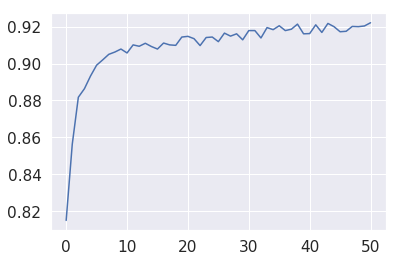

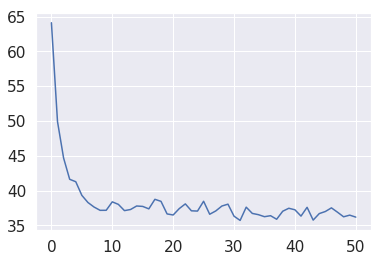

[6, 2, 7, 6, 7, 0, 6, 0, 3, 0, 2, 2, 4, 0, 2, 0, 0, 4, 3, 3, 7, 7, 4, 3, 7, 3, 1, 7, 4, 7, 3, 0, 1, 7, 7, 6, 0, 7, 7, 4, 0, 3, 0, 4, 5, 0, 6, 0, 4, 0, 3, 0, 2, 7, 6, 6, 0, 3, 6, 7, 2, 0, 4, 3, 6, 4, 2, 1, 0, 7, 1, 7, 3, 3, 3, 1, 0, 0, 2, 0, 4, 3, 7, 4, 6, 3, 0, 7, 3, 1, 1, 6, 2, 6, 7, 6, 3, 1, 7, 3, 1, 6, 2, 6, 4, 0, 3, 5, 1, 3, 5, 4, 1, 1, 4, 1, 4, 2, 6, 2, 6, 0, 0, 4, 0, 6, 2, 1, 6, 0, 4, 7, 0, 7, 2, 6, 7, 3, 3, 0, 4, 3, 1, 6, 3, 4, 0, 0, 1, 1, 0, 6, 5, 3, 6, 3, 3, 3, 3, 2, 6, 3, 0, 3, 0, 0, 1, 0, 3, 4, 0, 7, 0, 2, 3, 3, 7, 6, 0, 7, 0, 7, 0, 0, 3, 6, 4, 0, 3, 0, 7, 4, 6, 4, 4, 3, 2, 4, 7, 1, 6, 1, 6, 4, 3, 0, 3, 3, 4, 2, 0, 3, 4, 3, 7, 5, 4, 0, 0, 4, 4, 3, 0, 7, 6, 6, 5, 4, 3, 1, 0, 3, 3, 0, 7, 6, 0, 6, 3, 7, 0, 1, 0, 7, 3, 0, 0, 1, 4, 2, 0, 5, 1, 0, 6, 7, 3, 5, 6, 0, 6, 1, 7, 5, 1, 7, 7, 3, 6, 0, 4, 3, 6, 0, 1, 3, 4, 6, 4, 4, 4, 5, 4, 3, 0, 1, 0, 0, 7, 7, 5, 1, 7, 4, 6, 1, 3, 3, 6, 4, 1, 5, 7, 5, 0, 7, 0, 0, 5, 3, 7, 1, 3, 6, 0, 3, 0, 4, 3, 7, 3, 3, 4, 7, 0, 4, 3, 3, 6, 0, 7, 6, 4, 

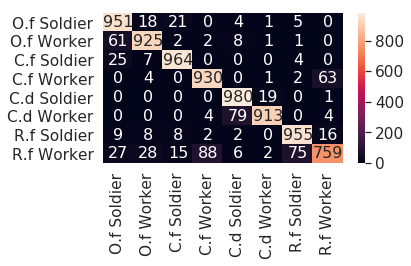

runtime :  11972.613914489746

[52] accuracy: 0.922 loss: 37.039

[0.815, 0.85625, 0.88175, 0.886375, 0.89325, 0.899125, 0.902, 0.905, 0.90625, 0.907875, 0.90575, 0.910125, 0.909375, 0.911, 0.90925, 0.907875, 0.911125, 0.910125, 0.909875, 0.914375, 0.91475, 0.9135, 0.90975, 0.914125, 0.914375, 0.911875, 0.9165, 0.914875, 0.916125, 0.912875, 0.917875, 0.917875, 0.913875, 0.9195, 0.918375, 0.9205, 0.917875, 0.918625, 0.921375, 0.916125, 0.91625, 0.921, 0.916875, 0.92175, 0.92, 0.91725, 0.9175, 0.920125, 0.92, 0.920375, 0.922125, 0.922]
[64.11414223909378, 49.904711842536926, 44.67099912464619, 41.61231115460396, 41.263010531663895, 39.30233183503151, 38.275576405227184, 37.62644839286804, 37.14999883621931, 37.15717602521181, 38.36975885927677, 38.00613395869732, 37.108960159122944, 37.26954859495163, 37.773814633488655, 37.71399527788162, 37.36094921082258, 38.73386053740978, 38.443429566919804, 36.634050503373146, 36.48204176872969, 37.40003118664026, 38.07550660520792, 37.081875782459

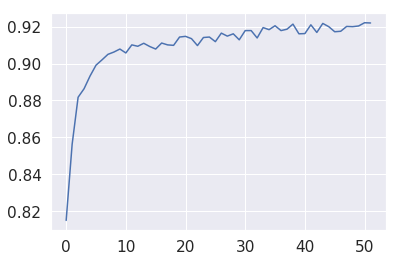

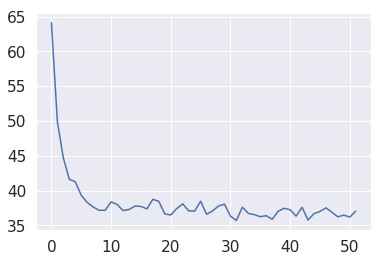

[4, 1, 3, 4, 0, 1, 0, 2, 6, 6, 4, 4, 4, 6, 1, 6, 3, 5, 2, 4, 5, 7, 3, 4, 4, 0, 6, 7, 1, 1, 3, 0, 7, 4, 2, 4, 3, 7, 0, 1, 3, 4, 7, 2, 0, 2, 7, 7, 0, 7, 6, 6, 7, 4, 7, 7, 0, 3, 6, 0, 7, 3, 7, 4, 5, 3, 7, 5, 1, 0, 6, 7, 3, 7, 4, 6, 2, 5, 4, 0, 6, 0, 2, 1, 5, 2, 5, 0, 1, 5, 0, 6, 0, 5, 1, 5, 6, 2, 4, 1, 1, 6, 6, 1, 3, 0, 6, 0, 1, 0, 6, 5, 3, 7, 6, 5, 4, 6, 6, 4, 1, 0, 3, 2, 0, 7, 6, 0, 4, 4, 1, 1, 6, 4, 1, 3, 3, 4, 7, 4, 1, 5, 3, 7, 0, 4, 7, 3, 4, 5, 3, 3, 3, 6, 6, 7, 3, 6, 3, 0, 0, 1, 0, 1, 4, 1, 7, 3, 1, 7, 7, 1, 1, 7, 0, 1, 1, 6, 3, 0, 1, 0, 0, 5, 7, 1, 2, 1, 0, 0, 4, 6, 3, 4, 2, 7, 4, 4, 3, 4, 3, 0, 0, 0, 0, 4, 3, 3, 3, 3, 1, 7, 1, 1, 2, 6, 3, 0, 1, 3, 7, 7, 0, 6, 4, 7, 4, 4, 5, 3, 1, 0, 2, 3, 4, 4, 0, 0, 4, 1, 0, 5, 3, 2, 3, 6, 4, 4, 3, 3, 1, 3, 4, 7, 4, 2, 7, 6, 0, 1, 1, 0, 2, 3, 7, 7, 4, 2, 3, 0, 6, 4, 0, 6, 4, 5, 6, 7, 2, 7, 1, 3, 4, 2, 6, 3, 3, 0, 3, 0, 4, 0, 1, 1, 7, 3, 6, 6, 0, 7, 0, 2, 0, 4, 5, 4, 7, 1, 3, 0, 3, 0, 4, 4, 4, 3, 4, 0, 4, 6, 3, 4, 6, 3, 6, 3, 2, 6, 4, 0, 0, 0, 7, 

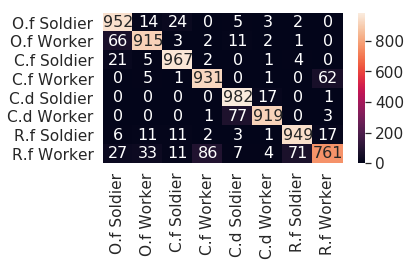

runtime :  12207.453469753265

[53] accuracy: 0.919 loss: 35.916

[0.815, 0.85625, 0.88175, 0.886375, 0.89325, 0.899125, 0.902, 0.905, 0.90625, 0.907875, 0.90575, 0.910125, 0.909375, 0.911, 0.90925, 0.907875, 0.911125, 0.910125, 0.909875, 0.914375, 0.91475, 0.9135, 0.90975, 0.914125, 0.914375, 0.911875, 0.9165, 0.914875, 0.916125, 0.912875, 0.917875, 0.917875, 0.913875, 0.9195, 0.918375, 0.9205, 0.917875, 0.918625, 0.921375, 0.916125, 0.91625, 0.921, 0.916875, 0.92175, 0.92, 0.91725, 0.9175, 0.920125, 0.92, 0.920375, 0.922125, 0.922, 0.919125]
[64.11414223909378, 49.904711842536926, 44.67099912464619, 41.61231115460396, 41.263010531663895, 39.30233183503151, 38.275576405227184, 37.62644839286804, 37.14999883621931, 37.15717602521181, 38.36975885927677, 38.00613395869732, 37.108960159122944, 37.26954859495163, 37.773814633488655, 37.71399527788162, 37.36094921082258, 38.73386053740978, 38.443429566919804, 36.634050503373146, 36.48204176872969, 37.40003118664026, 38.07550660520792, 37.08

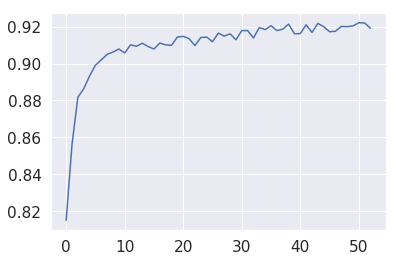

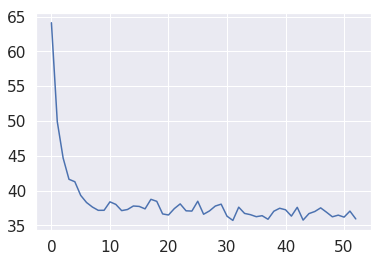

[2, 4, 7, 4, 4, 1, 0, 2, 3, 4, 4, 0, 6, 3, 5, 3, 3, 0, 4, 2, 0, 3, 6, 3, 7, 4, 7, 6, 1, 7, 4, 7, 4, 4, 3, 0, 2, 1, 0, 7, 3, 0, 5, 2, 0, 6, 0, 4, 0, 5, 4, 0, 3, 7, 2, 1, 4, 7, 7, 3, 7, 6, 0, 4, 4, 2, 3, 2, 6, 4, 1, 2, 3, 1, 0, 4, 4, 4, 4, 6, 2, 4, 2, 7, 3, 1, 1, 1, 1, 1, 1, 0, 4, 6, 3, 6, 4, 4, 7, 7, 1, 0, 6, 4, 0, 4, 6, 4, 4, 0, 1, 7, 4, 1, 5, 6, 6, 2, 0, 4, 0, 3, 3, 3, 7, 3, 3, 1, 5, 5, 0, 0, 6, 3, 4, 4, 3, 0, 2, 5, 5, 3, 0, 1, 4, 1, 0, 7, 0, 7, 1, 2, 7, 7, 3, 6, 6, 7, 6, 1, 0, 0, 5, 2, 7, 3, 4, 0, 6, 3, 4, 1, 6, 7, 7, 3, 5, 1, 7, 3, 4, 1, 4, 4, 6, 1, 3, 1, 0, 1, 7, 1, 6, 7, 6, 4, 4, 2, 1, 6, 7, 3, 0, 6, 6, 6, 6, 7, 7, 4, 0, 0, 0, 4, 1, 1, 7, 7, 2, 3, 4, 1, 6, 2, 4, 0, 5, 7, 3, 7, 1, 0, 4, 1, 6, 7, 7, 2, 4, 0, 0, 1, 0, 1, 1, 0, 5, 4, 7, 4, 0, 4, 5, 4, 1, 6, 6, 3, 4, 4, 4, 4, 0, 5, 3, 7, 6, 6, 7, 3, 4, 3, 0, 7, 6, 0, 5, 7, 0, 1, 4, 0, 0, 4, 2, 2, 0, 7, 2, 6, 0, 4, 4, 7, 7, 6, 5, 0, 1, 3, 4, 7, 1, 7, 7, 3, 3, 3, 4, 5, 1, 1, 0, 2, 7, 3, 0, 3, 4, 4, 6, 7, 0, 0, 7, 6, 7, 2, 5, 3, 3, 4, 4, 

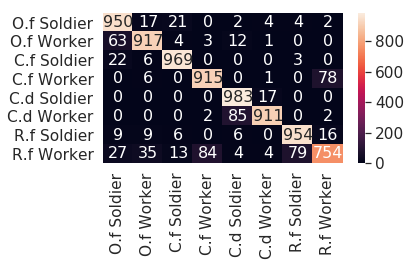

runtime :  12443.434443473816

[54] accuracy: 0.924 loss: 36.037

[0.815, 0.85625, 0.88175, 0.886375, 0.89325, 0.899125, 0.902, 0.905, 0.90625, 0.907875, 0.90575, 0.910125, 0.909375, 0.911, 0.90925, 0.907875, 0.911125, 0.910125, 0.909875, 0.914375, 0.91475, 0.9135, 0.90975, 0.914125, 0.914375, 0.911875, 0.9165, 0.914875, 0.916125, 0.912875, 0.917875, 0.917875, 0.913875, 0.9195, 0.918375, 0.9205, 0.917875, 0.918625, 0.921375, 0.916125, 0.91625, 0.921, 0.916875, 0.92175, 0.92, 0.91725, 0.9175, 0.920125, 0.92, 0.920375, 0.922125, 0.922, 0.919125, 0.923625]
[64.11414223909378, 49.904711842536926, 44.67099912464619, 41.61231115460396, 41.263010531663895, 39.30233183503151, 38.275576405227184, 37.62644839286804, 37.14999883621931, 37.15717602521181, 38.36975885927677, 38.00613395869732, 37.108960159122944, 37.26954859495163, 37.773814633488655, 37.71399527788162, 37.36094921082258, 38.73386053740978, 38.443429566919804, 36.634050503373146, 36.48204176872969, 37.40003118664026, 38.07550660520

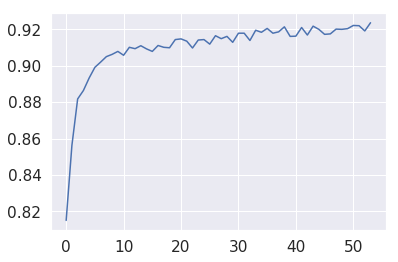

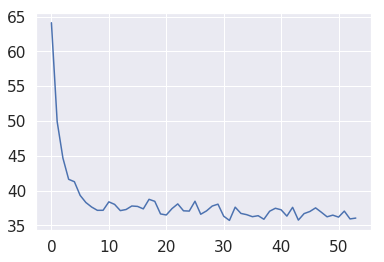

[2, 1, 7, 6, 7, 7, 2, 2, 4, 1, 2, 6, 1, 2, 1, 6, 3, 3, 6, 1, 7, 0, 6, 0, 6, 4, 0, 1, 4, 7, 4, 7, 2, 4, 0, 1, 4, 1, 2, 4, 0, 4, 7, 4, 5, 2, 3, 4, 3, 3, 3, 3, 6, 1, 6, 7, 0, 6, 0, 3, 7, 0, 6, 2, 2, 2, 0, 4, 0, 6, 7, 4, 0, 3, 1, 3, 7, 7, 0, 6, 4, 1, 7, 2, 3, 3, 0, 6, 6, 3, 4, 2, 7, 5, 1, 0, 0, 6, 5, 3, 3, 1, 1, 3, 5, 0, 6, 3, 6, 7, 7, 1, 2, 0, 0, 6, 5, 2, 1, 2, 0, 7, 6, 7, 1, 7, 3, 1, 3, 2, 1, 3, 0, 3, 4, 0, 1, 0, 3, 1, 3, 4, 6, 0, 6, 6, 6, 6, 1, 7, 2, 3, 0, 1, 4, 5, 7, 7, 6, 0, 6, 5, 3, 4, 4, 4, 6, 7, 2, 7, 1, 6, 6, 7, 4, 0, 1, 7, 4, 0, 4, 0, 7, 6, 6, 0, 6, 2, 6, 2, 7, 7, 3, 0, 4, 1, 3, 2, 4, 7, 7, 5, 1, 3, 5, 0, 6, 0, 1, 1, 6, 7, 1, 1, 0, 0, 3, 4, 4, 7, 1, 3, 7, 6, 1, 6, 2, 0, 6, 4, 4, 4, 6, 1, 1, 7, 7, 6, 4, 7, 0, 4, 0, 0, 6, 3, 3, 2, 7, 7, 6, 1, 1, 7, 4, 7, 6, 2, 0, 7, 0, 4, 6, 1, 0, 3, 0, 7, 0, 3, 3, 4, 7, 0, 7, 3, 2, 4, 6, 0, 1, 1, 1, 0, 4, 7, 1, 3, 4, 0, 6, 6, 0, 5, 0, 7, 2, 4, 5, 1, 1, 4, 4, 4, 0, 3, 6, 3, 2, 4, 2, 3, 3, 0, 5, 3, 0, 0, 1, 4, 7, 0, 2, 1, 3, 3, 4, 7, 0, 4, 4, 6, 3, 

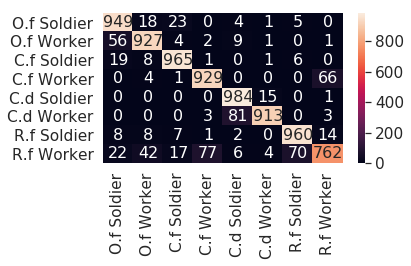

runtime :  12679.537887573242

[55] accuracy: 0.921 loss: 36.109

[0.815, 0.85625, 0.88175, 0.886375, 0.89325, 0.899125, 0.902, 0.905, 0.90625, 0.907875, 0.90575, 0.910125, 0.909375, 0.911, 0.90925, 0.907875, 0.911125, 0.910125, 0.909875, 0.914375, 0.91475, 0.9135, 0.90975, 0.914125, 0.914375, 0.911875, 0.9165, 0.914875, 0.916125, 0.912875, 0.917875, 0.917875, 0.913875, 0.9195, 0.918375, 0.9205, 0.917875, 0.918625, 0.921375, 0.916125, 0.91625, 0.921, 0.916875, 0.92175, 0.92, 0.91725, 0.9175, 0.920125, 0.92, 0.920375, 0.922125, 0.922, 0.919125, 0.923625, 0.921125]
[64.11414223909378, 49.904711842536926, 44.67099912464619, 41.61231115460396, 41.263010531663895, 39.30233183503151, 38.275576405227184, 37.62644839286804, 37.14999883621931, 37.15717602521181, 38.36975885927677, 38.00613395869732, 37.108960159122944, 37.26954859495163, 37.773814633488655, 37.71399527788162, 37.36094921082258, 38.73386053740978, 38.443429566919804, 36.634050503373146, 36.48204176872969, 37.40003118664026, 38.0

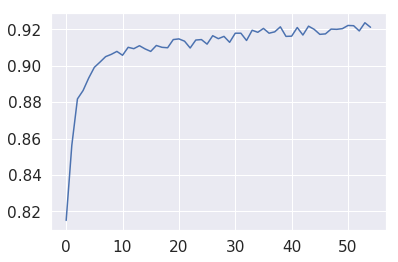

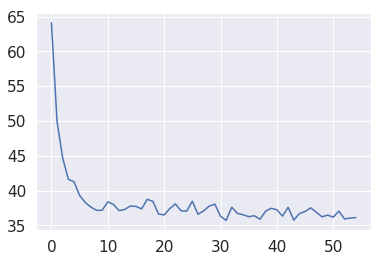

[0, 6, 4, 7, 6, 7, 6, 0, 4, 7, 4, 3, 1, 4, 4, 6, 0, 7, 4, 3, 3, 0, 6, 5, 6, 1, 4, 4, 2, 1, 7, 6, 1, 2, 0, 7, 7, 1, 7, 7, 2, 7, 0, 5, 7, 4, 0, 6, 5, 2, 1, 7, 6, 6, 7, 0, 7, 2, 3, 0, 4, 0, 0, 6, 2, 7, 0, 7, 0, 3, 0, 7, 4, 1, 1, 4, 1, 0, 6, 2, 0, 4, 3, 7, 3, 3, 6, 3, 6, 7, 7, 4, 7, 1, 0, 3, 4, 4, 3, 0, 7, 3, 7, 3, 2, 0, 7, 1, 1, 3, 4, 0, 4, 4, 3, 2, 7, 4, 3, 7, 5, 0, 2, 2, 3, 1, 5, 4, 7, 0, 2, 6, 4, 6, 7, 0, 5, 4, 1, 4, 3, 3, 6, 6, 2, 2, 6, 0, 6, 2, 6, 3, 3, 1, 2, 3, 6, 7, 6, 0, 1, 7, 3, 4, 0, 2, 3, 2, 0, 0, 3, 7, 4, 7, 7, 7, 0, 7, 1, 0, 4, 3, 7, 4, 3, 0, 6, 7, 0, 3, 7, 6, 0, 5, 3, 7, 1, 0, 1, 4, 0, 5, 4, 5, 5, 4, 4, 4, 0, 6, 1, 4, 4, 1, 6, 7, 0, 3, 0, 4, 7, 7, 6, 5, 4, 0, 0, 4, 6, 7, 7, 6, 0, 6, 4, 7, 1, 4, 4, 4, 6, 4, 6, 4, 0, 4, 6, 7, 4, 4, 5, 4, 0, 1, 4, 4, 5, 0, 6, 5, 4, 7, 3, 5, 2, 0, 2, 4, 4, 0, 0, 7, 7, 2, 4, 5, 1, 7, 0, 5, 2, 7, 3, 4, 7, 7, 6, 4, 7, 4, 0, 4, 1, 1, 0, 3, 1, 1, 6, 3, 0, 4, 4, 4, 3, 0, 0, 3, 4, 0, 0, 1, 3, 7, 3, 6, 6, 5, 0, 0, 1, 0, 7, 6, 6, 1, 0, 0, 3, 0, 3, 7, 4, 

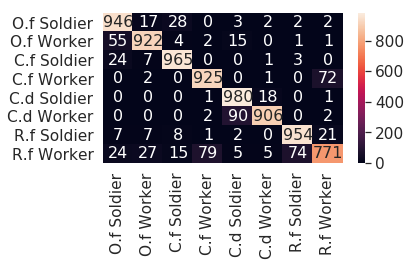

runtime :  12917.500562429428

[56] accuracy: 0.919 loss: 37.120

[0.815, 0.85625, 0.88175, 0.886375, 0.89325, 0.899125, 0.902, 0.905, 0.90625, 0.907875, 0.90575, 0.910125, 0.909375, 0.911, 0.90925, 0.907875, 0.911125, 0.910125, 0.909875, 0.914375, 0.91475, 0.9135, 0.90975, 0.914125, 0.914375, 0.911875, 0.9165, 0.914875, 0.916125, 0.912875, 0.917875, 0.917875, 0.913875, 0.9195, 0.918375, 0.9205, 0.917875, 0.918625, 0.921375, 0.916125, 0.91625, 0.921, 0.916875, 0.92175, 0.92, 0.91725, 0.9175, 0.920125, 0.92, 0.920375, 0.922125, 0.922, 0.919125, 0.923625, 0.921125, 0.919125]
[64.11414223909378, 49.904711842536926, 44.67099912464619, 41.61231115460396, 41.263010531663895, 39.30233183503151, 38.275576405227184, 37.62644839286804, 37.14999883621931, 37.15717602521181, 38.36975885927677, 38.00613395869732, 37.108960159122944, 37.26954859495163, 37.773814633488655, 37.71399527788162, 37.36094921082258, 38.73386053740978, 38.443429566919804, 36.634050503373146, 36.48204176872969, 37.4000311866

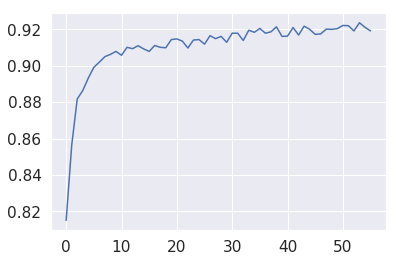

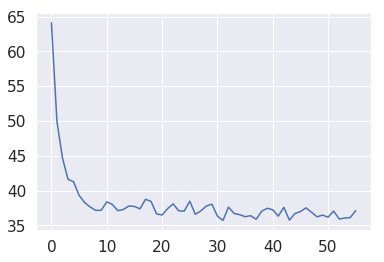

[3, 4, 1, 3, 3, 1, 3, 0, 7, 7, 0, 0, 7, 7, 5, 3, 0, 0, 0, 4, 6, 0, 3, 5, 0, 7, 6, 2, 4, 1, 3, 7, 0, 7, 2, 0, 7, 4, 6, 5, 3, 0, 2, 6, 6, 1, 1, 6, 7, 7, 4, 0, 4, 2, 2, 6, 7, 3, 6, 2, 5, 1, 3, 7, 3, 7, 7, 7, 0, 7, 3, 0, 1, 0, 6, 7, 4, 6, 6, 5, 0, 0, 4, 3, 4, 2, 4, 1, 6, 7, 1, 6, 7, 1, 7, 0, 6, 6, 0, 1, 4, 7, 6, 4, 6, 2, 7, 3, 4, 3, 2, 5, 3, 0, 0, 2, 6, 6, 0, 2, 0, 4, 0, 4, 4, 0, 4, 3, 2, 4, 3, 1, 3, 4, 6, 6, 0, 4, 4, 3, 7, 0, 3, 4, 4, 6, 6, 0, 0, 3, 5, 7, 0, 6, 4, 6, 2, 0, 0, 7, 7, 6, 6, 0, 1, 3, 7, 4, 3, 0, 7, 4, 4, 1, 3, 4, 4, 4, 3, 4, 7, 6, 6, 4, 3, 4, 0, 7, 4, 1, 6, 3, 6, 2, 3, 0, 7, 6, 7, 3, 1, 6, 6, 7, 3, 4, 0, 3, 2, 5, 0, 7, 3, 0, 6, 4, 1, 0, 0, 0, 7, 4, 0, 1, 7, 3, 7, 7, 7, 6, 0, 5, 5, 4, 3, 1, 2, 3, 6, 7, 7, 7, 4, 3, 2, 7, 7, 5, 0, 7, 3, 5, 3, 7, 1, 1, 6, 6, 3, 0, 0, 0, 3, 0, 1, 2, 1, 4, 1, 3, 3, 0, 4, 6, 5, 7, 3, 0, 1, 0, 0, 7, 7, 7, 0, 7, 7, 7, 0, 0, 0, 6, 4, 0, 2, 4, 7, 0, 0, 5, 6, 7, 3, 4, 1, 0, 6, 0, 7, 0, 7, 3, 6, 4, 3, 4, 4, 7, 7, 1, 6, 4, 1, 3, 4, 2, 6, 7, 7, 0, 4, 0, 4, 

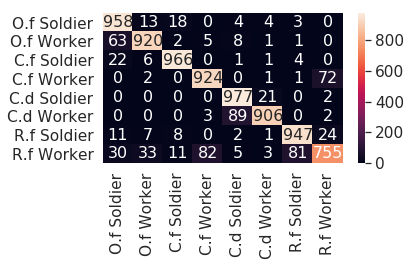

runtime :  13156.947034597397

[57] accuracy: 0.920 loss: 37.344

[0.815, 0.85625, 0.88175, 0.886375, 0.89325, 0.899125, 0.902, 0.905, 0.90625, 0.907875, 0.90575, 0.910125, 0.909375, 0.911, 0.90925, 0.907875, 0.911125, 0.910125, 0.909875, 0.914375, 0.91475, 0.9135, 0.90975, 0.914125, 0.914375, 0.911875, 0.9165, 0.914875, 0.916125, 0.912875, 0.917875, 0.917875, 0.913875, 0.9195, 0.918375, 0.9205, 0.917875, 0.918625, 0.921375, 0.916125, 0.91625, 0.921, 0.916875, 0.92175, 0.92, 0.91725, 0.9175, 0.920125, 0.92, 0.920375, 0.922125, 0.922, 0.919125, 0.923625, 0.921125, 0.919125, 0.9205]
[64.11414223909378, 49.904711842536926, 44.67099912464619, 41.61231115460396, 41.263010531663895, 39.30233183503151, 38.275576405227184, 37.62644839286804, 37.14999883621931, 37.15717602521181, 38.36975885927677, 38.00613395869732, 37.108960159122944, 37.26954859495163, 37.773814633488655, 37.71399527788162, 37.36094921082258, 38.73386053740978, 38.443429566919804, 36.634050503373146, 36.48204176872969, 37.40

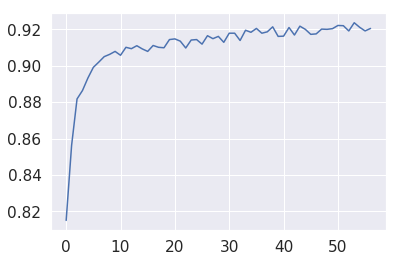

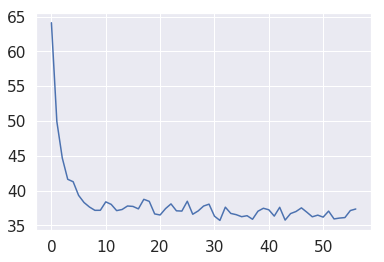

[0, 0, 0, 5, 1, 3, 4, 0, 6, 7, 6, 2, 4, 0, 4, 3, 2, 0, 6, 5, 0, 0, 0, 5, 4, 6, 0, 5, 3, 3, 7, 0, 2, 1, 0, 0, 6, 2, 4, 4, 2, 0, 4, 2, 1, 1, 4, 0, 5, 5, 0, 0, 4, 4, 4, 1, 3, 0, 7, 4, 6, 0, 4, 6, 6, 2, 1, 7, 0, 0, 6, 0, 3, 0, 7, 4, 3, 4, 0, 1, 7, 1, 7, 4, 4, 4, 5, 1, 6, 4, 5, 2, 0, 7, 6, 7, 3, 7, 6, 5, 0, 0, 0, 1, 6, 6, 7, 0, 7, 2, 6, 4, 4, 7, 3, 1, 7, 4, 0, 3, 1, 7, 3, 0, 0, 6, 0, 1, 4, 4, 3, 3, 0, 1, 0, 3, 3, 2, 6, 2, 6, 6, 7, 4, 4, 7, 7, 7, 6, 7, 6, 2, 4, 1, 0, 2, 0, 4, 0, 4, 2, 6, 0, 4, 6, 7, 0, 5, 3, 0, 3, 4, 3, 7, 6, 4, 4, 4, 4, 4, 1, 0, 6, 7, 4, 0, 2, 4, 6, 3, 1, 0, 1, 4, 6, 0, 1, 0, 0, 4, 2, 7, 6, 5, 7, 7, 1, 1, 3, 4, 2, 3, 0, 4, 0, 7, 4, 0, 7, 4, 1, 1, 7, 3, 6, 4, 7, 4, 7, 1, 2, 0, 6, 6, 6, 6, 6, 3, 2, 3, 1, 4, 0, 1, 4, 3, 1, 2, 0, 0, 3, 0, 0, 0, 0, 6, 0, 2, 0, 6, 0, 2, 0, 6, 7, 1, 1, 0, 7, 0, 0, 3, 7, 3, 4, 4, 4, 7, 1, 4, 4, 7, 0, 5, 0, 5, 5, 1, 4, 1, 7, 4, 3, 2, 6, 5, 5, 7, 0, 3, 0, 7, 7, 2, 3, 7, 1, 3, 4, 2, 7, 0, 3, 0, 1, 6, 6, 7, 0, 7, 0, 4, 0, 4, 2, 7, 1, 0, 4, 6, 7, 7, 4, 

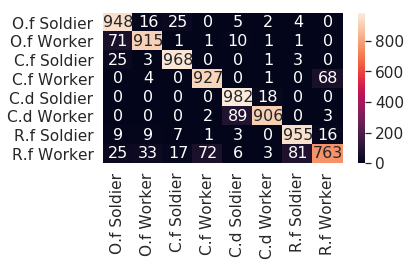

runtime :  13391.106172084808

[58] accuracy: 0.921 loss: 37.986

[0.815, 0.85625, 0.88175, 0.886375, 0.89325, 0.899125, 0.902, 0.905, 0.90625, 0.907875, 0.90575, 0.910125, 0.909375, 0.911, 0.90925, 0.907875, 0.911125, 0.910125, 0.909875, 0.914375, 0.91475, 0.9135, 0.90975, 0.914125, 0.914375, 0.911875, 0.9165, 0.914875, 0.916125, 0.912875, 0.917875, 0.917875, 0.913875, 0.9195, 0.918375, 0.9205, 0.917875, 0.918625, 0.921375, 0.916125, 0.91625, 0.921, 0.916875, 0.92175, 0.92, 0.91725, 0.9175, 0.920125, 0.92, 0.920375, 0.922125, 0.922, 0.919125, 0.923625, 0.921125, 0.919125, 0.9205, 0.92075]
[64.11414223909378, 49.904711842536926, 44.67099912464619, 41.61231115460396, 41.263010531663895, 39.30233183503151, 38.275576405227184, 37.62644839286804, 37.14999883621931, 37.15717602521181, 38.36975885927677, 38.00613395869732, 37.108960159122944, 37.26954859495163, 37.773814633488655, 37.71399527788162, 37.36094921082258, 38.73386053740978, 38.443429566919804, 36.634050503373146, 36.482041768729

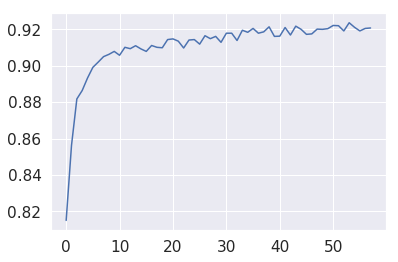

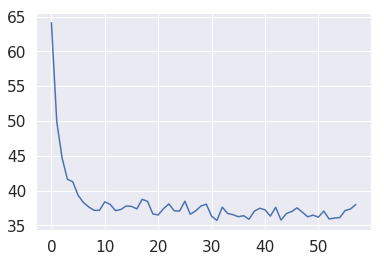

[4, 4, 7, 6, 7, 2, 1, 1, 0, 0, 4, 7, 4, 0, 6, 5, 7, 0, 2, 7, 3, 3, 3, 2, 6, 4, 3, 3, 4, 4, 2, 6, 0, 7, 0, 5, 1, 0, 7, 4, 7, 0, 2, 5, 0, 3, 7, 4, 5, 0, 3, 3, 2, 6, 5, 7, 6, 4, 3, 3, 0, 0, 4, 4, 4, 1, 7, 6, 1, 4, 3, 4, 4, 0, 0, 0, 7, 4, 6, 6, 3, 2, 6, 4, 6, 5, 7, 6, 6, 6, 6, 6, 1, 4, 7, 0, 3, 0, 0, 7, 4, 1, 2, 6, 1, 7, 1, 4, 4, 4, 2, 2, 0, 1, 2, 3, 2, 7, 0, 0, 2, 3, 4, 7, 7, 7, 7, 7, 0, 4, 7, 4, 0, 3, 1, 4, 1, 3, 6, 4, 6, 7, 4, 3, 7, 7, 1, 3, 0, 3, 0, 6, 7, 0, 4, 6, 0, 1, 3, 1, 1, 6, 4, 4, 7, 3, 1, 0, 6, 0, 6, 4, 7, 2, 0, 7, 0, 1, 7, 7, 6, 6, 2, 0, 3, 7, 7, 1, 2, 7, 0, 2, 7, 4, 3, 1, 2, 2, 3, 0, 3, 3, 6, 4, 1, 2, 0, 1, 1, 1, 4, 3, 5, 4, 6, 3, 2, 5, 0, 3, 0, 4, 6, 0, 0, 0, 4, 0, 4, 4, 4, 3, 0, 6, 4, 6, 7, 7, 3, 0, 2, 4, 7, 2, 0, 0, 3, 6, 3, 4, 4, 0, 1, 6, 6, 4, 4, 0, 4, 7, 0, 6, 2, 1, 1, 0, 7, 3, 1, 4, 1, 0, 6, 6, 3, 7, 0, 1, 1, 4, 4, 3, 5, 0, 7, 1, 4, 4, 6, 7, 2, 6, 7, 0, 0, 1, 0, 7, 6, 1, 0, 4, 0, 2, 6, 4, 4, 5, 3, 4, 1, 0, 7, 6, 7, 7, 3, 7, 4, 7, 4, 1, 4, 4, 1, 1, 4, 7, 3, 7, 5, 2, 5, 

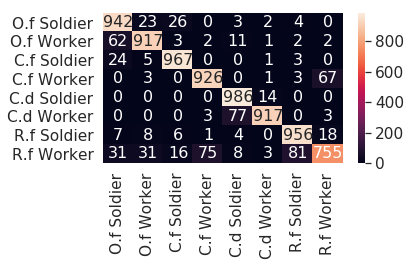

runtime :  13627.516913414001

[59] accuracy: 0.918 loss: 38.065

[0.815, 0.85625, 0.88175, 0.886375, 0.89325, 0.899125, 0.902, 0.905, 0.90625, 0.907875, 0.90575, 0.910125, 0.909375, 0.911, 0.90925, 0.907875, 0.911125, 0.910125, 0.909875, 0.914375, 0.91475, 0.9135, 0.90975, 0.914125, 0.914375, 0.911875, 0.9165, 0.914875, 0.916125, 0.912875, 0.917875, 0.917875, 0.913875, 0.9195, 0.918375, 0.9205, 0.917875, 0.918625, 0.921375, 0.916125, 0.91625, 0.921, 0.916875, 0.92175, 0.92, 0.91725, 0.9175, 0.920125, 0.92, 0.920375, 0.922125, 0.922, 0.919125, 0.923625, 0.921125, 0.919125, 0.9205, 0.92075, 0.918375]
[64.11414223909378, 49.904711842536926, 44.67099912464619, 41.61231115460396, 41.263010531663895, 39.30233183503151, 38.275576405227184, 37.62644839286804, 37.14999883621931, 37.15717602521181, 38.36975885927677, 38.00613395869732, 37.108960159122944, 37.26954859495163, 37.773814633488655, 37.71399527788162, 37.36094921082258, 38.73386053740978, 38.443429566919804, 36.634050503373146, 36.48

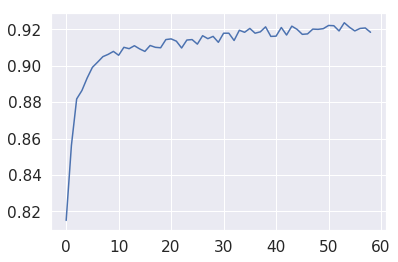

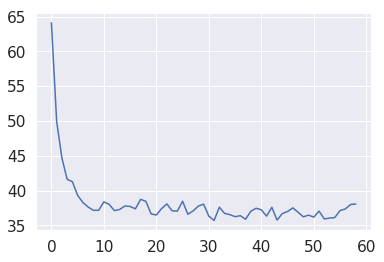

[2, 7, 3, 1, 0, 1, 3, 4, 7, 3, 6, 0, 7, 4, 6, 5, 1, 0, 1, 4, 5, 7, 7, 4, 7, 1, 0, 6, 1, 6, 0, 6, 7, 0, 0, 3, 5, 0, 3, 3, 4, 4, 0, 7, 3, 4, 1, 4, 6, 4, 4, 0, 1, 3, 1, 4, 2, 2, 0, 1, 0, 0, 3, 6, 0, 7, 3, 6, 2, 3, 3, 3, 3, 5, 4, 6, 4, 4, 7, 6, 4, 7, 1, 3, 1, 6, 6, 2, 0, 1, 1, 5, 5, 3, 1, 4, 0, 6, 7, 0, 0, 1, 0, 4, 4, 0, 6, 4, 6, 1, 5, 2, 2, 0, 7, 2, 2, 1, 6, 6, 1, 7, 0, 3, 3, 4, 1, 7, 0, 4, 7, 4, 7, 3, 6, 4, 3, 0, 6, 4, 1, 0, 1, 0, 3, 3, 1, 3, 4, 3, 7, 4, 7, 4, 3, 0, 6, 2, 1, 0, 0, 2, 7, 6, 6, 1, 3, 2, 6, 4, 7, 1, 1, 0, 3, 6, 7, 1, 3, 1, 6, 0, 3, 7, 3, 6, 5, 0, 2, 0, 1, 3, 2, 4, 5, 4, 3, 6, 3, 2, 6, 1, 4, 1, 6, 1, 3, 1, 0, 6, 0, 6, 6, 4, 2, 4, 1, 6, 7, 0, 6, 7, 1, 5, 7, 7, 0, 6, 7, 6, 3, 3, 6, 1, 2, 4, 1, 3, 7, 4, 6, 1, 0, 7, 0, 0, 4, 2, 3, 7, 0, 0, 5, 1, 4, 1, 0, 0, 0, 0, 0, 7, 7, 3, 5, 4, 6, 1, 6, 5, 6, 6, 7, 3, 3, 1, 6, 2, 7, 0, 3, 2, 0, 2, 7, 2, 6, 3, 4, 7, 1, 4, 0, 7, 0, 0, 2, 0, 0, 4, 7, 7, 0, 7, 6, 5, 0, 4, 1, 4, 1, 4, 1, 1, 0, 6, 6, 0, 4, 0, 4, 6, 4, 4, 1, 0, 2, 1, 6, 4, 3, 3, 2, 

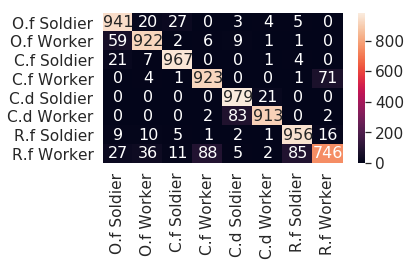

runtime :  13862.094029426575

[60] accuracy: 0.919 loss: 39.197

[0.815, 0.85625, 0.88175, 0.886375, 0.89325, 0.899125, 0.902, 0.905, 0.90625, 0.907875, 0.90575, 0.910125, 0.909375, 0.911, 0.90925, 0.907875, 0.911125, 0.910125, 0.909875, 0.914375, 0.91475, 0.9135, 0.90975, 0.914125, 0.914375, 0.911875, 0.9165, 0.914875, 0.916125, 0.912875, 0.917875, 0.917875, 0.913875, 0.9195, 0.918375, 0.9205, 0.917875, 0.918625, 0.921375, 0.916125, 0.91625, 0.921, 0.916875, 0.92175, 0.92, 0.91725, 0.9175, 0.920125, 0.92, 0.920375, 0.922125, 0.922, 0.919125, 0.923625, 0.921125, 0.919125, 0.9205, 0.92075, 0.918375, 0.919125]
[64.11414223909378, 49.904711842536926, 44.67099912464619, 41.61231115460396, 41.263010531663895, 39.30233183503151, 38.275576405227184, 37.62644839286804, 37.14999883621931, 37.15717602521181, 38.36975885927677, 38.00613395869732, 37.108960159122944, 37.26954859495163, 37.773814633488655, 37.71399527788162, 37.36094921082258, 38.73386053740978, 38.443429566919804, 36.634050503373

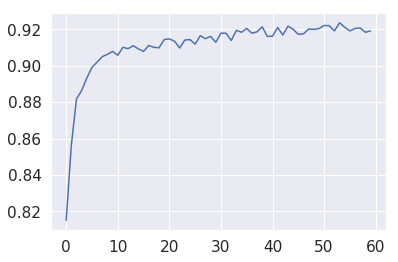

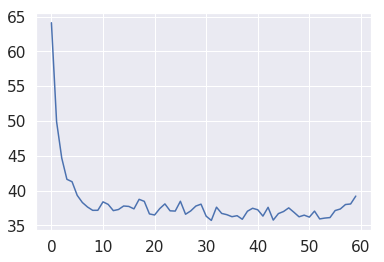

[2, 1, 1, 0, 6, 4, 4, 3, 1, 1, 7, 3, 3, 7, 4, 4, 0, 4, 2, 4, 7, 4, 2, 5, 7, 2, 7, 2, 3, 1, 7, 5, 7, 6, 2, 7, 1, 3, 2, 6, 6, 6, 6, 6, 2, 0, 4, 4, 1, 4, 3, 7, 1, 0, 0, 6, 0, 0, 4, 5, 0, 3, 4, 3, 0, 0, 1, 1, 5, 6, 0, 0, 3, 2, 2, 0, 2, 1, 0, 1, 6, 4, 7, 6, 4, 4, 7, 6, 7, 1, 7, 0, 3, 1, 7, 3, 7, 4, 7, 0, 4, 4, 6, 0, 3, 4, 6, 2, 0, 2, 0, 0, 7, 4, 3, 7, 1, 3, 0, 7, 0, 3, 7, 7, 2, 4, 3, 7, 4, 7, 6, 7, 7, 0, 4, 7, 3, 7, 0, 7, 7, 3, 7, 6, 6, 3, 0, 4, 0, 1, 0, 0, 7, 6, 6, 0, 7, 3, 0, 7, 0, 6, 6, 6, 4, 1, 1, 6, 7, 0, 2, 1, 6, 0, 7, 0, 0, 4, 6, 1, 1, 7, 3, 7, 4, 5, 1, 4, 2, 3, 3, 0, 4, 3, 4, 6, 4, 3, 0, 0, 6, 1, 1, 1, 5, 2, 2, 7, 0, 0, 0, 4, 3, 7, 4, 0, 0, 3, 3, 4, 4, 6, 3, 2, 0, 3, 1, 0, 0, 2, 3, 3, 7, 0, 1, 7, 7, 5, 0, 7, 6, 6, 7, 4, 4, 4, 3, 6, 6, 0, 7, 1, 0, 0, 1, 3, 0, 6, 6, 6, 7, 3, 6, 2, 1, 0, 0, 0, 5, 0, 3, 6, 1, 4, 3, 4, 6, 3, 0, 4, 4, 3, 4, 3, 3, 2, 0, 5, 6, 6, 3, 6, 3, 6, 7, 1, 5, 1, 2, 1, 0, 4, 2, 6, 4, 3, 3, 6, 3, 3, 7, 4, 4, 0, 6, 2, 4, 0, 1, 3, 7, 3, 0, 5, 0, 4, 2, 0, 0, 3, 1, 7, 0, 

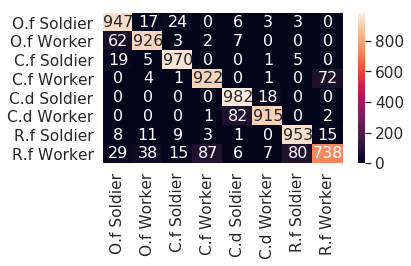

runtime :  14099.910133600235

[61] accuracy: 0.918 loss: 37.394

[0.815, 0.85625, 0.88175, 0.886375, 0.89325, 0.899125, 0.902, 0.905, 0.90625, 0.907875, 0.90575, 0.910125, 0.909375, 0.911, 0.90925, 0.907875, 0.911125, 0.910125, 0.909875, 0.914375, 0.91475, 0.9135, 0.90975, 0.914125, 0.914375, 0.911875, 0.9165, 0.914875, 0.916125, 0.912875, 0.917875, 0.917875, 0.913875, 0.9195, 0.918375, 0.9205, 0.917875, 0.918625, 0.921375, 0.916125, 0.91625, 0.921, 0.916875, 0.92175, 0.92, 0.91725, 0.9175, 0.920125, 0.92, 0.920375, 0.922125, 0.922, 0.919125, 0.923625, 0.921125, 0.919125, 0.9205, 0.92075, 0.918375, 0.919125, 0.91775]
[64.11414223909378, 49.904711842536926, 44.67099912464619, 41.61231115460396, 41.263010531663895, 39.30233183503151, 38.275576405227184, 37.62644839286804, 37.14999883621931, 37.15717602521181, 38.36975885927677, 38.00613395869732, 37.108960159122944, 37.26954859495163, 37.773814633488655, 37.71399527788162, 37.36094921082258, 38.73386053740978, 38.443429566919804, 36.634

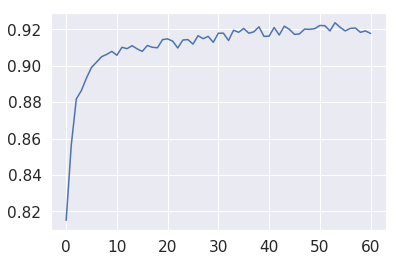

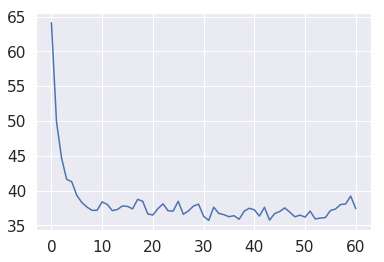

[6, 6, 1, 4, 6, 1, 2, 0, 5, 6, 6, 2, 3, 1, 6, 0, 4, 0, 4, 4, 4, 1, 3, 1, 0, 6, 4, 0, 4, 4, 4, 2, 3, 0, 6, 0, 2, 0, 7, 7, 6, 4, 0, 4, 7, 0, 2, 5, 6, 3, 1, 0, 3, 5, 3, 7, 6, 5, 5, 0, 6, 5, 2, 4, 1, 6, 4, 3, 7, 3, 0, 6, 0, 0, 3, 6, 4, 5, 6, 2, 1, 1, 4, 1, 3, 4, 4, 0, 4, 3, 3, 5, 6, 1, 0, 4, 3, 7, 1, 3, 6, 7, 6, 6, 0, 1, 6, 0, 1, 0, 3, 3, 1, 7, 7, 4, 4, 4, 2, 2, 2, 3, 6, 7, 1, 3, 1, 3, 3, 0, 1, 0, 0, 5, 0, 7, 7, 1, 6, 2, 2, 0, 0, 7, 0, 7, 1, 6, 1, 6, 0, 1, 4, 2, 3, 7, 4, 4, 2, 2, 4, 6, 6, 4, 4, 0, 0, 5, 1, 1, 0, 4, 1, 6, 4, 4, 0, 7, 0, 3, 5, 4, 2, 4, 2, 3, 3, 7, 0, 4, 4, 0, 6, 7, 6, 3, 2, 0, 2, 0, 0, 3, 3, 3, 4, 4, 0, 4, 6, 6, 6, 0, 0, 3, 0, 6, 7, 0, 7, 7, 0, 2, 0, 2, 3, 4, 5, 5, 3, 2, 1, 0, 0, 0, 6, 0, 7, 7, 4, 0, 3, 0, 3, 6, 3, 5, 4, 4, 3, 6, 0, 4, 2, 4, 6, 5, 4, 6, 4, 1, 7, 4, 0, 1, 3, 1, 1, 0, 6, 4, 1, 3, 7, 4, 1, 0, 3, 4, 6, 1, 1, 0, 0, 7, 1, 3, 0, 3, 3, 4, 6, 3, 0, 2, 6, 6, 0, 6, 6, 7, 0, 7, 0, 7, 0, 4, 2, 3, 7, 7, 2, 4, 7, 0, 4, 7, 2, 4, 0, 0, 1, 0, 0, 0, 7, 6, 0, 3, 3, 4, 0, 7, 6, 

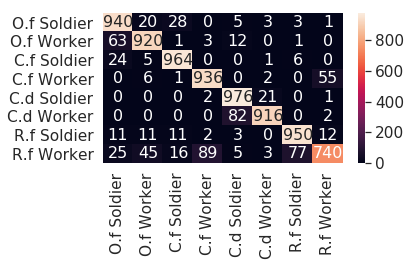

runtime :  14336.234754562378

[62] accuracy: 0.921 loss: 37.867

[0.815, 0.85625, 0.88175, 0.886375, 0.89325, 0.899125, 0.902, 0.905, 0.90625, 0.907875, 0.90575, 0.910125, 0.909375, 0.911, 0.90925, 0.907875, 0.911125, 0.910125, 0.909875, 0.914375, 0.91475, 0.9135, 0.90975, 0.914125, 0.914375, 0.911875, 0.9165, 0.914875, 0.916125, 0.912875, 0.917875, 0.917875, 0.913875, 0.9195, 0.918375, 0.9205, 0.917875, 0.918625, 0.921375, 0.916125, 0.91625, 0.921, 0.916875, 0.92175, 0.92, 0.91725, 0.9175, 0.920125, 0.92, 0.920375, 0.922125, 0.922, 0.919125, 0.923625, 0.921125, 0.919125, 0.9205, 0.92075, 0.918375, 0.919125, 0.91775, 0.921375]
[64.11414223909378, 49.904711842536926, 44.67099912464619, 41.61231115460396, 41.263010531663895, 39.30233183503151, 38.275576405227184, 37.62644839286804, 37.14999883621931, 37.15717602521181, 38.36975885927677, 38.00613395869732, 37.108960159122944, 37.26954859495163, 37.773814633488655, 37.71399527788162, 37.36094921082258, 38.73386053740978, 38.4434295669198

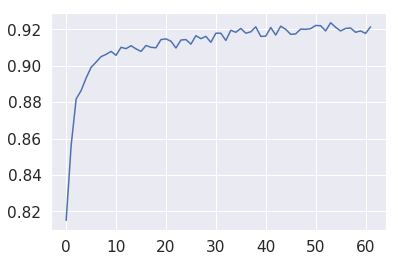

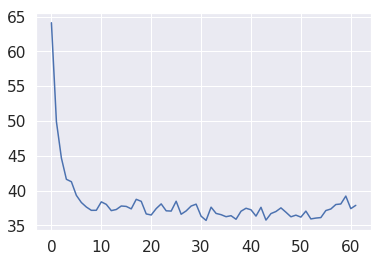

[7, 1, 0, 5, 7, 3, 7, 3, 4, 0, 3, 7, 6, 6, 4, 3, 7, 1, 3, 0, 6, 0, 0, 0, 7, 0, 6, 6, 7, 3, 4, 7, 5, 4, 7, 7, 0, 7, 3, 3, 1, 2, 7, 4, 7, 1, 3, 6, 1, 5, 4, 0, 3, 5, 4, 7, 4, 1, 1, 4, 1, 7, 6, 0, 4, 0, 0, 3, 1, 4, 4, 0, 3, 7, 1, 0, 1, 2, 6, 0, 0, 0, 5, 0, 4, 7, 6, 7, 6, 6, 1, 4, 3, 1, 6, 2, 0, 7, 0, 6, 1, 6, 0, 6, 4, 3, 3, 4, 5, 6, 0, 6, 2, 2, 7, 2, 0, 6, 4, 7, 6, 0, 2, 6, 3, 4, 6, 2, 4, 1, 3, 3, 1, 6, 1, 1, 3, 1, 0, 4, 7, 6, 7, 3, 7, 3, 6, 0, 0, 5, 5, 2, 3, 7, 0, 1, 6, 4, 4, 2, 0, 2, 5, 4, 0, 7, 0, 6, 7, 2, 7, 3, 0, 6, 4, 0, 0, 0, 7, 4, 7, 1, 4, 4, 4, 3, 7, 3, 6, 0, 0, 4, 3, 7, 1, 3, 3, 6, 7, 1, 0, 3, 0, 4, 3, 0, 6, 3, 4, 6, 6, 0, 3, 7, 4, 7, 3, 1, 7, 1, 2, 1, 3, 5, 6, 4, 0, 7, 2, 0, 4, 4, 6, 6, 4, 0, 2, 0, 2, 2, 0, 7, 3, 6, 3, 4, 1, 6, 0, 7, 0, 1, 4, 1, 6, 3, 3, 6, 6, 3, 3, 7, 4, 2, 4, 3, 2, 4, 0, 6, 6, 5, 6, 2, 4, 1, 2, 0, 4, 3, 4, 4, 1, 3, 1, 0, 1, 0, 0, 3, 1, 5, 0, 3, 1, 1, 0, 3, 6, 4, 7, 1, 1, 7, 3, 6, 1, 2, 7, 7, 0, 6, 0, 3, 5, 0, 4, 4, 4, 3, 1, 0, 6, 7, 6, 1, 1, 3, 4, 4, 4, 1, 0, 

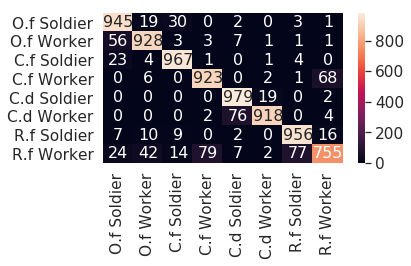

runtime :  14573.125277757645

[63] accuracy: 0.923 loss: 36.693

[0.815, 0.85625, 0.88175, 0.886375, 0.89325, 0.899125, 0.902, 0.905, 0.90625, 0.907875, 0.90575, 0.910125, 0.909375, 0.911, 0.90925, 0.907875, 0.911125, 0.910125, 0.909875, 0.914375, 0.91475, 0.9135, 0.90975, 0.914125, 0.914375, 0.911875, 0.9165, 0.914875, 0.916125, 0.912875, 0.917875, 0.917875, 0.913875, 0.9195, 0.918375, 0.9205, 0.917875, 0.918625, 0.921375, 0.916125, 0.91625, 0.921, 0.916875, 0.92175, 0.92, 0.91725, 0.9175, 0.920125, 0.92, 0.920375, 0.922125, 0.922, 0.919125, 0.923625, 0.921125, 0.919125, 0.9205, 0.92075, 0.918375, 0.919125, 0.91775, 0.921375, 0.922625]
[64.11414223909378, 49.904711842536926, 44.67099912464619, 41.61231115460396, 41.263010531663895, 39.30233183503151, 38.275576405227184, 37.62644839286804, 37.14999883621931, 37.15717602521181, 38.36975885927677, 38.00613395869732, 37.108960159122944, 37.26954859495163, 37.773814633488655, 37.71399527788162, 37.36094921082258, 38.73386053740978, 38.443

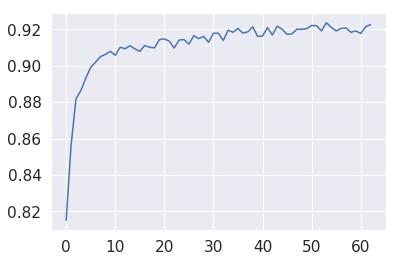

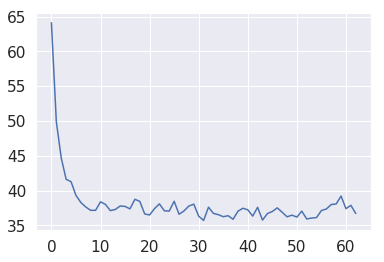

[2, 0, 2, 4, 6, 4, 3, 2, 0, 6, 7, 3, 5, 6, 4, 3, 2, 2, 7, 6, 1, 4, 3, 5, 3, 0, 6, 3, 1, 7, 0, 3, 1, 6, 4, 6, 0, 1, 0, 6, 3, 4, 2, 1, 6, 3, 0, 5, 4, 3, 5, 3, 6, 1, 3, 6, 6, 7, 4, 6, 7, 7, 7, 6, 1, 7, 3, 4, 4, 6, 7, 5, 6, 7, 7, 6, 2, 3, 7, 1, 2, 0, 4, 7, 3, 5, 3, 0, 3, 2, 7, 1, 0, 0, 0, 4, 7, 7, 7, 0, 0, 6, 0, 6, 3, 3, 3, 2, 2, 2, 2, 1, 1, 6, 0, 7, 3, 0, 6, 2, 7, 6, 0, 7, 5, 4, 7, 1, 4, 3, 4, 1, 0, 1, 7, 0, 0, 4, 3, 4, 6, 0, 2, 7, 6, 7, 2, 2, 0, 0, 0, 0, 3, 6, 0, 3, 4, 1, 3, 0, 4, 0, 1, 1, 1, 0, 2, 3, 1, 0, 3, 3, 5, 7, 7, 0, 6, 1, 3, 0, 3, 1, 7, 2, 0, 0, 6, 2, 5, 0, 4, 3, 4, 5, 2, 0, 3, 4, 3, 0, 0, 4, 6, 0, 4, 7, 4, 6, 4, 3, 3, 1, 3, 1, 4, 6, 2, 2, 7, 7, 4, 6, 3, 6, 4, 7, 0, 1, 6, 1, 7, 7, 3, 3, 6, 0, 0, 4, 6, 6, 0, 6, 2, 0, 1, 2, 7, 0, 7, 4, 2, 5, 2, 7, 3, 4, 6, 3, 4, 1, 7, 2, 3, 0, 3, 3, 6, 4, 0, 3, 0, 7, 4, 6, 7, 1, 4, 4, 7, 6, 1, 7, 0, 4, 0, 0, 4, 3, 0, 3, 7, 6, 4, 4, 6, 3, 0, 6, 0, 7, 3, 4, 6, 1, 1, 6, 4, 2, 0, 7, 6, 1, 3, 1, 6, 6, 0, 0, 1, 0, 0, 6, 7, 0, 0, 3, 6, 5, 7, 4, 6, 0, 1, 

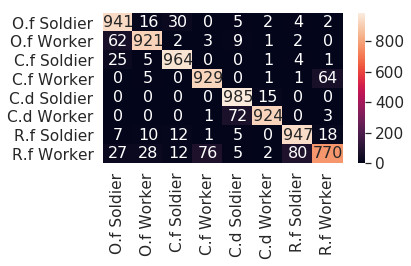

runtime :  14806.61628818512

[64] accuracy: 0.919 loss: 37.836

[0.815, 0.85625, 0.88175, 0.886375, 0.89325, 0.899125, 0.902, 0.905, 0.90625, 0.907875, 0.90575, 0.910125, 0.909375, 0.911, 0.90925, 0.907875, 0.911125, 0.910125, 0.909875, 0.914375, 0.91475, 0.9135, 0.90975, 0.914125, 0.914375, 0.911875, 0.9165, 0.914875, 0.916125, 0.912875, 0.917875, 0.917875, 0.913875, 0.9195, 0.918375, 0.9205, 0.917875, 0.918625, 0.921375, 0.916125, 0.91625, 0.921, 0.916875, 0.92175, 0.92, 0.91725, 0.9175, 0.920125, 0.92, 0.920375, 0.922125, 0.922, 0.919125, 0.923625, 0.921125, 0.919125, 0.9205, 0.92075, 0.918375, 0.919125, 0.91775, 0.921375, 0.922625, 0.919375]
[64.11414223909378, 49.904711842536926, 44.67099912464619, 41.61231115460396, 41.263010531663895, 39.30233183503151, 38.275576405227184, 37.62644839286804, 37.14999883621931, 37.15717602521181, 38.36975885927677, 38.00613395869732, 37.108960159122944, 37.26954859495163, 37.773814633488655, 37.71399527788162, 37.36094921082258, 38.7338605374097

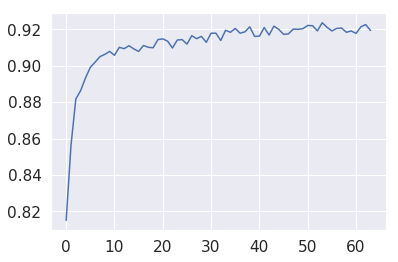

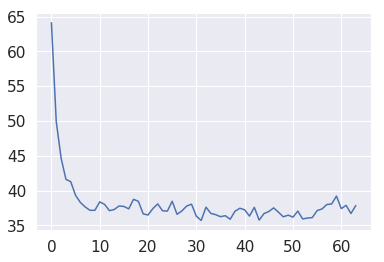

[4, 7, 7, 0, 3, 7, 3, 7, 0, 6, 0, 7, 7, 2, 6, 7, 2, 4, 7, 3, 2, 6, 0, 0, 1, 3, 0, 3, 2, 7, 5, 1, 4, 7, 7, 6, 4, 3, 6, 3, 2, 2, 5, 7, 7, 2, 7, 4, 6, 6, 2, 4, 7, 6, 2, 0, 7, 1, 2, 7, 4, 3, 7, 2, 7, 0, 4, 7, 7, 7, 6, 7, 0, 1, 6, 7, 0, 2, 2, 0, 1, 0, 4, 1, 4, 0, 1, 0, 6, 5, 3, 0, 4, 6, 0, 6, 1, 7, 1, 1, 7, 3, 2, 1, 3, 1, 4, 1, 4, 6, 2, 0, 0, 0, 6, 2, 3, 1, 6, 1, 3, 4, 5, 4, 5, 0, 3, 3, 1, 3, 6, 4, 3, 1, 1, 2, 1, 3, 1, 6, 7, 0, 0, 7, 6, 4, 2, 1, 7, 7, 4, 0, 7, 3, 6, 5, 0, 7, 1, 2, 6, 0, 7, 4, 7, 0, 3, 2, 0, 5, 2, 6, 3, 2, 7, 7, 1, 1, 7, 6, 0, 6, 0, 4, 7, 1, 6, 1, 5, 0, 2, 6, 4, 2, 0, 0, 7, 6, 0, 4, 7, 7, 7, 0, 2, 4, 0, 1, 7, 6, 3, 4, 7, 4, 4, 1, 0, 3, 0, 5, 5, 3, 2, 7, 4, 0, 1, 0, 3, 1, 4, 3, 4, 1, 0, 0, 0, 7, 7, 0, 7, 0, 4, 4, 2, 0, 6, 2, 5, 1, 0, 4, 6, 3, 2, 3, 0, 5, 4, 5, 4, 6, 6, 7, 1, 2, 3, 4, 0, 4, 0, 6, 2, 0, 6, 1, 0, 4, 3, 3, 6, 5, 0, 4, 0, 4, 0, 4, 1, 0, 4, 3, 0, 0, 7, 0, 1, 7, 0, 0, 1, 1, 4, 3, 2, 3, 0, 6, 0, 3, 0, 6, 3, 3, 4, 5, 3, 6, 4, 6, 3, 4, 3, 4, 4, 3, 6, 6, 0, 3, 7, 7, 5, 

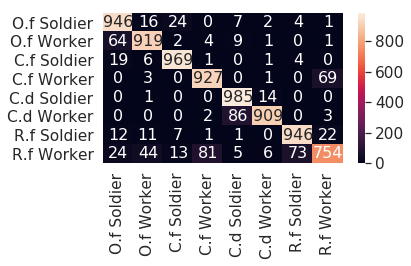

runtime :  15043.439577102661

[65] accuracy: 0.917 loss: 38.302

[0.815, 0.85625, 0.88175, 0.886375, 0.89325, 0.899125, 0.902, 0.905, 0.90625, 0.907875, 0.90575, 0.910125, 0.909375, 0.911, 0.90925, 0.907875, 0.911125, 0.910125, 0.909875, 0.914375, 0.91475, 0.9135, 0.90975, 0.914125, 0.914375, 0.911875, 0.9165, 0.914875, 0.916125, 0.912875, 0.917875, 0.917875, 0.913875, 0.9195, 0.918375, 0.9205, 0.917875, 0.918625, 0.921375, 0.916125, 0.91625, 0.921, 0.916875, 0.92175, 0.92, 0.91725, 0.9175, 0.920125, 0.92, 0.920375, 0.922125, 0.922, 0.919125, 0.923625, 0.921125, 0.919125, 0.9205, 0.92075, 0.918375, 0.919125, 0.91775, 0.921375, 0.922625, 0.919375, 0.917375]
[64.11414223909378, 49.904711842536926, 44.67099912464619, 41.61231115460396, 41.263010531663895, 39.30233183503151, 38.275576405227184, 37.62644839286804, 37.14999883621931, 37.15717602521181, 38.36975885927677, 38.00613395869732, 37.108960159122944, 37.26954859495163, 37.773814633488655, 37.71399527788162, 37.36094921082258, 38.73

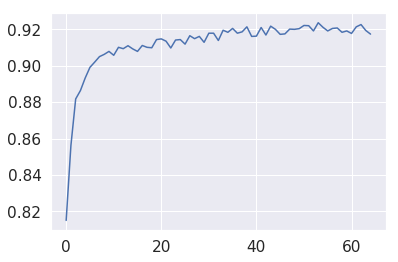

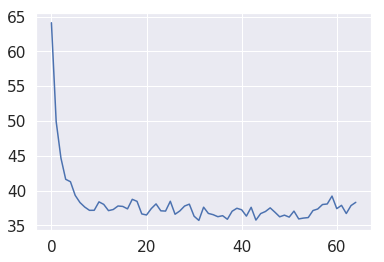

[7, 3, 0, 0, 2, 7, 3, 1, 6, 4, 4, 4, 0, 6, 3, 5, 0, 4, 0, 0, 2, 3, 1, 3, 0, 7, 2, 0, 2, 4, 6, 0, 0, 2, 6, 3, 2, 7, 1, 3, 4, 6, 6, 7, 2, 4, 6, 4, 4, 0, 6, 4, 6, 0, 1, 4, 3, 4, 1, 0, 2, 4, 7, 0, 7, 0, 3, 7, 0, 4, 6, 7, 6, 1, 4, 6, 3, 0, 1, 6, 1, 1, 1, 0, 4, 6, 4, 0, 2, 3, 5, 3, 1, 6, 4, 0, 0, 6, 7, 6, 5, 7, 0, 3, 7, 0, 0, 6, 7, 7, 1, 3, 3, 0, 3, 0, 5, 1, 7, 1, 6, 4, 0, 6, 6, 0, 2, 0, 3, 4, 1, 2, 7, 4, 3, 4, 3, 7, 0, 3, 1, 4, 4, 3, 1, 4, 0, 0, 4, 6, 7, 4, 6, 4, 6, 1, 0, 4, 6, 3, 0, 4, 6, 7, 0, 0, 7, 1, 6, 1, 0, 3, 3, 6, 3, 5, 5, 6, 7, 0, 3, 6, 4, 3, 4, 1, 6, 7, 3, 6, 5, 7, 7, 0, 3, 5, 4, 6, 4, 1, 6, 6, 5, 3, 4, 4, 4, 7, 7, 2, 4, 1, 0, 3, 4, 4, 7, 0, 7, 5, 4, 3, 6, 7, 7, 0, 6, 4, 0, 3, 5, 6, 4, 3, 5, 4, 4, 1, 4, 2, 3, 1, 3, 3, 4, 3, 7, 4, 0, 3, 7, 1, 0, 7, 3, 7, 2, 2, 4, 0, 2, 0, 1, 7, 0, 1, 0, 7, 1, 1, 4, 2, 6, 0, 0, 4, 1, 0, 6, 1, 0, 5, 4, 0, 6, 2, 1, 3, 7, 6, 1, 6, 1, 0, 0, 6, 7, 6, 4, 4, 0, 6, 6, 3, 2, 2, 6, 3, 4, 2, 0, 1, 2, 1, 0, 3, 0, 6, 0, 7, 7, 2, 4, 0, 7, 7, 3, 1, 1, 4, 0, 6, 5, 

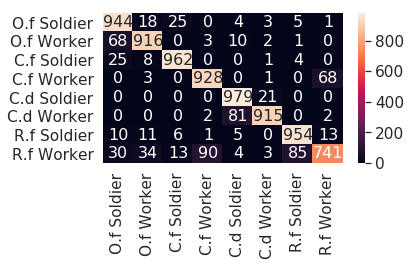

runtime :  15281.910409927368

[66] accuracy: 0.920 loss: 37.064

[0.815, 0.85625, 0.88175, 0.886375, 0.89325, 0.899125, 0.902, 0.905, 0.90625, 0.907875, 0.90575, 0.910125, 0.909375, 0.911, 0.90925, 0.907875, 0.911125, 0.910125, 0.909875, 0.914375, 0.91475, 0.9135, 0.90975, 0.914125, 0.914375, 0.911875, 0.9165, 0.914875, 0.916125, 0.912875, 0.917875, 0.917875, 0.913875, 0.9195, 0.918375, 0.9205, 0.917875, 0.918625, 0.921375, 0.916125, 0.91625, 0.921, 0.916875, 0.92175, 0.92, 0.91725, 0.9175, 0.920125, 0.92, 0.920375, 0.922125, 0.922, 0.919125, 0.923625, 0.921125, 0.919125, 0.9205, 0.92075, 0.918375, 0.919125, 0.91775, 0.921375, 0.922625, 0.919375, 0.917375, 0.91975]
[64.11414223909378, 49.904711842536926, 44.67099912464619, 41.61231115460396, 41.263010531663895, 39.30233183503151, 38.275576405227184, 37.62644839286804, 37.14999883621931, 37.15717602521181, 38.36975885927677, 38.00613395869732, 37.108960159122944, 37.26954859495163, 37.773814633488655, 37.71399527788162, 37.360949210822

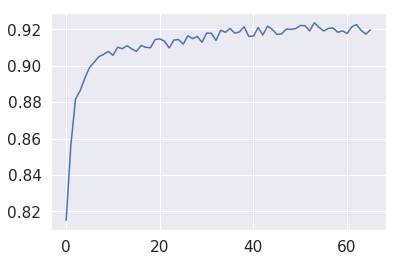

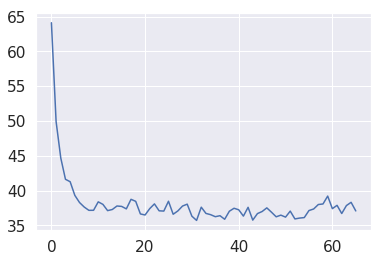

[4, 0, 6, 4, 0, 0, 6, 3, 6, 0, 5, 3, 7, 3, 5, 1, 3, 4, 0, 0, 0, 4, 7, 1, 7, 2, 1, 0, 7, 6, 3, 4, 0, 0, 4, 3, 7, 0, 2, 0, 3, 4, 4, 4, 7, 6, 2, 7, 7, 7, 1, 7, 4, 7, 6, 0, 7, 5, 1, 5, 6, 4, 4, 0, 4, 7, 1, 0, 7, 7, 7, 0, 3, 7, 2, 3, 2, 2, 7, 4, 5, 4, 1, 0, 6, 2, 6, 4, 6, 3, 1, 1, 0, 7, 0, 6, 4, 1, 7, 7, 1, 4, 6, 2, 0, 1, 6, 0, 0, 3, 0, 0, 6, 3, 4, 0, 2, 7, 0, 4, 2, 0, 3, 4, 2, 0, 3, 4, 3, 1, 1, 0, 6, 6, 0, 4, 7, 0, 0, 0, 5, 4, 7, 6, 0, 7, 2, 5, 0, 0, 6, 0, 6, 0, 1, 4, 3, 4, 3, 0, 2, 0, 0, 0, 6, 6, 4, 1, 6, 0, 7, 0, 0, 4, 7, 6, 7, 1, 6, 2, 7, 3, 0, 0, 3, 6, 3, 4, 4, 5, 6, 4, 6, 2, 2, 6, 0, 2, 3, 6, 6, 2, 2, 6, 2, 0, 4, 3, 6, 6, 0, 4, 7, 4, 1, 7, 0, 7, 7, 7, 0, 7, 6, 0, 2, 3, 3, 0, 0, 1, 5, 0, 4, 1, 3, 6, 3, 7, 0, 0, 6, 4, 3, 5, 7, 6, 0, 0, 1, 5, 0, 1, 6, 4, 4, 7, 1, 7, 4, 1, 7, 7, 7, 2, 6, 0, 0, 0, 6, 7, 6, 4, 7, 7, 0, 6, 4, 6, 0, 6, 2, 6, 1, 7, 4, 0, 4, 4, 3, 2, 7, 3, 2, 0, 5, 2, 4, 2, 0, 4, 0, 0, 2, 3, 6, 7, 4, 6, 5, 7, 0, 2, 4, 0, 0, 3, 4, 3, 3, 4, 1, 4, 1, 1, 6, 1, 4, 3, 1, 3, 1, 1, 5, 

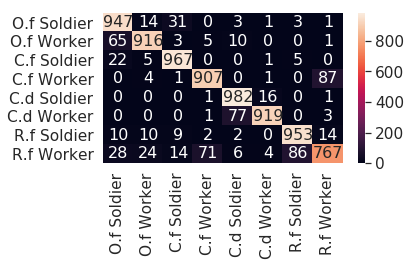

runtime :  15517.779447078705

[67] accuracy: 0.924 loss: 36.585

[0.815, 0.85625, 0.88175, 0.886375, 0.89325, 0.899125, 0.902, 0.905, 0.90625, 0.907875, 0.90575, 0.910125, 0.909375, 0.911, 0.90925, 0.907875, 0.911125, 0.910125, 0.909875, 0.914375, 0.91475, 0.9135, 0.90975, 0.914125, 0.914375, 0.911875, 0.9165, 0.914875, 0.916125, 0.912875, 0.917875, 0.917875, 0.913875, 0.9195, 0.918375, 0.9205, 0.917875, 0.918625, 0.921375, 0.916125, 0.91625, 0.921, 0.916875, 0.92175, 0.92, 0.91725, 0.9175, 0.920125, 0.92, 0.920375, 0.922125, 0.922, 0.919125, 0.923625, 0.921125, 0.919125, 0.9205, 0.92075, 0.918375, 0.919125, 0.91775, 0.921375, 0.922625, 0.919375, 0.917375, 0.91975, 0.923875]
[64.11414223909378, 49.904711842536926, 44.67099912464619, 41.61231115460396, 41.263010531663895, 39.30233183503151, 38.275576405227184, 37.62644839286804, 37.14999883621931, 37.15717602521181, 38.36975885927677, 38.00613395869732, 37.108960159122944, 37.26954859495163, 37.773814633488655, 37.71399527788162, 37.36

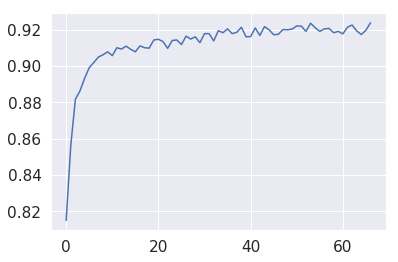

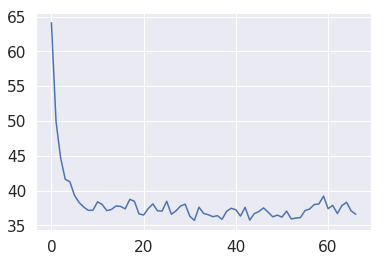

[0, 2, 0, 1, 2, 0, 1, 1, 0, 2, 3, 2, 2, 0, 4, 6, 4, 3, 4, 7, 4, 1, 5, 6, 7, 2, 3, 4, 1, 6, 4, 1, 3, 7, 7, 6, 1, 4, 6, 3, 0, 6, 6, 3, 7, 0, 5, 3, 0, 3, 3, 1, 2, 6, 4, 6, 6, 4, 3, 4, 7, 3, 0, 4, 0, 2, 4, 7, 6, 5, 7, 6, 6, 7, 6, 0, 6, 2, 0, 6, 0, 1, 4, 3, 1, 4, 4, 4, 0, 6, 4, 6, 1, 5, 6, 0, 6, 7, 5, 7, 4, 0, 3, 7, 0, 4, 3, 1, 0, 1, 7, 0, 0, 7, 7, 0, 4, 2, 5, 3, 5, 0, 2, 6, 4, 5, 7, 1, 1, 3, 4, 2, 0, 0, 0, 4, 1, 3, 4, 0, 1, 7, 0, 4, 7, 4, 2, 4, 4, 0, 2, 7, 3, 3, 5, 6, 0, 3, 6, 6, 0, 7, 3, 3, 3, 6, 5, 1, 6, 7, 1, 6, 6, 6, 1, 3, 4, 7, 1, 1, 3, 0, 0, 0, 3, 0, 0, 0, 0, 7, 6, 7, 2, 4, 6, 7, 0, 4, 0, 0, 6, 4, 7, 4, 4, 4, 7, 3, 1, 4, 0, 1, 1, 7, 4, 2, 3, 6, 4, 4, 1, 3, 0, 0, 3, 0, 3, 7, 7, 0, 5, 2, 0, 3, 4, 3, 6, 0, 3, 3, 7, 3, 6, 3, 6, 1, 3, 2, 3, 0, 7, 0, 6, 0, 5, 7, 0, 3, 1, 1, 5, 7, 7, 6, 3, 2, 4, 4, 0, 6, 3, 4, 0, 1, 0, 6, 0, 3, 7, 4, 0, 4, 6, 0, 1, 4, 1, 2, 2, 3, 7, 7, 7, 0, 7, 6, 7, 1, 4, 4, 1, 1, 2, 7, 7, 0, 0, 3, 0, 1, 6, 0, 4, 3, 4, 7, 7, 6, 0, 6, 3, 0, 3, 5, 7, 4, 1, 6, 7, 6, 1, 2, 7, 

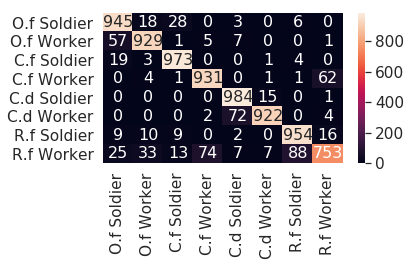

runtime :  15752.83831167221

[68] accuracy: 0.923 loss: 37.145

[0.815, 0.85625, 0.88175, 0.886375, 0.89325, 0.899125, 0.902, 0.905, 0.90625, 0.907875, 0.90575, 0.910125, 0.909375, 0.911, 0.90925, 0.907875, 0.911125, 0.910125, 0.909875, 0.914375, 0.91475, 0.9135, 0.90975, 0.914125, 0.914375, 0.911875, 0.9165, 0.914875, 0.916125, 0.912875, 0.917875, 0.917875, 0.913875, 0.9195, 0.918375, 0.9205, 0.917875, 0.918625, 0.921375, 0.916125, 0.91625, 0.921, 0.916875, 0.92175, 0.92, 0.91725, 0.9175, 0.920125, 0.92, 0.920375, 0.922125, 0.922, 0.919125, 0.923625, 0.921125, 0.919125, 0.9205, 0.92075, 0.918375, 0.919125, 0.91775, 0.921375, 0.922625, 0.919375, 0.917375, 0.91975, 0.923875, 0.92325]
[64.11414223909378, 49.904711842536926, 44.67099912464619, 41.61231115460396, 41.263010531663895, 39.30233183503151, 38.275576405227184, 37.62644839286804, 37.14999883621931, 37.15717602521181, 38.36975885927677, 38.00613395869732, 37.108960159122944, 37.26954859495163, 37.773814633488655, 37.7139952778816

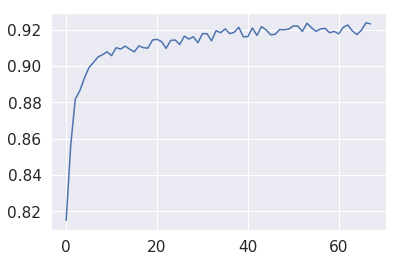

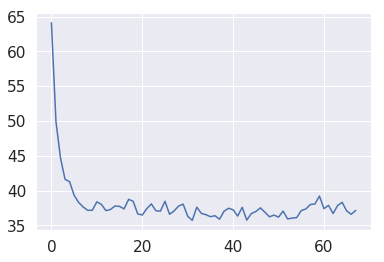

[2, 0, 7, 7, 7, 7, 1, 4, 7, 6, 1, 3, 4, 6, 0, 7, 1, 4, 6, 4, 4, 1, 2, 0, 4, 6, 4, 5, 6, 7, 1, 0, 7, 1, 0, 5, 0, 0, 6, 3, 3, 7, 3, 5, 6, 0, 7, 5, 7, 0, 7, 7, 2, 6, 4, 0, 5, 0, 0, 4, 0, 1, 1, 0, 6, 3, 4, 7, 4, 6, 6, 2, 5, 3, 7, 1, 0, 1, 0, 7, 1, 3, 1, 1, 6, 1, 4, 7, 4, 0, 3, 4, 7, 1, 4, 0, 1, 3, 6, 6, 2, 3, 7, 0, 7, 3, 0, 6, 0, 6, 2, 3, 5, 1, 3, 0, 7, 3, 3, 2, 4, 0, 3, 6, 4, 7, 2, 7, 3, 3, 1, 6, 2, 4, 6, 6, 0, 6, 4, 0, 7, 4, 4, 4, 7, 4, 3, 1, 1, 3, 4, 4, 3, 6, 3, 2, 3, 2, 3, 0, 4, 2, 7, 3, 3, 4, 3, 3, 6, 7, 7, 2, 1, 6, 7, 7, 6, 6, 0, 1, 6, 3, 7, 0, 1, 5, 6, 7, 0, 0, 1, 6, 4, 3, 4, 3, 3, 3, 6, 7, 4, 6, 0, 0, 3, 6, 3, 4, 3, 6, 3, 1, 5, 3, 4, 2, 6, 0, 0, 7, 5, 5, 3, 0, 3, 2, 1, 7, 3, 5, 0, 0, 7, 0, 7, 3, 6, 0, 4, 3, 6, 0, 7, 1, 1, 4, 0, 4, 4, 3, 6, 6, 3, 7, 2, 4, 7, 3, 0, 3, 4, 0, 6, 3, 3, 4, 1, 3, 3, 4, 4, 2, 6, 1, 4, 2, 5, 7, 0, 4, 4, 1, 7, 7, 2, 0, 0, 3, 0, 0, 0, 7, 6, 3, 3, 1, 6, 0, 0, 0, 4, 0, 6, 5, 3, 0, 0, 7, 3, 4, 1, 7, 6, 0, 4, 6, 2, 6, 2, 2, 5, 4, 4, 6, 3, 2, 7, 0, 0, 4, 6, 4, 0, 

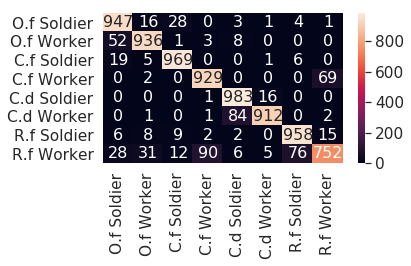

runtime :  15988.255360841751

[69] accuracy: 0.920 loss: 38.669

[0.815, 0.85625, 0.88175, 0.886375, 0.89325, 0.899125, 0.902, 0.905, 0.90625, 0.907875, 0.90575, 0.910125, 0.909375, 0.911, 0.90925, 0.907875, 0.911125, 0.910125, 0.909875, 0.914375, 0.91475, 0.9135, 0.90975, 0.914125, 0.914375, 0.911875, 0.9165, 0.914875, 0.916125, 0.912875, 0.917875, 0.917875, 0.913875, 0.9195, 0.918375, 0.9205, 0.917875, 0.918625, 0.921375, 0.916125, 0.91625, 0.921, 0.916875, 0.92175, 0.92, 0.91725, 0.9175, 0.920125, 0.92, 0.920375, 0.922125, 0.922, 0.919125, 0.923625, 0.921125, 0.919125, 0.9205, 0.92075, 0.918375, 0.919125, 0.91775, 0.921375, 0.922625, 0.919375, 0.917375, 0.91975, 0.923875, 0.92325, 0.92025]
[64.11414223909378, 49.904711842536926, 44.67099912464619, 41.61231115460396, 41.263010531663895, 39.30233183503151, 38.275576405227184, 37.62644839286804, 37.14999883621931, 37.15717602521181, 38.36975885927677, 38.00613395869732, 37.108960159122944, 37.26954859495163, 37.773814633488655, 37.713

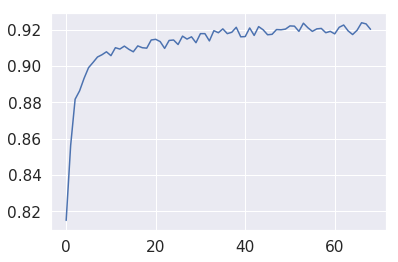

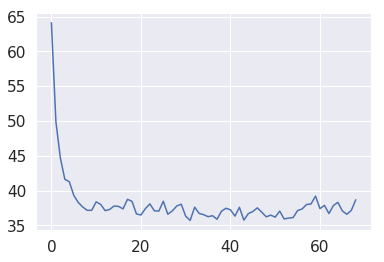

[4, 2, 0, 0, 7, 0, 3, 3, 4, 6, 1, 6, 6, 7, 4, 5, 1, 3, 2, 5, 3, 4, 6, 6, 7, 4, 0, 0, 6, 3, 0, 2, 7, 4, 7, 6, 7, 0, 7, 7, 3, 4, 6, 4, 4, 1, 6, 6, 4, 1, 4, 3, 0, 7, 3, 2, 6, 6, 3, 1, 6, 2, 1, 4, 3, 1, 1, 4, 0, 5, 1, 6, 3, 0, 6, 4, 6, 6, 2, 3, 4, 2, 0, 7, 5, 7, 1, 2, 4, 3, 5, 4, 4, 4, 7, 6, 2, 6, 6, 3, 2, 4, 5, 7, 0, 0, 1, 4, 4, 1, 0, 3, 0, 2, 3, 3, 0, 0, 3, 1, 0, 4, 2, 3, 0, 4, 2, 3, 1, 0, 4, 4, 6, 2, 1, 0, 2, 1, 2, 3, 3, 5, 3, 1, 2, 2, 4, 2, 7, 4, 3, 2, 7, 6, 2, 1, 2, 3, 4, 7, 7, 0, 5, 2, 2, 1, 3, 1, 3, 4, 2, 4, 7, 6, 3, 7, 7, 7, 4, 3, 7, 6, 7, 1, 3, 7, 4, 6, 6, 1, 3, 1, 3, 7, 0, 3, 0, 0, 7, 0, 6, 3, 2, 6, 0, 6, 0, 7, 5, 6, 4, 1, 0, 4, 3, 2, 3, 4, 3, 4, 2, 5, 6, 0, 2, 6, 2, 6, 0, 0, 3, 6, 7, 7, 0, 6, 3, 1, 4, 2, 3, 0, 4, 5, 4, 4, 6, 1, 0, 3, 6, 0, 6, 3, 0, 6, 3, 5, 0, 0, 0, 1, 3, 3, 7, 0, 2, 6, 4, 1, 1, 3, 1, 2, 0, 3, 7, 6, 4, 2, 1, 2, 0, 0, 2, 4, 7, 1, 0, 1, 2, 0, 0, 1, 3, 4, 4, 6, 3, 3, 2, 0, 0, 4, 1, 7, 7, 0, 4, 6, 7, 0, 4, 7, 0, 4, 4, 3, 7, 2, 6, 3, 1, 0, 7, 0, 0, 6, 1, 3, 3, 2, 6, 

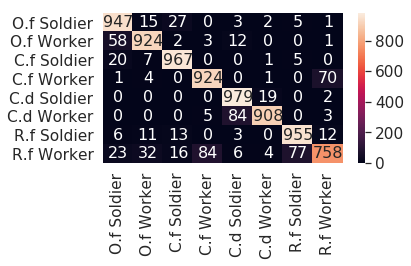

runtime :  16225.790439128876

[70] accuracy: 0.921 loss: 38.581

[0.815, 0.85625, 0.88175, 0.886375, 0.89325, 0.899125, 0.902, 0.905, 0.90625, 0.907875, 0.90575, 0.910125, 0.909375, 0.911, 0.90925, 0.907875, 0.911125, 0.910125, 0.909875, 0.914375, 0.91475, 0.9135, 0.90975, 0.914125, 0.914375, 0.911875, 0.9165, 0.914875, 0.916125, 0.912875, 0.917875, 0.917875, 0.913875, 0.9195, 0.918375, 0.9205, 0.917875, 0.918625, 0.921375, 0.916125, 0.91625, 0.921, 0.916875, 0.92175, 0.92, 0.91725, 0.9175, 0.920125, 0.92, 0.920375, 0.922125, 0.922, 0.919125, 0.923625, 0.921125, 0.919125, 0.9205, 0.92075, 0.918375, 0.919125, 0.91775, 0.921375, 0.922625, 0.919375, 0.917375, 0.91975, 0.923875, 0.92325, 0.92025, 0.920875]
[64.11414223909378, 49.904711842536926, 44.67099912464619, 41.61231115460396, 41.263010531663895, 39.30233183503151, 38.275576405227184, 37.62644839286804, 37.14999883621931, 37.15717602521181, 38.36975885927677, 38.00613395869732, 37.108960159122944, 37.26954859495163, 37.7738146334886

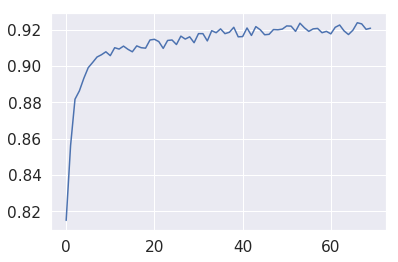

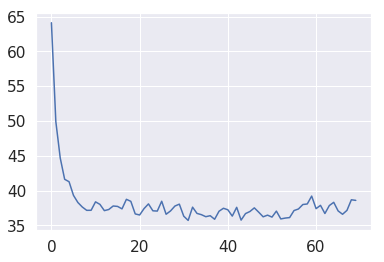

[6, 1, 3, 3, 4, 2, 6, 5, 0, 6, 1, 6, 4, 5, 3, 1, 3, 3, 3, 2, 4, 7, 7, 3, 3, 7, 4, 4, 4, 3, 0, 0, 2, 0, 1, 3, 7, 1, 1, 3, 6, 0, 3, 0, 6, 0, 5, 4, 1, 6, 1, 1, 1, 4, 3, 3, 3, 2, 7, 1, 6, 4, 6, 0, 3, 0, 6, 4, 0, 0, 6, 3, 0, 6, 0, 7, 7, 1, 7, 3, 7, 2, 2, 7, 0, 7, 4, 2, 2, 4, 6, 0, 0, 5, 2, 1, 4, 7, 4, 1, 0, 7, 5, 7, 1, 1, 7, 0, 0, 0, 7, 1, 2, 1, 7, 5, 7, 0, 6, 3, 4, 6, 4, 2, 7, 0, 4, 1, 3, 4, 1, 4, 4, 7, 6, 6, 6, 7, 7, 6, 4, 6, 1, 7, 6, 2, 7, 0, 3, 1, 2, 5, 4, 7, 4, 6, 0, 6, 1, 3, 6, 3, 0, 4, 7, 7, 1, 1, 1, 1, 6, 1, 6, 4, 0, 1, 2, 3, 4, 4, 0, 0, 4, 0, 6, 5, 6, 4, 4, 6, 7, 4, 3, 6, 0, 1, 7, 4, 6, 4, 3, 7, 7, 7, 0, 0, 3, 3, 0, 0, 7, 3, 7, 4, 0, 3, 4, 1, 1, 4, 4, 1, 7, 0, 1, 0, 6, 0, 3, 6, 3, 4, 3, 1, 1, 1, 4, 1, 0, 2, 3, 6, 2, 1, 4, 6, 0, 2, 2, 0, 7, 7, 1, 4, 0, 1, 3, 7, 6, 2, 6, 1, 0, 2, 0, 0, 0, 0, 0, 4, 2, 4, 7, 0, 1, 3, 3, 3, 4, 3, 2, 1, 6, 7, 0, 4, 2, 0, 4, 7, 5, 1, 0, 0, 2, 4, 0, 5, 0, 2, 0, 1, 3, 6, 0, 7, 6, 4, 5, 0, 7, 7, 2, 0, 7, 5, 4, 0, 3, 5, 3, 6, 3, 6, 1, 6, 1, 7, 0, 0, 5, 1, 3, 

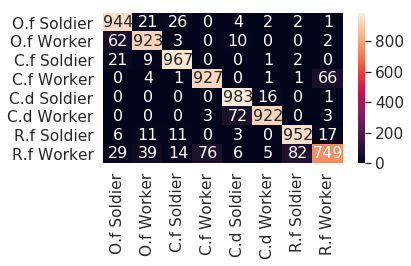

runtime :  16461.527847528458

[71] accuracy: 0.919 loss: 37.629

[0.815, 0.85625, 0.88175, 0.886375, 0.89325, 0.899125, 0.902, 0.905, 0.90625, 0.907875, 0.90575, 0.910125, 0.909375, 0.911, 0.90925, 0.907875, 0.911125, 0.910125, 0.909875, 0.914375, 0.91475, 0.9135, 0.90975, 0.914125, 0.914375, 0.911875, 0.9165, 0.914875, 0.916125, 0.912875, 0.917875, 0.917875, 0.913875, 0.9195, 0.918375, 0.9205, 0.917875, 0.918625, 0.921375, 0.916125, 0.91625, 0.921, 0.916875, 0.92175, 0.92, 0.91725, 0.9175, 0.920125, 0.92, 0.920375, 0.922125, 0.922, 0.919125, 0.923625, 0.921125, 0.919125, 0.9205, 0.92075, 0.918375, 0.919125, 0.91775, 0.921375, 0.922625, 0.919375, 0.917375, 0.91975, 0.923875, 0.92325, 0.92025, 0.920875, 0.919375]
[64.11414223909378, 49.904711842536926, 44.67099912464619, 41.61231115460396, 41.263010531663895, 39.30233183503151, 38.275576405227184, 37.62644839286804, 37.14999883621931, 37.15717602521181, 38.36975885927677, 38.00613395869732, 37.108960159122944, 37.26954859495163, 37.773

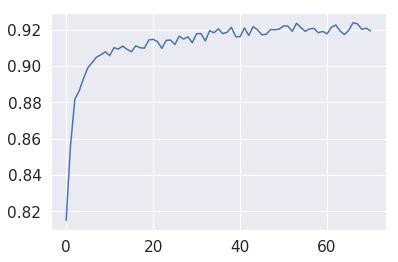

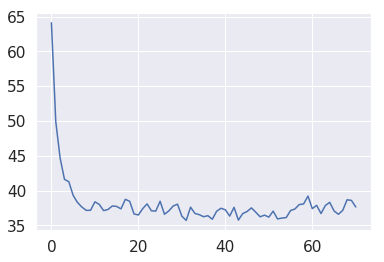

[4, 1, 0, 0, 3, 4, 0, 6, 6, 2, 3, 0, 5, 3, 7, 0, 0, 0, 4, 6, 0, 3, 2, 6, 7, 0, 3, 3, 6, 7, 2, 0, 4, 1, 0, 6, 7, 6, 5, 2, 1, 7, 2, 2, 5, 4, 0, 2, 0, 6, 4, 5, 4, 0, 7, 4, 6, 3, 7, 2, 0, 0, 3, 0, 2, 3, 0, 3, 4, 7, 2, 3, 6, 3, 7, 7, 6, 6, 2, 4, 2, 7, 6, 6, 3, 6, 1, 7, 1, 4, 0, 7, 0, 4, 1, 1, 4, 1, 1, 3, 7, 4, 6, 1, 6, 0, 7, 0, 7, 3, 0, 7, 6, 4, 6, 3, 1, 1, 0, 3, 6, 6, 5, 4, 4, 2, 2, 1, 0, 2, 7, 0, 3, 5, 1, 0, 1, 4, 3, 3, 3, 3, 0, 6, 0, 6, 2, 0, 5, 2, 0, 3, 3, 2, 6, 7, 6, 4, 4, 1, 0, 7, 5, 4, 3, 4, 1, 4, 7, 6, 7, 0, 3, 0, 0, 7, 4, 6, 3, 0, 0, 6, 1, 6, 4, 1, 0, 4, 7, 3, 4, 0, 1, 5, 1, 1, 1, 1, 3, 1, 2, 4, 1, 1, 3, 1, 6, 7, 1, 0, 3, 1, 0, 7, 1, 4, 1, 3, 0, 2, 2, 2, 2, 2, 3, 1, 2, 7, 0, 5, 4, 7, 7, 1, 0, 6, 4, 0, 6, 0, 0, 4, 4, 0, 0, 3, 4, 4, 4, 6, 6, 0, 7, 7, 7, 3, 1, 7, 5, 0, 4, 4, 2, 0, 3, 7, 1, 6, 4, 1, 5, 6, 6, 7, 5, 2, 4, 6, 4, 0, 0, 3, 7, 0, 1, 0, 4, 7, 3, 1, 0, 0, 6, 7, 7, 6, 4, 2, 2, 7, 4, 6, 0, 3, 2, 0, 3, 5, 3, 4, 6, 3, 0, 0, 4, 2, 6, 4, 0, 4, 0, 6, 6, 3, 7, 4, 0, 0, 0, 4, 3, 1, 6, 

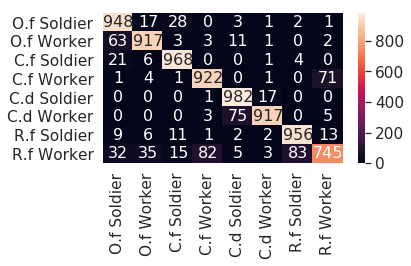

runtime :  16696.991827487946

[72] accuracy: 0.922 loss: 37.800

[0.815, 0.85625, 0.88175, 0.886375, 0.89325, 0.899125, 0.902, 0.905, 0.90625, 0.907875, 0.90575, 0.910125, 0.909375, 0.911, 0.90925, 0.907875, 0.911125, 0.910125, 0.909875, 0.914375, 0.91475, 0.9135, 0.90975, 0.914125, 0.914375, 0.911875, 0.9165, 0.914875, 0.916125, 0.912875, 0.917875, 0.917875, 0.913875, 0.9195, 0.918375, 0.9205, 0.917875, 0.918625, 0.921375, 0.916125, 0.91625, 0.921, 0.916875, 0.92175, 0.92, 0.91725, 0.9175, 0.920125, 0.92, 0.920375, 0.922125, 0.922, 0.919125, 0.923625, 0.921125, 0.919125, 0.9205, 0.92075, 0.918375, 0.919125, 0.91775, 0.921375, 0.922625, 0.919375, 0.917375, 0.91975, 0.923875, 0.92325, 0.92025, 0.920875, 0.919375, 0.92225]
[64.11414223909378, 49.904711842536926, 44.67099912464619, 41.61231115460396, 41.263010531663895, 39.30233183503151, 38.275576405227184, 37.62644839286804, 37.14999883621931, 37.15717602521181, 38.36975885927677, 38.00613395869732, 37.108960159122944, 37.2695485949516

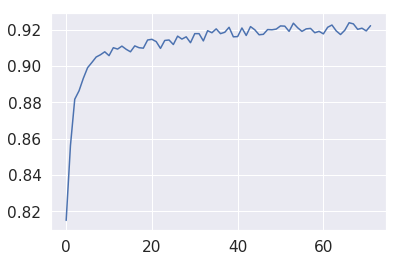

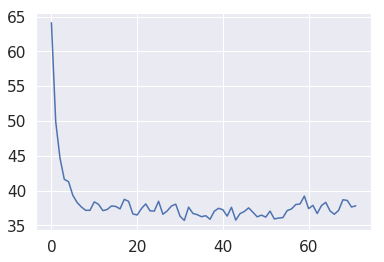

[6, 1, 3, 3, 3, 6, 3, 3, 4, 1, 3, 1, 3, 1, 7, 1, 3, 0, 0, 2, 6, 4, 0, 1, 1, 6, 1, 0, 3, 4, 0, 0, 4, 0, 2, 4, 1, 0, 1, 2, 3, 6, 4, 1, 7, 0, 0, 4, 7, 4, 3, 4, 2, 7, 4, 6, 2, 0, 7, 6, 0, 1, 4, 3, 6, 4, 3, 1, 7, 0, 0, 3, 4, 4, 4, 4, 0, 1, 3, 5, 5, 4, 1, 3, 3, 4, 6, 0, 2, 0, 1, 3, 7, 7, 6, 1, 7, 7, 6, 0, 0, 4, 3, 0, 6, 2, 2, 3, 6, 0, 6, 6, 2, 0, 0, 7, 4, 6, 4, 7, 3, 4, 0, 4, 3, 7, 0, 7, 0, 2, 3, 3, 0, 7, 1, 0, 3, 6, 7, 0, 1, 0, 4, 4, 4, 3, 3, 0, 4, 3, 2, 3, 6, 2, 7, 3, 3, 0, 4, 0, 7, 6, 1, 3, 0, 1, 5, 0, 0, 6, 1, 3, 6, 6, 4, 4, 0, 6, 7, 0, 3, 0, 0, 3, 3, 0, 4, 0, 1, 0, 1, 2, 6, 1, 4, 3, 7, 4, 3, 6, 5, 2, 1, 4, 7, 0, 7, 2, 0, 0, 0, 0, 4, 4, 0, 7, 0, 4, 3, 7, 0, 6, 0, 0, 1, 2, 3, 7, 0, 7, 7, 6, 3, 5, 1, 7, 3, 7, 5, 0, 6, 2, 0, 0, 5, 6, 4, 0, 7, 3, 5, 4, 6, 1, 3, 7, 4, 3, 0, 1, 1, 6, 6, 5, 5, 3, 2, 4, 3, 6, 4, 6, 2, 6, 7, 7, 1, 0, 1, 3, 6, 3, 0, 2, 4, 7, 3, 5, 1, 6, 0, 7, 0, 2, 5, 7, 5, 2, 3, 3, 0, 0, 0, 6, 0, 3, 5, 2, 1, 1, 7, 1, 2, 3, 4, 1, 3, 3, 7, 7, 6, 4, 0, 4, 3, 5, 6, 4, 6, 6, 2, 0, 0, 

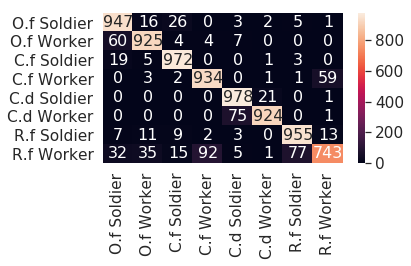

runtime :  16933.879906654358

[73] accuracy: 0.918 loss: 38.321

[0.815, 0.85625, 0.88175, 0.886375, 0.89325, 0.899125, 0.902, 0.905, 0.90625, 0.907875, 0.90575, 0.910125, 0.909375, 0.911, 0.90925, 0.907875, 0.911125, 0.910125, 0.909875, 0.914375, 0.91475, 0.9135, 0.90975, 0.914125, 0.914375, 0.911875, 0.9165, 0.914875, 0.916125, 0.912875, 0.917875, 0.917875, 0.913875, 0.9195, 0.918375, 0.9205, 0.917875, 0.918625, 0.921375, 0.916125, 0.91625, 0.921, 0.916875, 0.92175, 0.92, 0.91725, 0.9175, 0.920125, 0.92, 0.920375, 0.922125, 0.922, 0.919125, 0.923625, 0.921125, 0.919125, 0.9205, 0.92075, 0.918375, 0.919125, 0.91775, 0.921375, 0.922625, 0.919375, 0.917375, 0.91975, 0.923875, 0.92325, 0.92025, 0.920875, 0.919375, 0.92225, 0.917625]
[64.11414223909378, 49.904711842536926, 44.67099912464619, 41.61231115460396, 41.263010531663895, 39.30233183503151, 38.275576405227184, 37.62644839286804, 37.14999883621931, 37.15717602521181, 38.36975885927677, 38.00613395869732, 37.108960159122944, 37.269

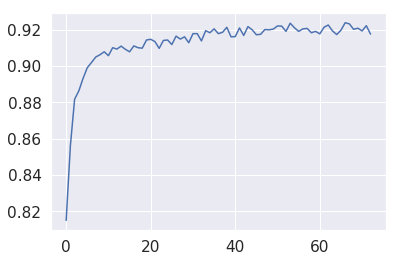

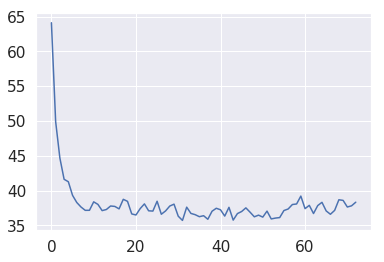

[2, 3, 0, 2, 3, 3, 7, 0, 7, 3, 4, 1, 1, 6, 1, 7, 4, 4, 1, 6, 3, 2, 3, 1, 0, 6, 1, 0, 3, 6, 4, 1, 7, 3, 2, 3, 4, 6, 4, 6, 4, 4, 6, 6, 3, 0, 7, 5, 7, 1, 2, 6, 7, 3, 0, 3, 0, 4, 6, 5, 6, 0, 0, 3, 2, 3, 4, 3, 1, 7, 0, 4, 1, 0, 4, 7, 2, 1, 0, 3, 0, 6, 0, 3, 6, 6, 3, 6, 1, 3, 4, 1, 2, 0, 3, 0, 4, 3, 0, 0, 2, 7, 0, 0, 2, 7, 1, 4, 1, 0, 6, 4, 4, 4, 2, 7, 4, 2, 1, 1, 5, 4, 0, 0, 1, 0, 7, 7, 4, 6, 0, 2, 7, 2, 4, 3, 7, 0, 1, 7, 4, 3, 4, 4, 6, 4, 4, 0, 1, 2, 4, 3, 1, 6, 4, 4, 6, 4, 4, 6, 2, 6, 6, 2, 4, 4, 2, 4, 2, 1, 6, 6, 5, 0, 6, 2, 4, 7, 0, 6, 7, 4, 0, 2, 1, 4, 7, 0, 0, 4, 7, 5, 7, 4, 0, 4, 7, 5, 3, 0, 7, 0, 5, 1, 0, 0, 1, 4, 0, 1, 7, 7, 0, 2, 7, 2, 3, 4, 0, 1, 5, 4, 4, 0, 0, 7, 6, 6, 6, 0, 0, 3, 0, 2, 6, 1, 1, 5, 2, 0, 1, 7, 0, 4, 2, 3, 1, 4, 0, 7, 4, 0, 4, 0, 4, 3, 3, 0, 1, 7, 0, 5, 3, 4, 5, 2, 3, 1, 5, 0, 3, 7, 0, 6, 3, 6, 3, 0, 2, 3, 3, 0, 0, 6, 3, 3, 1, 3, 6, 0, 0, 0, 6, 7, 4, 3, 6, 4, 6, 1, 7, 7, 2, 0, 4, 6, 2, 7, 3, 0, 4, 3, 3, 6, 1, 3, 1, 1, 6, 1, 4, 4, 3, 4, 3, 6, 3, 7, 7, 6, 0, 4, 2, 

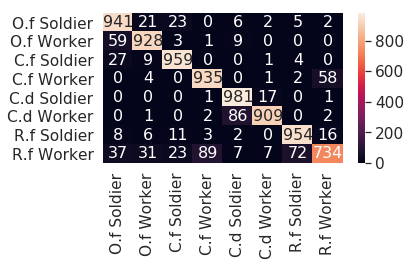

runtime :  17170.951924085617

[74] accuracy: 0.922 loss: 37.655

[0.815, 0.85625, 0.88175, 0.886375, 0.89325, 0.899125, 0.902, 0.905, 0.90625, 0.907875, 0.90575, 0.910125, 0.909375, 0.911, 0.90925, 0.907875, 0.911125, 0.910125, 0.909875, 0.914375, 0.91475, 0.9135, 0.90975, 0.914125, 0.914375, 0.911875, 0.9165, 0.914875, 0.916125, 0.912875, 0.917875, 0.917875, 0.913875, 0.9195, 0.918375, 0.9205, 0.917875, 0.918625, 0.921375, 0.916125, 0.91625, 0.921, 0.916875, 0.92175, 0.92, 0.91725, 0.9175, 0.920125, 0.92, 0.920375, 0.922125, 0.922, 0.919125, 0.923625, 0.921125, 0.919125, 0.9205, 0.92075, 0.918375, 0.919125, 0.91775, 0.921375, 0.922625, 0.919375, 0.917375, 0.91975, 0.923875, 0.92325, 0.92025, 0.920875, 0.919375, 0.92225, 0.917625, 0.921875]
[64.11414223909378, 49.904711842536926, 44.67099912464619, 41.61231115460396, 41.263010531663895, 39.30233183503151, 38.275576405227184, 37.62644839286804, 37.14999883621931, 37.15717602521181, 38.36975885927677, 38.00613395869732, 37.1089601591229

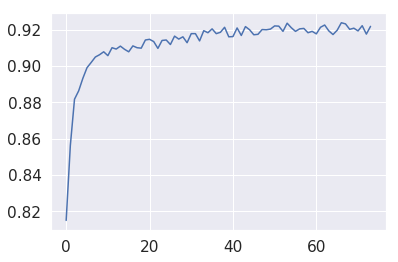

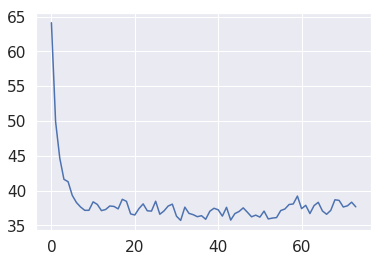

[3, 7, 4, 0, 1, 7, 7, 1, 3, 0, 7, 7, 1, 7, 6, 1, 1, 2, 4, 1, 1, 0, 1, 0, 2, 7, 4, 4, 7, 7, 7, 3, 2, 1, 4, 0, 0, 2, 1, 7, 6, 3, 6, 4, 3, 4, 0, 0, 2, 0, 4, 0, 1, 0, 4, 5, 7, 3, 6, 4, 4, 7, 0, 4, 4, 0, 3, 7, 1, 7, 0, 4, 3, 6, 0, 0, 7, 6, 0, 1, 0, 4, 7, 4, 7, 4, 7, 6, 7, 4, 0, 4, 4, 6, 2, 4, 3, 6, 7, 7, 6, 0, 2, 0, 4, 7, 0, 1, 4, 4, 6, 5, 0, 5, 1, 4, 3, 4, 3, 7, 4, 2, 7, 2, 3, 3, 7, 3, 6, 2, 0, 7, 4, 2, 0, 0, 0, 3, 2, 7, 6, 4, 2, 7, 4, 6, 2, 7, 0, 0, 7, 5, 4, 2, 3, 0, 4, 3, 0, 6, 4, 6, 0, 1, 6, 4, 6, 1, 4, 0, 1, 6, 1, 0, 0, 4, 0, 1, 7, 7, 6, 6, 1, 7, 1, 6, 3, 6, 0, 7, 2, 0, 7, 4, 6, 5, 0, 0, 7, 7, 6, 4, 0, 4, 0, 2, 0, 0, 1, 2, 7, 5, 0, 3, 3, 6, 4, 1, 4, 2, 1, 3, 4, 7, 6, 0, 1, 3, 0, 6, 6, 3, 1, 7, 0, 5, 2, 3, 4, 3, 2, 1, 5, 0, 2, 2, 7, 3, 4, 6, 0, 4, 7, 3, 3, 0, 2, 4, 4, 4, 0, 3, 7, 7, 1, 1, 1, 7, 4, 3, 2, 6, 4, 6, 3, 3, 1, 3, 3, 3, 7, 0, 1, 0, 7, 0, 1, 6, 0, 0, 3, 3, 6, 6, 0, 6, 6, 7, 1, 4, 3, 6, 0, 3, 2, 0, 6, 3, 2, 6, 4, 0, 7, 6, 7, 7, 1, 3, 0, 7, 0, 4, 5, 7, 3, 1, 2, 2, 4, 4, 1, 1, 0, 

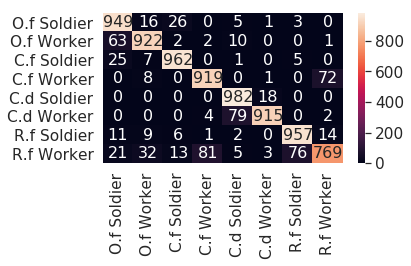

runtime :  17407.15408563614

[75] accuracy: 0.922 loss: 38.179

[0.815, 0.85625, 0.88175, 0.886375, 0.89325, 0.899125, 0.902, 0.905, 0.90625, 0.907875, 0.90575, 0.910125, 0.909375, 0.911, 0.90925, 0.907875, 0.911125, 0.910125, 0.909875, 0.914375, 0.91475, 0.9135, 0.90975, 0.914125, 0.914375, 0.911875, 0.9165, 0.914875, 0.916125, 0.912875, 0.917875, 0.917875, 0.913875, 0.9195, 0.918375, 0.9205, 0.917875, 0.918625, 0.921375, 0.916125, 0.91625, 0.921, 0.916875, 0.92175, 0.92, 0.91725, 0.9175, 0.920125, 0.92, 0.920375, 0.922125, 0.922, 0.919125, 0.923625, 0.921125, 0.919125, 0.9205, 0.92075, 0.918375, 0.919125, 0.91775, 0.921375, 0.922625, 0.919375, 0.917375, 0.91975, 0.923875, 0.92325, 0.92025, 0.920875, 0.919375, 0.92225, 0.917625, 0.921875, 0.921875]
[64.11414223909378, 49.904711842536926, 44.67099912464619, 41.61231115460396, 41.263010531663895, 39.30233183503151, 38.275576405227184, 37.62644839286804, 37.14999883621931, 37.15717602521181, 38.36975885927677, 38.00613395869732, 37.1089

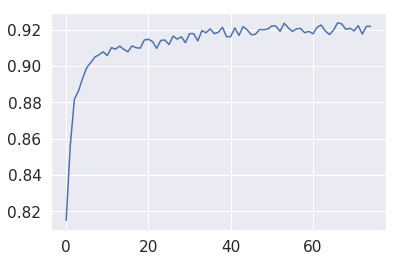

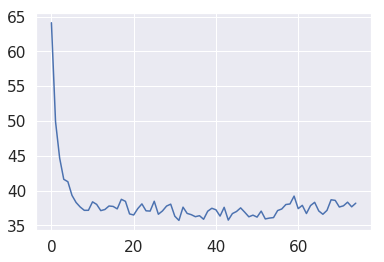

[4, 0, 7, 0, 2, 6, 6, 4, 0, 4, 3, 5, 1, 0, 4, 0, 4, 4, 7, 0, 6, 3, 1, 3, 6, 2, 3, 3, 1, 0, 3, 2, 2, 7, 4, 3, 6, 1, 0, 1, 3, 2, 2, 0, 3, 0, 7, 4, 0, 6, 7, 7, 7, 0, 0, 2, 6, 3, 1, 7, 4, 4, 7, 0, 3, 6, 3, 0, 4, 7, 7, 4, 3, 3, 6, 0, 3, 3, 7, 7, 7, 7, 4, 7, 6, 7, 6, 1, 0, 4, 2, 1, 7, 7, 0, 6, 2, 4, 7, 0, 5, 0, 0, 2, 0, 6, 6, 2, 1, 6, 4, 0, 0, 1, 3, 1, 4, 3, 6, 1, 6, 0, 6, 6, 7, 3, 7, 7, 3, 5, 4, 4, 1, 3, 7, 6, 2, 6, 0, 0, 3, 4, 1, 7, 1, 1, 4, 0, 4, 5, 0, 0, 6, 7, 6, 4, 4, 6, 3, 3, 7, 1, 6, 5, 3, 1, 3, 7, 2, 7, 7, 0, 7, 6, 6, 6, 3, 2, 3, 4, 3, 3, 2, 1, 3, 0, 6, 3, 3, 0, 1, 4, 1, 0, 6, 7, 3, 0, 1, 1, 3, 3, 2, 3, 0, 3, 3, 4, 6, 7, 3, 3, 7, 7, 6, 0, 6, 3, 6, 4, 3, 1, 0, 3, 7, 4, 3, 0, 6, 1, 4, 4, 6, 4, 1, 3, 5, 3, 2, 4, 6, 4, 3, 4, 6, 7, 5, 7, 3, 4, 0, 1, 6, 0, 0, 2, 0, 0, 3, 0, 4, 7, 7, 6, 3, 0, 0, 7, 6, 7, 5, 6, 7, 0, 3, 7, 1, 7, 3, 0, 0, 0, 1, 3, 3, 2, 2, 3, 4, 2, 3, 3, 6, 1, 7, 7, 4, 7, 1, 6, 7, 6, 4, 6, 7, 7, 6, 0, 1, 3, 7, 1, 4, 7, 7, 5, 0, 0, 1, 6, 1, 5, 0, 7, 4, 5, 1, 0, 4, 7, 2, 3, 3, 

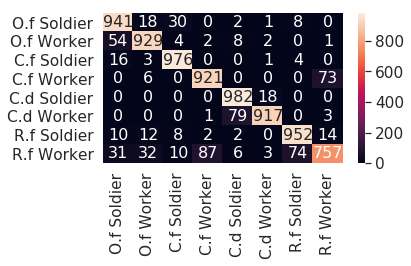

runtime :  17643.3246281147

[76] accuracy: 0.922 loss: 37.416

[0.815, 0.85625, 0.88175, 0.886375, 0.89325, 0.899125, 0.902, 0.905, 0.90625, 0.907875, 0.90575, 0.910125, 0.909375, 0.911, 0.90925, 0.907875, 0.911125, 0.910125, 0.909875, 0.914375, 0.91475, 0.9135, 0.90975, 0.914125, 0.914375, 0.911875, 0.9165, 0.914875, 0.916125, 0.912875, 0.917875, 0.917875, 0.913875, 0.9195, 0.918375, 0.9205, 0.917875, 0.918625, 0.921375, 0.916125, 0.91625, 0.921, 0.916875, 0.92175, 0.92, 0.91725, 0.9175, 0.920125, 0.92, 0.920375, 0.922125, 0.922, 0.919125, 0.923625, 0.921125, 0.919125, 0.9205, 0.92075, 0.918375, 0.919125, 0.91775, 0.921375, 0.922625, 0.919375, 0.917375, 0.91975, 0.923875, 0.92325, 0.92025, 0.920875, 0.919375, 0.92225, 0.917625, 0.921875, 0.921875, 0.922]
[64.11414223909378, 49.904711842536926, 44.67099912464619, 41.61231115460396, 41.263010531663895, 39.30233183503151, 38.275576405227184, 37.62644839286804, 37.14999883621931, 37.15717602521181, 38.36975885927677, 38.00613395869732, 3

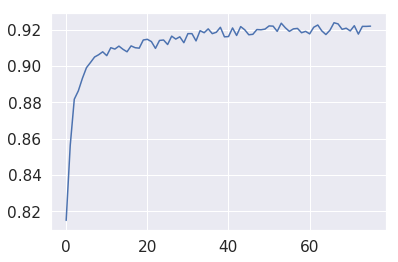

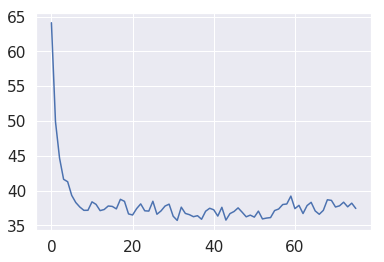

[3, 3, 4, 1, 0, 7, 3, 0, 0, 4, 5, 4, 3, 4, 0, 3, 4, 0, 7, 6, 1, 5, 7, 7, 6, 1, 0, 4, 3, 3, 1, 4, 4, 3, 2, 3, 4, 3, 0, 3, 6, 1, 7, 4, 4, 0, 1, 4, 3, 2, 0, 2, 0, 2, 0, 6, 1, 6, 6, 1, 3, 5, 7, 0, 3, 4, 6, 4, 1, 1, 4, 7, 3, 0, 7, 3, 3, 4, 5, 0, 5, 7, 2, 0, 6, 5, 7, 6, 1, 4, 6, 1, 0, 7, 6, 7, 7, 0, 3, 1, 6, 2, 3, 3, 3, 4, 2, 7, 4, 4, 0, 0, 7, 0, 4, 1, 4, 6, 1, 6, 2, 3, 3, 6, 1, 2, 4, 0, 7, 7, 7, 4, 3, 0, 4, 0, 4, 6, 3, 4, 3, 2, 7, 2, 0, 6, 4, 4, 1, 0, 0, 0, 7, 1, 3, 5, 6, 7, 7, 0, 7, 7, 7, 7, 6, 4, 1, 7, 6, 0, 7, 1, 3, 1, 6, 3, 3, 2, 5, 0, 0, 3, 1, 6, 6, 4, 6, 2, 7, 7, 2, 0, 7, 3, 3, 0, 1, 4, 5, 0, 0, 5, 7, 0, 0, 4, 6, 2, 1, 0, 0, 6, 7, 4, 4, 6, 3, 2, 2, 0, 6, 0, 2, 7, 3, 1, 6, 0, 0, 0, 4, 2, 1, 5, 6, 6, 7, 3, 4, 4, 2, 0, 6, 0, 1, 6, 7, 4, 6, 7, 7, 6, 3, 7, 0, 2, 0, 0, 4, 4, 6, 6, 1, 7, 4, 7, 2, 7, 7, 2, 7, 4, 4, 1, 7, 0, 2, 0, 0, 6, 0, 1, 0, 3, 7, 0, 6, 3, 2, 3, 3, 2, 2, 4, 1, 0, 6, 5, 7, 1, 1, 5, 3, 6, 4, 0, 0, 0, 7, 2, 7, 5, 6, 5, 0, 5, 0, 1, 0, 6, 1, 6, 2, 1, 4, 0, 0, 3, 6, 0, 5, 3, 3, 

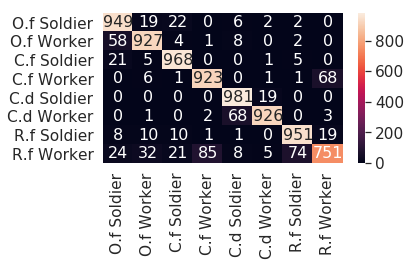

runtime :  17878.5434217453

[77] accuracy: 0.924 loss: 37.249

[0.815, 0.85625, 0.88175, 0.886375, 0.89325, 0.899125, 0.902, 0.905, 0.90625, 0.907875, 0.90575, 0.910125, 0.909375, 0.911, 0.90925, 0.907875, 0.911125, 0.910125, 0.909875, 0.914375, 0.91475, 0.9135, 0.90975, 0.914125, 0.914375, 0.911875, 0.9165, 0.914875, 0.916125, 0.912875, 0.917875, 0.917875, 0.913875, 0.9195, 0.918375, 0.9205, 0.917875, 0.918625, 0.921375, 0.916125, 0.91625, 0.921, 0.916875, 0.92175, 0.92, 0.91725, 0.9175, 0.920125, 0.92, 0.920375, 0.922125, 0.922, 0.919125, 0.923625, 0.921125, 0.919125, 0.9205, 0.92075, 0.918375, 0.919125, 0.91775, 0.921375, 0.922625, 0.919375, 0.917375, 0.91975, 0.923875, 0.92325, 0.92025, 0.920875, 0.919375, 0.92225, 0.917625, 0.921875, 0.921875, 0.922, 0.924125]
[64.11414223909378, 49.904711842536926, 44.67099912464619, 41.61231115460396, 41.263010531663895, 39.30233183503151, 38.275576405227184, 37.62644839286804, 37.14999883621931, 37.15717602521181, 38.36975885927677, 38.0061339

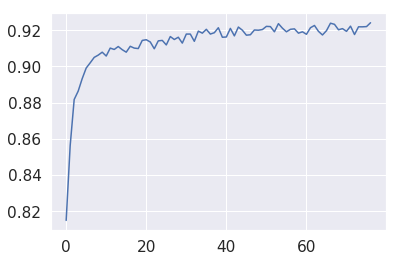

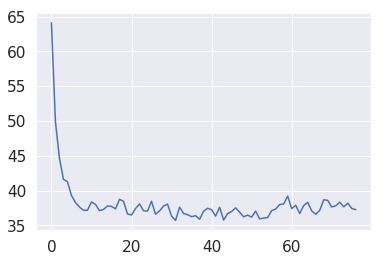

[0, 3, 0, 0, 6, 4, 6, 2, 7, 0, 7, 3, 1, 3, 3, 7, 7, 2, 3, 7, 4, 6, 6, 1, 6, 0, 4, 3, 7, 6, 0, 0, 2, 5, 5, 0, 6, 1, 7, 0, 7, 0, 3, 4, 3, 0, 4, 1, 4, 0, 4, 7, 4, 0, 4, 2, 2, 7, 6, 4, 3, 3, 7, 2, 3, 0, 6, 0, 7, 3, 1, 2, 5, 7, 4, 7, 3, 5, 0, 7, 7, 3, 6, 0, 3, 1, 0, 1, 0, 3, 2, 7, 1, 1, 6, 0, 0, 1, 0, 0, 2, 1, 6, 0, 3, 3, 6, 4, 3, 4, 5, 7, 4, 1, 2, 6, 1, 0, 7, 3, 7, 3, 1, 4, 2, 1, 4, 3, 0, 4, 4, 6, 1, 0, 1, 6, 0, 6, 0, 3, 3, 0, 4, 5, 3, 6, 7, 3, 7, 7, 7, 2, 4, 7, 1, 0, 0, 6, 4, 1, 0, 0, 4, 1, 3, 0, 5, 7, 4, 2, 0, 2, 3, 0, 7, 6, 6, 5, 6, 4, 4, 7, 4, 2, 7, 4, 2, 4, 7, 2, 7, 4, 6, 2, 1, 1, 0, 5, 0, 7, 7, 3, 3, 5, 0, 0, 0, 2, 5, 0, 0, 1, 3, 7, 4, 1, 4, 0, 6, 3, 6, 6, 0, 1, 5, 1, 5, 0, 4, 2, 1, 3, 7, 0, 7, 6, 3, 1, 6, 0, 4, 5, 1, 7, 1, 7, 4, 4, 5, 0, 1, 1, 7, 4, 0, 1, 0, 4, 4, 7, 1, 2, 2, 4, 2, 6, 1, 3, 6, 2, 1, 6, 4, 6, 7, 1, 6, 4, 0, 6, 2, 0, 6, 4, 7, 7, 0, 1, 4, 4, 3, 0, 0, 1, 3, 3, 6, 4, 4, 3, 7, 6, 1, 0, 4, 4, 0, 0, 0, 4, 0, 6, 0, 7, 4, 0, 0, 5, 7, 3, 4, 0, 3, 7, 7, 6, 4, 7, 0, 0, 3, 0, 4, 

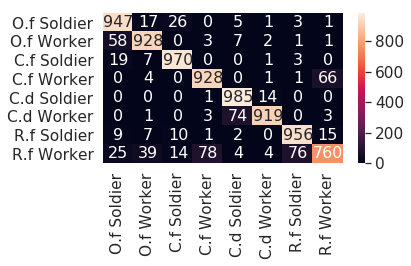

runtime :  18118.973883867264

[78] accuracy: 0.921 loss: 36.768

[0.815, 0.85625, 0.88175, 0.886375, 0.89325, 0.899125, 0.902, 0.905, 0.90625, 0.907875, 0.90575, 0.910125, 0.909375, 0.911, 0.90925, 0.907875, 0.911125, 0.910125, 0.909875, 0.914375, 0.91475, 0.9135, 0.90975, 0.914125, 0.914375, 0.911875, 0.9165, 0.914875, 0.916125, 0.912875, 0.917875, 0.917875, 0.913875, 0.9195, 0.918375, 0.9205, 0.917875, 0.918625, 0.921375, 0.916125, 0.91625, 0.921, 0.916875, 0.92175, 0.92, 0.91725, 0.9175, 0.920125, 0.92, 0.920375, 0.922125, 0.922, 0.919125, 0.923625, 0.921125, 0.919125, 0.9205, 0.92075, 0.918375, 0.919125, 0.91775, 0.921375, 0.922625, 0.919375, 0.917375, 0.91975, 0.923875, 0.92325, 0.92025, 0.920875, 0.919375, 0.92225, 0.917625, 0.921875, 0.921875, 0.922, 0.924125, 0.921]
[64.11414223909378, 49.904711842536926, 44.67099912464619, 41.61231115460396, 41.263010531663895, 39.30233183503151, 38.275576405227184, 37.62644839286804, 37.14999883621931, 37.15717602521181, 38.36975885927677, 3

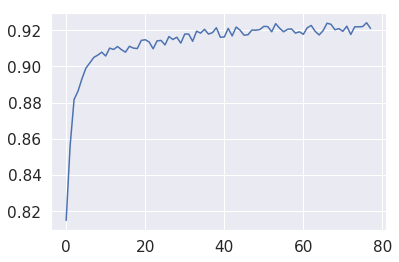

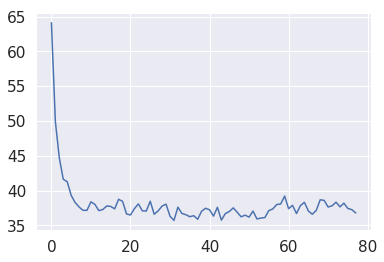

[6, 3, 1, 3, 5, 4, 0, 4, 3, 1, 1, 5, 7, 4, 1, 3, 2, 1, 7, 0, 0, 4, 4, 7, 3, 6, 1, 3, 1, 0, 4, 1, 4, 2, 5, 2, 3, 1, 2, 0, 7, 3, 6, 6, 3, 1, 6, 7, 7, 3, 4, 6, 4, 1, 1, 4, 0, 7, 4, 7, 6, 4, 7, 0, 4, 7, 0, 1, 0, 7, 4, 4, 1, 7, 4, 6, 5, 0, 3, 6, 1, 1, 0, 5, 4, 4, 6, 6, 6, 4, 0, 7, 3, 3, 6, 0, 6, 3, 4, 0, 0, 0, 2, 2, 4, 6, 0, 7, 0, 1, 4, 7, 6, 7, 3, 0, 6, 3, 4, 2, 0, 4, 4, 2, 6, 3, 0, 0, 7, 3, 0, 1, 7, 3, 2, 1, 3, 3, 0, 0, 6, 0, 1, 4, 7, 1, 6, 1, 7, 0, 6, 6, 3, 0, 4, 0, 7, 4, 0, 0, 7, 7, 7, 7, 1, 3, 0, 1, 0, 7, 4, 7, 1, 0, 0, 3, 0, 3, 0, 0, 0, 5, 3, 3, 0, 0, 0, 2, 3, 7, 7, 6, 6, 1, 0, 7, 0, 3, 1, 4, 4, 0, 0, 7, 7, 3, 4, 4, 2, 0, 1, 6, 2, 4, 0, 1, 7, 5, 3, 4, 3, 4, 1, 7, 2, 1, 4, 7, 0, 4, 6, 4, 1, 7, 4, 6, 2, 4, 3, 2, 3, 6, 2, 3, 6, 3, 0, 5, 2, 0, 7, 6, 3, 7, 2, 4, 4, 7, 7, 0, 7, 4, 6, 7, 4, 3, 1, 3, 1, 2, 0, 7, 1, 4, 0, 4, 7, 4, 4, 2, 3, 6, 6, 6, 1, 2, 4, 1, 3, 4, 7, 6, 2, 5, 2, 0, 4, 3, 6, 6, 6, 1, 6, 2, 0, 7, 6, 0, 0, 3, 3, 2, 3, 1, 3, 4, 2, 1, 3, 4, 4, 1, 7, 2, 3, 0, 6, 7, 4, 3, 3, 2, 2, 

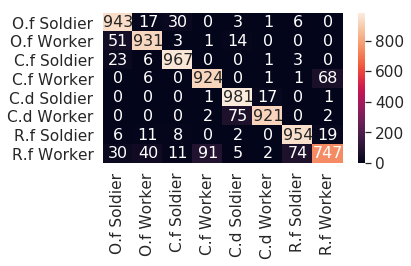

runtime :  18354.755770921707

[79] accuracy: 0.922 loss: 36.420

[0.815, 0.85625, 0.88175, 0.886375, 0.89325, 0.899125, 0.902, 0.905, 0.90625, 0.907875, 0.90575, 0.910125, 0.909375, 0.911, 0.90925, 0.907875, 0.911125, 0.910125, 0.909875, 0.914375, 0.91475, 0.9135, 0.90975, 0.914125, 0.914375, 0.911875, 0.9165, 0.914875, 0.916125, 0.912875, 0.917875, 0.917875, 0.913875, 0.9195, 0.918375, 0.9205, 0.917875, 0.918625, 0.921375, 0.916125, 0.91625, 0.921, 0.916875, 0.92175, 0.92, 0.91725, 0.9175, 0.920125, 0.92, 0.920375, 0.922125, 0.922, 0.919125, 0.923625, 0.921125, 0.919125, 0.9205, 0.92075, 0.918375, 0.919125, 0.91775, 0.921375, 0.922625, 0.919375, 0.917375, 0.91975, 0.923875, 0.92325, 0.92025, 0.920875, 0.919375, 0.92225, 0.917625, 0.921875, 0.921875, 0.922, 0.924125, 0.921, 0.921625]
[64.11414223909378, 49.904711842536926, 44.67099912464619, 41.61231115460396, 41.263010531663895, 39.30233183503151, 38.275576405227184, 37.62644839286804, 37.14999883621931, 37.15717602521181, 38.3697588

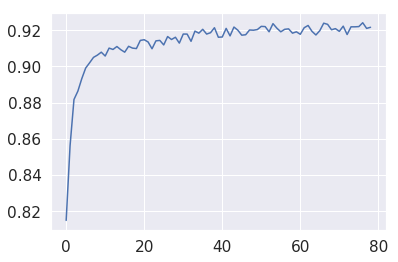

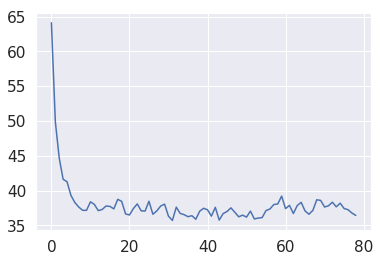

[7, 4, 5, 2, 0, 4, 0, 6, 4, 6, 7, 1, 6, 2, 0, 3, 1, 2, 4, 1, 0, 6, 1, 5, 6, 4, 7, 0, 4, 7, 0, 2, 6, 3, 3, 6, 3, 7, 6, 4, 2, 4, 1, 6, 6, 1, 7, 2, 3, 0, 6, 6, 4, 0, 0, 0, 4, 1, 2, 2, 7, 4, 2, 2, 5, 6, 7, 2, 7, 4, 0, 1, 7, 1, 0, 3, 1, 3, 6, 4, 3, 2, 0, 0, 4, 6, 4, 5, 0, 4, 3, 7, 7, 2, 6, 4, 4, 6, 6, 0, 7, 4, 0, 3, 1, 0, 0, 1, 3, 3, 7, 3, 3, 0, 3, 2, 1, 0, 4, 7, 2, 1, 0, 1, 0, 6, 6, 6, 0, 1, 4, 7, 1, 7, 2, 1, 1, 0, 6, 2, 1, 6, 4, 0, 0, 2, 7, 4, 0, 3, 1, 0, 0, 0, 0, 1, 6, 1, 6, 7, 2, 6, 5, 7, 1, 3, 2, 7, 1, 6, 2, 6, 2, 0, 0, 0, 4, 1, 1, 6, 4, 0, 0, 3, 1, 0, 3, 7, 6, 3, 0, 7, 6, 2, 2, 4, 1, 6, 6, 5, 3, 7, 7, 2, 5, 0, 2, 0, 4, 4, 0, 0, 0, 4, 6, 1, 0, 3, 6, 3, 6, 3, 2, 7, 5, 6, 3, 7, 6, 7, 6, 6, 6, 4, 0, 1, 0, 4, 1, 0, 4, 1, 1, 4, 2, 3, 7, 3, 4, 1, 5, 6, 0, 3, 1, 3, 1, 7, 3, 4, 0, 0, 7, 7, 4, 6, 2, 4, 7, 6, 7, 4, 1, 1, 6, 0, 5, 6, 4, 4, 1, 2, 2, 0, 3, 2, 0, 4, 1, 1, 3, 1, 4, 6, 0, 0, 2, 3, 7, 7, 7, 0, 5, 5, 6, 6, 0, 0, 0, 3, 5, 2, 3, 4, 7, 4, 2, 3, 0, 4, 5, 1, 3, 7, 4, 7, 5, 2, 3, 0, 0, 7, 4, 

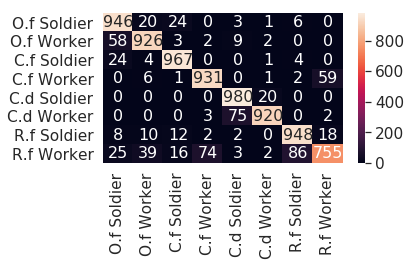

runtime :  18591.93722987175

[80] accuracy: 0.922 loss: 38.088

[0.815, 0.85625, 0.88175, 0.886375, 0.89325, 0.899125, 0.902, 0.905, 0.90625, 0.907875, 0.90575, 0.910125, 0.909375, 0.911, 0.90925, 0.907875, 0.911125, 0.910125, 0.909875, 0.914375, 0.91475, 0.9135, 0.90975, 0.914125, 0.914375, 0.911875, 0.9165, 0.914875, 0.916125, 0.912875, 0.917875, 0.917875, 0.913875, 0.9195, 0.918375, 0.9205, 0.917875, 0.918625, 0.921375, 0.916125, 0.91625, 0.921, 0.916875, 0.92175, 0.92, 0.91725, 0.9175, 0.920125, 0.92, 0.920375, 0.922125, 0.922, 0.919125, 0.923625, 0.921125, 0.919125, 0.9205, 0.92075, 0.918375, 0.919125, 0.91775, 0.921375, 0.922625, 0.919375, 0.917375, 0.91975, 0.923875, 0.92325, 0.92025, 0.920875, 0.919375, 0.92225, 0.917625, 0.921875, 0.921875, 0.922, 0.924125, 0.921, 0.921625, 0.92225]
[64.11414223909378, 49.904711842536926, 44.67099912464619, 41.61231115460396, 41.263010531663895, 39.30233183503151, 38.275576405227184, 37.62644839286804, 37.14999883621931, 37.15717602521181, 38

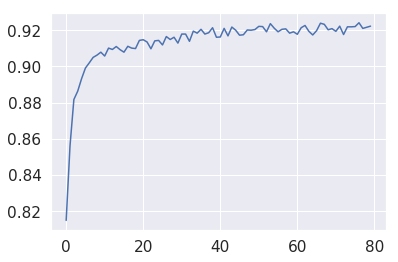

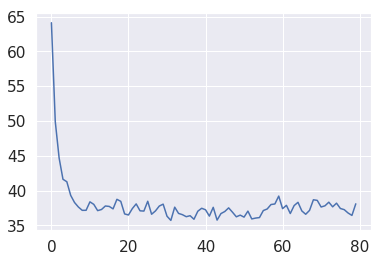

[7, 3, 1, 3, 0, 1, 3, 0, 3, 7, 0, 0, 1, 4, 7, 3, 3, 1, 4, 0, 6, 3, 7, 2, 0, 7, 2, 3, 4, 1, 7, 0, 3, 6, 4, 4, 1, 7, 6, 3, 7, 1, 6, 7, 4, 7, 0, 7, 7, 2, 1, 5, 6, 6, 2, 4, 0, 2, 4, 4, 7, 5, 2, 7, 0, 3, 7, 4, 6, 7, 4, 7, 7, 1, 4, 7, 4, 4, 1, 4, 3, 4, 3, 4, 3, 0, 3, 4, 1, 7, 7, 4, 3, 0, 6, 6, 6, 4, 0, 3, 3, 1, 3, 4, 2, 5, 3, 1, 1, 6, 3, 4, 3, 4, 3, 7, 4, 4, 4, 1, 0, 0, 6, 7, 0, 6, 2, 4, 3, 0, 2, 5, 3, 0, 6, 0, 3, 7, 2, 1, 2, 2, 7, 6, 7, 2, 7, 2, 0, 7, 0, 3, 0, 1, 7, 4, 7, 0, 1, 6, 4, 3, 7, 4, 1, 4, 6, 4, 3, 5, 0, 6, 4, 2, 5, 4, 3, 3, 4, 4, 4, 1, 0, 0, 3, 1, 7, 6, 3, 5, 5, 1, 7, 3, 0, 5, 1, 1, 6, 7, 7, 0, 7, 7, 6, 1, 4, 7, 0, 1, 7, 3, 0, 1, 0, 7, 7, 6, 3, 0, 0, 1, 5, 7, 2, 4, 4, 0, 4, 0, 0, 3, 6, 2, 3, 1, 6, 0, 7, 6, 0, 0, 6, 7, 4, 0, 6, 5, 6, 1, 1, 6, 4, 2, 3, 4, 0, 5, 0, 4, 2, 7, 6, 0, 0, 0, 0, 0, 2, 7, 0, 2, 2, 2, 3, 4, 2, 3, 6, 4, 4, 4, 3, 3, 5, 0, 5, 6, 6, 2, 4, 3, 0, 0, 3, 1, 7, 3, 0, 1, 0, 7, 0, 6, 6, 0, 0, 7, 0, 7, 1, 0, 3, 3, 0, 1, 0, 3, 3, 7, 1, 0, 4, 4, 4, 6, 1, 7, 0, 7, 3, 6, 7, 

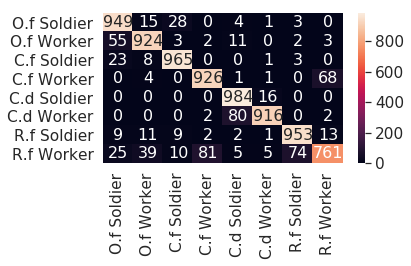

runtime :  18825.98151922226

[81] accuracy: 0.922 loss: 37.430

[0.815, 0.85625, 0.88175, 0.886375, 0.89325, 0.899125, 0.902, 0.905, 0.90625, 0.907875, 0.90575, 0.910125, 0.909375, 0.911, 0.90925, 0.907875, 0.911125, 0.910125, 0.909875, 0.914375, 0.91475, 0.9135, 0.90975, 0.914125, 0.914375, 0.911875, 0.9165, 0.914875, 0.916125, 0.912875, 0.917875, 0.917875, 0.913875, 0.9195, 0.918375, 0.9205, 0.917875, 0.918625, 0.921375, 0.916125, 0.91625, 0.921, 0.916875, 0.92175, 0.92, 0.91725, 0.9175, 0.920125, 0.92, 0.920375, 0.922125, 0.922, 0.919125, 0.923625, 0.921125, 0.919125, 0.9205, 0.92075, 0.918375, 0.919125, 0.91775, 0.921375, 0.922625, 0.919375, 0.917375, 0.91975, 0.923875, 0.92325, 0.92025, 0.920875, 0.919375, 0.92225, 0.917625, 0.921875, 0.921875, 0.922, 0.924125, 0.921, 0.921625, 0.92225, 0.9225]
[64.11414223909378, 49.904711842536926, 44.67099912464619, 41.61231115460396, 41.263010531663895, 39.30233183503151, 38.275576405227184, 37.62644839286804, 37.14999883621931, 37.1571760252

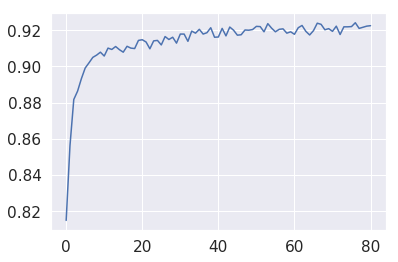

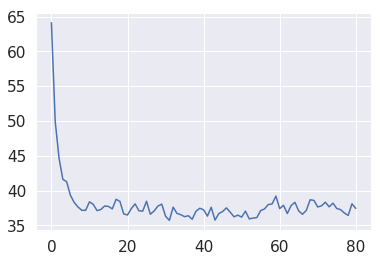

[1, 0, 7, 3, 3, 2, 6, 4, 0, 4, 3, 1, 0, 1, 5, 1, 3, 1, 7, 4, 3, 0, 4, 5, 7, 1, 0, 1, 3, 0, 6, 5, 0, 7, 3, 5, 5, 6, 4, 0, 0, 6, 2, 0, 2, 7, 4, 1, 4, 7, 4, 1, 1, 6, 0, 0, 7, 1, 4, 7, 3, 7, 7, 3, 7, 6, 6, 3, 7, 6, 0, 2, 3, 3, 0, 3, 4, 4, 4, 6, 1, 6, 3, 6, 3, 6, 6, 3, 0, 7, 0, 6, 6, 6, 7, 4, 0, 0, 6, 6, 3, 7, 6, 7, 1, 0, 3, 4, 0, 4, 0, 3, 6, 1, 0, 7, 4, 7, 0, 7, 3, 3, 5, 3, 4, 3, 3, 4, 3, 7, 6, 0, 2, 2, 4, 4, 7, 4, 0, 7, 0, 7, 1, 1, 7, 3, 2, 0, 5, 7, 3, 4, 6, 7, 3, 6, 7, 0, 4, 3, 3, 7, 1, 5, 3, 3, 1, 1, 1, 7, 6, 2, 4, 6, 6, 7, 7, 2, 0, 7, 0, 4, 7, 3, 6, 7, 3, 0, 4, 0, 0, 6, 7, 6, 6, 1, 1, 0, 7, 4, 7, 0, 5, 3, 2, 0, 4, 6, 1, 3, 6, 1, 0, 0, 6, 4, 4, 6, 2, 3, 6, 0, 4, 1, 6, 1, 4, 6, 3, 0, 6, 3, 6, 3, 6, 2, 6, 0, 0, 3, 1, 2, 6, 4, 5, 1, 0, 0, 6, 0, 7, 1, 6, 5, 0, 4, 7, 7, 6, 6, 7, 6, 0, 0, 5, 3, 4, 3, 6, 4, 0, 4, 5, 3, 1, 7, 3, 5, 7, 1, 1, 3, 0, 4, 0, 3, 1, 0, 6, 6, 0, 6, 1, 7, 0, 7, 4, 4, 7, 0, 7, 2, 7, 0, 6, 0, 0, 0, 1, 4, 0, 0, 0, 7, 1, 5, 4, 6, 2, 1, 1, 2, 6, 6, 2, 4, 1, 6, 7, 3, 4, 4, 7, 

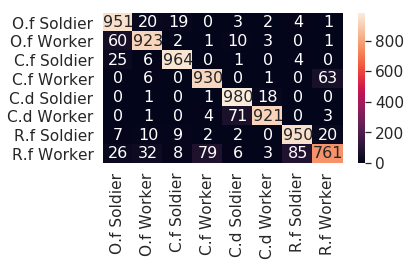

runtime :  19061.842004299164

[82] accuracy: 0.923 loss: 37.581

[0.815, 0.85625, 0.88175, 0.886375, 0.89325, 0.899125, 0.902, 0.905, 0.90625, 0.907875, 0.90575, 0.910125, 0.909375, 0.911, 0.90925, 0.907875, 0.911125, 0.910125, 0.909875, 0.914375, 0.91475, 0.9135, 0.90975, 0.914125, 0.914375, 0.911875, 0.9165, 0.914875, 0.916125, 0.912875, 0.917875, 0.917875, 0.913875, 0.9195, 0.918375, 0.9205, 0.917875, 0.918625, 0.921375, 0.916125, 0.91625, 0.921, 0.916875, 0.92175, 0.92, 0.91725, 0.9175, 0.920125, 0.92, 0.920375, 0.922125, 0.922, 0.919125, 0.923625, 0.921125, 0.919125, 0.9205, 0.92075, 0.918375, 0.919125, 0.91775, 0.921375, 0.922625, 0.919375, 0.917375, 0.91975, 0.923875, 0.92325, 0.92025, 0.920875, 0.919375, 0.92225, 0.917625, 0.921875, 0.921875, 0.922, 0.924125, 0.921, 0.921625, 0.92225, 0.9225, 0.92325]
[64.11414223909378, 49.904711842536926, 44.67099912464619, 41.61231115460396, 41.263010531663895, 39.30233183503151, 38.275576405227184, 37.62644839286804, 37.14999883621931, 37.

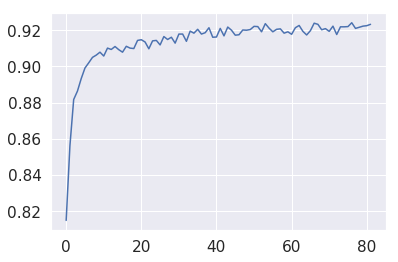

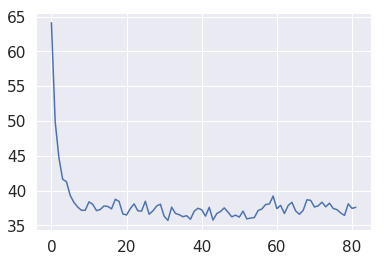

[4, 4, 4, 1, 7, 6, 1, 3, 0, 3, 4, 3, 4, 1, 6, 3, 1, 0, 1, 6, 3, 3, 7, 3, 3, 6, 6, 7, 0, 3, 1, 0, 3, 3, 6, 6, 0, 2, 1, 0, 7, 0, 6, 4, 5, 1, 4, 3, 0, 4, 1, 0, 4, 0, 0, 4, 0, 4, 1, 1, 1, 2, 7, 7, 4, 7, 0, 0, 7, 3, 4, 0, 5, 4, 4, 6, 4, 6, 0, 5, 1, 4, 3, 6, 4, 4, 0, 3, 6, 2, 7, 3, 1, 0, 2, 7, 3, 7, 7, 3, 4, 3, 0, 3, 7, 6, 6, 2, 0, 6, 7, 1, 4, 6, 3, 6, 7, 3, 3, 0, 4, 3, 3, 0, 2, 5, 4, 0, 4, 6, 1, 1, 1, 6, 1, 0, 2, 3, 0, 2, 3, 1, 5, 4, 3, 3, 5, 0, 3, 0, 3, 0, 0, 4, 4, 6, 1, 0, 7, 3, 1, 3, 0, 7, 1, 7, 4, 7, 6, 7, 6, 7, 1, 1, 2, 0, 5, 0, 0, 6, 2, 1, 4, 1, 3, 7, 6, 0, 7, 2, 3, 7, 0, 3, 4, 4, 1, 7, 6, 3, 7, 4, 6, 3, 6, 0, 2, 0, 6, 0, 2, 3, 0, 3, 0, 6, 2, 0, 5, 2, 5, 7, 3, 0, 0, 0, 6, 2, 7, 0, 6, 3, 4, 5, 1, 7, 3, 0, 5, 1, 6, 0, 0, 2, 3, 3, 4, 3, 4, 6, 2, 1, 7, 6, 6, 4, 7, 2, 1, 4, 7, 2, 1, 1, 7, 7, 0, 3, 5, 6, 7, 2, 3, 6, 0, 6, 4, 2, 7, 0, 3, 4, 2, 3, 2, 6, 4, 1, 3, 6, 0, 0, 6, 5, 4, 1, 0, 1, 3, 0, 3, 0, 4, 3, 6, 0, 3, 0, 7, 4, 7, 1, 7, 0, 6, 6, 0, 0, 7, 2, 0, 0, 0, 4, 3, 2, 7, 0, 0, 4, 0, 4, 3, 

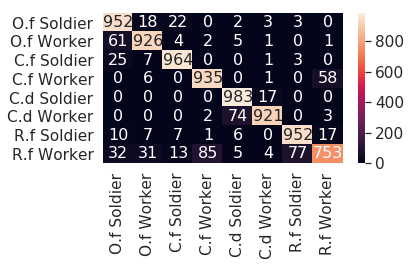

runtime :  19299.69029021263

[83] accuracy: 0.921 loss: 37.783

[0.815, 0.85625, 0.88175, 0.886375, 0.89325, 0.899125, 0.902, 0.905, 0.90625, 0.907875, 0.90575, 0.910125, 0.909375, 0.911, 0.90925, 0.907875, 0.911125, 0.910125, 0.909875, 0.914375, 0.91475, 0.9135, 0.90975, 0.914125, 0.914375, 0.911875, 0.9165, 0.914875, 0.916125, 0.912875, 0.917875, 0.917875, 0.913875, 0.9195, 0.918375, 0.9205, 0.917875, 0.918625, 0.921375, 0.916125, 0.91625, 0.921, 0.916875, 0.92175, 0.92, 0.91725, 0.9175, 0.920125, 0.92, 0.920375, 0.922125, 0.922, 0.919125, 0.923625, 0.921125, 0.919125, 0.9205, 0.92075, 0.918375, 0.919125, 0.91775, 0.921375, 0.922625, 0.919375, 0.917375, 0.91975, 0.923875, 0.92325, 0.92025, 0.920875, 0.919375, 0.92225, 0.917625, 0.921875, 0.921875, 0.922, 0.924125, 0.921, 0.921625, 0.92225, 0.9225, 0.92325, 0.92125]
[64.11414223909378, 49.904711842536926, 44.67099912464619, 41.61231115460396, 41.263010531663895, 39.30233183503151, 38.275576405227184, 37.62644839286804, 37.14999883621

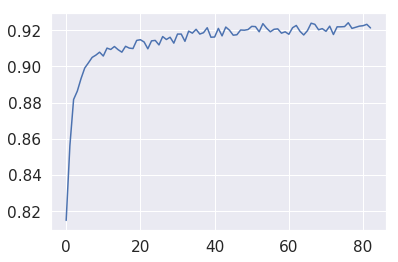

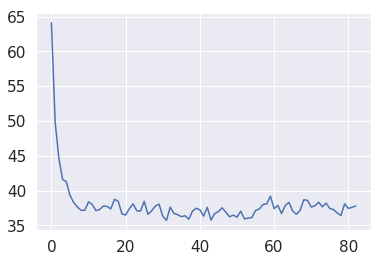

[3, 3, 0, 6, 0, 2, 6, 7, 2, 2, 4, 0, 3, 1, 0, 7, 7, 6, 6, 4, 1, 6, 1, 1, 7, 6, 1, 2, 7, 0, 1, 0, 4, 4, 6, 1, 3, 2, 3, 3, 0, 6, 3, 6, 3, 6, 4, 2, 6, 6, 7, 2, 0, 1, 4, 0, 6, 4, 7, 1, 3, 3, 1, 7, 6, 4, 0, 4, 5, 0, 7, 7, 1, 0, 4, 4, 0, 6, 2, 7, 0, 4, 1, 0, 6, 0, 0, 6, 7, 4, 3, 0, 0, 7, 1, 7, 4, 3, 5, 6, 6, 4, 3, 6, 4, 2, 7, 0, 0, 0, 2, 1, 3, 0, 6, 1, 3, 0, 0, 6, 7, 1, 6, 4, 1, 3, 4, 4, 1, 4, 6, 4, 0, 4, 0, 5, 2, 4, 1, 1, 4, 5, 6, 7, 4, 3, 4, 3, 6, 2, 3, 0, 3, 1, 6, 6, 1, 7, 4, 3, 0, 6, 2, 3, 0, 6, 4, 7, 0, 7, 4, 6, 1, 7, 1, 6, 7, 7, 7, 3, 4, 4, 3, 7, 7, 3, 0, 3, 0, 7, 4, 4, 7, 7, 4, 7, 1, 1, 5, 0, 1, 0, 2, 2, 0, 0, 1, 6, 6, 6, 0, 6, 6, 7, 4, 4, 4, 1, 3, 3, 0, 3, 0, 4, 6, 1, 0, 0, 4, 1, 3, 3, 6, 4, 0, 4, 6, 0, 2, 3, 6, 3, 1, 1, 1, 3, 1, 7, 3, 4, 1, 2, 4, 1, 0, 0, 4, 3, 6, 7, 6, 4, 6, 7, 7, 7, 3, 2, 3, 1, 0, 6, 7, 4, 4, 3, 4, 0, 6, 4, 3, 0, 5, 4, 0, 7, 0, 7, 0, 5, 0, 3, 3, 4, 2, 1, 2, 0, 2, 0, 4, 6, 0, 0, 1, 4, 0, 6, 7, 7, 2, 5, 3, 6, 0, 7, 1, 4, 6, 5, 4, 4, 1, 3, 2, 4, 6, 3, 3, 0, 7, 0, 3, 

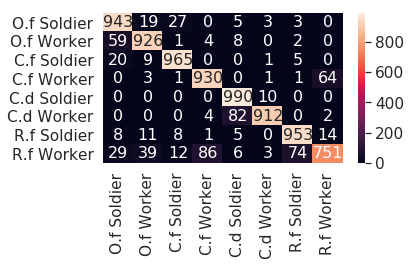

runtime :  19535.698721647263

[84] accuracy: 0.919 loss: 39.516

[0.815, 0.85625, 0.88175, 0.886375, 0.89325, 0.899125, 0.902, 0.905, 0.90625, 0.907875, 0.90575, 0.910125, 0.909375, 0.911, 0.90925, 0.907875, 0.911125, 0.910125, 0.909875, 0.914375, 0.91475, 0.9135, 0.90975, 0.914125, 0.914375, 0.911875, 0.9165, 0.914875, 0.916125, 0.912875, 0.917875, 0.917875, 0.913875, 0.9195, 0.918375, 0.9205, 0.917875, 0.918625, 0.921375, 0.916125, 0.91625, 0.921, 0.916875, 0.92175, 0.92, 0.91725, 0.9175, 0.920125, 0.92, 0.920375, 0.922125, 0.922, 0.919125, 0.923625, 0.921125, 0.919125, 0.9205, 0.92075, 0.918375, 0.919125, 0.91775, 0.921375, 0.922625, 0.919375, 0.917375, 0.91975, 0.923875, 0.92325, 0.92025, 0.920875, 0.919375, 0.92225, 0.917625, 0.921875, 0.921875, 0.922, 0.924125, 0.921, 0.921625, 0.92225, 0.9225, 0.92325, 0.92125, 0.9195]
[64.11414223909378, 49.904711842536926, 44.67099912464619, 41.61231115460396, 41.263010531663895, 39.30233183503151, 38.275576405227184, 37.62644839286804, 37.14

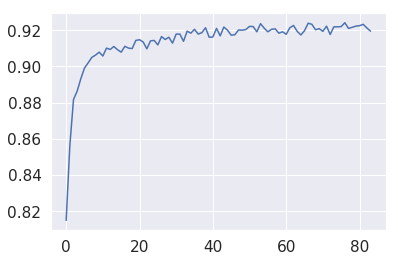

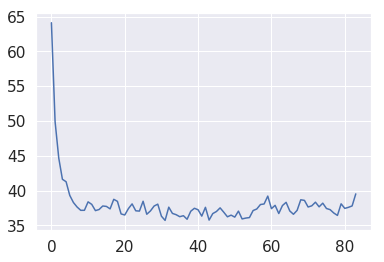

[4, 4, 0, 7, 3, 6, 0, 7, 6, 0, 1, 3, 6, 0, 7, 4, 4, 2, 3, 0, 7, 3, 6, 3, 4, 3, 7, 6, 0, 4, 7, 4, 4, 0, 6, 5, 4, 1, 1, 0, 6, 0, 1, 5, 3, 7, 6, 4, 2, 2, 6, 4, 0, 4, 6, 4, 2, 6, 3, 5, 7, 4, 7, 4, 6, 0, 7, 6, 4, 7, 1, 1, 7, 4, 5, 0, 6, 0, 7, 4, 0, 4, 1, 4, 2, 7, 2, 6, 6, 1, 4, 4, 2, 7, 4, 6, 4, 3, 0, 7, 2, 0, 0, 6, 3, 0, 3, 2, 3, 0, 1, 6, 1, 4, 0, 2, 0, 3, 3, 1, 0, 0, 0, 0, 7, 6, 0, 0, 7, 7, 6, 6, 2, 6, 0, 1, 7, 7, 1, 7, 7, 5, 6, 3, 4, 3, 1, 7, 3, 2, 7, 0, 5, 0, 0, 1, 7, 1, 6, 1, 7, 2, 1, 3, 7, 3, 0, 5, 6, 0, 0, 5, 5, 7, 0, 7, 7, 6, 6, 5, 3, 6, 0, 4, 0, 6, 7, 2, 6, 0, 2, 6, 5, 5, 1, 4, 2, 4, 1, 1, 2, 0, 0, 3, 5, 0, 7, 3, 1, 4, 7, 6, 7, 6, 4, 6, 6, 7, 0, 1, 3, 6, 4, 7, 0, 1, 7, 7, 7, 0, 4, 0, 7, 1, 4, 0, 1, 4, 4, 3, 0, 0, 4, 4, 4, 6, 0, 3, 6, 0, 7, 0, 7, 4, 4, 2, 0, 0, 0, 4, 0, 3, 4, 4, 6, 2, 4, 4, 7, 0, 0, 0, 7, 6, 4, 2, 7, 1, 3, 0, 2, 6, 6, 0, 0, 0, 0, 2, 6, 0, 6, 0, 6, 7, 0, 6, 1, 3, 4, 3, 0, 4, 3, 1, 2, 6, 4, 1, 7, 3, 1, 4, 6, 3, 1, 4, 3, 4, 2, 3, 3, 0, 0, 0, 0, 0, 0, 1, 3, 3, 3, 4, 0, 

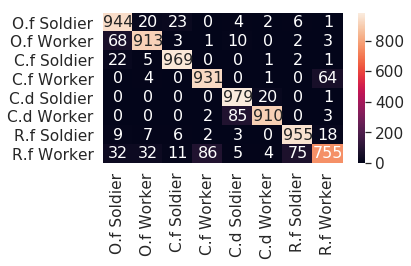

runtime :  19773.943374872208

[85] accuracy: 0.923 loss: 36.398

[0.815, 0.85625, 0.88175, 0.886375, 0.89325, 0.899125, 0.902, 0.905, 0.90625, 0.907875, 0.90575, 0.910125, 0.909375, 0.911, 0.90925, 0.907875, 0.911125, 0.910125, 0.909875, 0.914375, 0.91475, 0.9135, 0.90975, 0.914125, 0.914375, 0.911875, 0.9165, 0.914875, 0.916125, 0.912875, 0.917875, 0.917875, 0.913875, 0.9195, 0.918375, 0.9205, 0.917875, 0.918625, 0.921375, 0.916125, 0.91625, 0.921, 0.916875, 0.92175, 0.92, 0.91725, 0.9175, 0.920125, 0.92, 0.920375, 0.922125, 0.922, 0.919125, 0.923625, 0.921125, 0.919125, 0.9205, 0.92075, 0.918375, 0.919125, 0.91775, 0.921375, 0.922625, 0.919375, 0.917375, 0.91975, 0.923875, 0.92325, 0.92025, 0.920875, 0.919375, 0.92225, 0.917625, 0.921875, 0.921875, 0.922, 0.924125, 0.921, 0.921625, 0.92225, 0.9225, 0.92325, 0.92125, 0.9195, 0.92325]
[64.11414223909378, 49.904711842536926, 44.67099912464619, 41.61231115460396, 41.263010531663895, 39.30233183503151, 38.275576405227184, 37.626448392868

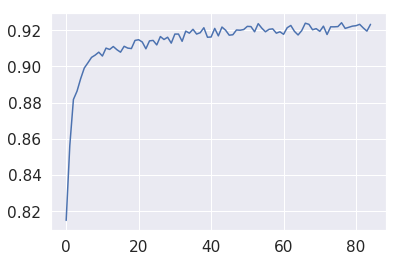

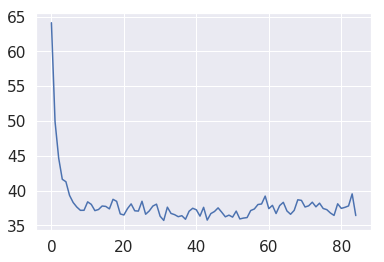

[2, 2, 7, 6, 6, 1, 4, 4, 7, 0, 1, 0, 2, 3, 6, 7, 6, 2, 3, 0, 4, 4, 6, 7, 7, 7, 3, 5, 7, 3, 0, 3, 6, 5, 4, 2, 4, 3, 0, 4, 7, 6, 4, 6, 3, 7, 4, 0, 6, 4, 1, 1, 4, 3, 0, 5, 4, 3, 7, 1, 1, 0, 0, 6, 6, 3, 5, 0, 1, 4, 2, 1, 7, 1, 6, 3, 1, 3, 7, 7, 4, 0, 6, 3, 0, 3, 2, 4, 1, 1, 6, 3, 4, 4, 2, 2, 4, 0, 3, 6, 4, 7, 1, 0, 7, 6, 6, 4, 1, 6, 0, 3, 3, 3, 0, 0, 6, 3, 0, 2, 2, 2, 5, 1, 0, 6, 5, 3, 7, 4, 0, 0, 6, 0, 7, 3, 1, 4, 6, 2, 4, 7, 2, 0, 2, 3, 7, 4, 0, 7, 0, 3, 1, 0, 2, 2, 4, 6, 3, 0, 7, 0, 3, 3, 6, 1, 3, 7, 0, 4, 3, 6, 6, 5, 2, 6, 4, 1, 7, 2, 7, 7, 4, 0, 7, 7, 0, 4, 4, 6, 6, 0, 7, 6, 4, 1, 4, 1, 6, 6, 3, 0, 3, 4, 1, 0, 7, 7, 3, 1, 5, 4, 5, 0, 2, 6, 7, 7, 3, 4, 3, 0, 2, 6, 6, 0, 3, 7, 3, 0, 7, 0, 0, 3, 0, 3, 0, 2, 3, 7, 4, 6, 1, 3, 2, 6, 6, 4, 0, 2, 6, 7, 6, 7, 1, 2, 7, 6, 4, 7, 3, 0, 1, 3, 5, 6, 2, 6, 7, 1, 5, 2, 0, 5, 1, 7, 0, 5, 0, 6, 2, 3, 3, 1, 4, 1, 3, 1, 0, 7, 3, 5, 3, 4, 6, 6, 1, 1, 1, 3, 1, 1, 6, 7, 4, 7, 2, 7, 0, 3, 7, 6, 4, 0, 3, 2, 1, 3, 1, 3, 4, 3, 3, 7, 6, 4, 5, 0, 5, 4, 6, 4, 3, 

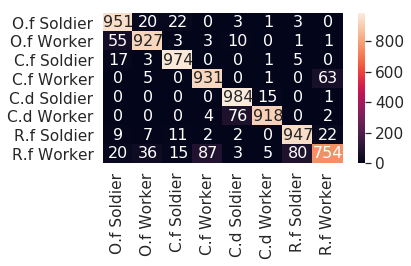

runtime :  20011.022609472275

[86] accuracy: 0.926 loss: 36.617

[0.815, 0.85625, 0.88175, 0.886375, 0.89325, 0.899125, 0.902, 0.905, 0.90625, 0.907875, 0.90575, 0.910125, 0.909375, 0.911, 0.90925, 0.907875, 0.911125, 0.910125, 0.909875, 0.914375, 0.91475, 0.9135, 0.90975, 0.914125, 0.914375, 0.911875, 0.9165, 0.914875, 0.916125, 0.912875, 0.917875, 0.917875, 0.913875, 0.9195, 0.918375, 0.9205, 0.917875, 0.918625, 0.921375, 0.916125, 0.91625, 0.921, 0.916875, 0.92175, 0.92, 0.91725, 0.9175, 0.920125, 0.92, 0.920375, 0.922125, 0.922, 0.919125, 0.923625, 0.921125, 0.919125, 0.9205, 0.92075, 0.918375, 0.919125, 0.91775, 0.921375, 0.922625, 0.919375, 0.917375, 0.91975, 0.923875, 0.92325, 0.92025, 0.920875, 0.919375, 0.92225, 0.917625, 0.921875, 0.921875, 0.922, 0.924125, 0.921, 0.921625, 0.92225, 0.9225, 0.92325, 0.92125, 0.9195, 0.92325, 0.926375]
[64.11414223909378, 49.904711842536926, 44.67099912464619, 41.61231115460396, 41.263010531663895, 39.30233183503151, 38.275576405227184, 37.62

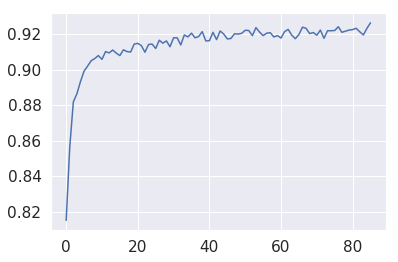

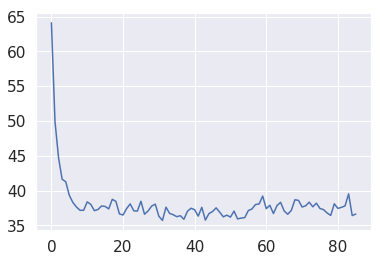

[7, 7, 7, 4, 4, 6, 1, 2, 3, 4, 5, 4, 4, 2, 3, 2, 7, 4, 1, 4, 4, 7, 0, 6, 7, 0, 6, 4, 0, 4, 1, 4, 0, 3, 7, 5, 6, 1, 1, 7, 4, 6, 0, 3, 3, 0, 1, 1, 4, 4, 4, 6, 2, 0, 2, 1, 3, 1, 5, 4, 0, 1, 7, 6, 4, 6, 6, 3, 2, 0, 0, 0, 7, 0, 7, 3, 1, 4, 1, 3, 1, 3, 0, 0, 7, 3, 2, 1, 3, 2, 7, 3, 3, 7, 3, 0, 3, 4, 0, 2, 7, 4, 3, 7, 4, 7, 0, 7, 6, 6, 2, 0, 7, 7, 1, 0, 3, 5, 7, 4, 0, 6, 4, 5, 0, 1, 4, 7, 7, 6, 3, 3, 7, 2, 6, 2, 0, 7, 1, 6, 3, 2, 6, 4, 3, 3, 1, 7, 4, 0, 3, 4, 0, 0, 3, 6, 0, 2, 0, 7, 2, 0, 7, 4, 6, 2, 7, 1, 0, 3, 2, 4, 6, 6, 4, 7, 7, 0, 4, 3, 5, 4, 3, 4, 1, 7, 1, 1, 0, 1, 5, 1, 6, 7, 4, 3, 3, 6, 4, 2, 0, 6, 4, 1, 6, 5, 5, 7, 6, 7, 1, 4, 2, 3, 5, 5, 4, 2, 5, 6, 6, 7, 0, 3, 7, 3, 4, 2, 4, 6, 1, 0, 3, 3, 5, 6, 1, 4, 6, 6, 6, 4, 1, 6, 3, 6, 7, 1, 7, 2, 4, 6, 1, 4, 1, 7, 5, 0, 1, 0, 6, 4, 0, 1, 4, 3, 7, 1, 5, 7, 4, 7, 0, 0, 6, 3, 4, 0, 4, 4, 2, 7, 0, 0, 4, 4, 7, 4, 5, 4, 1, 0, 2, 3, 3, 3, 5, 0, 3, 4, 1, 0, 6, 1, 1, 0, 0, 0, 3, 7, 3, 4, 4, 4, 6, 7, 0, 6, 2, 3, 3, 1, 2, 4, 3, 2, 4, 7, 0, 6, 7, 7, 1, 

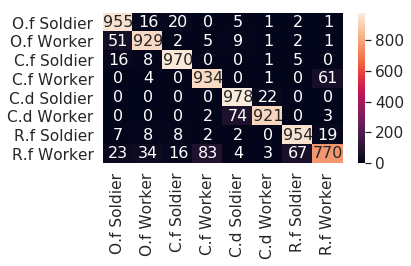

runtime :  20245.26832795143

[87] accuracy: 0.927 loss: 36.399

[0.815, 0.85625, 0.88175, 0.886375, 0.89325, 0.899125, 0.902, 0.905, 0.90625, 0.907875, 0.90575, 0.910125, 0.909375, 0.911, 0.90925, 0.907875, 0.911125, 0.910125, 0.909875, 0.914375, 0.91475, 0.9135, 0.90975, 0.914125, 0.914375, 0.911875, 0.9165, 0.914875, 0.916125, 0.912875, 0.917875, 0.917875, 0.913875, 0.9195, 0.918375, 0.9205, 0.917875, 0.918625, 0.921375, 0.916125, 0.91625, 0.921, 0.916875, 0.92175, 0.92, 0.91725, 0.9175, 0.920125, 0.92, 0.920375, 0.922125, 0.922, 0.919125, 0.923625, 0.921125, 0.919125, 0.9205, 0.92075, 0.918375, 0.919125, 0.91775, 0.921375, 0.922625, 0.919375, 0.917375, 0.91975, 0.923875, 0.92325, 0.92025, 0.920875, 0.919375, 0.92225, 0.917625, 0.921875, 0.921875, 0.922, 0.924125, 0.921, 0.921625, 0.92225, 0.9225, 0.92325, 0.92125, 0.9195, 0.92325, 0.926375, 0.92675]
[64.11414223909378, 49.904711842536926, 44.67099912464619, 41.61231115460396, 41.263010531663895, 39.30233183503151, 38.27557640522718

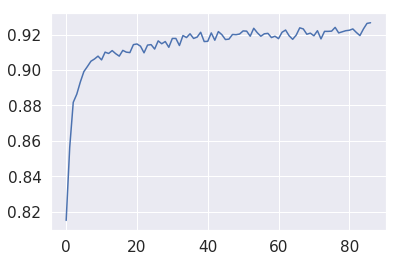

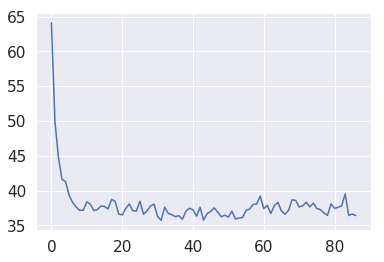

[1, 1, 6, 7, 6, 7, 0, 4, 5, 2, 7, 0, 7, 4, 4, 0, 7, 7, 0, 2, 7, 4, 6, 3, 0, 2, 2, 0, 2, 3, 6, 3, 7, 4, 7, 0, 6, 4, 4, 4, 4, 6, 3, 7, 2, 4, 1, 6, 0, 1, 6, 0, 3, 4, 6, 3, 3, 3, 5, 3, 3, 3, 6, 6, 3, 3, 3, 0, 6, 5, 0, 7, 2, 7, 3, 5, 7, 4, 7, 4, 7, 3, 2, 4, 3, 2, 7, 0, 3, 4, 2, 3, 3, 2, 2, 0, 0, 4, 6, 1, 2, 0, 0, 6, 0, 3, 1, 6, 1, 0, 3, 4, 4, 0, 1, 6, 2, 5, 0, 7, 0, 4, 1, 6, 7, 2, 3, 5, 4, 2, 7, 2, 2, 1, 7, 1, 6, 6, 1, 1, 3, 1, 7, 4, 6, 2, 4, 0, 1, 2, 4, 0, 0, 3, 6, 0, 6, 6, 5, 4, 7, 3, 5, 6, 4, 3, 6, 4, 4, 1, 0, 3, 1, 0, 0, 6, 1, 3, 5, 0, 6, 6, 5, 6, 7, 6, 1, 0, 6, 4, 7, 0, 7, 7, 0, 5, 2, 7, 3, 3, 0, 1, 5, 1, 7, 4, 3, 6, 4, 4, 4, 0, 4, 1, 4, 2, 6, 6, 2, 1, 4, 2, 0, 4, 6, 4, 6, 1, 3, 0, 2, 7, 0, 5, 3, 5, 4, 7, 3, 1, 7, 0, 1, 2, 4, 3, 1, 1, 2, 4, 6, 1, 0, 5, 4, 0, 3, 2, 0, 3, 0, 4, 1, 4, 2, 0, 6, 4, 3, 0, 7, 7, 3, 0, 4, 6, 0, 4, 0, 7, 3, 0, 3, 0, 7, 6, 3, 4, 6, 7, 4, 0, 7, 2, 7, 0, 6, 1, 1, 3, 3, 7, 5, 0, 0, 4, 2, 3, 2, 2, 0, 0, 0, 2, 0, 5, 7, 7, 6, 3, 4, 4, 0, 6, 6, 0, 7, 4, 7, 2, 4, 3, 4, 

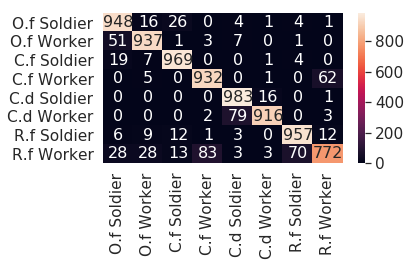

runtime :  20481.544170618057

[88] accuracy: 0.927 loss: 37.970

[0.815, 0.85625, 0.88175, 0.886375, 0.89325, 0.899125, 0.902, 0.905, 0.90625, 0.907875, 0.90575, 0.910125, 0.909375, 0.911, 0.90925, 0.907875, 0.911125, 0.910125, 0.909875, 0.914375, 0.91475, 0.9135, 0.90975, 0.914125, 0.914375, 0.911875, 0.9165, 0.914875, 0.916125, 0.912875, 0.917875, 0.917875, 0.913875, 0.9195, 0.918375, 0.9205, 0.917875, 0.918625, 0.921375, 0.916125, 0.91625, 0.921, 0.916875, 0.92175, 0.92, 0.91725, 0.9175, 0.920125, 0.92, 0.920375, 0.922125, 0.922, 0.919125, 0.923625, 0.921125, 0.919125, 0.9205, 0.92075, 0.918375, 0.919125, 0.91775, 0.921375, 0.922625, 0.919375, 0.917375, 0.91975, 0.923875, 0.92325, 0.92025, 0.920875, 0.919375, 0.92225, 0.917625, 0.921875, 0.921875, 0.922, 0.924125, 0.921, 0.921625, 0.92225, 0.9225, 0.92325, 0.92125, 0.9195, 0.92325, 0.926375, 0.92675, 0.926875]
[64.11414223909378, 49.904711842536926, 44.67099912464619, 41.61231115460396, 41.263010531663895, 39.30233183503151, 38.275

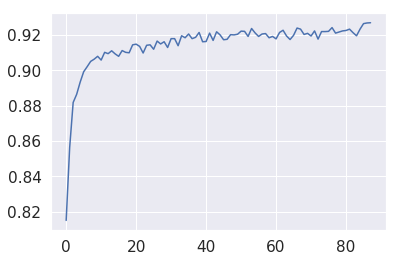

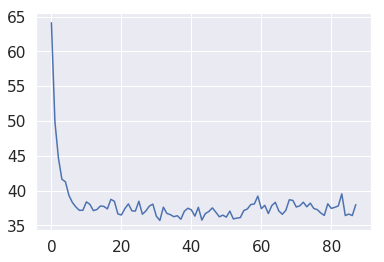

[7, 4, 7, 0, 7, 6, 0, 1, 0, 0, 2, 1, 0, 4, 3, 6, 2, 1, 4, 6, 2, 4, 4, 6, 4, 3, 0, 4, 0, 4, 0, 0, 4, 7, 4, 4, 4, 4, 6, 7, 6, 3, 6, 0, 3, 0, 0, 7, 6, 4, 2, 6, 0, 0, 2, 0, 4, 0, 7, 0, 3, 4, 2, 0, 7, 1, 2, 7, 0, 0, 1, 5, 6, 0, 6, 4, 1, 1, 1, 3, 1, 0, 6, 3, 4, 3, 6, 2, 5, 6, 6, 4, 0, 4, 4, 3, 1, 7, 4, 2, 2, 2, 2, 4, 2, 3, 2, 7, 2, 4, 3, 6, 6, 1, 0, 6, 0, 1, 2, 3, 0, 4, 7, 1, 1, 0, 4, 4, 5, 6, 7, 7, 2, 3, 0, 3, 4, 2, 6, 0, 0, 6, 4, 4, 4, 4, 3, 4, 0, 2, 6, 2, 6, 4, 3, 0, 3, 4, 7, 3, 3, 4, 7, 0, 4, 0, 3, 3, 7, 7, 6, 0, 0, 3, 1, 6, 2, 0, 5, 2, 3, 4, 1, 1, 7, 7, 0, 7, 1, 1, 1, 6, 5, 5, 0, 4, 4, 6, 1, 0, 0, 7, 2, 0, 6, 2, 7, 3, 2, 7, 0, 4, 4, 4, 6, 7, 3, 6, 6, 7, 6, 7, 7, 5, 3, 0, 0, 2, 4, 4, 7, 7, 7, 4, 6, 1, 3, 3, 6, 0, 1, 7, 0, 3, 6, 4, 6, 1, 0, 0, 3, 0, 1, 4, 6, 0, 7, 4, 5, 0, 0, 4, 7, 4, 7, 4, 2, 6, 1, 6, 6, 3, 6, 4, 0, 4, 2, 5, 2, 2, 1, 7, 5, 6, 3, 5, 1, 0, 6, 4, 6, 6, 6, 0, 0, 1, 6, 7, 0, 0, 1, 7, 5, 4, 1, 7, 2, 3, 4, 1, 7, 7, 1, 3, 3, 7, 3, 1, 3, 3, 0, 1, 2, 4, 7, 4, 1, 4, 5, 3, 0, 7, 0, 

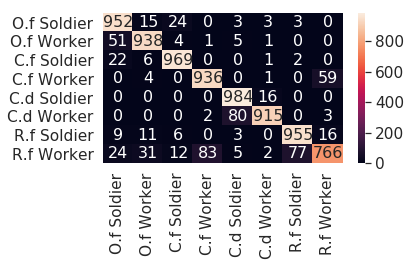

runtime :  20719.615334033966

[89] accuracy: 0.925 loss: 36.102

[0.815, 0.85625, 0.88175, 0.886375, 0.89325, 0.899125, 0.902, 0.905, 0.90625, 0.907875, 0.90575, 0.910125, 0.909375, 0.911, 0.90925, 0.907875, 0.911125, 0.910125, 0.909875, 0.914375, 0.91475, 0.9135, 0.90975, 0.914125, 0.914375, 0.911875, 0.9165, 0.914875, 0.916125, 0.912875, 0.917875, 0.917875, 0.913875, 0.9195, 0.918375, 0.9205, 0.917875, 0.918625, 0.921375, 0.916125, 0.91625, 0.921, 0.916875, 0.92175, 0.92, 0.91725, 0.9175, 0.920125, 0.92, 0.920375, 0.922125, 0.922, 0.919125, 0.923625, 0.921125, 0.919125, 0.9205, 0.92075, 0.918375, 0.919125, 0.91775, 0.921375, 0.922625, 0.919375, 0.917375, 0.91975, 0.923875, 0.92325, 0.92025, 0.920875, 0.919375, 0.92225, 0.917625, 0.921875, 0.921875, 0.922, 0.924125, 0.921, 0.921625, 0.92225, 0.9225, 0.92325, 0.92125, 0.9195, 0.92325, 0.926375, 0.92675, 0.926875, 0.92475]
[64.11414223909378, 49.904711842536926, 44.67099912464619, 41.61231115460396, 41.263010531663895, 39.3023318350315

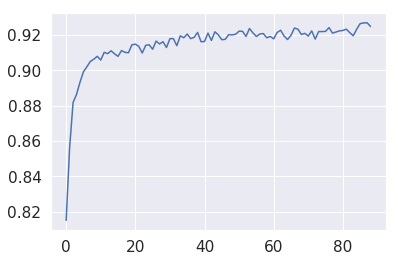

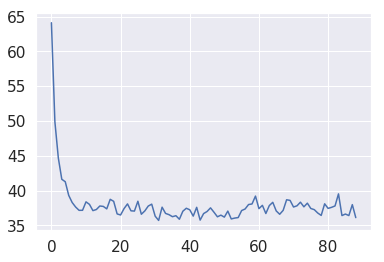

[2, 6, 2, 2, 3, 2, 7, 5, 0, 3, 4, 6, 3, 1, 0, 1, 1, 1, 3, 4, 4, 7, 3, 4, 2, 3, 7, 1, 1, 4, 4, 0, 4, 2, 2, 6, 7, 7, 5, 4, 1, 0, 7, 0, 3, 3, 3, 5, 3, 0, 5, 7, 6, 1, 2, 6, 3, 7, 4, 5, 7, 3, 4, 7, 0, 6, 0, 0, 1, 1, 4, 0, 0, 1, 4, 7, 0, 1, 4, 2, 2, 0, 4, 3, 4, 1, 4, 6, 7, 7, 4, 2, 0, 6, 1, 2, 2, 1, 3, 6, 5, 4, 3, 1, 0, 1, 0, 3, 7, 5, 5, 3, 7, 5, 6, 4, 7, 7, 3, 4, 4, 6, 0, 7, 4, 6, 0, 5, 4, 2, 6, 4, 7, 5, 4, 4, 5, 3, 1, 3, 3, 2, 6, 5, 0, 0, 2, 6, 7, 7, 7, 0, 2, 4, 7, 7, 6, 4, 3, 5, 3, 3, 4, 1, 3, 0, 3, 5, 6, 5, 1, 2, 6, 7, 6, 2, 0, 3, 6, 0, 0, 0, 3, 7, 5, 0, 3, 6, 0, 7, 3, 0, 6, 0, 0, 4, 3, 0, 1, 4, 2, 6, 0, 4, 3, 7, 7, 6, 2, 3, 1, 2, 7, 0, 7, 6, 0, 4, 4, 0, 3, 6, 0, 3, 7, 2, 0, 2, 1, 0, 3, 0, 1, 3, 7, 6, 4, 0, 0, 7, 7, 0, 3, 7, 4, 4, 4, 4, 7, 0, 1, 0, 1, 0, 4, 1, 4, 7, 6, 7, 0, 4, 0, 0, 3, 6, 0, 6, 0, 3, 6, 6, 1, 6, 1, 0, 3, 1, 3, 7, 3, 0, 2, 1, 4, 2, 2, 7, 4, 6, 4, 6, 1, 7, 1, 7, 0, 6, 3, 3, 1, 2, 0, 3, 0, 6, 3, 2, 7, 1, 1, 4, 7, 7, 6, 0, 0, 7, 4, 3, 4, 7, 1, 4, 3, 6, 0, 4, 0, 3, 0, 3, 6, 

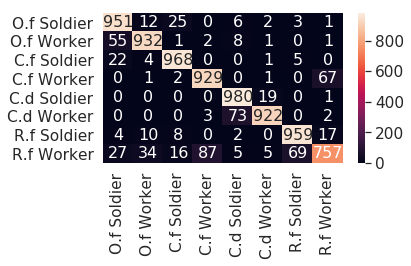

runtime :  20955.905467748642

[90] accuracy: 0.923 loss: 38.750

[0.815, 0.85625, 0.88175, 0.886375, 0.89325, 0.899125, 0.902, 0.905, 0.90625, 0.907875, 0.90575, 0.910125, 0.909375, 0.911, 0.90925, 0.907875, 0.911125, 0.910125, 0.909875, 0.914375, 0.91475, 0.9135, 0.90975, 0.914125, 0.914375, 0.911875, 0.9165, 0.914875, 0.916125, 0.912875, 0.917875, 0.917875, 0.913875, 0.9195, 0.918375, 0.9205, 0.917875, 0.918625, 0.921375, 0.916125, 0.91625, 0.921, 0.916875, 0.92175, 0.92, 0.91725, 0.9175, 0.920125, 0.92, 0.920375, 0.922125, 0.922, 0.919125, 0.923625, 0.921125, 0.919125, 0.9205, 0.92075, 0.918375, 0.919125, 0.91775, 0.921375, 0.922625, 0.919375, 0.917375, 0.91975, 0.923875, 0.92325, 0.92025, 0.920875, 0.919375, 0.92225, 0.917625, 0.921875, 0.921875, 0.922, 0.924125, 0.921, 0.921625, 0.92225, 0.9225, 0.92325, 0.92125, 0.9195, 0.92325, 0.926375, 0.92675, 0.926875, 0.92475, 0.92275]
[64.11414223909378, 49.904711842536926, 44.67099912464619, 41.61231115460396, 41.263010531663895, 39.3023

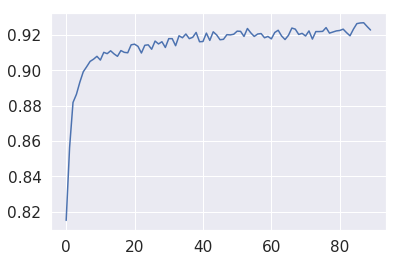

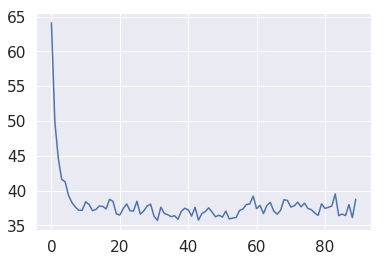

[0, 1, 0, 1, 1, 4, 5, 1, 1, 6, 1, 0, 7, 7, 5, 0, 0, 7, 4, 3, 1, 4, 1, 3, 2, 4, 3, 3, 0, 2, 6, 6, 3, 4, 4, 5, 3, 4, 0, 5, 6, 0, 5, 1, 3, 2, 0, 0, 2, 7, 4, 1, 1, 1, 3, 4, 0, 4, 7, 6, 7, 0, 6, 2, 4, 0, 1, 0, 4, 6, 7, 0, 4, 7, 3, 1, 3, 4, 2, 6, 4, 6, 1, 7, 1, 0, 4, 6, 0, 4, 0, 7, 1, 6, 4, 2, 0, 0, 0, 2, 4, 7, 1, 0, 7, 0, 0, 0, 3, 6, 3, 6, 7, 2, 3, 1, 6, 4, 0, 5, 4, 2, 1, 2, 3, 1, 7, 0, 6, 1, 4, 4, 6, 3, 6, 6, 5, 6, 7, 6, 3, 0, 3, 2, 7, 3, 3, 2, 0, 0, 1, 6, 6, 0, 7, 6, 0, 6, 1, 4, 7, 7, 0, 0, 3, 5, 5, 0, 6, 0, 6, 6, 0, 4, 4, 7, 1, 3, 4, 6, 3, 7, 3, 5, 6, 0, 0, 0, 3, 1, 2, 4, 1, 1, 2, 7, 1, 4, 0, 6, 3, 7, 6, 0, 7, 7, 6, 4, 7, 0, 6, 7, 4, 2, 1, 0, 6, 0, 6, 1, 3, 3, 5, 6, 4, 3, 7, 1, 2, 2, 2, 6, 7, 5, 1, 3, 6, 7, 1, 4, 4, 6, 6, 6, 0, 7, 7, 4, 3, 6, 3, 4, 2, 0, 4, 6, 2, 0, 7, 3, 4, 0, 7, 1, 4, 1, 4, 4, 2, 3, 3, 0, 6, 0, 0, 0, 6, 7, 7, 2, 7, 0, 3, 5, 2, 4, 6, 6, 4, 0, 3, 0, 5, 5, 4, 0, 4, 0, 7, 2, 7, 1, 4, 3, 3, 0, 4, 0, 3, 3, 7, 3, 3, 2, 7, 2, 6, 7, 0, 4, 4, 0, 0, 6, 1, 7, 1, 0, 3, 0, 1, 5, 3, 

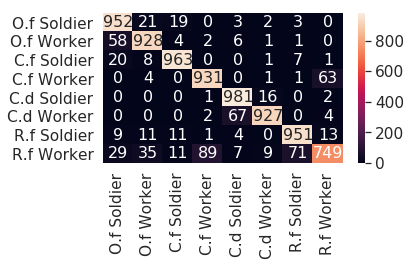

runtime :  21192.09379029274

[91] accuracy: 0.921 loss: 37.231

[0.815, 0.85625, 0.88175, 0.886375, 0.89325, 0.899125, 0.902, 0.905, 0.90625, 0.907875, 0.90575, 0.910125, 0.909375, 0.911, 0.90925, 0.907875, 0.911125, 0.910125, 0.909875, 0.914375, 0.91475, 0.9135, 0.90975, 0.914125, 0.914375, 0.911875, 0.9165, 0.914875, 0.916125, 0.912875, 0.917875, 0.917875, 0.913875, 0.9195, 0.918375, 0.9205, 0.917875, 0.918625, 0.921375, 0.916125, 0.91625, 0.921, 0.916875, 0.92175, 0.92, 0.91725, 0.9175, 0.920125, 0.92, 0.920375, 0.922125, 0.922, 0.919125, 0.923625, 0.921125, 0.919125, 0.9205, 0.92075, 0.918375, 0.919125, 0.91775, 0.921375, 0.922625, 0.919375, 0.917375, 0.91975, 0.923875, 0.92325, 0.92025, 0.920875, 0.919375, 0.92225, 0.917625, 0.921875, 0.921875, 0.922, 0.924125, 0.921, 0.921625, 0.92225, 0.9225, 0.92325, 0.92125, 0.9195, 0.92325, 0.926375, 0.92675, 0.926875, 0.92475, 0.92275, 0.92125]
[64.11414223909378, 49.904711842536926, 44.67099912464619, 41.61231115460396, 41.263010531663895,

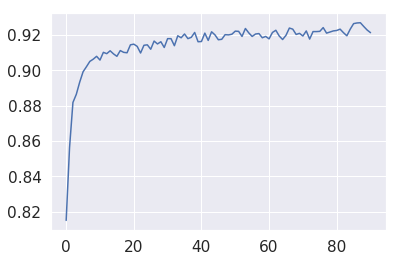

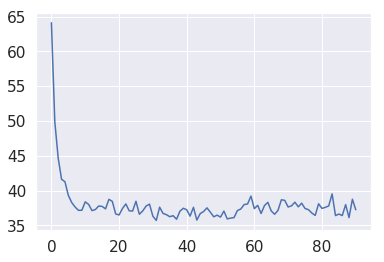

[0, 7, 4, 1, 4, 0, 7, 6, 7, 5, 4, 7, 7, 3, 0, 3, 7, 6, 3, 6, 6, 3, 4, 4, 7, 3, 3, 6, 4, 4, 3, 0, 7, 5, 0, 4, 4, 1, 7, 3, 3, 4, 4, 5, 4, 3, 6, 1, 3, 6, 0, 4, 7, 0, 3, 4, 0, 2, 6, 6, 3, 0, 4, 5, 3, 1, 6, 7, 4, 6, 5, 3, 7, 7, 4, 5, 0, 4, 4, 3, 6, 7, 7, 7, 4, 1, 6, 5, 7, 4, 2, 7, 7, 1, 0, 3, 3, 3, 0, 0, 7, 3, 6, 1, 1, 7, 6, 0, 4, 1, 1, 4, 0, 4, 0, 2, 2, 6, 2, 1, 2, 5, 3, 0, 6, 7, 3, 0, 2, 0, 1, 1, 4, 4, 3, 3, 0, 3, 6, 3, 0, 1, 0, 0, 1, 2, 4, 0, 1, 4, 1, 0, 1, 4, 0, 0, 1, 4, 7, 0, 3, 0, 2, 0, 1, 0, 0, 6, 6, 0, 0, 7, 0, 3, 3, 0, 7, 0, 3, 0, 6, 0, 2, 5, 4, 1, 1, 7, 0, 0, 4, 7, 6, 0, 7, 2, 2, 7, 6, 5, 0, 6, 6, 6, 5, 7, 7, 5, 4, 1, 2, 6, 3, 6, 5, 3, 4, 0, 7, 5, 7, 0, 7, 7, 1, 0, 4, 3, 0, 7, 0, 3, 4, 0, 6, 0, 1, 2, 5, 1, 7, 1, 7, 5, 7, 4, 4, 6, 1, 3, 4, 3, 3, 0, 1, 4, 2, 0, 6, 3, 0, 7, 0, 3, 2, 7, 7, 4, 4, 6, 3, 6, 3, 3, 6, 4, 7, 7, 4, 7, 2, 1, 0, 0, 0, 7, 4, 5, 0, 7, 0, 4, 1, 3, 1, 4, 3, 3, 6, 6, 4, 1, 6, 0, 0, 2, 0, 5, 0, 1, 1, 4, 2, 7, 5, 3, 0, 4, 2, 3, 7, 3, 3, 5, 3, 0, 4, 4, 3, 4, 5, 5, 3, 

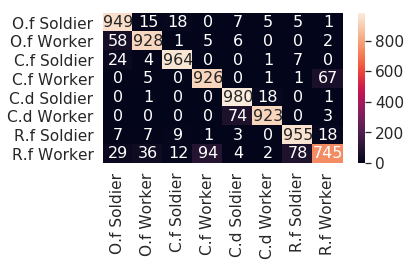

runtime :  21427.84242463112

[92] accuracy: 0.924 loss: 37.074

[0.815, 0.85625, 0.88175, 0.886375, 0.89325, 0.899125, 0.902, 0.905, 0.90625, 0.907875, 0.90575, 0.910125, 0.909375, 0.911, 0.90925, 0.907875, 0.911125, 0.910125, 0.909875, 0.914375, 0.91475, 0.9135, 0.90975, 0.914125, 0.914375, 0.911875, 0.9165, 0.914875, 0.916125, 0.912875, 0.917875, 0.917875, 0.913875, 0.9195, 0.918375, 0.9205, 0.917875, 0.918625, 0.921375, 0.916125, 0.91625, 0.921, 0.916875, 0.92175, 0.92, 0.91725, 0.9175, 0.920125, 0.92, 0.920375, 0.922125, 0.922, 0.919125, 0.923625, 0.921125, 0.919125, 0.9205, 0.92075, 0.918375, 0.919125, 0.91775, 0.921375, 0.922625, 0.919375, 0.917375, 0.91975, 0.923875, 0.92325, 0.92025, 0.920875, 0.919375, 0.92225, 0.917625, 0.921875, 0.921875, 0.922, 0.924125, 0.921, 0.921625, 0.92225, 0.9225, 0.92325, 0.92125, 0.9195, 0.92325, 0.926375, 0.92675, 0.926875, 0.92475, 0.92275, 0.92125, 0.92375]
[64.11414223909378, 49.904711842536926, 44.67099912464619, 41.61231115460396, 41.2630105

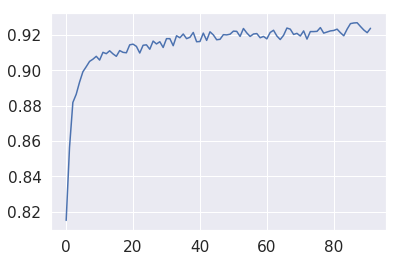

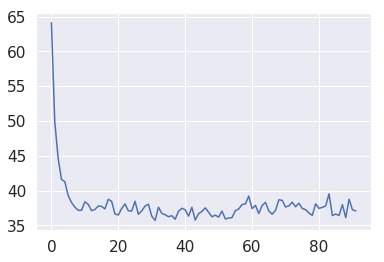

[7, 5, 3, 4, 3, 3, 4, 7, 3, 7, 5, 5, 7, 3, 6, 1, 4, 3, 0, 4, 1, 4, 1, 6, 4, 0, 0, 5, 4, 1, 6, 4, 5, 6, 1, 4, 0, 4, 6, 1, 7, 6, 0, 3, 2, 4, 2, 4, 2, 3, 6, 2, 0, 0, 7, 3, 1, 1, 1, 1, 4, 6, 0, 3, 7, 3, 0, 1, 1, 3, 6, 6, 0, 3, 4, 2, 1, 6, 3, 2, 7, 0, 0, 0, 5, 3, 2, 0, 7, 6, 1, 7, 2, 4, 0, 7, 7, 0, 6, 3, 7, 4, 7, 4, 0, 1, 6, 3, 3, 4, 0, 6, 7, 2, 0, 1, 0, 3, 2, 3, 2, 4, 7, 4, 4, 0, 6, 4, 0, 5, 6, 0, 6, 2, 3, 2, 7, 1, 6, 6, 1, 5, 1, 0, 4, 3, 2, 3, 1, 6, 2, 7, 7, 2, 1, 3, 3, 4, 0, 7, 3, 5, 0, 1, 1, 4, 0, 7, 0, 4, 1, 4, 2, 3, 6, 6, 4, 0, 3, 0, 3, 3, 0, 2, 4, 3, 2, 7, 0, 2, 4, 1, 7, 7, 3, 1, 0, 3, 3, 4, 1, 6, 3, 7, 7, 0, 0, 4, 2, 3, 6, 7, 3, 7, 0, 0, 7, 1, 7, 6, 6, 1, 0, 6, 4, 3, 0, 1, 1, 7, 7, 7, 6, 6, 7, 0, 5, 5, 7, 1, 5, 6, 0, 0, 3, 1, 6, 0, 0, 3, 1, 0, 4, 6, 1, 1, 0, 5, 4, 6, 3, 3, 0, 3, 3, 7, 3, 0, 1, 6, 1, 3, 7, 0, 3, 0, 4, 5, 7, 0, 7, 7, 4, 3, 6, 0, 6, 0, 4, 7, 2, 0, 4, 0, 3, 3, 7, 3, 0, 0, 0, 0, 7, 3, 1, 3, 0, 3, 5, 1, 7, 4, 0, 1, 0, 0, 4, 7, 7, 3, 1, 7, 7, 6, 4, 6, 2, 1, 2, 2, 3, 4, 1, 

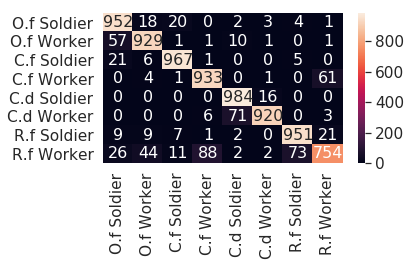

runtime :  21666.434399604797

[93] accuracy: 0.924 loss: 36.392

[0.815, 0.85625, 0.88175, 0.886375, 0.89325, 0.899125, 0.902, 0.905, 0.90625, 0.907875, 0.90575, 0.910125, 0.909375, 0.911, 0.90925, 0.907875, 0.911125, 0.910125, 0.909875, 0.914375, 0.91475, 0.9135, 0.90975, 0.914125, 0.914375, 0.911875, 0.9165, 0.914875, 0.916125, 0.912875, 0.917875, 0.917875, 0.913875, 0.9195, 0.918375, 0.9205, 0.917875, 0.918625, 0.921375, 0.916125, 0.91625, 0.921, 0.916875, 0.92175, 0.92, 0.91725, 0.9175, 0.920125, 0.92, 0.920375, 0.922125, 0.922, 0.919125, 0.923625, 0.921125, 0.919125, 0.9205, 0.92075, 0.918375, 0.919125, 0.91775, 0.921375, 0.922625, 0.919375, 0.917375, 0.91975, 0.923875, 0.92325, 0.92025, 0.920875, 0.919375, 0.92225, 0.917625, 0.921875, 0.921875, 0.922, 0.924125, 0.921, 0.921625, 0.92225, 0.9225, 0.92325, 0.92125, 0.9195, 0.92325, 0.926375, 0.92675, 0.926875, 0.92475, 0.92275, 0.92125, 0.92375, 0.924375]
[64.11414223909378, 49.904711842536926, 44.67099912464619, 41.61231115460396,

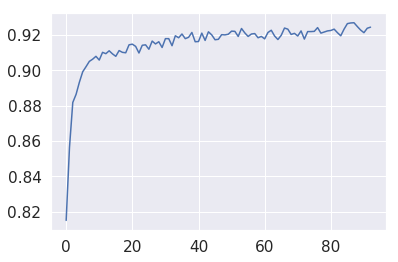

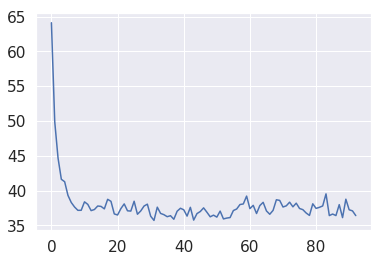

[1, 6, 3, 4, 7, 0, 0, 1, 3, 6, 3, 1, 6, 4, 3, 4, 6, 6, 7, 3, 4, 4, 2, 6, 0, 7, 1, 1, 6, 6, 4, 7, 3, 6, 1, 0, 1, 2, 2, 1, 0, 3, 5, 7, 0, 7, 7, 2, 1, 1, 0, 4, 3, 0, 7, 3, 1, 7, 0, 3, 2, 3, 5, 3, 3, 6, 3, 5, 0, 4, 0, 1, 4, 6, 0, 6, 6, 7, 3, 3, 2, 0, 5, 0, 6, 7, 5, 6, 2, 7, 3, 6, 3, 0, 0, 0, 5, 2, 0, 1, 4, 1, 6, 4, 7, 3, 1, 6, 0, 5, 7, 2, 3, 1, 3, 4, 1, 6, 3, 3, 4, 3, 0, 4, 1, 3, 7, 3, 0, 4, 7, 3, 6, 4, 4, 5, 7, 0, 2, 0, 6, 3, 2, 4, 1, 7, 6, 0, 5, 6, 0, 6, 3, 4, 7, 0, 4, 2, 1, 6, 7, 7, 4, 7, 6, 7, 0, 7, 7, 4, 1, 4, 0, 0, 4, 6, 0, 7, 3, 2, 3, 4, 5, 6, 3, 4, 6, 5, 0, 0, 4, 6, 7, 6, 6, 3, 7, 5, 7, 3, 0, 4, 7, 0, 7, 3, 4, 7, 1, 4, 2, 6, 5, 1, 2, 3, 6, 0, 0, 1, 2, 6, 7, 7, 7, 5, 2, 7, 2, 7, 1, 7, 0, 1, 3, 3, 4, 1, 1, 4, 7, 5, 0, 0, 4, 0, 7, 3, 6, 6, 1, 6, 7, 1, 0, 5, 0, 0, 1, 7, 3, 6, 3, 6, 1, 4, 3, 5, 4, 7, 3, 4, 6, 6, 6, 4, 7, 0, 2, 5, 6, 4, 3, 1, 7, 1, 6, 4, 7, 1, 1, 0, 5, 5, 3, 6, 1, 6, 6, 1, 3, 7, 0, 1, 4, 6, 1, 4, 3, 0, 6, 0, 6, 6, 7, 6, 2, 1, 2, 3, 3, 6, 4, 3, 6, 1, 3, 3, 4, 1, 0, 3, 0, 

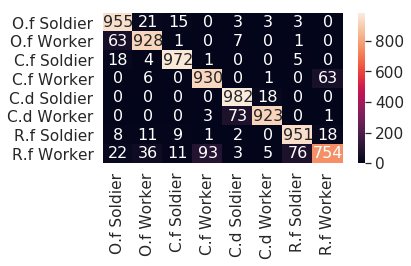

runtime :  21905.09048318863

[94] accuracy: 0.923 loss: 38.078

[0.815, 0.85625, 0.88175, 0.886375, 0.89325, 0.899125, 0.902, 0.905, 0.90625, 0.907875, 0.90575, 0.910125, 0.909375, 0.911, 0.90925, 0.907875, 0.911125, 0.910125, 0.909875, 0.914375, 0.91475, 0.9135, 0.90975, 0.914125, 0.914375, 0.911875, 0.9165, 0.914875, 0.916125, 0.912875, 0.917875, 0.917875, 0.913875, 0.9195, 0.918375, 0.9205, 0.917875, 0.918625, 0.921375, 0.916125, 0.91625, 0.921, 0.916875, 0.92175, 0.92, 0.91725, 0.9175, 0.920125, 0.92, 0.920375, 0.922125, 0.922, 0.919125, 0.923625, 0.921125, 0.919125, 0.9205, 0.92075, 0.918375, 0.919125, 0.91775, 0.921375, 0.922625, 0.919375, 0.917375, 0.91975, 0.923875, 0.92325, 0.92025, 0.920875, 0.919375, 0.92225, 0.917625, 0.921875, 0.921875, 0.922, 0.924125, 0.921, 0.921625, 0.92225, 0.9225, 0.92325, 0.92125, 0.9195, 0.92325, 0.926375, 0.92675, 0.926875, 0.92475, 0.92275, 0.92125, 0.92375, 0.924375, 0.92325]
[64.11414223909378, 49.904711842536926, 44.67099912464619, 41.6123111

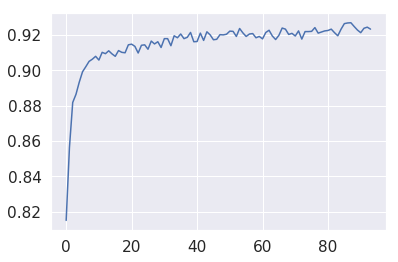

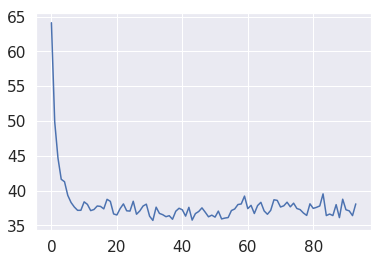

[7, 6, 3, 7, 6, 5, 3, 4, 4, 4, 6, 0, 0, 2, 1, 7, 7, 6, 1, 0, 6, 3, 6, 7, 6, 7, 2, 6, 1, 4, 4, 2, 6, 7, 6, 3, 6, 7, 6, 3, 0, 6, 0, 6, 3, 7, 7, 2, 7, 4, 7, 3, 0, 6, 4, 4, 7, 6, 2, 0, 6, 3, 3, 1, 7, 7, 1, 0, 3, 2, 4, 2, 5, 4, 3, 4, 4, 4, 0, 7, 2, 0, 4, 0, 2, 4, 3, 1, 0, 3, 6, 7, 1, 6, 1, 6, 0, 1, 7, 6, 7, 6, 0, 1, 1, 3, 4, 6, 0, 0, 6, 1, 4, 3, 2, 0, 1, 0, 2, 1, 7, 1, 0, 0, 4, 5, 2, 4, 0, 3, 3, 6, 2, 3, 1, 1, 5, 4, 3, 5, 3, 4, 7, 6, 3, 0, 0, 6, 7, 2, 6, 6, 1, 4, 3, 0, 7, 6, 6, 6, 4, 2, 5, 4, 1, 6, 7, 2, 4, 1, 1, 1, 6, 4, 5, 1, 3, 5, 6, 7, 1, 4, 6, 0, 6, 3, 6, 0, 3, 4, 6, 4, 3, 2, 7, 0, 4, 5, 4, 6, 4, 0, 2, 4, 4, 0, 0, 0, 3, 4, 1, 7, 4, 2, 0, 4, 4, 6, 3, 0, 0, 0, 3, 6, 0, 0, 0, 3, 6, 3, 6, 7, 2, 6, 0, 4, 3, 4, 3, 4, 3, 7, 6, 3, 6, 0, 6, 2, 5, 6, 7, 4, 0, 4, 2, 3, 4, 4, 4, 1, 6, 1, 7, 0, 0, 5, 6, 2, 3, 3, 6, 3, 0, 5, 4, 7, 2, 7, 6, 7, 4, 3, 2, 1, 4, 6, 1, 4, 3, 2, 3, 5, 7, 1, 4, 3, 7, 1, 1, 0, 0, 4, 0, 0, 4, 7, 3, 3, 0, 6, 5, 2, 3, 0, 7, 3, 7, 1, 1, 5, 0, 3, 4, 0, 6, 1, 1, 3, 6, 5, 7, 0, 6, 

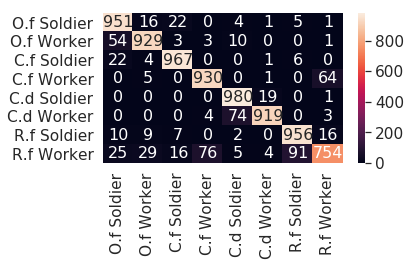

runtime :  22144.241113185883

[95] accuracy: 0.921 loss: 38.758

[0.815, 0.85625, 0.88175, 0.886375, 0.89325, 0.899125, 0.902, 0.905, 0.90625, 0.907875, 0.90575, 0.910125, 0.909375, 0.911, 0.90925, 0.907875, 0.911125, 0.910125, 0.909875, 0.914375, 0.91475, 0.9135, 0.90975, 0.914125, 0.914375, 0.911875, 0.9165, 0.914875, 0.916125, 0.912875, 0.917875, 0.917875, 0.913875, 0.9195, 0.918375, 0.9205, 0.917875, 0.918625, 0.921375, 0.916125, 0.91625, 0.921, 0.916875, 0.92175, 0.92, 0.91725, 0.9175, 0.920125, 0.92, 0.920375, 0.922125, 0.922, 0.919125, 0.923625, 0.921125, 0.919125, 0.9205, 0.92075, 0.918375, 0.919125, 0.91775, 0.921375, 0.922625, 0.919375, 0.917375, 0.91975, 0.923875, 0.92325, 0.92025, 0.920875, 0.919375, 0.92225, 0.917625, 0.921875, 0.921875, 0.922, 0.924125, 0.921, 0.921625, 0.92225, 0.9225, 0.92325, 0.92125, 0.9195, 0.92325, 0.926375, 0.92675, 0.926875, 0.92475, 0.92275, 0.92125, 0.92375, 0.924375, 0.92325, 0.921]
[64.11414223909378, 49.904711842536926, 44.67099912464619, 41

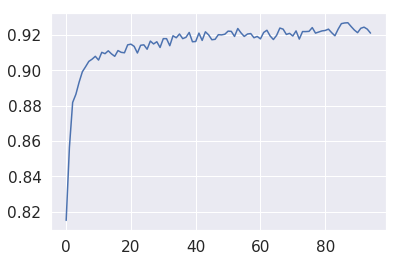

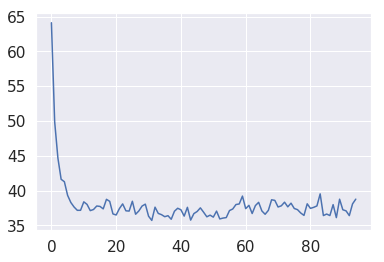

[6, 0, 5, 0, 7, 7, 3, 3, 3, 3, 6, 0, 1, 3, 6, 3, 2, 7, 3, 5, 2, 0, 4, 0, 7, 1, 7, 7, 4, 0, 4, 6, 3, 0, 7, 0, 3, 7, 1, 3, 3, 4, 3, 3, 4, 4, 6, 1, 1, 0, 2, 6, 1, 1, 0, 7, 0, 4, 4, 7, 1, 0, 6, 0, 5, 0, 1, 0, 0, 5, 1, 0, 6, 7, 7, 0, 6, 3, 1, 4, 3, 4, 2, 1, 3, 6, 0, 6, 6, 0, 0, 7, 4, 5, 6, 3, 4, 4, 6, 7, 1, 4, 3, 3, 4, 1, 4, 7, 1, 4, 6, 3, 1, 0, 6, 2, 3, 6, 6, 6, 4, 0, 5, 6, 6, 1, 0, 0, 7, 0, 3, 4, 1, 3, 3, 4, 4, 0, 4, 7, 2, 0, 2, 7, 7, 3, 5, 5, 1, 0, 0, 5, 7, 1, 6, 7, 7, 1, 0, 7, 2, 0, 1, 6, 1, 0, 0, 6, 6, 4, 0, 0, 7, 0, 6, 7, 7, 7, 7, 1, 6, 1, 5, 0, 3, 0, 1, 1, 4, 2, 5, 3, 4, 6, 4, 2, 6, 0, 4, 7, 3, 4, 1, 0, 6, 0, 3, 3, 1, 4, 3, 4, 2, 6, 2, 3, 5, 4, 6, 3, 3, 0, 1, 7, 5, 7, 5, 4, 0, 7, 6, 3, 0, 2, 0, 4, 0, 3, 4, 0, 3, 1, 6, 2, 0, 4, 0, 0, 0, 5, 3, 6, 4, 4, 7, 6, 7, 1, 6, 0, 3, 3, 3, 3, 2, 0, 2, 2, 0, 7, 0, 0, 3, 2, 7, 1, 3, 1, 4, 2, 7, 6, 4, 6, 4, 3, 5, 1, 4, 0, 4, 3, 3, 1, 3, 2, 6, 4, 2, 6, 6, 1, 4, 0, 0, 4, 5, 1, 3, 6, 0, 1, 4, 4, 3, 7, 3, 3, 2, 3, 3, 1, 3, 1, 7, 4, 7, 1, 4, 0, 6, 4, 4, 

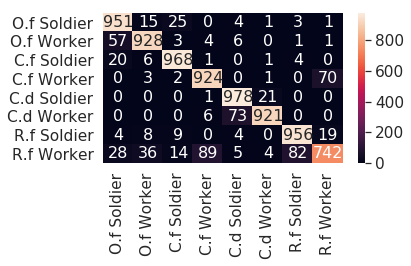

runtime :  22383.197850465775

[96] accuracy: 0.925 loss: 37.480

[0.815, 0.85625, 0.88175, 0.886375, 0.89325, 0.899125, 0.902, 0.905, 0.90625, 0.907875, 0.90575, 0.910125, 0.909375, 0.911, 0.90925, 0.907875, 0.911125, 0.910125, 0.909875, 0.914375, 0.91475, 0.9135, 0.90975, 0.914125, 0.914375, 0.911875, 0.9165, 0.914875, 0.916125, 0.912875, 0.917875, 0.917875, 0.913875, 0.9195, 0.918375, 0.9205, 0.917875, 0.918625, 0.921375, 0.916125, 0.91625, 0.921, 0.916875, 0.92175, 0.92, 0.91725, 0.9175, 0.920125, 0.92, 0.920375, 0.922125, 0.922, 0.919125, 0.923625, 0.921125, 0.919125, 0.9205, 0.92075, 0.918375, 0.919125, 0.91775, 0.921375, 0.922625, 0.919375, 0.917375, 0.91975, 0.923875, 0.92325, 0.92025, 0.920875, 0.919375, 0.92225, 0.917625, 0.921875, 0.921875, 0.922, 0.924125, 0.921, 0.921625, 0.92225, 0.9225, 0.92325, 0.92125, 0.9195, 0.92325, 0.926375, 0.92675, 0.926875, 0.92475, 0.92275, 0.92125, 0.92375, 0.924375, 0.92325, 0.921, 0.924875]
[64.11414223909378, 49.904711842536926, 44.67099912

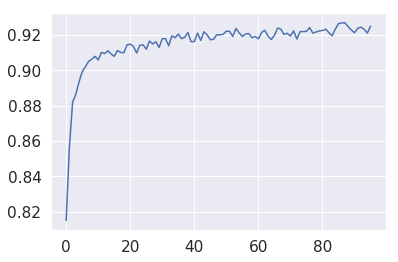

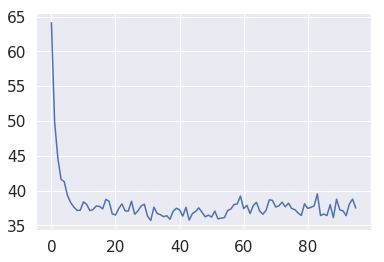

[2, 2, 4, 7, 7, 4, 0, 3, 1, 4, 1, 6, 2, 1, 1, 0, 4, 6, 0, 4, 4, 7, 1, 6, 7, 4, 0, 1, 3, 4, 1, 0, 0, 0, 0, 4, 6, 7, 4, 0, 4, 0, 3, 6, 4, 3, 4, 1, 0, 7, 6, 7, 6, 0, 1, 3, 6, 7, 0, 0, 6, 2, 3, 7, 4, 4, 1, 0, 4, 4, 3, 4, 2, 1, 7, 4, 4, 3, 0, 3, 3, 2, 0, 3, 5, 1, 1, 4, 0, 3, 3, 6, 3, 6, 3, 0, 0, 3, 2, 3, 5, 0, 6, 0, 6, 0, 0, 3, 1, 0, 4, 6, 4, 0, 3, 4, 6, 7, 5, 2, 7, 7, 4, 6, 4, 7, 4, 1, 4, 4, 0, 2, 1, 4, 4, 1, 5, 6, 5, 3, 0, 4, 2, 1, 7, 6, 5, 7, 7, 6, 4, 0, 7, 7, 0, 5, 6, 7, 0, 4, 6, 7, 7, 0, 4, 6, 5, 0, 4, 3, 7, 4, 5, 5, 7, 3, 3, 6, 0, 7, 4, 0, 1, 1, 4, 6, 3, 7, 7, 6, 0, 3, 3, 4, 3, 2, 7, 0, 7, 7, 7, 5, 0, 0, 3, 7, 4, 4, 7, 6, 5, 7, 6, 2, 4, 7, 4, 7, 0, 3, 7, 0, 0, 3, 3, 4, 0, 6, 2, 3, 4, 0, 3, 7, 0, 6, 6, 2, 0, 0, 5, 1, 1, 2, 0, 3, 0, 2, 2, 3, 4, 2, 2, 3, 3, 6, 6, 6, 5, 1, 2, 7, 4, 7, 0, 0, 3, 7, 6, 0, 6, 7, 1, 1, 1, 2, 1, 2, 0, 4, 7, 4, 0, 6, 1, 0, 2, 0, 0, 3, 3, 2, 1, 7, 0, 3, 6, 2, 5, 3, 1, 2, 7, 4, 0, 1, 1, 4, 3, 6, 6, 4, 0, 0, 4, 2, 4, 0, 4, 7, 0, 2, 7, 3, 1, 4, 4, 0, 3, 3, 0, 3, 4, 

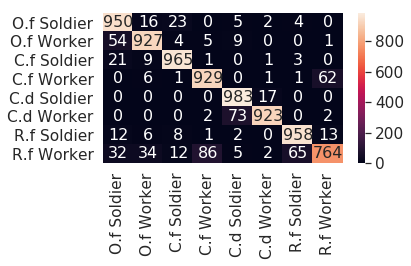

runtime :  22619.608233451843

[97] accuracy: 0.924 loss: 36.591

[0.815, 0.85625, 0.88175, 0.886375, 0.89325, 0.899125, 0.902, 0.905, 0.90625, 0.907875, 0.90575, 0.910125, 0.909375, 0.911, 0.90925, 0.907875, 0.911125, 0.910125, 0.909875, 0.914375, 0.91475, 0.9135, 0.90975, 0.914125, 0.914375, 0.911875, 0.9165, 0.914875, 0.916125, 0.912875, 0.917875, 0.917875, 0.913875, 0.9195, 0.918375, 0.9205, 0.917875, 0.918625, 0.921375, 0.916125, 0.91625, 0.921, 0.916875, 0.92175, 0.92, 0.91725, 0.9175, 0.920125, 0.92, 0.920375, 0.922125, 0.922, 0.919125, 0.923625, 0.921125, 0.919125, 0.9205, 0.92075, 0.918375, 0.919125, 0.91775, 0.921375, 0.922625, 0.919375, 0.917375, 0.91975, 0.923875, 0.92325, 0.92025, 0.920875, 0.919375, 0.92225, 0.917625, 0.921875, 0.921875, 0.922, 0.924125, 0.921, 0.921625, 0.92225, 0.9225, 0.92325, 0.92125, 0.9195, 0.92325, 0.926375, 0.92675, 0.926875, 0.92475, 0.92275, 0.92125, 0.92375, 0.924375, 0.92325, 0.921, 0.924875, 0.92375]
[64.11414223909378, 49.904711842536926, 44

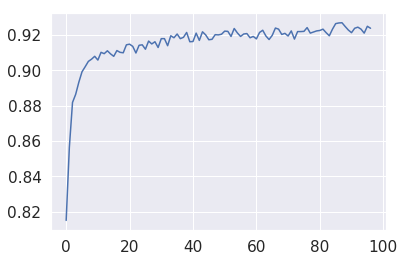

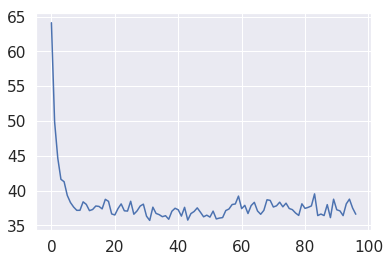

[6, 6, 5, 2, 1, 0, 0, 4, 7, 3, 4, 7, 6, 1, 0, 7, 3, 3, 4, 7, 0, 2, 3, 7, 6, 7, 7, 0, 3, 3, 0, 4, 7, 3, 0, 2, 0, 2, 7, 5, 3, 6, 0, 3, 2, 3, 2, 6, 4, 5, 4, 7, 4, 1, 7, 7, 1, 4, 7, 7, 3, 7, 1, 7, 4, 0, 4, 0, 6, 7, 3, 3, 0, 5, 3, 4, 3, 0, 4, 6, 0, 0, 4, 2, 6, 6, 0, 4, 3, 4, 4, 1, 0, 6, 7, 4, 4, 7, 1, 0, 5, 4, 4, 4, 1, 0, 7, 0, 7, 0, 3, 6, 7, 4, 0, 0, 0, 3, 0, 3, 4, 6, 1, 0, 6, 6, 3, 6, 2, 0, 4, 1, 4, 3, 6, 0, 1, 6, 1, 6, 0, 6, 3, 7, 0, 2, 7, 4, 2, 3, 4, 5, 4, 2, 0, 0, 0, 0, 5, 0, 3, 3, 4, 4, 6, 0, 7, 5, 3, 0, 4, 3, 1, 0, 0, 0, 5, 3, 0, 1, 0, 7, 5, 4, 1, 6, 1, 7, 4, 0, 2, 4, 4, 0, 6, 3, 0, 3, 6, 0, 6, 4, 6, 4, 6, 2, 4, 0, 3, 3, 4, 6, 5, 2, 6, 0, 0, 1, 1, 3, 1, 2, 1, 7, 0, 7, 7, 7, 5, 4, 7, 3, 2, 0, 4, 7, 0, 4, 1, 1, 2, 3, 3, 6, 3, 3, 1, 4, 0, 0, 0, 2, 6, 3, 3, 3, 3, 3, 1, 6, 0, 4, 1, 3, 7, 1, 6, 7, 7, 3, 0, 2, 4, 2, 0, 2, 7, 4, 5, 3, 3, 4, 6, 4, 5, 1, 1, 3, 1, 7, 7, 4, 2, 0, 0, 1, 3, 2, 1, 0, 3, 2, 7, 4, 0, 0, 0, 3, 5, 0, 3, 2, 6, 2, 4, 0, 7, 3, 5, 5, 3, 3, 4, 6, 7, 2, 4, 4, 3, 4, 4, 3, 2, 

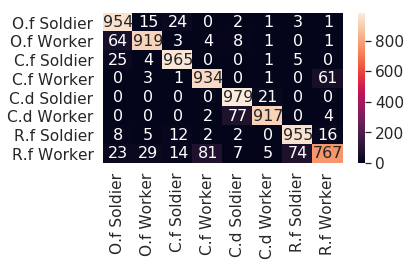

runtime :  22856.626613616943

[98] accuracy: 0.922 loss: 37.347

[0.815, 0.85625, 0.88175, 0.886375, 0.89325, 0.899125, 0.902, 0.905, 0.90625, 0.907875, 0.90575, 0.910125, 0.909375, 0.911, 0.90925, 0.907875, 0.911125, 0.910125, 0.909875, 0.914375, 0.91475, 0.9135, 0.90975, 0.914125, 0.914375, 0.911875, 0.9165, 0.914875, 0.916125, 0.912875, 0.917875, 0.917875, 0.913875, 0.9195, 0.918375, 0.9205, 0.917875, 0.918625, 0.921375, 0.916125, 0.91625, 0.921, 0.916875, 0.92175, 0.92, 0.91725, 0.9175, 0.920125, 0.92, 0.920375, 0.922125, 0.922, 0.919125, 0.923625, 0.921125, 0.919125, 0.9205, 0.92075, 0.918375, 0.919125, 0.91775, 0.921375, 0.922625, 0.919375, 0.917375, 0.91975, 0.923875, 0.92325, 0.92025, 0.920875, 0.919375, 0.92225, 0.917625, 0.921875, 0.921875, 0.922, 0.924125, 0.921, 0.921625, 0.92225, 0.9225, 0.92325, 0.92125, 0.9195, 0.92325, 0.926375, 0.92675, 0.926875, 0.92475, 0.92275, 0.92125, 0.92375, 0.924375, 0.92325, 0.921, 0.924875, 0.92375, 0.921625]
[64.11414223909378, 49.904711842

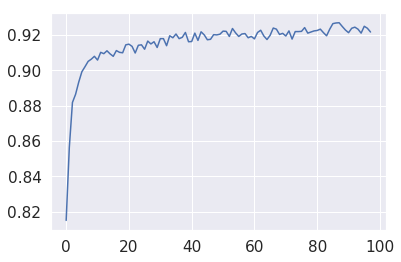

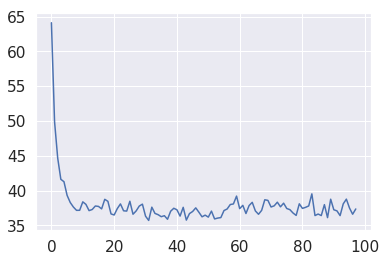

[0, 2, 6, 3, 0, 3, 6, 7, 2, 0, 3, 0, 4, 1, 3, 6, 6, 1, 0, 7, 7, 1, 2, 4, 0, 4, 7, 5, 6, 6, 3, 0, 4, 6, 1, 4, 1, 4, 3, 6, 3, 3, 7, 3, 1, 2, 3, 4, 3, 1, 4, 0, 0, 4, 3, 2, 3, 7, 7, 2, 6, 7, 1, 0, 0, 0, 3, 6, 7, 4, 7, 7, 1, 7, 6, 3, 1, 0, 4, 7, 0, 2, 7, 6, 6, 0, 0, 4, 1, 4, 4, 5, 4, 0, 3, 2, 2, 0, 5, 3, 2, 2, 5, 0, 6, 5, 0, 3, 3, 2, 4, 7, 6, 1, 0, 4, 2, 1, 3, 0, 2, 6, 6, 3, 4, 7, 4, 0, 3, 7, 0, 4, 4, 3, 6, 0, 0, 1, 4, 0, 0, 0, 5, 3, 5, 4, 0, 1, 6, 4, 0, 6, 0, 3, 1, 1, 7, 1, 1, 4, 5, 7, 7, 4, 7, 1, 4, 1, 6, 1, 6, 3, 6, 6, 7, 4, 4, 0, 4, 6, 6, 0, 2, 0, 0, 3, 7, 1, 2, 0, 7, 6, 6, 6, 7, 0, 5, 3, 0, 7, 7, 1, 4, 0, 4, 3, 0, 4, 6, 0, 3, 1, 7, 3, 0, 4, 3, 6, 6, 3, 0, 3, 4, 1, 1, 0, 3, 0, 7, 2, 7, 7, 2, 7, 7, 2, 2, 1, 2, 1, 7, 4, 6, 7, 3, 6, 7, 0, 4, 4, 3, 0, 4, 3, 4, 3, 6, 2, 3, 7, 0, 7, 4, 6, 0, 7, 7, 6, 3, 4, 7, 3, 3, 0, 4, 4, 3, 1, 2, 6, 4, 1, 3, 7, 4, 4, 3, 3, 0, 5, 7, 3, 7, 7, 5, 3, 4, 1, 0, 0, 0, 7, 7, 4, 6, 0, 3, 4, 4, 1, 4, 6, 3, 5, 0, 1, 7, 7, 6, 2, 6, 7, 0, 6, 7, 7, 0, 0, 5, 1, 4, 6, 3, 

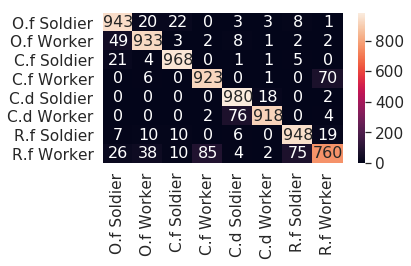

runtime :  23092.348306655884

[99] accuracy: 0.923 loss: 38.067

[0.815, 0.85625, 0.88175, 0.886375, 0.89325, 0.899125, 0.902, 0.905, 0.90625, 0.907875, 0.90575, 0.910125, 0.909375, 0.911, 0.90925, 0.907875, 0.911125, 0.910125, 0.909875, 0.914375, 0.91475, 0.9135, 0.90975, 0.914125, 0.914375, 0.911875, 0.9165, 0.914875, 0.916125, 0.912875, 0.917875, 0.917875, 0.913875, 0.9195, 0.918375, 0.9205, 0.917875, 0.918625, 0.921375, 0.916125, 0.91625, 0.921, 0.916875, 0.92175, 0.92, 0.91725, 0.9175, 0.920125, 0.92, 0.920375, 0.922125, 0.922, 0.919125, 0.923625, 0.921125, 0.919125, 0.9205, 0.92075, 0.918375, 0.919125, 0.91775, 0.921375, 0.922625, 0.919375, 0.917375, 0.91975, 0.923875, 0.92325, 0.92025, 0.920875, 0.919375, 0.92225, 0.917625, 0.921875, 0.921875, 0.922, 0.924125, 0.921, 0.921625, 0.92225, 0.9225, 0.92325, 0.92125, 0.9195, 0.92325, 0.926375, 0.92675, 0.926875, 0.92475, 0.92275, 0.92125, 0.92375, 0.924375, 0.92325, 0.921, 0.924875, 0.92375, 0.921625, 0.923375]
[64.11414223909378, 49

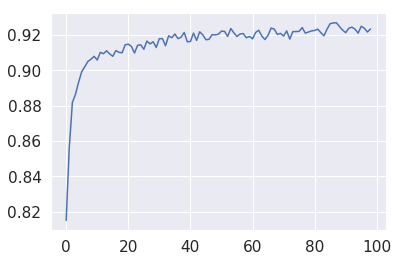

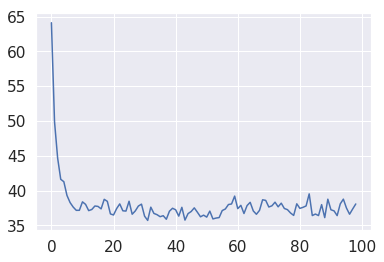

[3, 3, 3, 0, 1, 3, 6, 0, 7, 1, 4, 0, 5, 2, 3, 2, 3, 0, 6, 6, 4, 0, 1, 2, 1, 0, 4, 7, 1, 3, 2, 7, 7, 1, 7, 0, 3, 7, 6, 0, 7, 4, 3, 6, 0, 0, 5, 1, 0, 4, 7, 2, 6, 6, 1, 5, 0, 2, 5, 0, 7, 7, 1, 1, 6, 6, 7, 4, 1, 1, 6, 4, 1, 0, 3, 7, 7, 7, 6, 3, 4, 4, 6, 6, 1, 3, 1, 3, 3, 2, 4, 1, 2, 0, 7, 1, 6, 6, 6, 7, 0, 3, 0, 2, 4, 0, 7, 1, 0, 0, 6, 7, 7, 7, 2, 6, 1, 3, 4, 4, 0, 0, 2, 0, 7, 2, 3, 5, 2, 3, 4, 7, 3, 3, 7, 7, 3, 6, 0, 0, 0, 6, 0, 6, 6, 0, 3, 0, 3, 7, 0, 0, 4, 6, 5, 7, 7, 2, 5, 4, 6, 7, 0, 4, 2, 6, 4, 0, 0, 3, 4, 6, 4, 3, 5, 1, 1, 3, 7, 1, 6, 4, 0, 4, 7, 3, 2, 0, 3, 6, 0, 7, 3, 0, 1, 2, 6, 2, 4, 3, 3, 7, 0, 5, 7, 1, 0, 4, 3, 7, 0, 2, 7, 6, 2, 1, 2, 0, 3, 1, 3, 2, 2, 1, 4, 3, 0, 1, 1, 0, 4, 3, 0, 1, 2, 6, 3, 7, 0, 7, 0, 4, 6, 0, 3, 6, 2, 1, 3, 4, 0, 3, 0, 7, 2, 4, 1, 2, 3, 0, 3, 0, 4, 3, 4, 6, 4, 0, 6, 4, 4, 0, 1, 7, 1, 4, 4, 1, 4, 0, 0, 4, 7, 1, 4, 7, 2, 6, 7, 0, 0, 6, 7, 0, 7, 6, 0, 7, 6, 3, 4, 2, 3, 4, 2, 4, 2, 6, 7, 7, 0, 7, 6, 1, 4, 4, 4, 2, 4, 4, 6, 4, 6, 6, 1, 7, 6, 0, 5, 1, 0, 1, 3, 

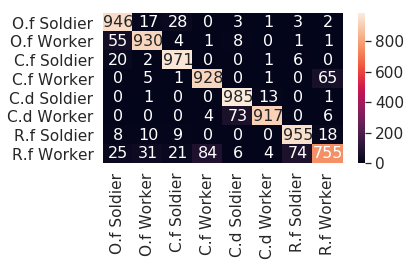

runtime :  23329.69888806343

[100] accuracy: 0.925 loss: 37.209

[0.815, 0.85625, 0.88175, 0.886375, 0.89325, 0.899125, 0.902, 0.905, 0.90625, 0.907875, 0.90575, 0.910125, 0.909375, 0.911, 0.90925, 0.907875, 0.911125, 0.910125, 0.909875, 0.914375, 0.91475, 0.9135, 0.90975, 0.914125, 0.914375, 0.911875, 0.9165, 0.914875, 0.916125, 0.912875, 0.917875, 0.917875, 0.913875, 0.9195, 0.918375, 0.9205, 0.917875, 0.918625, 0.921375, 0.916125, 0.91625, 0.921, 0.916875, 0.92175, 0.92, 0.91725, 0.9175, 0.920125, 0.92, 0.920375, 0.922125, 0.922, 0.919125, 0.923625, 0.921125, 0.919125, 0.9205, 0.92075, 0.918375, 0.919125, 0.91775, 0.921375, 0.922625, 0.919375, 0.917375, 0.91975, 0.923875, 0.92325, 0.92025, 0.920875, 0.919375, 0.92225, 0.917625, 0.921875, 0.921875, 0.922, 0.924125, 0.921, 0.921625, 0.92225, 0.9225, 0.92325, 0.92125, 0.9195, 0.92325, 0.926375, 0.92675, 0.926875, 0.92475, 0.92275, 0.92125, 0.92375, 0.924375, 0.92325, 0.921, 0.924875, 0.92375, 0.921625, 0.923375, 0.92475]
[64.114142239

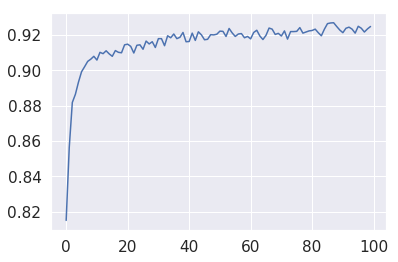

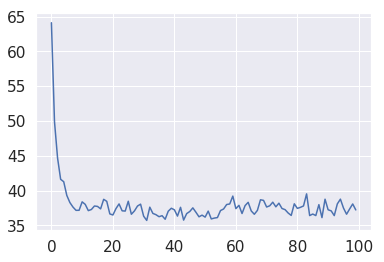

[4, 0, 6, 3, 7, 6, 0, 6, 6, 1, 1, 2, 1, 4, 3, 0, 7, 3, 7, 7, 0, 6, 0, 1, 0, 0, 7, 0, 5, 0, 3, 4, 0, 2, 7, 0, 5, 7, 3, 4, 4, 0, 0, 3, 0, 0, 3, 1, 2, 3, 1, 0, 6, 3, 0, 0, 6, 3, 4, 7, 3, 3, 7, 6, 0, 0, 3, 1, 6, 1, 3, 3, 0, 0, 3, 3, 1, 7, 0, 1, 6, 2, 0, 3, 0, 4, 6, 0, 4, 1, 7, 3, 3, 0, 7, 1, 7, 6, 6, 0, 1, 4, 3, 3, 0, 4, 6, 7, 4, 6, 0, 3, 6, 6, 2, 6, 7, 4, 5, 7, 4, 3, 4, 4, 4, 7, 1, 3, 6, 3, 3, 2, 6, 4, 7, 6, 3, 2, 0, 1, 5, 2, 4, 2, 2, 1, 3, 2, 4, 4, 4, 6, 0, 7, 7, 7, 4, 7, 4, 6, 3, 2, 6, 0, 3, 7, 7, 3, 4, 4, 3, 4, 3, 0, 1, 0, 4, 4, 0, 6, 6, 0, 0, 7, 6, 4, 4, 4, 1, 6, 6, 0, 6, 4, 3, 0, 2, 1, 3, 7, 1, 7, 5, 6, 5, 0, 3, 1, 5, 4, 5, 0, 4, 3, 2, 1, 4, 4, 7, 1, 4, 0, 4, 1, 6, 6, 2, 6, 4, 0, 4, 6, 2, 3, 5, 0, 7, 4, 6, 1, 5, 6, 4, 0, 3, 5, 4, 7, 4, 3, 0, 2, 4, 6, 1, 5, 6, 2, 0, 6, 4, 0, 0, 7, 1, 2, 0, 6, 0, 0, 1, 0, 6, 6, 0, 4, 3, 2, 7, 2, 0, 2, 7, 0, 4, 2, 6, 3, 0, 7, 0, 6, 5, 0, 4, 7, 2, 7, 2, 2, 7, 4, 3, 0, 3, 7, 6, 4, 4, 4, 0, 2, 7, 3, 3, 6, 3, 0, 1, 1, 0, 1, 1, 4, 4, 0, 6, 2, 1, 6, 4, 6, 4, 

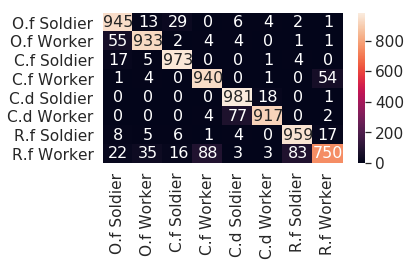

runtime :  23483.002194166183


In [36]:
import seaborn as sn
import pandas as pd
import matplotlib.pyplot as plt
test_acc = []
test_loss = []
import time
start = time.time()
# classes2 = ["O. formosanus Worker","C. formosanus Worker", "C. domesticus Worker", "R. flaviceps Worker"]
for model_num in range(1, EPOCH+1):
    wrong_images = []
    wrong_answer = []
    actual_answer = []
    weight_path = model_directory + "%03d_weights.pt" % (model_num)
    state_dict = torch.load(weight_path)
    model.load_state_dict(state_dict)
    running_loss = 0.0
    total = 0
    correct = 0
    confusion_matrix = torch.zeros(len(classes), len(classes))
    for step, (labels, images, paths) in enumerate(testloader):
        optimizer.zero_grad()
        images = images.detach().cuda()
        labels = labels.detach().cuda()
        outputs = model(images)
        _, predicted = torch.max(outputs.data, 1)
        # append to the wrong list (test log file)
        for i in range(len(predicted)):
            if predicted[i] != labels[i]:
#                 print(paths[i], predicted[i], labels[i])
                wrong_images.append(paths[i])
                wrong_answer.append(predicted[i].item())
                actual_answer.append(labels[i].item())
        loss = criterion(outputs, labels)
        running_loss += loss.item()
        total += labels.size(0)
        correct += (predicted == labels).sum().item()
        for t, p in zip(labels.view(-1), predicted.view(-1)):
#             print(t.item(), p.item())
#             mapp = { 1: 0,
#                     3: 1,
#                     5: 2,
#                     6: 3}
#             confusion_matrix[mapp[t.item()], mapp[p.item()]] += 1
            confusion_matrix[t.item(), p.item()] += 1
    
    running_acc = correct / total
    print('\n[%d] accuracy: %.3f loss: %.3f\n' % (model_num, running_acc, running_loss))
    
    test_acc.append(running_acc)
    test_loss.append(running_loss)
    print(test_acc)
    print(test_loss)
    plt.figure()
    plt.plot(range(0,model_num), test_acc)
    plt.savefig(temp_directory + "test_acc_E%03d.jpg" % (model_num), dpi=500)
    plt.show()
    plt.figure()
    plt.plot(range(0,model_num), test_loss)
    plt.savefig(temp_directory + "test_loss_E%03d.jpg" % (model_num), dpi=500)
    plt.show()
    
    
    print(wrong_answer)
    with open(temp_directory + "%03d_wrong.txt" % (model_num), 'w') as wrong:
#         c = zip(wrong_images, wrong_answer, actual_answer)
#         c = sorted(c)
#         (wrong_images, wrong_answer, actual_answer) = zip(*c)
#         print(wrong_images)
        for i in range(len(wrong_images)):
            wrong.write(wrong_images[i] + " " + classes[wrong_answer[i]] + " " + classes[actual_answer[i]])
#             print(wrong_images[i] + " " + classes[wrong_answer[i]] + " " + classes[actual_answer[i]])
            wrong.write("\n")
        wrong.close()
#     print(confusion_matrix)
    confusion_matrix = confusion_matrix.numpy().astype(int)
#     print(confusion_matrix)
    df_cm = pd.DataFrame(confusion_matrix, index = [i for i in classes],
                  columns = [i for i in classes])
    print(df_cm)
    sn.set(font_scale=1.4)#for label size
#     print(classes)
    img = sn.heatmap(df_cm, annot=True,annot_kws={"size": 16}, fmt="d")
    figure = img.get_figure()
    plt.tight_layout()
    plt.savefig(temp_directory + "confusion_matrix_%03d.jpg" % (model_num), dpi=500)
    plt.show()
    runtime = time.time() - start
    print("runtime : ", runtime)

In [37]:
print("runtime : ", runtime)
resultfile = open(model_directory+"test_results.txt", "a")
resultfile.write("test")
resultfile.write("\n")
resultfile.write(str(test_acc))
resultfile.write("\n")
resultfile.write(str(test_loss))
resultfile.write("\n")
resultfile.close()


runtime :  23483.002194166183
